# Atividade 03: Implementando uma Rede Neural Profunda

Nesta atividade, você irá treinar uma rede neural profunda para realizar classificação de imagens, e irá testá-la utilizando o dataset CIFAR-10.

Nesta atividade, você irá:

- testar implementação de **camada afim** (tranformação linear)
- testar implementação de **camada ReLU**
- testar implementação de camadas combinadas (Afim + ReLU)  
- testar duas **funções de perda** (**loss functions**): *SVM (hinge) loss* e *Softmax loss*
- testar a implementação modular de uma rede de duas camadas: `TwoLayerNet`
- testar a implementação modular de um classe para treinamento: `Solver`
- **treinar** o modelo de rede de duas camadas `TwoLayerNet` utilizando a classe `Solver` e visualizar os resultados de perda e acurácia do treinamento
- testar implementação de **batch normalization**
- testar implementação de **dropout**
- testar a implementação modular de uma rede profunda (de múltiplas camadas): `FullyConnectedNet`
- **treinar** o modelo de rede profunda `FullyConnectedNet` utilizando a classe `Solver` e diferentes regras de atualização
- **explorar o impacto** de *batch normalization* no treinamento de um modelo de rede profunda
- **explorar o impacto** de *dropout* no treinamento de um modelo de rede profunda


## Abordagem modular

Na atividade anterior, você treinou e testou uma rede neural de duas camadas completamente conectadas sobre a base de dados CIFAR-10. A implementação era simples porém não era modular, visto que a perda e o gradiente foram calculados em uma única função `monolítica`. Isto é viável para uma rede simples de duas camadas, mas seria impraticável na medida que os modelos se tornem maiores. A forma ideal seria construir redes por meio de um projeto mais modular em que fosse possível implementar diferentes tipos de camadas de modo isolado e então combiná-las em novos modelos com diferentes arquiteturas.

Nessa atividade, você irá construir redes completamente conectadas usando uma abordagem mais modular. Para cada camada, você irá utilizar uma função denominada `forward` e outra `backward`. A função `forward` irá receber as entradas, pesos e demais parâmetros e retornará, além da saída, um objeto `cache` contendo os dados necessários para realização do *backward pass*, como no seguinte exemplo:

```python
def layer_forward(x, w):
  """ Recebe entradas x e pesos w """
  # Realiza alguns cálculos ...
  z = # ... produz alguns resultados intermediários
  # Realiza mais alguns cálculos ...
  out = # gera a saída
   
  cache = (x, w, z, out) # Guarda valores necessários para o cálculo de gradientes
   
  return out, cache
```

O *backward pass* irá receber como entrada as derivadas *upstream* e o objeto `cache` e irá retornar os gradientes em relação as entradas e pesos, como no seguinte exemplo:

```python
def layer_backward(dout, cache):
  """
  Recebe derivada da perda em relação às saídas e o objeto cache
  e calcula as derivadas em relação às entradas.
  """
  # Recupera valores guardados a partir do objeto cache
  x, w, z, out = cache
  
  # Usa valores para cálculo das derivadas
  dx = # Derivadas da perda em relação a x
  dw = # Derivadas da perda em relação a w
  
  return dx, dw
```

Depois de analisar e testar a implementação de uma série de camadas dessa forma, você será capaz de facilmente combiná-las para construir modelos com diferentes arquiteturas.

Além de treinar e testar redes completamente conectadas com profundidade arbitrária, você irá também explorar diferentes regras de atualização para otimização, além de utilizar *Dropout* como técnica para regularização e *Batch normalization* como ferramenta para tornar mais eficiente a otimização de redes profundas.
  

## Preparação para usar o *Colaboratory*

Caso você deseje usar o *Colaborabory*, execute os comandos da célula a seguir para conseguir acessar os arquivos em uma conta do **Google Drive**.


In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


Além disso, você talvez deseje trabalhar um subdiretório (ou pasta) específico, por exemplo `Pratica3`.  Esse diretório (ou pasta) já deve ter sido criado e conter o ***notebook*** dessa prática.

Sendo assim, utilize as instruções na próxima célula para alterar o diretório corrente para esse subdiretório (alterando o nome do subdiretório, se for o caso).

In [ ]:
import os
os.chdir("/content/")

## Código de inicialização e configuração básica

Execute a célula a seguir para garantir a importação de alguns recursos básicos, bem como a inicialização/configuração para exibição correta de gráficos.

In [ ]:
# Executa algum código de inicialização desse notebook.

from __future__ import print_function
import time
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # fixa tamanho default para as plotagens
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

%load_ext autoreload
%autoreload 2

def rel_error(x, y):
  """ returna erro relativo """
  return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

## Obtendo o conjunto de dados CIFAR-10

Nesta atividade, você irá desenvolver uma rede neural para realizar classificação de imagens e irá testá-la utilizando o dataset CIFAR-10.

Para tando, você deve obter as imagens dessa base de dados executando a célula a seguir.

**OBS: Você só precisar realizar esta etapa uma vez!** Caso você já a tenha feito anteriormente e está retornando para continuar a execução dessa prática, não será necessário que se faça a recuperação das imagens novamente. Para verificar se os dados da base estão disponíveis, basta checar a existência do subdiretório `cifar-10-batches-py` no diretório corrente.

In [ ]:
!wget http://www.cs.toronto.edu/~kriz/cifar-10-python.tar.gz
!tar -xzvf cifar-10-python.tar.gz
!rm cifar-10-python.tar.gz

--2023-09-05 01:24:07--  http://www.cs.toronto.edu/~kriz/cifar-10-python.tar.gz
Resolving www.cs.toronto.edu (www.cs.toronto.edu)... 128.100.3.30
Connecting to www.cs.toronto.edu (www.cs.toronto.edu)|128.100.3.30|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 170498071 (163M) [application/x-gzip]
Saving to: ‘cifar-10-python.tar.gz’

cifar-10-python.tar 100%[===================>] 162.60M  83.6MB/s    in 1.9s    

2023-09-05 01:24:09 (83.6 MB/s) - ‘cifar-10-python.tar.gz’ saved [170498071/170498071]

cifar-10-batches-py/
cifar-10-batches-py/data_batch_4
cifar-10-batches-py/readme.html
cifar-10-batches-py/test_batch
cifar-10-batches-py/data_batch_3
cifar-10-batches-py/batches.meta
cifar-10-batches-py/data_batch_2
cifar-10-batches-py/data_batch_5
cifar-10-batches-py/data_batch_1


Execute o código da célula abaixo para se realizar o carregamento dos dados a partir dos arquivos armazenados no diretório `cifar-10-batches-py`.

**OBS: Isso sempre deve ser feito a cada nova inicialização desse *notebook*.**

In [ ]:
# Carrega os dados brutos da base CIFAR-10.
# Para tanto, você deve ter feito o download de http://www.cs.toronto.edu/~kriz/cifar-10-python.tar.gz
# e descompactado no diretório 'cifar-10-batches-py'

from __future__ import print_function

from builtins import range
from six.moves import cPickle as pickle
import numpy as np
import os
import platform

def load_pickle(f):
    version = platform.python_version_tuple()
    if version[0] == '2':
        return  pickle.load(f)
    elif version[0] == '3':
        return  pickle.load(f, encoding='latin1')
    raise ValueError("invalid python version: {}".format(version))

def load_CIFAR_batch(filename):
    """ carrega um unico lote do dataset cifar """
    with open(filename, 'rb') as f:
        datadict = load_pickle(f)
        X = datadict['data']
        Y = datadict['labels']
        X = X.reshape(10000, 3, 32, 32).transpose(0,2,3,1).astype("float")
        Y = np.array(Y)
        return X, Y

def load_CIFAR10(ROOT):
    """ carrega todo o dataset cifar """
    xs = []
    ys = []
    for b in range(1,6):
        f = os.path.join(ROOT, 'data_batch_%d' % (b, ))
        X, Y = load_CIFAR_batch(f)
        xs.append(X)
        ys.append(Y)
    Xtr = np.concatenate(xs)
    Ytr = np.concatenate(ys)
    del X, Y
    Xte, Yte = load_CIFAR_batch(os.path.join(ROOT, 'test_batch'))
    return Xtr, Ytr, Xte, Yte


def get_CIFAR10_data(num_training=49000, num_validation=1000, num_test=1000,
                     subtract_mean=True):
    """
    Carrega o dataset CIFAR-10 a partir do disco e realiza pré-processamento para prepará-lo
    para uso com classificadores.
    """
    # Carrega dados brutos do dataset CIFAR-10
    cifar10_dir = 'cifar-10-batches-py'
    X_train, y_train, X_test, y_test = load_CIFAR10(cifar10_dir)

    # Subamostragem de dados
    mask = list(range(num_training, num_training + num_validation))
    X_val = X_train[mask]
    y_val = y_train[mask]
    mask = list(range(num_training))
    X_train = X_train[mask]
    y_train = y_train[mask]
    mask = list(range(num_test))
    X_test = X_test[mask]
    y_test = y_test[mask]

    # Normalização de dados: subtração de imagem media
    if subtract_mean:
        mean_image = np.mean(X_train, axis=0)
        X_train -= mean_image
        X_val -= mean_image
        X_test -= mean_image

    # Transposição de modo que canais venham primeiro
    X_train = X_train.transpose(0, 3, 1, 2).copy()
    X_val = X_val.transpose(0, 3, 1, 2).copy()
    X_test = X_test.transpose(0, 3, 1, 2).copy()

    # Empacota dados em um dicionario
    return {
      'X_train': X_train, 'y_train': y_train,
      'X_val': X_val, 'y_val': y_val,
      'X_test': X_test, 'y_test': y_test,
    }

data = get_CIFAR10_data()
for k, v in list(data.items()):
  print(('%s: ' % k, v.shape))

('X_train: ', (49000, 3, 32, 32))
('y_train: ', (49000,))
('X_val: ', (1000, 3, 32, 32))
('y_val: ', (1000,))
('X_test: ', (1000, 3, 32, 32))
('y_test: ', (1000,))


# Camada Afim: *foward pass*

Uma camada afim (ou polinomial do primeiro grau) realiza uma transformações lineares seguidas de  translações, isto é, $\mathbb{x}\; \mathbb{w} + \mathbb{b}$.

Analise a implementação da função `affine_forward` na célula a seguir.


In [ ]:
def affine_forward(x, w, b):
    """
    Computa o forward pass para uma camada afim.

    A entrada x possui dimensoes (N, d_1, ..., d_k) e comtem um minibatch de N
    amostras, em que cada amostra x[i] possui dimensoes (d_1, ..., d_k).
    Cada entrada será redimensionada em um vetor de dimensão D = d_1 * ... * d_k, e
    então este será transformado no vetor de saida de dimensão M.

    Entradas:
    - x: Um vetor numpy contendo dados de entrada, com dimensoes (N, d_1, ..., d_k)
    - w: Um vetor numpy de pesoes, com dimensoes (D, M)
    - b: Um vetor numpy de termos independentes (vieses), dimensão (M,)

    Retorna:
    - out: saida, com dimensoes (N, M)
    - cache: (x, w, b)
    """

    ###########################################################################
    xaux = np.reshape(x, (x.shape[0], -1)) # Faz o reshape da camada x
    out = xaux.dot(w) + b # Faz a multiplicação dos valores de x pelos valores
                          # dos pesos e soma o termo independente
    ###########################################################################

    cache = (x, w, b) # Armazena os valores de x, w e b no cache
    return out, cache
    # Retorna os valores de entrada após a operação
    # Retorna os valores de s, w e b do cache


Em seguida, você pode testar essa implementação utilizando o trecho de código abaixo (lembre-se de executar a célula anterior para que a função seja definida):

In [ ]:
num_inputs = 2 # numero de entradas
input_shape = (4, 5, 6)
output_dim = 3 # vetor de saída de dimensão 3

input_size = num_inputs * np.prod(input_shape)
weight_size = output_dim * np.prod(input_shape)
print(input_size)
print(weight_size)

240
360


In [ ]:
x = np.linspace(-0.1, 0.5, num=input_size)
x.reshape(num_inputs, *input_shape)

array([[[[-1.00000000e-01, -9.74895397e-02, -9.49790795e-02,
          -9.24686192e-02, -8.99581590e-02, -8.74476987e-02],
         [-8.49372385e-02, -8.24267782e-02, -7.99163180e-02,
          -7.74058577e-02, -7.48953975e-02, -7.23849372e-02],
         [-6.98744770e-02, -6.73640167e-02, -6.48535565e-02,
          -6.23430962e-02, -5.98326360e-02, -5.73221757e-02],
         [-5.48117155e-02, -5.23012552e-02, -4.97907950e-02,
          -4.72803347e-02, -4.47698745e-02, -4.22594142e-02],
         [-3.97489540e-02, -3.72384937e-02, -3.47280335e-02,
          -3.22175732e-02, -2.97071130e-02, -2.71966527e-02]],

        [[-2.46861925e-02, -2.21757322e-02, -1.96652720e-02,
          -1.71548117e-02, -1.46443515e-02, -1.21338912e-02],
         [-9.62343096e-03, -7.11297071e-03, -4.60251046e-03,
          -2.09205021e-03,  4.18410042e-04,  2.92887029e-03],
         [ 5.43933054e-03,  7.94979079e-03,  1.04602510e-02,
           1.29707113e-02,  1.54811715e-02,  1.79916318e-02],
         [ 2.0

In [ ]:
x = np.linspace(-0.1, 0.5, num=input_size).reshape(num_inputs, *input_shape) # determinação dos valores iniciais dos dados de entrada da rede
w = np.linspace(-0.2, 0.3, num=weight_size).reshape(np.prod(input_shape), output_dim) # determinação dos pesos
b = np.linspace(-0.3, 0.1, num=output_dim) # determinação dos termos independentes
print(x)
print(w)
print(b)

NameError: ignored

In [ ]:
# Teste para a função affine_forward

num_inputs = 2 # numero de entradas
input_shape = (4, 5, 6)
output_dim = 3 # vetor de saída de dimensão 3

input_size = num_inputs * np.prod(input_shape)
weight_size = output_dim * np.prod(input_shape)

x = np.linspace(-0.1, 0.5, num=input_size).reshape(num_inputs, *input_shape) # determinação dos valores iniciais dos dados de entrada da rede
w = np.linspace(-0.2, 0.3, num=weight_size).reshape(np.prod(input_shape), output_dim) # determinação dos pesos
b = np.linspace(-0.3, 0.1, num=output_dim) # determinação dos termos independentes

out, _ = affine_forward(x, w, b) # out saida da rede
correct_out = np.array([[ 1.49834967,  1.70660132,  1.91485297],
                        [ 3.25553199,  3.5141327,   3.77273342]]) #saídas correetas

# Compare seu resultado com o resultado correto que foi fornecido.
# O erro deve estar em cerca de 1e-9.
print('Testando a funcao affine_forward: ')
print('Diferença: ', rel_error(out, correct_out))

Testando a funcao affine_forward: 
Diferença:  9.769849468192957e-10


# Camada Afim: *backward pass*

Agora, analise a implementação da função `affine_backward` na célula a seguir.

In [ ]:
def affine_backward(dout, cache):
    """
    Computa o backward pass para a camada afim.

    Entradas:
    - dout: Derivada "upstream", com dimensoes (N, M)
    - cache: (x, w, b):
      - x: Dados de entrada, com dimensoes (N, d_1, ... d_k)
      - w: Pesos, com dimensoes (D, M)
      - b: Termos independentes, com dimensao (M,)

    Retorna:
    - dx: Gradiente em relacao a x, com dimesoes (N, d1, ..., d_k)
    - dw: Gradiente em relacao a w, com dimesoes (D, M)
    - db: Gradiente em relacao a b, com dimesao (M,)
    """
    x, w, b = cache # retoma os valores de x, w e b do cache da affine_foward


    ###########################################################################
    #################### Calculo das derivadas ################################

    dx = np.dot(dout, w.T).reshape(x.shape) # calculo das derivadas x
    dw = np.dot(x.reshape(x.shape[0], -1).T, dout) # calculo das derivadas w
    db = np.sum(dout, axis=0) # calculo das derivadas b

    ###########################################################################

    return dx, dw, db # Retorna os valores das derivadas


Em seguida, você pode testar essa implementação utilizando o trecho de código abaixo que faz verificação numérica do gradiente (lembre-se de executar a célula anterior para que a função seja definida):

In [ ]:
from __future__ import print_function
from builtins import range
from past.builtins import xrange

import numpy as np
from random import randrange

def eval_numerical_gradient(f, x, verbose=True, h=0.00001):
    """
    Uma implementacao simples de gradiente numérico de f em x
    - f deve ser uma funcao que recebe um unico argumento
    - x é um ponto (vetor numpy) onde sera avaliado o gradiente
    """

    fx = f(x) # avalia a funcao no ponto original (função lambda)
    grad = np.zeros_like(x)
    # realizar iteracoes sobre todos os indices/dimensoes de x
    it = np.nditer(x, flags=['multi_index'], op_flags=['readwrite'])
    while not it.finished:

        # avalia a funcao em x+h
        ix = it.multi_index
        oldval = x[ix]
        x[ix] = oldval + h # incrementa de h
        fxph = f(x) # avalia f(x + h)
        x[ix] = oldval - h
        fxmh = f(x) # avalia f(x - h)
        x[ix] = oldval # restaura

        # computa a derivada parcial por meio de diferenca central
        grad[ix] = (fxph - fxmh) / (2 * h)
        if verbose:
            print(ix, grad[ix])
        it.iternext() # passa para a proxima dimensao

    return grad


def eval_numerical_gradient_array(f, x, df, h=1e-5):
    """
    Avalia um gradiente numerico para uma funcao que aceita um vetor numpy
    como parametro e retorna um vetor numpy.
    """
    grad = np.zeros_like(x)
    it = np.nditer(x, flags=['multi_index'], op_flags=['readwrite'])
    while not it.finished:
        ix = it.multi_index

        oldval = x[ix]
        x[ix] = oldval + h
        pos = f(x).copy()
        x[ix] = oldval - h
        neg = f(x).copy()
        x[ix] = oldval

        grad[ix] = np.sum((pos - neg) * df) / (2 * h)
        it.iternext()
    return grad

# Teste para a função affine_backward
np.random.seed(231)
x = np.random.randn(10, 2, 3)
w = np.random.randn(6, 5)
b = np.random.randn(5)
dout = np.random.randn(10, 5) # definição de valores randomicos para as derivadas

dx_num = eval_numerical_gradient_array(lambda x: affine_forward(x, w, b)[0], x, dout)
dw_num = eval_numerical_gradient_array(lambda w: affine_forward(x, w, b)[0], w, dout)
db_num = eval_numerical_gradient_array(lambda b: affine_forward(x, w, b)[0], b, dout)

_, cache = affine_forward(x, w, b)
dx, dw, db = affine_backward(dout, cache)

# Os erros devem estar em torno de 1e-10
print('Testando a funcao affine_backward:')
print('Erro em dx: ', rel_error(dx_num, dx))
print('Erro em dw: ', rel_error(dw_num, dw))
print('Erro em db: ', rel_error(db_num, db))

Testando a funcao affine_backward:
Erro em dx:  5.399100368651805e-11
Erro em dw:  9.904211865398145e-11
Erro em db:  2.4122867568119087e-11


# Camada ReLU: *forward pass*

Uma camada ReLU utiliza de unidades lineares rectificadas para produzir suas saídas, isto é, $\max\{0, \mathbb{x}\}$.

Analise a implementação da função de ativação (*forward pass*) para camada ReLU codificada pela função  `relu_forward` na célula a seguir.

In [ ]:
def relu_forward(x):
    """
    Computa o forward pass para uma camada de unidades lineares retificadas (ReLUs).

    Entrada:
    - x: Dados de entrada, qualquer dimensionalidade

    Returna:
    - out: Saida, com a mesma dimensionalidade de x
    - cache: x
    """
    # Aplicação da função ReLU
    ###########################################################################
    out = np.maximum(0,x) # Saída entre 0 ou o Máximo do valor (valor)
    ###########################################################################

    cache = x # Armazena o valor final da função relu no Cache
    return out, cache


Em seguida, você pode testar essa implementação utilizando o trecho de código abaixo (lembre-se de executar a célula anterior para que a função seja definida):

In [ ]:
x = np.linspace(-0.5, 0.5, num=12)
x.reshape(3, 4)

array([[-0.5       , -0.40909091, -0.31818182, -0.22727273],
       [-0.13636364, -0.04545455,  0.04545455,  0.13636364],
       [ 0.22727273,  0.31818182,  0.40909091,  0.5       ]])

In [ ]:
# Teste para a função relu_forward

x = np.linspace(-0.5, 0.5, num=12).reshape(3, 4)

out, _ = relu_forward(x)
correct_out = np.array([[ 0.,          0.,          0.,          0.,        ],
                        [ 0.,          0.,          0.04545455,  0.13636364,],
                        [ 0.22727273,  0.31818182,  0.40909091,  0.5,       ]])

# Compare seu resultado com o resultado correto que foi fornecido.
# O erro deve estar em cerca de 5e-8.
print('Testando a funcao relu_forward:')
print('Diferença: ', rel_error(out, correct_out))

Testando a funcao relu_forward:
Diferença:  4.999999798022158e-08


# Camada ReLU: *backward pass*

Agora, analise a implementação da função `relu_backward` na célula a seguir.


In [ ]:
def relu_backward(dout, cache):
    """
    Computa o backward pass para uma camada de unidades lineares retificadas (ReLUs).

    Entradas:
    - dout: Derivada "upstream", de qualquer dimensionalidade
    - cache: Entrada x, com a mesma dimensionalidade que  dout

    Returna:
    - dx: Gradiente em relacao a x
    """
    dx, x = None, cache
    # x recebe valor de cache (próprio valor de x)
    # dx inicializado em None
    ###########################################################################
    dx = np.array(dout, copy=True) # se x > 0
    dx[x <= 0] = 0 # se x = 0
    ###########################################################################

    return dx


Em seguida, você pode testar essa implementação utilizando o trecho de código abaixo que faz verificação numérica do gradiente (lembre-se de executar a célula anterior para que a função seja definida):

In [ ]:
# Teste para a função relu_backward
np.random.seed(231)
x = np.random.randn(10, 10)
dout = np.random.randn(*x.shape)

dx_num = eval_numerical_gradient_array(lambda x: relu_forward(x)[0], x, dout)

_, cache = relu_forward(x)
dx = relu_backward(dout, cache)

# O erro deve estar em torno de 3e-12
print('Testando a funcao relu_backward:')
print('Erro em dx: ', rel_error(dx_num, dx))

Testando a funcao relu_backward:
Erro em dx:  3.2756349136310288e-12


# "Sandwich" de Camadas


Existem alguns padrões de combinação de camadas que são frequentemente usados na construção de redes neurais. Por exemplo, camadas afins são frequentemente seguidas por uma não-linearidade fornecida por uma camada ReLU.

Nesse momento, você deve examinar as funções `affine_relu_forward` e `affine_relu_backward` na célula a seguir.

In [ ]:
def affine_relu_forward(x, w, b):
    """
    Calcula o forward pass para a camada combinada que realiza uma transformacao afim seguida de ReLU

    Entradas:
    - x: Dados de entrada para a camada afim
    - w, b: Pesos/vieses para a camada afim

    Returna:
    - out: Saida final depois da camada ReLU
    - cache: Informacao necessaria para realizar o backward pass
    """
    a, fc_cache = affine_forward(x, w, b) # Recebe a saída out e o cache da camada affine_forward
    out, relu_cache = relu_forward(a) # Recebe a saída out e o cache da camada affine_ReLU
    cache = (fc_cache, relu_cache) # O cache deve combinar o cache da affine_forward(fc_cache) e da camada ReLU (relu_cache)
    return out, cache


def affine_relu_backward(dout, cache):
    """
    Calcula o backward pass para a camada combinada que realiza uma transformacao afim seguida de ReLU
    """
    ## Fazer os calculos das derivadas em ordem reversa  relu --> affine
    fc_cache, relu_cache = cache # recupera os valores das caches da camada affine e ReLU
    da = relu_backward(dout, relu_cache) # calcula a derivada upstream da camada relu
    dx, dw, db = affine_backward(da, fc_cache) # Calcula os valores resultantes das derivadas para x, w e b
    return dx, dw, db


Agora, execute o seguinte código para realizar a verificação numérica do gradiente obtido pelo *backward pass* (lembre-se de executar a célula anterior para que as funções sejam definidas).

In [ ]:
np.random.seed(231)
x = np.random.randn(2, 3, 4)
w = np.random.randn(12, 10)
b = np.random.randn(10)
dout = np.random.randn(2, 10)
print(f'\n ---------------------------------------------------\n X: {x} \n x_shape: {x.shape} \n ---------------------------------------------------')
print(f'\n ---------------------------------------------------\n W: {w} \n w_shape: {w.shape}  \n ---------------------------------------------------')
print(f'\n ---------------------------------------------------\n b: {b} \n b_shape: {b.shape} \n ---------------------------------------------------')
print(f'\n ---------------------------------------------------\n dout: {dout} \n dout_shape: {dout.shape} \n ---------------------------------------------------')


 ---------------------------------------------------
 X: [[[ 0.41794341  1.39710028 -1.78590431 -0.70882773]
  [-0.07472532 -0.77501677 -0.1497979   1.86172902]
  [-1.4255293  -0.3763567  -0.34227539  0.29490764]]

 [[-0.83732373  0.95218767  1.32931659  0.52465245]
  [-0.14809998  0.88953195  0.12444653  0.99109251]
  [ 0.03514666  0.26207083  0.14320173  0.90101716]]] 
 x_shape: (2, 3, 4) 
 ---------------------------------------------------

 ---------------------------------------------------
 W: [[ 0.23185863 -0.79725793  0.12001014 -0.65679608  0.26917456  0.333667
   0.27423503  0.76215717 -0.69550058  0.29214712]
 [-0.38489942  0.1228747  -1.42904497  0.70286283 -0.85850947 -1.14042979
  -1.58535997 -0.01530138 -0.32156083  0.56834936]
 [-0.19961722  1.27286625  1.27292534  1.58102968 -1.75626715  0.9217743
  -0.6753054  -1.43443616  0.47021125  0.03196734]
 [ 0.04448574  0.47824879 -2.51335181 -1.15740245 -0.70470413 -1.04978879
  -1.90795589  0.49258765  0.83736166 -1.428813

In [ ]:
# Teste para as funções affine_relu_forward e affine_relu_backward

np.random.seed(231)
x = np.random.randn(2, 3, 4)
w = np.random.randn(12, 10)
b = np.random.randn(10)
dout = np.random.randn(2, 10)

out, cache = affine_relu_forward(x, w, b)
dx, dw, db = affine_relu_backward(dout, cache)

dx_num = eval_numerical_gradient_array(lambda x: affine_relu_forward(x, w, b)[0], x, dout)
dw_num = eval_numerical_gradient_array(lambda w: affine_relu_forward(x, w, b)[0], w, dout)
db_num = eval_numerical_gradient_array(lambda b: affine_relu_forward(x, w, b)[0], b, dout)

print('Testando as funcoes affine_relu_forward e affine_relu_backward:')
print('Erro em dx: ', rel_error(dx_num, dx))
print('Erro em dw: ', rel_error(dw_num, dw))
print('Erro em db: ', rel_error(db_num, db))

Testando as funcoes affine_relu_forward e affine_relu_backward:
Erro em dx:  2.299579177309368e-11
Erro em dw:  8.162011105764925e-11
Erro em db:  7.826724021458994e-12


# Camadas de Perda: Softmax e SVM

Você deve ainda entender como as funções de perda `softmax` e `svm` (ou `hinge`) funcionam e, para tanto, sugiro que você deve verificar as implementações fornecidas para cada uma delas na célula a seguir.


In [ ]:
def svm_loss(x, y):
    """
    Computa a perda e o gradiente usando a perda por articulacao (hinge loss ou SVM loss).

    Entradas:
    - x: Dados de entrada, dimensoes (N, C) em que x[i, j] representa o score para
      a i-esima entrada em relacao a j-esima classe .
    - y: Vetor de rotulos, dimensao (N,) em que y[i] representa o rotulo para x[i] e
      0 <= y[i] < C

    Returna:
    - loss: Escalar representado o valor da perda
    - dx: Gradiente da perda em relacao a x
    """
    N = x.shape[0]
    correct_class_scores = x[np.arange(N), y] # Calculo do score da classe correta
    margins = np.maximum(0, x - correct_class_scores[:, np.newaxis] + 1.0) # Calculo da margem -> calculo do score das classes incorretas - a classe correta +1
    margins[np.arange(N), y] = 0 # atribui 0 a margem da classe correta
    loss = np.sum(margins) / N # perda = média da margem das amostras
    num_pos = np.sum(margins > 0, axis=1) # considera as margens > 0
    dx = np.zeros_like(x) # calcula a derivada
    dx[margins > 0] = 1
    dx[np.arange(N), y] -= num_pos
    dx /= N
    return loss, dx # retorna-se a perda e a derivada da perda em relação aos scores


def softmax_loss(x, y):
    """
    Computa a perda e o gradiente usando a perda softmax.

    Entradas:
    - x: Dados de entrada, dimensoes (N, C) em que x[i, j] representa o score para
      a i-esima entrada em relacao a j-esima classe .
    - y: Vetor de rotulos, dimensao (N,) em que y[i] representa o rotulo para x[i] e
      0 <= y[i] < C

    Returna:
    - loss: Escalar representado o valor da perda
    - dx: Gradiente da perda em relacao a x
    """
    shifted_logits = x - np.max(x, axis=1, keepdims=True) # subtrai o máximo dos valores de score -> evitar explosão do gradiente
    Z = np.sum(np.exp(shifted_logits), axis=1, keepdims=True) #
    log_probs = shifted_logits - np.log(Z)
    probs = np.exp(log_probs)
    N = x.shape[0]
    loss = -np.sum(log_probs[np.arange(N), y]) / N # Calcula a perda
    dx = probs.copy()
    dx[np.arange(N), y] -= 1
    dx /= N # calculo da derivada
    return loss, dx # retorna os valores de perda e das derivadas


Você pode se assegurar de que essas implementações estão corretas utilizando o seguinte código para teste (lembre-se de executar a célula anterior para que as funções sejam definidas).

In [ ]:
np.random.seed(231)
num_classes, num_inputs = 10, 50
x = 0.001 * np.random.randn(num_inputs, num_classes)
y = np.random.randint(num_classes, size=num_inputs)

dx_num = eval_numerical_gradient(lambda x: svm_loss(x, y)[0], x, verbose=False)
loss, dx = svm_loss(x, y)

# Teste da função svm_loss. A perda (loss) deve estar em cerda de 9 e 'dx error' em torno de 1e-9
print('Testando a funcao svm_loss:')
print('Perda: ', loss)
print('Erro em dx: ', rel_error(dx_num, dx))

dx_num = eval_numerical_gradient(lambda x: softmax_loss(x, y)[0], x, verbose=False)
loss, dx = softmax_loss(x, y)

# Teste da função softmax_loss. A perda (loss) deve estar em cerda de 2.3 e 'dx error' em torno
# de 1e-8
print('\nTestando a fucao softmax_loss:')
print('Perda: ', loss)
print('Erro em dx: ', rel_error(dx_num, dx))

Testando a funcao svm_loss:
Perda:  8.999602749096233
Erro em dx:  1.4021566006651672e-09

Testando a fucao softmax_loss:
Perda:  2.302545844500738
Erro em dx:  9.384673161989355e-09


# Rede de Duas Camadas

Na atividade anterior, você treinou uma rede neural de duas camadas que foi implementada como uma única classe monolítica.

Agora que você já estudou as implementações de versões modulares das camadas necessárias, pode-se reimplementar a rede de duas camadas utilizando tais implementações modulares.

Examina na célula a seguir a implementação da classe `TwoLayerNet`.

Essa classe irá servir como modelo básico para outras redes que você implementará nesta atividade, portanto, leia e estude atentamente o código fornecido para garantir seu entendimento da API.


In [ ]:
class TwoLayerNet(object):
    """
    A two-layer fully-connected neural network with ReLU nonlinearity and
    softmax loss that uses a modular layer design. We assume an input dimension
    of D, a hidden dimension of H, and perform classification over C classes.

    The architecure should be affine - relu - affine - softmax.

    Note that this class does not implement gradient descent; instead, it
    will interact with a separate Solver object that is responsible for running
    optimization.

    The learnable parameters of the model are stored in the dictionary
    self.params that maps parameter names to numpy arrays.
    """

    def __init__(self, input_dim=3*32*32, hidden_dim=100, num_classes=10,
                 weight_scale=1e-3, reg=0.0):
        """
        Initialize a new network.

        Inputs:
        - input_dim: An integer giving the size of the input
        - hidden_dim: An integer giving the size of the hidden layer
        - num_classes: An integer giving the number of classes to classify
        - dropout: Scalar between 0 and 1 giving dropout strength.
        - weight_scale: Scalar giving the standard deviation for random
          initialization of the weights.
        - reg: Scalar giving L2 regularization strength.
        """
        self.params = {}
        self.reg = reg

        ############################################################################

        self.D = input_dim
        self.M = hidden_dim
        self.C = num_classes
        self.reg = reg

        w1 = weight_scale * np.random.randn(self.D, self.M)
        b1 = np.zeros(hidden_dim)
        w2 = weight_scale * np.random.randn(self.M, self.C)
        b2 = np.zeros(self.C)


        self.params.update({'W1': w1,
                            'W2': w2,
                            'b1': b1,
                            'b2': b2})

        ############################################################################


    def loss(self, X, y=None):
        """
        Compute loss and gradient for a minibatch of data.

        Inputs:
        - X: Array of input data of shape (N, d_1, ..., d_k)
        - y: Array of labels, of shape (N,). y[i] gives the label for X[i].

        Returns:
        If y is None, then run a test-time forward pass of the model and return:
        - scores: Array of shape (N, C) giving classification scores, where
          scores[i, c] is the classification score for X[i] and class c.

        If y is not None, then run a training-time forward and backward pass and
        return a tuple of:
        - loss: Scalar value giving the loss
        - grads: Dictionary with the same keys as self.params, mapping parameter
          names to gradients of the loss with respect to those parameters.
        """
        scores = None
        ############################################################################

        W1, b1, W2, b2 = self.params['W1'], self.params[
            'b1'], self.params['W2'], self.params['b2']

        X = X.reshape(X.shape[0], self.D)
        # Forward into first layer
        hidden_layer, cache_hidden_layer = affine_relu_forward(X, W1, b1)
        # Forward into second layer
        scores, cache_scores = affine_forward(hidden_layer, W2, b2)

        ############################################################################

        # If y is None then we are in test mode so just return scores
        if y is None:
            return scores

        loss, grads = 0, {}

        ############################################################################
        data_loss, dscores = softmax_loss(scores, y)
        reg_loss = 0.5 * self.reg * np.sum(W1**2) #regularização L2
        reg_loss += 0.5 * self.reg * np.sum(W2**2) # se acumula a perda de regularização
        loss = data_loss + reg_loss # perda dos dados + a perda de regularização
        # quanto maior for a força de regularização maior o peso de reularização em relação a perda dos dados a reg

        # Backpropagaton
        grads = {}
        # Backprop into second layer
        dx1, dW2, db2 = affine_backward(dscores, cache_scores) # backward da camada affine da segunda camada
        dW2 += self.reg * W2

        # Backprop into first layer
        dx, dW1, db1 = affine_relu_backward(
            dx1, cache_hidden_layer) # backward da função relu
        dW1 += self.reg * W1 #regularização

        grads.update({'W1': dW1, # faz a atualização dos pesos da rede
                      'b1': db1,
                      'W2': dW2,
                      'b2': db2})

        ############################################################################

        return loss, grads # retorna os valores da perda e dos pesos atualizados



Depois que você concluir seu estudo da implementação da classe `TwoLayerNet`, você poderá testá-la usando o seguinte código (lembre-se de executar a célula anterior para que a classe seja definida).

In [ ]:
np.random.seed(231)
N, D, H, C = 3, 5, 50, 7
X = np.random.randn(N, D)
y = np.random.randint(C, size=N)

std = 1e-3
model = TwoLayerNet(input_dim=D, hidden_dim=H, num_classes=C, weight_scale=std)

print('Testing initialization ... ')
W1_std = abs(model.params['W1'].std() - std)
b1 = model.params['b1']
W2_std = abs(model.params['W2'].std() - std)
b2 = model.params['b2']
assert W1_std < std / 10, 'First layer weights do not seem right'
assert np.all(b1 == 0), 'First layer biases do not seem right'
assert W2_std < std / 10, 'Second layer weights do not seem right'
assert np.all(b2 == 0), 'Second layer biases do not seem right'

print('Testing test-time forward pass ... ')
model.params['W1'] = np.linspace(-0.7, 0.3, num=D*H).reshape(D, H)
model.params['b1'] = np.linspace(-0.1, 0.9, num=H)
model.params['W2'] = np.linspace(-0.3, 0.4, num=H*C).reshape(H, C)
model.params['b2'] = np.linspace(-0.9, 0.1, num=C)
X = np.linspace(-5.5, 4.5, num=N*D).reshape(D, N).T
scores = model.loss(X)
correct_scores = np.asarray(
  [[11.53165108,  12.2917344,   13.05181771,  13.81190102,  14.57198434, 15.33206765,  16.09215096],
   [12.05769098,  12.74614105,  13.43459113,  14.1230412,   14.81149128, 15.49994135,  16.18839143],
   [12.58373087,  13.20054771,  13.81736455,  14.43418138,  15.05099822, 15.66781506,  16.2846319 ]])
scores_diff = np.abs(scores - correct_scores).sum()
assert scores_diff < 1e-6, 'Problem with test-time forward pass'

print('Testing training loss (no regularization)')
y = np.asarray([0, 5, 1])
loss, grads = model.loss(X, y)
correct_loss = 3.4702243556
assert abs(loss - correct_loss) < 1e-10, 'Problem with training-time loss'

model.reg = 1.0
loss, grads = model.loss(X, y)
correct_loss = 26.5948426952
assert abs(loss - correct_loss) < 1e-10, 'Problem with regularization loss'

for reg in [0.0, 0.7]:
  print('Running numeric gradient check with reg = ', reg)
  model.reg = reg
  loss, grads = model.loss(X, y)

  for name in sorted(grads):
    f = lambda _: model.loss(X, y)[0]
    grad_num = eval_numerical_gradient(f, model.params[name], verbose=False)
    print('%s relative error: %.2e' % (name, rel_error(grad_num, grads[name])))

Testing initialization ... 
Testing test-time forward pass ... 
Testing training loss (no regularization)
Running numeric gradient check with reg =  0.0
W1 relative error: 1.83e-08
W2 relative error: 3.12e-10
b1 relative error: 9.83e-09
b2 relative error: 4.33e-10
Running numeric gradient check with reg =  0.7
W1 relative error: 2.53e-07
W2 relative error: 7.98e-08
b1 relative error: 1.56e-08
b2 relative error: 7.76e-10


# Classe *Solver*

Nas atividades anteriores, a lógica para treinamento de modelos estava acoplada ao próprio modelo (e codificada junto com ele). Porém, agora, seguindo uma abordagem modular (que é mais comum na atualidade), para esta atividade a lógica de treinamento de modelos será colocada em uma classe denominada `Solver` e colocada de forma separada do modelo propriamente dito.

Agora, você deve ler e estudar atentamente o código da classe `Solver` (colocado na célula seguinte) para se familiarizar com a API.

Além disso, no início da próxima célula você irá encontrar implementações dos seguintes métodos para atualização de parâmetros: `sgd`, `sgd_momentum`, `rmsprop`, `adam` (que poderão ser utilizados em conjunto com a classe `Solver`).



In [ ]:
from __future__ import print_function, division
from future import standard_library
standard_library.install_aliases()
from builtins import range
from builtins import object
import os
import pickle as pickle

import numpy as np

class optim:

    def sgd(w, dw, config=None): # gradiente descendente  estocastico (SGD)
        """
        Performs vanilla stochastic gradient descent.
        w = pesos
        dw = derivada dos pesos
        * Os vetores de pesos e derivadas devem ter o mesmo ramanho

        config format:
        - learning_rate: Scalar learning rate.
        - O parâmetro config vai ser um dicionário com pequenos parametros ajustaveis para mudar o desempenho do metodo
          * no caso do SGD o parâmetro é apenas a Learning rate
          - caso config = None lr = 1e-2
        """
        if config is None: config = {}
        config.setdefault('learning_rate', 1e-2)

        w -= config['learning_rate'] * dw
        return w, config

    def sgd_momentum(w, dw, config=None): # Gradiente descendente estocástico acrescentado do momento
        """
        Performs stochastic gradient descent with momentum.

        config format:
        - learning_rate: Scalar learning rate.
        - momentum: Scalar between 0 and 1 giving the momentum value.
          Setting momentum = 0 reduces to sgd.
        - velocity: A numpy array of the same shape as w and dw used to store a
          moving average of the gradients.
        * valores default de lr = 1e-2 e momentum= 0.9
        """
        if config is None: config = {}
        config.setdefault('learning_rate', 1e-2)
        config.setdefault('momentum', 0.9)
        v = config.get('velocity', np.zeros_like(w))

        next_w = None
        ###########################################################################

        #calculo do vetor de velocidade em função do momentum * velocidade - learning rate * derivada dos pesos
        v = config['momentum'] * v - config['learning_rate'] * dw # integrate velocity

        next_w = w + v # Ajusta o valor dos pesos em função da velocidade calculada

        ###########################################################################
        config['velocity'] = v # adiciona o valor de velocidade atualizado no dicionario

        return next_w, config # retorna os pesos atualizados e o dicionario de parametros config

    def rmsprop(x, dx, config=None): # média móvel do quadrado² dos gradientes
        """
        Uses the RMSProp update rule, which uses a moving average of squared
        gradient values to set adaptive per-parameter learning rates.

        config format:
        - learning_rate: Scalar learning rate.
        - decay_rate: Scalar between 0 and 1 giving the decay rate for the squared
          gradient cache.
        - epsilon: Small scalar used for smoothing to avoid dividing by zero.
        - cache: Moving average of second moments of gradients.
        """
        if config is None: config = {}
        config.setdefault('learning_rate', 1e-2) # taxa de aprendizado
        config.setdefault('decay_rate', 0.99) # taxa de decaimento da média móvel dos quadrados dos gradientes
        config.setdefault('epsilon', 1e-8) # evitar divisão por 0
        config.setdefault('cache', np.zeros_like(x)) # cache vetor com as médias (valores das médias tem que ser atualizados de uma iteração para outra)

        next_x = None
        ###########################################################################

        cache, decay_rate, eps, learning_rate = config['cache'], config['decay_rate'], config['epsilon'], config['learning_rate'] # Recupera os valores do dicionario config
        cache = decay_rate * cache + (1 - decay_rate) * dx**2 # ajuste do vetor de média movel
        next_x = -learning_rate * dx / (np.sqrt(cache) + eps) + x # ajuste dos pesos com o gradiente
        config['cache'] = cache # cache armazenada no config

        ###########################################################################

        return next_x, config # retorna os pesos atualizados e o dicionario do config com os parâmetros

    def adam(x, dx, config=None): # ADAM -> combinação do método de momento quanto do método do rmsprops
                                  # Regra que incorpora médias móveis tanto para os gradientes quanto o quadrado dos gradientes
        """                       #
        Uses the Adam update rule, which incorporates moving averages of both the
        gradient and its square and a bias correction term.

        config format:
        - learning_rate: Scalar learning rate.
        - beta1: Decay rate for moving average of first moment of gradient.
        - beta2: Decay rate for moving average of second moment of gradient.
        - epsilon: Small scalar used for smoothing to avoid dividing by zero.
        - m: Moving average of gradient.
        - v: Moving average of squared gradient.
        - t: Iteration number.
        """
        if config is None: config = {}
        config.setdefault('learning_rate', 1e-3) # taxa de aprendizado
        config.setdefault('beta1', 0.9)  # fator de decaimento para o momentum
        config.setdefault('beta2', 0.999) # fator de decaimento para os quadrados dos gradientes
        config.setdefault('epsilon', 1e-8) # evitar divisão por 0
        config.setdefault('m', np.zeros_like(x)) # média movel dos gradientes
        config.setdefault('v', np.zeros_like(x)) # média movel dos quadrados dos gradientes
        config.setdefault('t', 1) # número da iteração

        next_x = None
        ###########################################################################

        learning_rate, beta1, beta2, eps, m, v, t \
            = config['learning_rate'], config['beta1'], config['beta2'], \
              config['epsilon'], config['m'], config['v'], config['t'] # recupera os valores do dicionário config

        t += 1 # aumenta o nº da iteração
        m = beta1 * m + (1 - beta1) * dx # média movel de gradiente
        v = beta2 * v + (1 - beta2) * (dx**2) # médiamovel de gradiente ao quadrado

        # bias correction:
        mb = m / (1 - beta1**t) # Correção da média movel de gradiente de acordo com a iteração --> > nº da iteração menor a correção dos valores
        vb = v / (1 - beta2**t) # Correção da média movel de gradiente ao quadrado de acordo com a iteração --> > nº da iteração menor a correção dos valores

        next_x = -learning_rate * mb / (np.sqrt(vb) + eps) + x
        ## ajuste dos pesos pela taxa de aprendizagem multiplicada por um valor de momento (mb -> média movel de gradiente ) e
        ## dividido por um valor da raiz quadrada da média movel de gradiente ao quadrado multiplicada por um epslon para n dividir por 0
        ## Isso tudo somado aos parâmetros x

        config['m'], config['v'], config['t'] = m, v, t # Atualiza os valores de:
        # média movel de gradiente (m) ,
        # média movel dos quadrados dos gradientes (v)
        # iteração(t)

        ###########################################################################

        return next_x, config # retorna os valores dos pesos e do dicionário de parâmtros config atualizados


class Solver(object):

    """
    A Solver encapsulates all the logic necessary for training classification
    models. The Solver performs stochastic gradient descent using different
    update rules defined in optim.py.

    The solver accepts both training and validataion data and labels so it can
    periodically check classification accuracy on both training and validation
    data to watch out for overfitting.

    To train a model, you will first construct a Solver instance, passing the
    model, dataset, and various optoins (learning rate, batch size, etc) to the
    constructor. You will then call the train() method to run the optimization
    procedure and train the model.

    After the train() method returns, model.params will contain the parameters
    that performed best on the validation set over the course of training.
    In addition, the instance variable solver.loss_history will contain a list
    of all losses encountered during training and the instance variables
    solver.train_acc_history and solver.val_acc_history will be lists of the
    accuracies of the model on the training and validation set at each epoch.

    Example usage might look something like this:

    data = {
      'X_train': # training data
      'y_train': # training labels
      'X_val': # validation data
      'y_val': # validation labels
    }
    model = MyAwesomeModel(hidden_size=100, reg=10)
    solver = Solver(model, data,
                    update_rule='sgd',
                    optim_config={
                      'learning_rate': 1e-3,
                    },
                    lr_decay=0.95,
                    num_epochs=10, batch_size=100,
                    print_every=100)
    solver.train()


    A Solver works on a model object that must conform to the following API:

    - model.params must be a dictionary mapping string parameter names to numpy
      arrays containing parameter values.

    - model.loss(X, y) must be a function that computes training-time loss and
      gradients, and test-time classification scores, with the following inputs
      and outputs:

      Inputs:
      - X: Array giving a minibatch of input data of shape (N, d_1, ..., d_k)
      - y: Array of labels, of shape (N,) giving labels for X where y[i] is the
        label for X[i].

      Returns:
      If y is None, run a test-time forward pass and return:
      - scores: Array of shape (N, C) giving classification scores for X where
        scores[i, c] gives the score of class c for X[i].

      If y is not None, run a training time forward and backward pass and
      return a tuple of:
      - loss: Scalar giving the loss
      - grads: Dictionary with the same keys as self.params mapping parameter
        names to gradients of the loss with respect to those parameters.
    """

    def __init__(self, model, data, **kwargs):
                       ## model e data --:> argumentos obrigatórios
                       ## **kwargs --:> argumentos variáveis

        """

        Construct a new Solver instance.

        Required arguments:
        - model: A model object conforming to the API described above
        - data: A dictionary of training and validation data containing:
          'X_train': Array, shape (N_train, d_1, ..., d_k) of training images
          'X_val': Array, shape (N_val, d_1, ..., d_k) of validation images
          'y_train': Array, shape (N_train,) of labels for training images
          'y_val': Array, shape (N_val,) of labels for validation images

        Optional arguments:
        - update_rule: A string giving the name of an update rule in optim.py.
          Default is 'sgd'.
        - optim_config: A dictionary containing hyperparameters that will be
          passed to the chosen update rule. Each update rule requires different
          hyperparameters (see optim.py) but all update rules require a
          'learning_rate' parameter so that should always be present.
        - lr_decay: A scalar for learning rate decay; after each epoch the
          learning rate is multiplied by this value.
        - batch_size: Size of minibatches used to compute loss and gradient
          during training.
        - num_epochs: The number of epochs to run for during training.
        - print_every: Integer; training losses will be printed every
          print_every iterations.
        - verbose: Boolean; if set to false then no output will be printed
          during training.
        - num_train_samples: Number of training samples used to check training
          accuracy; default is 1000; set to None to use entire training set.
        - num_val_samples: Number of validation samples to use to check val
          accuracy; default is None, which uses the entire validation set.
        - checkpoint_name: If not None, then save model checkpoints here every
          epoch.

        """

        self.model = model
        self.X_train = data['X_train']
        self.y_train = data['y_train']
        self.X_val = data['X_val']
        self.y_val = data['y_val']

        # Unpack keyword arguments
        self.update_rule = kwargs.pop('update_rule', 'sgd')
        self.optim_config = kwargs.pop('optim_config', {})
        self.lr_decay = kwargs.pop('lr_decay', 1.0)
        self.batch_size = kwargs.pop('batch_size', 100)
        self.num_epochs = kwargs.pop('num_epochs', 10)
        self.num_train_samples = kwargs.pop('num_train_samples', 1000)
        self.num_val_samples = kwargs.pop('num_val_samples', None)

        self.checkpoint_name = kwargs.pop('checkpoint_name', None)
        self.print_every = kwargs.pop('print_every', 10)
        self.verbose = kwargs.pop('verbose', True)

        # Throw an error if there are extra keyword arguments
        if len(kwargs) > 0:
            extra = ', '.join('"%s"' % k for k in list(kwargs.keys()))
            raise ValueError('Unrecognized arguments %s' % extra)

        # Make sure the update rule exists, then replace the string
        # name with the actual function
        if not hasattr(optim, self.update_rule):
            raise ValueError('Invalid update_rule "%s"' % self.update_rule)
        self.update_rule = getattr(optim, self.update_rule)

        self._reset()


    def _reset(self):
        """
        Set up some book-keeping variables for optimization. Don't call this
        manually.
        """
        # Set up some variables for book-keeping
        self.epoch = 0
        self.best_val_acc = 0
        self.best_params = {}
        self.loss_history = []
        self.train_acc_history = []
        self.val_acc_history = []

        # Make a deep copy of the optim_config for each parameter
        self.optim_configs = {}
        for p in self.model.params:
            d = {k: v for k, v in self.optim_config.items()}
            self.optim_configs[p] = d


    def _step(self):
        """
        Make a single gradient update. This is called by train() and should not
        be called manually.
        """
        # Make a minibatch of training data
        num_train = self.X_train.shape[0]
        batch_mask = np.random.choice(num_train, self.batch_size)
        X_batch = self.X_train[batch_mask]
        y_batch = self.y_train[batch_mask]

        # Compute loss and gradient
        loss, grads = self.model.loss(X_batch, y_batch)
        self.loss_history.append(loss)

        # Perform a parameter update
        for p, w in self.model.params.items():
            dw = grads[p]
            config = self.optim_configs[p]
            next_w, next_config = self.update_rule(w, dw, config)
            self.model.params[p] = next_w
            self.optim_configs[p] = next_config


    def _save_checkpoint(self):
        if self.checkpoint_name is None: return
        checkpoint = {
          'model': self.model,
          'update_rule': self.update_rule,
          'lr_decay': self.lr_decay,
          'optim_config': self.optim_config,
          'batch_size': self.batch_size,
          'num_train_samples': self.num_train_samples,
          'num_val_samples': self.num_val_samples,
          'epoch': self.epoch,
          'loss_history': self.loss_history,
          'train_acc_history': self.train_acc_history,
          'val_acc_history': self.val_acc_history,
        }
        filename = '%s_epoch_%d.pkl' % (self.checkpoint_name, self.epoch)
        if self.verbose:
            print('Saving checkpoint to "%s"' % filename)
        with open(filename, 'wb') as f:
            pickle.dump(checkpoint, f)


    def check_accuracy(self, X, y, num_samples=None, batch_size=100):
        """
        Check accuracy of the model on the provided data.

        Inputs:
        - X: Array of data, of shape (N, d_1, ..., d_k)
        - y: Array of labels, of shape (N,)
        - num_samples: If not None, subsample the data and only test the model
          on num_samples datapoints.
        - batch_size: Split X and y into batches of this size to avoid using
          too much memory.

        Returns:
        - acc: Scalar giving the fraction of instances that were correctly
          classified by the model.
        """

        # Maybe subsample the data
        N = X.shape[0]
        if num_samples is not None and N > num_samples:
            mask = np.random.choice(N, num_samples)
            N = num_samples
            X = X[mask]
            y = y[mask]

        # Compute predictions in batches
        num_batches = N // batch_size
        if N % batch_size != 0:
            num_batches += 1
        y_pred = []
        for i in range(num_batches):
            start = i * batch_size
            end = (i + 1) * batch_size
            scores = self.model.loss(X[start:end])
            y_pred.append(np.argmax(scores, axis=1))
        y_pred = np.hstack(y_pred)
        acc = np.mean(y_pred == y)

        return acc


    def train(self):
        """
        Run optimization to train the model.
        """
        num_train = self.X_train.shape[0]
        iterations_per_epoch = max(num_train // self.batch_size, 1)
        num_iterations = self.num_epochs * iterations_per_epoch

        for t in range(num_iterations):
            self._step()

            # Maybe print training loss
            if self.verbose and t % self.print_every == 0:
                print('(Iteration %d / %d) loss: %f' % (
                       t + 1, num_iterations, self.loss_history[-1]))

            # At the end of every epoch, increment the epoch counter and decay
            # the learning rate.
            epoch_end = (t + 1) % iterations_per_epoch == 0
            if epoch_end:
                self.epoch += 1
                for k in self.optim_configs:
                    self.optim_configs[k]['learning_rate'] *= self.lr_decay

            # Check train and val accuracy on the first iteration, the last
            # iteration, and at the end of each epoch.
            first_it = (t == 0)
            last_it = (t == num_iterations - 1)
            if first_it or last_it or epoch_end:
                train_acc = self.check_accuracy(self.X_train, self.y_train,
                    num_samples=self.num_train_samples)
                val_acc = self.check_accuracy(self.X_val, self.y_val,
                    num_samples=self.num_val_samples)
                self.train_acc_history.append(train_acc)
                self.val_acc_history.append(val_acc)
                self._save_checkpoint()

                if self.verbose:
                    print('(Epoch %d / %d) train acc: %f; val_acc: %f' % (
                           self.epoch, self.num_epochs, train_acc, val_acc))

                # Keep track of the best model
                if val_acc > self.best_val_acc:
                    self.best_val_acc = val_acc
                    self.best_params = {}
                    for k, v in self.model.params.items():
                        self.best_params[k] = v.copy()

        # At the end of training swap the best params into the model
        self.model.params = self.best_params


Depois disso, você deverá usar uma instância da classe `Solver` para treinar uma instância da classe `TwoLayerNet` sobre os dados da base CIFAR de forma a obter uma acurária de pelo menos `50%` sobre o conjunto de validação  (lembre-se de executar a célula anterior para que a classe seja definida).

In [ ]:
model = TwoLayerNet()
solver = None

##############################################################################
# TODO: Usar uma instância da classe Solver para treinar um modelo criado    #
# usando a classe TwoLayerNet de forma a alcançar uma acurácia de pelo menos #
# 50% sobre o conjunto de validação.                                         #
##############################################################################
##############################################################################
#                              SGD                                           #
##############################################################################

#default
model_SGD = TwoLayerNet(hidden_dim= 500, reg = 0.75)
solver_SGD = Solver(model,
                data,
                update_rule = 'sgd',
                optim_config = {'learning_rate':1e-2},
                lr_decay= 0.95,
                num_epochs = 10,
                batch_size = 250,
                print_every=100
                )

solver_SGD.train()

##############################################################################
#                            FIM DE SEU CÓDIGO                               #
##############################################################################

(Iteration 1 / 1960) loss: 2.303492
(Epoch 0 / 10) train acc: 0.200000; val_acc: 0.194000
(Iteration 101 / 1960) loss: 48194421559535691566883473349454059526754350265649173470001604119609109234280210399273255174144.000000
(Epoch 1 / 10) train acc: 0.081000; val_acc: 0.063000
(Iteration 201 / 1960) loss: 29622069655526839691601561947762589545097868002878991197215774381023765793681781306809651388983480545556973623400423751216173519034264977310185332938573504124338531159829497610781492839050117120.000000
(Iteration 301 / 1960) loss: 656954461840313077705874099035421109646568865176219820515404212785853322803844600613425249536201623870238169624285934535994849990404645946212346607164932011842519259846665465214384312532876535746937958546526545686489861956730985402642663476153945913909843089943848635722245566389536423936.000000


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
<ipython-input-37-4cc2e149e447>:42: RuntimeWarning: overflow encountered in subtract
  shifted_logits = x - np.max(x, axis=1, keepdims=True) # subtrai o máximo dos valores de score -> evitar explosão do gradiente
<ipython-input-37-4cc2e149e447>:42: RuntimeWarning: invalid value encountered in subtract
  shifted_logits = x - np.max(x, axis=1, keepdims=True) # subtrai o máximo dos valores de score -> evitar explosão do gradiente


(Epoch 2 / 10) train acc: 0.096000; val_acc: 0.087000
(Iteration 401 / 1960) loss: nan
(Iteration 501 / 1960) loss: nan
(Epoch 3 / 10) train acc: 0.098000; val_acc: 0.087000
(Iteration 601 / 1960) loss: nan
(Iteration 701 / 1960) loss: nan
(Epoch 4 / 10) train acc: 0.095000; val_acc: 0.087000
(Iteration 801 / 1960) loss: nan
(Iteration 901 / 1960) loss: nan
(Epoch 5 / 10) train acc: 0.101000; val_acc: 0.087000
(Iteration 1001 / 1960) loss: nan
(Iteration 1101 / 1960) loss: nan
(Epoch 6 / 10) train acc: 0.095000; val_acc: 0.087000
(Iteration 1201 / 1960) loss: nan
(Iteration 1301 / 1960) loss: nan
(Epoch 7 / 10) train acc: 0.102000; val_acc: 0.087000
(Iteration 1401 / 1960) loss: nan
(Iteration 1501 / 1960) loss: nan
(Epoch 8 / 10) train acc: 0.119000; val_acc: 0.087000
(Iteration 1601 / 1960) loss: nan
(Iteration 1701 / 1960) loss: nan
(Epoch 9 / 10) train acc: 0.099000; val_acc: 0.087000
(Iteration 1801 / 1960) loss: nan
(Iteration 1901 / 1960) loss: nan
(Epoch 10 / 10) train acc: 0.1

In [ ]:
model = TwoLayerNet()
solver = None

##############################################################################
# TODO: Usar uma instância da classe Solver para treinar um modelo criado    #
# usando a classe TwoLayerNet de forma a alcançar uma acurácia de pelo menos #
# 50% sobre o conjunto de validação.                                         #
##############################################################################
##############################################################################
#                              SGD                                           #
##############################################################################

#default
model_SGD = TwoLayerNet(hidden_dim= 500, reg = 0.75)
solver_SGD = Solver(model,
                data,
                update_rule = 'sgd',
                optim_config = {'learning_rate':1e-5},
                lr_decay= 0.95,
                num_epochs = 10,
                batch_size = 250,
                print_every=100
                )

solver_SGD.train()

##############################################################################
#                            FIM DE SEU CÓDIGO                               #
##############################################################################

(Iteration 1 / 1960) loss: 2.304347
(Epoch 0 / 10) train acc: 0.100000; val_acc: 0.090000
(Iteration 101 / 1960) loss: 2.301084
(Epoch 1 / 10) train acc: 0.147000; val_acc: 0.145000
(Iteration 201 / 1960) loss: 2.295523
(Iteration 301 / 1960) loss: 2.297012
(Epoch 2 / 10) train acc: 0.165000; val_acc: 0.165000
(Iteration 401 / 1960) loss: 2.288109
(Iteration 501 / 1960) loss: 2.284202
(Epoch 3 / 10) train acc: 0.175000; val_acc: 0.189000
(Iteration 601 / 1960) loss: 2.286698
(Iteration 701 / 1960) loss: 2.274130
(Epoch 4 / 10) train acc: 0.202000; val_acc: 0.201000
(Iteration 801 / 1960) loss: 2.269317
(Iteration 901 / 1960) loss: 2.268525
(Epoch 5 / 10) train acc: 0.182000; val_acc: 0.211000
(Iteration 1001 / 1960) loss: 2.256723
(Iteration 1101 / 1960) loss: 2.240140
(Epoch 6 / 10) train acc: 0.200000; val_acc: 0.219000
(Iteration 1201 / 1960) loss: 2.247555
(Iteration 1301 / 1960) loss: 2.236661
(Epoch 7 / 10) train acc: 0.236000; val_acc: 0.228000
(Iteration 1401 / 1960) loss: 2.22

In [ ]:
model = TwoLayerNet()
solver = None

##############################################################################
# TODO: Usar uma instância da classe Solver para treinar um modelo criado    #
# usando a classe TwoLayerNet de forma a alcançar uma acurácia de pelo menos #
# 50% sobre o conjunto de validação.                                         #
##############################################################################
##############################################################################
#                              SGD                                           #
##############################################################################

#default
model_SGD = TwoLayerNet(hidden_dim= 500, reg = 0.75)
solver_SGD = Solver(model,
                data,
                update_rule = 'sgd',
                optim_config = {'learning_rate':1e-4},
                lr_decay= 0.95,
                num_epochs = 10,
                batch_size = 250,
                print_every=100
                )

solver_SGD.train()

##############################################################################
#                            FIM DE SEU CÓDIGO                               #
##############################################################################

(Iteration 1 / 1960) loss: 2.303498
(Epoch 0 / 10) train acc: 0.142000; val_acc: 0.140000
(Iteration 101 / 1960) loss: 2.235981
(Epoch 1 / 10) train acc: 0.253000; val_acc: 0.254000
(Iteration 201 / 1960) loss: 2.129688
(Iteration 301 / 1960) loss: 2.051287
(Epoch 2 / 10) train acc: 0.310000; val_acc: 0.306000
(Iteration 401 / 1960) loss: 1.960992
(Iteration 501 / 1960) loss: 2.022647
(Epoch 3 / 10) train acc: 0.351000; val_acc: 0.328000
(Iteration 601 / 1960) loss: 1.808906
(Iteration 701 / 1960) loss: 1.810471
(Epoch 4 / 10) train acc: 0.363000; val_acc: 0.367000
(Iteration 801 / 1960) loss: 1.788883
(Iteration 901 / 1960) loss: 1.817067
(Epoch 5 / 10) train acc: 0.367000; val_acc: 0.373000
(Iteration 1001 / 1960) loss: 1.708650
(Iteration 1101 / 1960) loss: 1.712379
(Epoch 6 / 10) train acc: 0.385000; val_acc: 0.384000
(Iteration 1201 / 1960) loss: 1.782703
(Iteration 1301 / 1960) loss: 1.735969
(Epoch 7 / 10) train acc: 0.388000; val_acc: 0.395000
(Iteration 1401 / 1960) loss: 1.77

In [ ]:
model = TwoLayerNet()
solver = None

##############################################################################
# TODO: Usar uma instância da classe Solver para treinar um modelo criado    #
# usando a classe TwoLayerNet de forma a alcançar uma acurácia de pelo menos #
# 50% sobre o conjunto de validação.                                         #
##############################################################################
##############################################################################
#                              SGD                                           #
##############################################################################

model_SGD = TwoLayerNet(hidden_dim= 500, reg = 0.75)
solver_SGD = Solver(model,
                data,
                update_rule = 'sgd',
                optim_config = {'learning_rate':1e-3},
                lr_decay= 0.95,
                num_epochs = 10,
                batch_size = 250,
                print_every=100
                )

solver_SGD.train()

##############################################################################
#                            FIM DE SEU CÓDIGO                               #
##############################################################################

(Iteration 1 / 1960) loss: 2.302994
(Epoch 0 / 10) train acc: 0.147000; val_acc: 0.116000
(Iteration 101 / 1960) loss: 1.841337
(Epoch 1 / 10) train acc: 0.415000; val_acc: 0.450000
(Iteration 201 / 1960) loss: 1.585367
(Iteration 301 / 1960) loss: 1.532708
(Epoch 2 / 10) train acc: 0.473000; val_acc: 0.460000
(Iteration 401 / 1960) loss: 1.567914
(Iteration 501 / 1960) loss: 1.391106
(Epoch 3 / 10) train acc: 0.504000; val_acc: 0.490000
(Iteration 601 / 1960) loss: 1.525897
(Iteration 701 / 1960) loss: 1.261815
(Epoch 4 / 10) train acc: 0.487000; val_acc: 0.505000
(Iteration 801 / 1960) loss: 1.422369
(Iteration 901 / 1960) loss: 1.351071
(Epoch 5 / 10) train acc: 0.500000; val_acc: 0.475000
(Iteration 1001 / 1960) loss: 1.415752
(Iteration 1101 / 1960) loss: 1.412250
(Epoch 6 / 10) train acc: 0.553000; val_acc: 0.507000
(Iteration 1201 / 1960) loss: 1.385516
(Iteration 1301 / 1960) loss: 1.381547
(Epoch 7 / 10) train acc: 0.560000; val_acc: 0.518000
(Iteration 1401 / 1960) loss: 1.22

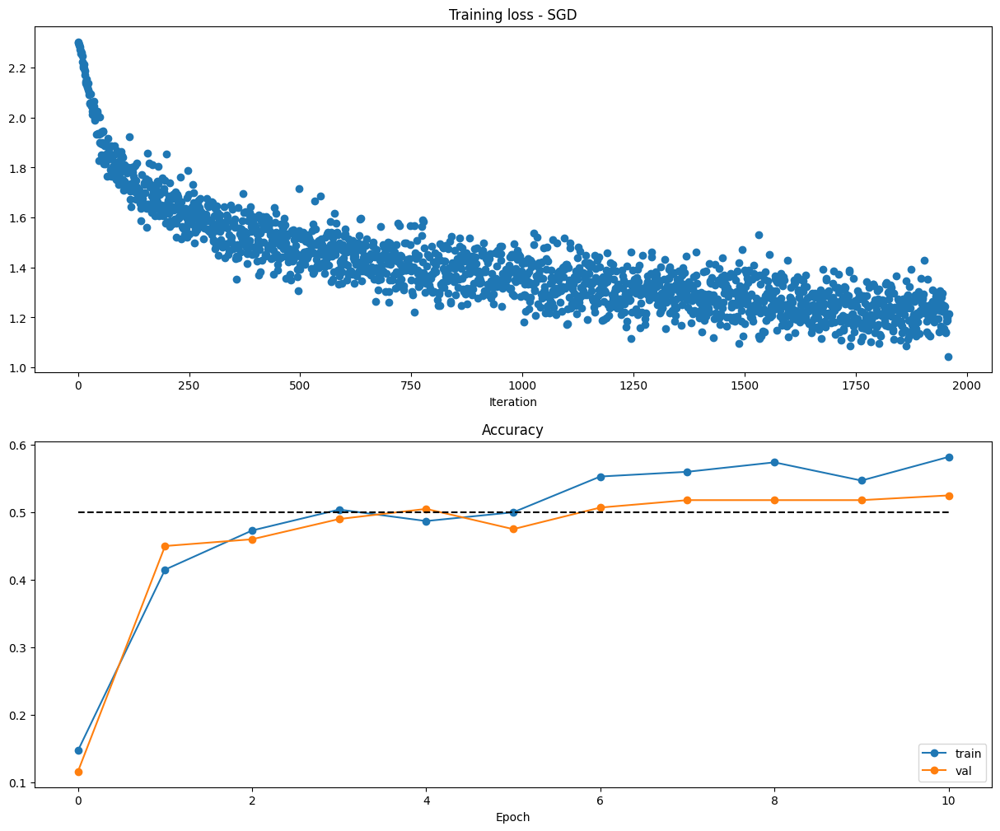

In [ ]:
##############################################################################
#             VISUALIZAÇÃO DA PERDA E ACURÁCIA DO TREINAMENTO                #
##############################################################################
##############################################################################
#                             SGD                                            #
##############################################################################

# Execute esta célula para visualizar a perda durante o treinamento e a acurácia
# tanto sobre o conjunto de treinamento quanto sobre o conjunto de validação.

plt.subplot(2, 1, 1)
plt.title('Training loss - SGD')
plt.plot(solver_SGD.loss_history, 'o')
plt.xlabel('Iteration')

plt.subplot(2, 1, 2)
plt.title('Accuracy')
plt.plot(solver_SGD.train_acc_history, '-o', label='train')
plt.plot(solver_SGD.val_acc_history, '-o', label='val')
plt.plot([0.5] * len(solver_SGD.val_acc_history), 'k--')
plt.xlabel('Epoch')
plt.legend(loc='lower right')
plt.gcf().set_size_inches(15, 12)
plt.show()

In [ ]:
model = TwoLayerNet()
solver = None

##############################################################################
# TODO: Usar uma instância da classe Solver para treinar um modelo criado    #
# usando a classe TwoLayerNet de forma a alcançar uma acurácia de pelo menos #
# 50% sobre o conjunto de validação.                                         #
##############################################################################
##############################################################################
#                                SGD MOMENTUM                                #
##############################################################################

#default
model_SGD_MOMENTUM = TwoLayerNet(hidden_dim= 500, reg = 0.75)
solver_SGD_MOMENTUM = Solver(model,
                data,
                update_rule = 'sgd_momentum',
                optim_config = {'learning_rate':1e-3,
                                'momentum': 0.90},
                lr_decay= 0.95,
                num_epochs = 10,
                batch_size = 250,
                print_every=100
                )

solver_SGD_MOMENTUM.train()

##############################################################################
#                            FIM DE SEU CÓDIGO                               #
##############################################################################

(Iteration 1 / 1960) loss: 2.304404
(Epoch 0 / 10) train acc: 0.161000; val_acc: 0.132000
(Iteration 101 / 1960) loss: 1.721351
(Epoch 1 / 10) train acc: 0.347000; val_acc: 0.369000
(Iteration 201 / 1960) loss: 1.772260
(Iteration 301 / 1960) loss: 1.789056
(Epoch 2 / 10) train acc: 0.413000; val_acc: 0.404000
(Iteration 401 / 1960) loss: 2.048133
(Iteration 501 / 1960) loss: 1.871210
(Epoch 3 / 10) train acc: 0.469000; val_acc: 0.438000
(Iteration 601 / 1960) loss: 1.797644
(Iteration 701 / 1960) loss: 1.774015
(Epoch 4 / 10) train acc: 0.462000; val_acc: 0.414000
(Iteration 801 / 1960) loss: 1.602027
(Iteration 901 / 1960) loss: 1.465373
(Epoch 5 / 10) train acc: 0.465000; val_acc: 0.416000
(Iteration 1001 / 1960) loss: 1.742916
(Iteration 1101 / 1960) loss: 1.695988
(Epoch 6 / 10) train acc: 0.462000; val_acc: 0.403000
(Iteration 1201 / 1960) loss: 1.907672
(Iteration 1301 / 1960) loss: 1.838648
(Epoch 7 / 10) train acc: 0.503000; val_acc: 0.460000
(Iteration 1401 / 1960) loss: 1.69

In [ ]:
model = TwoLayerNet()
solver = None

##############################################################################
# TODO: Usar uma instância da classe Solver para treinar um modelo criado    #
# usando a classe TwoLayerNet de forma a alcançar uma acurácia de pelo menos #
# 50% sobre o conjunto de validação.                                         #
##############################################################################
##############################################################################
#                                SGD MOMENTUM                                #
##############################################################################

model_SGD_MOMENTUM = TwoLayerNet(hidden_dim= 500, reg = 0.75)
solver_SGD_MOMENTUM = Solver(model,
                data,
                update_rule = 'sgd_momentum',
                optim_config = {'learning_rate':1e-3,
                                'momentum': 0.80},
                lr_decay= 0.95,
                num_epochs = 10,
                batch_size = 250,
                print_every=100
                )

solver_SGD_MOMENTUM.train()

##############################################################################
#                            FIM DE SEU CÓDIGO                               #
##############################################################################

(Iteration 1 / 1960) loss: 2.302222
(Epoch 0 / 10) train acc: 0.125000; val_acc: 0.143000
(Iteration 101 / 1960) loss: 1.699069
(Epoch 1 / 10) train acc: 0.443000; val_acc: 0.426000
(Iteration 201 / 1960) loss: 1.695037
(Iteration 301 / 1960) loss: 1.515785
(Epoch 2 / 10) train acc: 0.475000; val_acc: 0.469000
(Iteration 401 / 1960) loss: 1.318082
(Iteration 501 / 1960) loss: 1.347533
(Epoch 3 / 10) train acc: 0.516000; val_acc: 0.473000
(Iteration 601 / 1960) loss: 1.323456
(Iteration 701 / 1960) loss: 1.415133
(Epoch 4 / 10) train acc: 0.524000; val_acc: 0.479000
(Iteration 801 / 1960) loss: 1.491361
(Iteration 901 / 1960) loss: 1.479238
(Epoch 5 / 10) train acc: 0.532000; val_acc: 0.477000
(Iteration 1001 / 1960) loss: 1.260131
(Iteration 1101 / 1960) loss: 1.359416
(Epoch 6 / 10) train acc: 0.559000; val_acc: 0.501000
(Iteration 1201 / 1960) loss: 1.233958
(Iteration 1301 / 1960) loss: 1.284609
(Epoch 7 / 10) train acc: 0.600000; val_acc: 0.496000
(Iteration 1401 / 1960) loss: 1.31

In [ ]:
model = TwoLayerNet()
solver = None

##############################################################################
# TODO: Usar uma instância da classe Solver para treinar um modelo criado    #
# usando a classe TwoLayerNet de forma a alcançar uma acurácia de pelo menos #
# 50% sobre o conjunto de validação.                                         #
##############################################################################
##############################################################################
#                                SGD MOMENTUM                                #
##############################################################################

model_SGD_MOMENTUM = TwoLayerNet(hidden_dim= 500, reg = 0.75)
solver_SGD_MOMENTUM = Solver(model,
                data,
                update_rule = 'sgd_momentum',
                optim_config = {'learning_rate':1e-3,
                                'momentum': 0.75},
                lr_decay= 0.95,
                num_epochs = 10,
                batch_size = 250,
                print_every=100
                )

solver_SGD_MOMENTUM.train()

##############################################################################
#                            FIM DE SEU CÓDIGO                               #
##############################################################################

(Iteration 1 / 1960) loss: 2.303484
(Epoch 0 / 10) train acc: 0.118000; val_acc: 0.120000
(Iteration 101 / 1960) loss: 1.545789
(Epoch 1 / 10) train acc: 0.476000; val_acc: 0.490000
(Iteration 201 / 1960) loss: 1.594942
(Iteration 301 / 1960) loss: 1.586451
(Epoch 2 / 10) train acc: 0.468000; val_acc: 0.455000
(Iteration 401 / 1960) loss: 1.421777
(Iteration 501 / 1960) loss: 1.530217
(Epoch 3 / 10) train acc: 0.522000; val_acc: 0.451000
(Iteration 601 / 1960) loss: 1.494420
(Iteration 701 / 1960) loss: 1.344843
(Epoch 4 / 10) train acc: 0.493000; val_acc: 0.472000
(Iteration 801 / 1960) loss: 1.336581
(Iteration 901 / 1960) loss: 1.346422
(Epoch 5 / 10) train acc: 0.553000; val_acc: 0.494000
(Iteration 1001 / 1960) loss: 1.387850
(Iteration 1101 / 1960) loss: 1.189152
(Epoch 6 / 10) train acc: 0.578000; val_acc: 0.498000
(Iteration 1201 / 1960) loss: 1.365116
(Iteration 1301 / 1960) loss: 1.246825
(Epoch 7 / 10) train acc: 0.566000; val_acc: 0.485000
(Iteration 1401 / 1960) loss: 1.29

In [ ]:
model = TwoLayerNet()
solver = None

##############################################################################
# TODO: Usar uma instância da classe Solver para treinar um modelo criado    #
# usando a classe TwoLayerNet de forma a alcançar uma acurácia de pelo menos #
# 50% sobre o conjunto de validação.                                         #
##############################################################################
##############################################################################
#                                SGD MOMENTUM                                #
##############################################################################

model_SGD_MOMENTUM = TwoLayerNet(hidden_dim= 500, reg = 0.75)
solver_SGD_MOMENTUM = Solver(model,
                data,
                update_rule = 'sgd_momentum',
                optim_config = {'learning_rate':1e-3,
                                'momentum': 0.70},
                lr_decay= 0.95,
                num_epochs = 10,
                batch_size = 250,
                print_every=100
                )

solver_SGD_MOMENTUM.train()

##############################################################################
#                            FIM DE SEU CÓDIGO                               #
##############################################################################

(Iteration 1 / 1960) loss: 2.302494
(Epoch 0 / 10) train acc: 0.158000; val_acc: 0.162000
(Iteration 101 / 1960) loss: 1.536073
(Epoch 1 / 10) train acc: 0.477000; val_acc: 0.460000
(Iteration 201 / 1960) loss: 1.501352
(Iteration 301 / 1960) loss: 1.504191
(Epoch 2 / 10) train acc: 0.488000; val_acc: 0.437000
(Iteration 401 / 1960) loss: 1.463691
(Iteration 501 / 1960) loss: 1.399524
(Epoch 3 / 10) train acc: 0.529000; val_acc: 0.489000
(Iteration 601 / 1960) loss: 1.412342
(Iteration 701 / 1960) loss: 1.406575
(Epoch 4 / 10) train acc: 0.558000; val_acc: 0.511000
(Iteration 801 / 1960) loss: 1.301036
(Iteration 901 / 1960) loss: 1.480386
(Epoch 5 / 10) train acc: 0.545000; val_acc: 0.494000
(Iteration 1001 / 1960) loss: 1.274206
(Iteration 1101 / 1960) loss: 1.210945
(Epoch 6 / 10) train acc: 0.562000; val_acc: 0.515000
(Iteration 1201 / 1960) loss: 1.379941
(Iteration 1301 / 1960) loss: 1.195874
(Epoch 7 / 10) train acc: 0.565000; val_acc: 0.517000
(Iteration 1401 / 1960) loss: 1.10

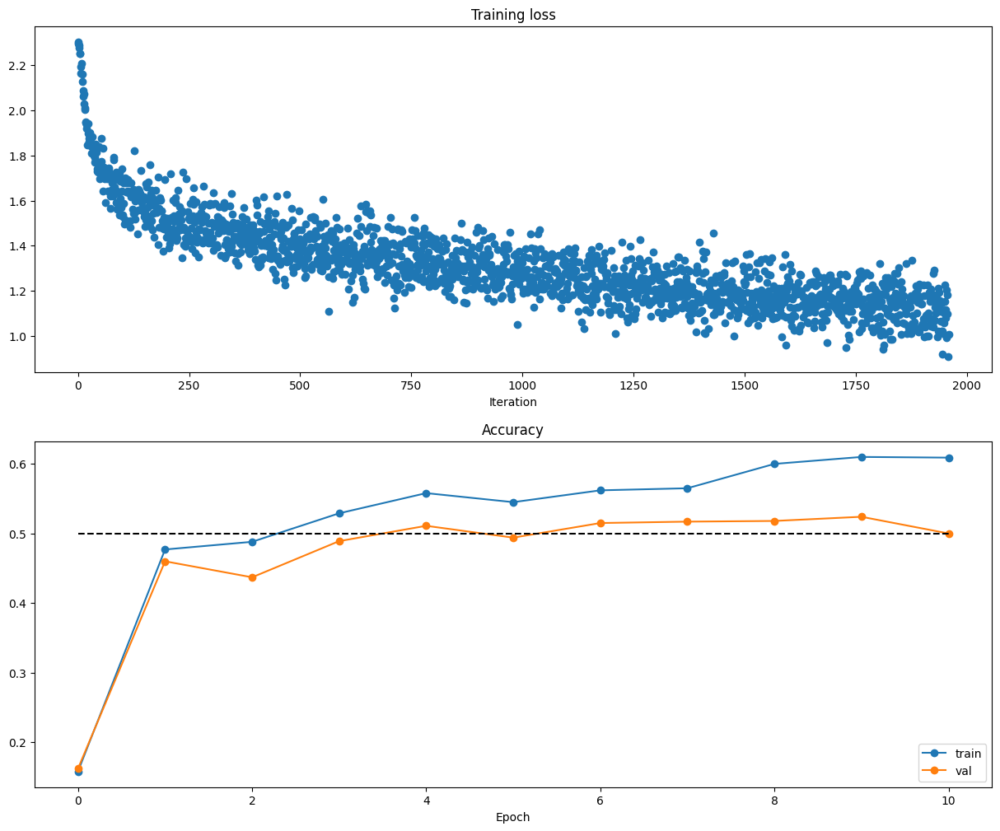

In [ ]:
##############################################################################
#             VISUALIZAÇÃO DA PERDA E ACURÁCIA DO TREINAMENTO                #
##############################################################################
##############################################################################
#                                SGD MOMENTUM                                #
##############################################################################

# Execute esta célula para visualizar a perda durante o treinamento e a acurácia
# tanto sobre o conjunto de treinamento quanto sobre o conjunto de validação.

plt.subplot(2, 1, 1)
plt.title('Training loss')
plt.plot(solver_SGD_MOMENTUM.loss_history, 'o')
plt.xlabel('Iteration')

plt.subplot(2, 1, 2)
plt.title('Accuracy')
plt.plot(solver_SGD_MOMENTUM.train_acc_history, '-o', label='train')
plt.plot(solver_SGD_MOMENTUM.val_acc_history, '-o', label='val')
plt.plot([0.5] * len(solver_SGD_MOMENTUM.val_acc_history), 'k--')
plt.xlabel('Epoch')
plt.legend(loc='lower right')
plt.gcf().set_size_inches(15, 12)
plt.show()

In [ ]:
model = TwoLayerNet()
solver = None

##############################################################################
# TODO: Usar uma instância da classe Solver para treinar um modelo criado    #
# usando a classe TwoLayerNet de forma a alcançar uma acurácia de pelo menos #
# 50% sobre o conjunto de validação.                                         #
##############################################################################
##############################################################################
#                                SGD MOMENTUM                                #
##############################################################################

model_SGD_MOMENTUM = TwoLayerNet(hidden_dim= 500, reg = 0.75)
solver_SGD_MOMENTUM = Solver(model,
                data,
                update_rule = 'sgd_momentum',
                optim_config = {'learning_rate':1e-3,
                                'momentum': 0.70},
                lr_decay= 0.95,
                num_epochs = 10,
                batch_size = 250,
                print_every=100
                )

solver_SGD_MOMENTUM.train()

##############################################################################
#                            FIM DE SEU CÓDIGO                               #
##############################################################################

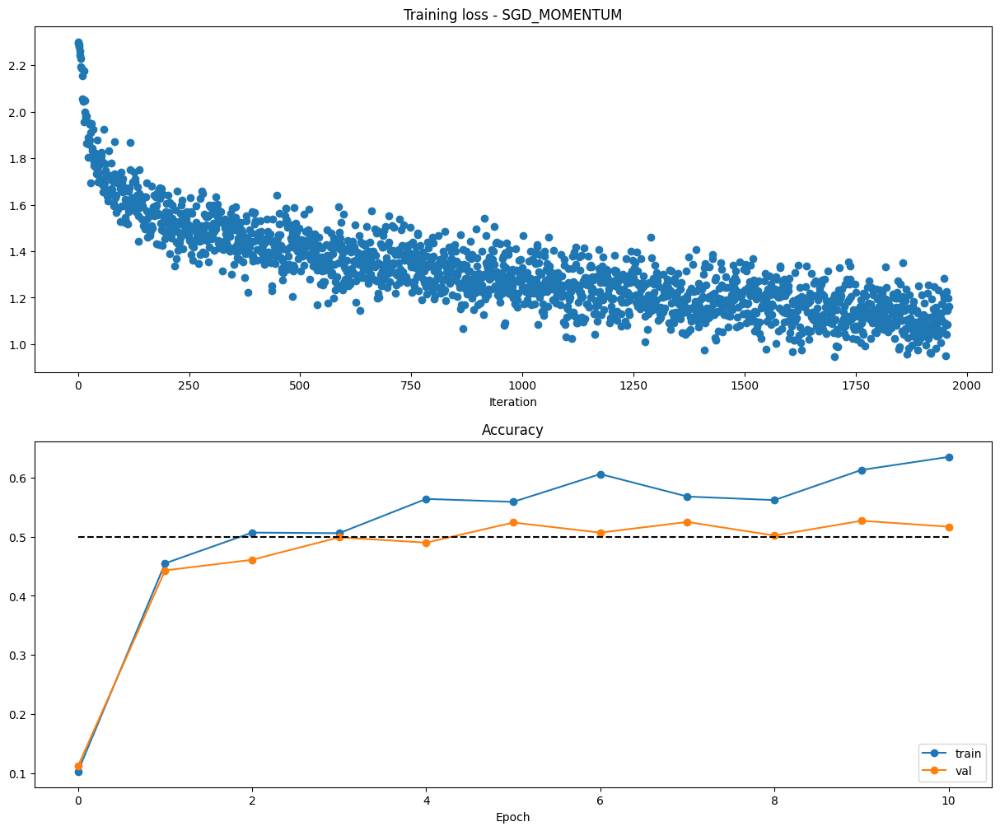

In [ ]:
##############################################################################
#             VISUALIZAÇÃO DA PERDA E ACURÁCIA DO TREINAMENTO                #
##############################################################################
##############################################################################
#                                SGD MOMENTUM                                #
##############################################################################

# Execute esta célula para visualizar a perda durante o treinamento e a acurácia
# tanto sobre o conjunto de treinamento quanto sobre o conjunto de validação.

plt.subplot(2, 1, 1)
plt.title('Training loss - SGD_MOMENTUM')
plt.plot(solver_SGD_MOMENTUM.loss_history, 'o')
plt.xlabel('Iteration')

plt.subplot(2, 1, 2)
plt.title('Accuracy')
plt.plot(solver_SGD_MOMENTUM.train_acc_history, '-o', label='train')
plt.plot(solver_SGD_MOMENTUM.val_acc_history, '-o', label='val')
plt.plot([0.5] * len(solver_SGD_MOMENTUM.val_acc_history), 'k--')
plt.xlabel('Epoch')
plt.legend(loc='lower right')
plt.gcf().set_size_inches(15, 12)
plt.show()

In [ ]:
model = TwoLayerNet()
solver = None

##############################################################################
# TODO: Usar uma instância da classe Solver para treinar um modelo criado    #
# usando a classe TwoLayerNet de forma a alcançar uma acurácia de pelo menos #
# 50% sobre o conjunto de validação.                                         #
##############################################################################
##############################################################################
#                                RMSPROP                                     #
##############################################################################

# default
model_RMSPROP = TwoLayerNet(hidden_dim= 500, reg = 0.75)
solver_RMSPROP = Solver(model,
                data,
                update_rule = 'rmsprop',
                optim_config = {'learning_rate':1e-2,
                                'decay_rate': 0.99,
                               },
                lr_decay= 0.95,
                num_epochs = 10,
                batch_size = 250,
                print_every=100
                )

solver_RMSPROP.train()

##############################################################################
#                            FIM DE SEU CÓDIGO                               #
##############################################################################

(Iteration 1 / 1960) loss: 2.305024
(Epoch 0 / 10) train acc: 0.124000; val_acc: 0.115000
(Iteration 101 / 1960) loss: 236.729893
(Epoch 1 / 10) train acc: 0.266000; val_acc: 0.244000
(Iteration 201 / 1960) loss: 91.044277
(Iteration 301 / 1960) loss: 623.428523
(Epoch 2 / 10) train acc: 0.231000; val_acc: 0.230000
(Iteration 401 / 1960) loss: 60.790973
(Iteration 501 / 1960) loss: 89.094742
(Epoch 3 / 10) train acc: 0.192000; val_acc: 0.200000
(Iteration 601 / 1960) loss: 920.313388
(Iteration 701 / 1960) loss: 30.480286
(Epoch 4 / 10) train acc: 0.205000; val_acc: 0.187000
(Iteration 801 / 1960) loss: 70.838418
(Iteration 901 / 1960) loss: 23.997028
(Epoch 5 / 10) train acc: 0.326000; val_acc: 0.352000
(Iteration 1001 / 1960) loss: 35.642777
(Iteration 1101 / 1960) loss: 447.223001
(Epoch 6 / 10) train acc: 0.226000; val_acc: 0.211000
(Iteration 1201 / 1960) loss: 24.234815
(Iteration 1301 / 1960) loss: 611.900135
(Epoch 7 / 10) train acc: 0.304000; val_acc: 0.291000
(Iteration 1401 

In [ ]:
model = TwoLayerNet()
solver = None

##############################################################################
# TODO: Usar uma instância da classe Solver para treinar um modelo criado    #
# usando a classe TwoLayerNet de forma a alcançar uma acurácia de pelo menos #
# 50% sobre o conjunto de validação.                                         #
##############################################################################
##############################################################################
#                                RMSPROP                                     #
##############################################################################


model_RMSPROP = TwoLayerNet(hidden_dim= 500, reg = 0.75)
solver_RMSPROP = Solver(model,
                data,
                update_rule = 'rmsprop',
                optim_config = {'learning_rate':1e-3,
                                'decay_rate': 0.7,
                               },
                lr_decay= 0.95,
                num_epochs = 10,
                batch_size = 250,
                print_every=100
                )

solver_RMSPROP.train()

##############################################################################
#                            FIM DE SEU CÓDIGO                               #
##############################################################################

(Iteration 1 / 1960) loss: 2.300289
(Epoch 0 / 10) train acc: 0.106000; val_acc: 0.112000
(Iteration 101 / 1960) loss: 2.527163
(Epoch 1 / 10) train acc: 0.246000; val_acc: 0.285000
(Iteration 201 / 1960) loss: 2.931364
(Iteration 301 / 1960) loss: 2.802693
(Epoch 2 / 10) train acc: 0.317000; val_acc: 0.325000
(Iteration 401 / 1960) loss: 2.094847
(Iteration 501 / 1960) loss: 2.504215
(Epoch 3 / 10) train acc: 0.320000; val_acc: 0.295000
(Iteration 601 / 1960) loss: 2.318763
(Iteration 701 / 1960) loss: 2.420049
(Epoch 4 / 10) train acc: 0.335000; val_acc: 0.341000
(Iteration 801 / 1960) loss: 2.370871
(Iteration 901 / 1960) loss: 2.590935
(Epoch 5 / 10) train acc: 0.356000; val_acc: 0.350000
(Iteration 1001 / 1960) loss: 2.165405
(Iteration 1101 / 1960) loss: 2.039269
(Epoch 6 / 10) train acc: 0.361000; val_acc: 0.324000
(Iteration 1201 / 1960) loss: 1.661995
(Iteration 1301 / 1960) loss: 2.014634
(Epoch 7 / 10) train acc: 0.387000; val_acc: 0.387000
(Iteration 1401 / 1960) loss: 1.79

In [ ]:
model = TwoLayerNet()
solver = None

##############################################################################
# TODO: Usar uma instância da classe Solver para treinar um modelo criado    #
# usando a classe TwoLayerNet de forma a alcançar uma acurácia de pelo menos #
# 50% sobre o conjunto de validação.                                         #
##############################################################################
##############################################################################
#                                RMSPROP                                     #
##############################################################################

model_RMSPROP = TwoLayerNet(hidden_dim= 500, reg = 0.75)
solver_RMSPROP = Solver(model,
                data,
                update_rule = 'rmsprop',
                optim_config = {'learning_rate':1e-3,
                                'decay_rate': 0.5,
                               },
                lr_decay= 0.95,
                num_epochs = 10,
                batch_size = 250,
                print_every=100
                )

solver_RMSPROP.train()

##############################################################################
#                            FIM DE SEU CÓDIGO                               #
##############################################################################

(Iteration 1 / 1960) loss: 2.304942
(Epoch 0 / 10) train acc: 0.130000; val_acc: 0.169000
(Iteration 101 / 1960) loss: 2.494451
(Epoch 1 / 10) train acc: 0.285000; val_acc: 0.299000
(Iteration 201 / 1960) loss: 3.359118
(Iteration 301 / 1960) loss: 2.771682
(Epoch 2 / 10) train acc: 0.286000; val_acc: 0.310000
(Iteration 401 / 1960) loss: 2.620140
(Iteration 501 / 1960) loss: 2.895855
(Epoch 3 / 10) train acc: 0.315000; val_acc: 0.287000
(Iteration 601 / 1960) loss: 2.625766
(Iteration 701 / 1960) loss: 2.021543
(Epoch 4 / 10) train acc: 0.338000; val_acc: 0.307000
(Iteration 801 / 1960) loss: 1.853694
(Iteration 901 / 1960) loss: 2.346182
(Epoch 5 / 10) train acc: 0.359000; val_acc: 0.351000
(Iteration 1001 / 1960) loss: 2.089145
(Iteration 1101 / 1960) loss: 1.991807
(Epoch 6 / 10) train acc: 0.349000; val_acc: 0.356000
(Iteration 1201 / 1960) loss: 1.892459
(Iteration 1301 / 1960) loss: 1.965481
(Epoch 7 / 10) train acc: 0.359000; val_acc: 0.382000
(Iteration 1401 / 1960) loss: 2.14

In [ ]:
model = TwoLayerNet()
solver = None

##############################################################################
# TODO: Usar uma instância da classe Solver para treinar um modelo criado    #
# usando a classe TwoLayerNet de forma a alcançar uma acurácia de pelo menos #
# 50% sobre o conjunto de validação.                                         #
##############################################################################
##############################################################################
#                                RMSPROP                                     #
##############################################################################


model_RMSPROP = TwoLayerNet(hidden_dim= 500, reg = 0.5)
solver_RMSPROP = Solver(model,
                data,
                update_rule = 'rmsprop',
                optim_config = {'learning_rate':1e-5,
                                'decay_rate': 0.7,
                               },
                lr_decay= 0.95,
                num_epochs = 10,
                batch_size = 250,
                print_every=100
                )

solver_RMSPROP.train()

##############################################################################
#                            FIM DE SEU CÓDIGO                               #
##############################################################################

(Iteration 1 / 1960) loss: 2.305002
(Epoch 0 / 10) train acc: 0.144000; val_acc: 0.142000
(Iteration 101 / 1960) loss: 1.961121
(Epoch 1 / 10) train acc: 0.334000; val_acc: 0.362000
(Iteration 201 / 1960) loss: 1.833758
(Iteration 301 / 1960) loss: 1.817545
(Epoch 2 / 10) train acc: 0.407000; val_acc: 0.386000
(Iteration 401 / 1960) loss: 1.694646
(Iteration 501 / 1960) loss: 1.649778
(Epoch 3 / 10) train acc: 0.418000; val_acc: 0.418000
(Iteration 601 / 1960) loss: 1.704135
(Iteration 701 / 1960) loss: 1.740634
(Epoch 4 / 10) train acc: 0.434000; val_acc: 0.434000
(Iteration 801 / 1960) loss: 1.662228
(Iteration 901 / 1960) loss: 1.575884
(Epoch 5 / 10) train acc: 0.437000; val_acc: 0.445000
(Iteration 1001 / 1960) loss: 1.562149
(Iteration 1101 / 1960) loss: 1.509782
(Epoch 6 / 10) train acc: 0.446000; val_acc: 0.448000
(Iteration 1201 / 1960) loss: 1.653925
(Iteration 1301 / 1960) loss: 1.590351
(Epoch 7 / 10) train acc: 0.470000; val_acc: 0.459000
(Iteration 1401 / 1960) loss: 1.53

In [ ]:
model = TwoLayerNet()
solver = None

##############################################################################
# TODO: Usar uma instância da classe Solver para treinar um modelo criado    #
# usando a classe TwoLayerNet de forma a alcançar uma acurácia de pelo menos #
# 50% sobre o conjunto de validação.                                         #
##############################################################################
##############################################################################
#                                RMSPROP                                     #
##############################################################################


model_RMSPROP = TwoLayerNet(hidden_dim= 500, reg = 0.75)
solver_RMSPROP = Solver(model,
                data,
                update_rule = 'rmsprop',
                optim_config = {'learning_rate':1e-4,
                                'decay_rate': 0.005,
                               },
                lr_decay= 0.95,
                num_epochs = 10,
                batch_size = 250,
                print_every=100
                )

solver_RMSPROP.train()

##############################################################################
#                            FIM DE SEU CÓDIGO                               #
##############################################################################

(Iteration 1 / 1960) loss: 2.304635
(Epoch 0 / 10) train acc: 0.232000; val_acc: 0.218000
(Iteration 101 / 1960) loss: 1.629106
(Epoch 1 / 10) train acc: 0.441000; val_acc: 0.449000
(Iteration 201 / 1960) loss: 1.423404
(Iteration 301 / 1960) loss: 1.407929
(Epoch 2 / 10) train acc: 0.493000; val_acc: 0.472000
(Iteration 401 / 1960) loss: 1.467686
(Iteration 501 / 1960) loss: 1.377220
(Epoch 3 / 10) train acc: 0.527000; val_acc: 0.490000
(Iteration 601 / 1960) loss: 1.510610
(Iteration 701 / 1960) loss: 1.553099
(Epoch 4 / 10) train acc: 0.520000; val_acc: 0.505000
(Iteration 801 / 1960) loss: 1.376360
(Iteration 901 / 1960) loss: 1.349318
(Epoch 5 / 10) train acc: 0.536000; val_acc: 0.503000
(Iteration 1001 / 1960) loss: 1.370907
(Iteration 1101 / 1960) loss: 1.406300
(Epoch 6 / 10) train acc: 0.569000; val_acc: 0.499000
(Iteration 1201 / 1960) loss: 1.296930
(Iteration 1301 / 1960) loss: 1.276872
(Epoch 7 / 10) train acc: 0.562000; val_acc: 0.521000
(Iteration 1401 / 1960) loss: 1.19

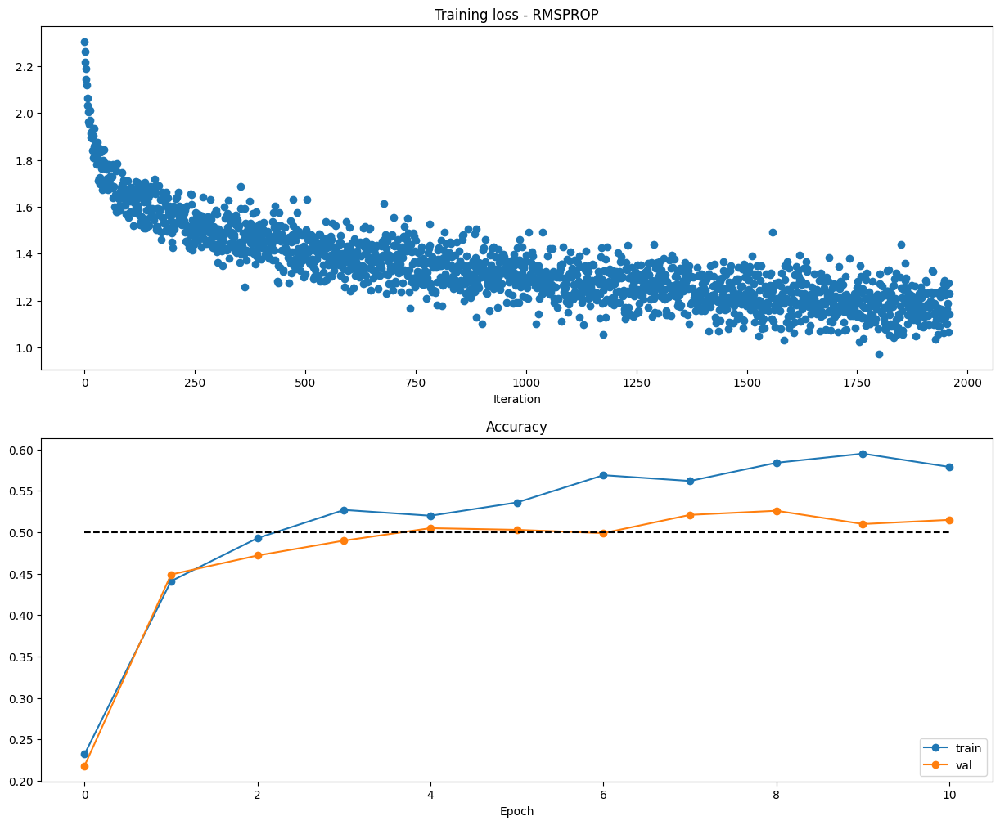

In [ ]:
##############################################################################
#             VISUALIZAÇÃO DA PERDA E ACURÁCIA DO TREINAMENTO                #
##############################################################################
##############################################################################
#                              RMSPROP                                       #
##############################################################################

# Execute esta célula para visualizar a perda durante o treinamento e a acurácia
# tanto sobre o conjunto de treinamento quanto sobre o conjunto de validação.

plt.subplot(2, 1, 1)
plt.title('Training loss - RMSPROP')
plt.plot(solver_RMSPROP.loss_history, 'o')
plt.xlabel('Iteration')

plt.subplot(2, 1, 2)
plt.title('Accuracy')
plt.plot(solver_RMSPROP.train_acc_history, '-o', label='train')
plt.plot(solver_RMSPROP.val_acc_history, '-o', label='val')
plt.plot([0.5] * len(model_RMSPROP.val_acc_history), 'k--')
plt.xlabel('Epoch')
plt.legend(loc='lower right')
plt.gcf().set_size_inches(15, 12)
plt.show()

In [ ]:
model = TwoLayerNet()
solver = None

##############################################################################
# TODO: Usar uma instância da classe Solver para treinar um modelo criado    #
# usando a classe TwoLayerNet de forma a alcançar uma acurácia de pelo menos #
# 50% sobre o conjunto de validação.                                         #
##############################################################################
##############################################################################
#                                  ADAM                                      #
##############################################################################


# default
model_ADAM = TwoLayerNet(hidden_dim= 500, reg = 0.75)
solver_ADAM = Solver(model,
                data,
                update_rule = 'adam',
                optim_config = {'learning_rate':1e-3,
                                'beta1': 0.9,
                                'beta2': 0.999
                               },
                lr_decay= 0.95,
                num_epochs = 10,
                batch_size = 250,
                print_every=100
                )

solver_ADAM.train()

##############################################################################
#                            FIM DE SEU CÓDIGO                               #
##############################################################################

(Iteration 1 / 1960) loss: 2.305028
(Epoch 0 / 10) train acc: 0.150000; val_acc: 0.144000
(Iteration 101 / 1960) loss: 1.645098
(Epoch 1 / 10) train acc: 0.412000; val_acc: 0.392000
(Iteration 201 / 1960) loss: 1.782481
(Iteration 301 / 1960) loss: 1.816553
(Epoch 2 / 10) train acc: 0.428000; val_acc: 0.412000
(Iteration 401 / 1960) loss: 1.417558
(Iteration 501 / 1960) loss: 1.634600
(Epoch 3 / 10) train acc: 0.455000; val_acc: 0.465000
(Iteration 601 / 1960) loss: 1.603370
(Iteration 701 / 1960) loss: 1.394379
(Epoch 4 / 10) train acc: 0.472000; val_acc: 0.429000
(Iteration 801 / 1960) loss: 1.466135
(Iteration 901 / 1960) loss: 1.728457
(Epoch 5 / 10) train acc: 0.498000; val_acc: 0.434000
(Iteration 1001 / 1960) loss: 1.578830
(Iteration 1101 / 1960) loss: 1.291905
(Epoch 6 / 10) train acc: 0.516000; val_acc: 0.461000
(Iteration 1201 / 1960) loss: 1.439131
(Iteration 1301 / 1960) loss: 1.541043
(Epoch 7 / 10) train acc: 0.483000; val_acc: 0.463000
(Iteration 1401 / 1960) loss: 1.33

In [ ]:
model = TwoLayerNet()
solver = None

##############################################################################
# TODO: Usar uma instância da classe Solver para treinar um modelo criado    #
# usando a classe TwoLayerNet de forma a alcançar uma acurácia de pelo menos #
# 50% sobre o conjunto de validação.                                         #
##############################################################################
##############################################################################
#                                  ADAM                                      #
##############################################################################



model_ADAM = TwoLayerNet(hidden_dim= 500, reg = 0.75)
solver_ADAM = Solver(model,
                data,
                update_rule = 'adam',
                optim_config = {'learning_rate':1e-3,
                                'beta1': 0.5,
                                'beta2': 0.999
                               },
                lr_decay= 0.95,
                num_epochs = 10,
                batch_size = 250,
                print_every=100
                )

solver_ADAM.train()

##############################################################################
#                            FIM DE SEU CÓDIGO                               #
##############################################################################

(Iteration 1 / 1960) loss: 2.301367
(Epoch 0 / 10) train acc: 0.196000; val_acc: 0.167000
(Iteration 101 / 1960) loss: 5.675030
(Epoch 1 / 10) train acc: 0.408000; val_acc: 0.399000
(Iteration 201 / 1960) loss: 1.701732
(Iteration 301 / 1960) loss: 1.639840
(Epoch 2 / 10) train acc: 0.440000; val_acc: 0.414000
(Iteration 401 / 1960) loss: 1.647727
(Iteration 501 / 1960) loss: 1.530730
(Epoch 3 / 10) train acc: 0.475000; val_acc: 0.430000
(Iteration 601 / 1960) loss: 1.442940
(Iteration 701 / 1960) loss: 1.466176
(Epoch 4 / 10) train acc: 0.509000; val_acc: 0.453000
(Iteration 801 / 1960) loss: 1.633384
(Iteration 901 / 1960) loss: 1.562232
(Epoch 5 / 10) train acc: 0.512000; val_acc: 0.469000
(Iteration 1001 / 1960) loss: 1.273064
(Iteration 1101 / 1960) loss: 1.374289
(Epoch 6 / 10) train acc: 0.474000; val_acc: 0.458000
(Iteration 1201 / 1960) loss: 1.385450
(Iteration 1301 / 1960) loss: 1.487776
(Epoch 7 / 10) train acc: 0.500000; val_acc: 0.460000
(Iteration 1401 / 1960) loss: 1.38

In [ ]:
model = TwoLayerNet()
solver = None

##############################################################################
# TODO: Usar uma instância da classe Solver para treinar um modelo criado    #
# usando a classe TwoLayerNet de forma a alcançar uma acurácia de pelo menos #
# 50% sobre o conjunto de validação.                                         #
##############################################################################
##############################################################################
#                                  ADAM                                      #
##############################################################################



model_ADAM = TwoLayerNet(hidden_dim= 500, reg = 0.75)
solver_ADAM = Solver(model,
                data,
                update_rule = 'adam',
                optim_config = {'learning_rate':1e-3,
                                'beta1': 0.9,
                                'beta2': 0.5
                               },
                lr_decay= 0.95,
                num_epochs = 10,
                batch_size = 250,
                print_every=100
                )

solver_ADAM.train()

##############################################################################
#                            FIM DE SEU CÓDIGO                               #
##############################################################################

(Iteration 1 / 1960) loss: 2.304533
(Epoch 0 / 10) train acc: 0.243000; val_acc: 0.219000
(Iteration 101 / 1960) loss: 2.060436
(Epoch 1 / 10) train acc: 0.340000; val_acc: 0.346000
(Iteration 201 / 1960) loss: 2.086968
(Iteration 301 / 1960) loss: 2.439245
(Epoch 2 / 10) train acc: 0.370000; val_acc: 0.356000
(Iteration 401 / 1960) loss: 1.945223
(Iteration 501 / 1960) loss: 2.060615
(Epoch 3 / 10) train acc: 0.378000; val_acc: 0.346000
(Iteration 601 / 1960) loss: 2.507760
(Iteration 701 / 1960) loss: 1.878841
(Epoch 4 / 10) train acc: 0.395000; val_acc: 0.364000
(Iteration 801 / 1960) loss: 1.992666
(Iteration 901 / 1960) loss: 1.737141
(Epoch 5 / 10) train acc: 0.391000; val_acc: 0.370000
(Iteration 1001 / 1960) loss: 2.082544
(Iteration 1101 / 1960) loss: 1.618516
(Epoch 6 / 10) train acc: 0.440000; val_acc: 0.410000
(Iteration 1201 / 1960) loss: 1.708671
(Iteration 1301 / 1960) loss: 1.855394
(Epoch 7 / 10) train acc: 0.411000; val_acc: 0.405000
(Iteration 1401 / 1960) loss: 1.67

In [ ]:
model = TwoLayerNet()
solver = None

##############################################################################
# TODO: Usar uma instância da classe Solver para treinar um modelo criado    #
# usando a classe TwoLayerNet de forma a alcançar uma acurácia de pelo menos #
# 50% sobre o conjunto de validação.                                         #
##############################################################################
##############################################################################
#                                  ADAM                                      #
##############################################################################



model_ADAM = TwoLayerNet(hidden_dim= 500, reg = 0.75)
solver_ADAM = Solver(model,
                data,
                update_rule = 'adam',
                optim_config = {'learning_rate':1e-3,
                                'beta1': 0.999,
                                'beta2': 0.999
                               },
                lr_decay= 0.95,
                num_epochs = 10,
                batch_size = 250,
                print_every=100
                )

solver_ADAM.train()

##############################################################################
#                            FIM DE SEU CÓDIGO                               #
##############################################################################

(Iteration 1 / 1960) loss: 2.300130
(Epoch 0 / 10) train acc: 0.199000; val_acc: 0.187000
(Iteration 101 / 1960) loss: 2.009167
(Epoch 1 / 10) train acc: 0.382000; val_acc: 0.384000
(Iteration 201 / 1960) loss: 1.790209
(Iteration 301 / 1960) loss: 1.873429
(Epoch 2 / 10) train acc: 0.377000; val_acc: 0.387000
(Iteration 401 / 1960) loss: 1.860357
(Iteration 501 / 1960) loss: 2.099061
(Epoch 3 / 10) train acc: 0.398000; val_acc: 0.368000
(Iteration 601 / 1960) loss: 1.843600
(Iteration 701 / 1960) loss: 1.804392
(Epoch 4 / 10) train acc: 0.401000; val_acc: 0.416000
(Iteration 801 / 1960) loss: 1.941785
(Iteration 901 / 1960) loss: 1.761816
(Epoch 5 / 10) train acc: 0.411000; val_acc: 0.395000
(Iteration 1001 / 1960) loss: 1.756583
(Iteration 1101 / 1960) loss: 2.057344
(Epoch 6 / 10) train acc: 0.427000; val_acc: 0.416000
(Iteration 1201 / 1960) loss: 1.753677
(Iteration 1301 / 1960) loss: 1.926460
(Epoch 7 / 10) train acc: 0.412000; val_acc: 0.409000
(Iteration 1401 / 1960) loss: 1.52

In [ ]:
model = TwoLayerNet()
solver = None

##############################################################################
# TODO: Usar uma instância da classe Solver para treinar um modelo criado    #
# usando a classe TwoLayerNet de forma a alcançar uma acurácia de pelo menos #
# 50% sobre o conjunto de validação.                                         #
##############################################################################
##############################################################################
#                                  ADAM                                      #
##############################################################################



model_ADAM = TwoLayerNet(hidden_dim= 500, reg = 0.75)
solver_ADAM = Solver(model,
                data,
                update_rule = 'adam',
                optim_config = {'learning_rate':1e-5,
                                'beta1': 0.9,
                                'beta2': 0.999
                               },
                lr_decay= 0.95,
                num_epochs = 10,
                batch_size = 250,
                print_every=100
                )

solver_ADAM.train()

##############################################################################
#                            FIM DE SEU CÓDIGO                               #
##############################################################################

(Iteration 1 / 1960) loss: 2.304803
(Epoch 0 / 10) train acc: 0.153000; val_acc: 0.149000
(Iteration 101 / 1960) loss: 1.915173
(Epoch 1 / 10) train acc: 0.353000; val_acc: 0.365000
(Iteration 201 / 1960) loss: 1.794707
(Iteration 301 / 1960) loss: 1.785591
(Epoch 2 / 10) train acc: 0.399000; val_acc: 0.419000
(Iteration 401 / 1960) loss: 1.708460
(Iteration 501 / 1960) loss: 1.694080
(Epoch 3 / 10) train acc: 0.428000; val_acc: 0.440000
(Iteration 601 / 1960) loss: 1.611038
(Iteration 701 / 1960) loss: 1.677416
(Epoch 4 / 10) train acc: 0.426000; val_acc: 0.438000
(Iteration 801 / 1960) loss: 1.549393
(Iteration 901 / 1960) loss: 1.584307
(Epoch 5 / 10) train acc: 0.439000; val_acc: 0.458000
(Iteration 1001 / 1960) loss: 1.632337
(Iteration 1101 / 1960) loss: 1.501138
(Epoch 6 / 10) train acc: 0.468000; val_acc: 0.470000
(Iteration 1201 / 1960) loss: 1.592284
(Iteration 1301 / 1960) loss: 1.511521
(Epoch 7 / 10) train acc: 0.456000; val_acc: 0.487000
(Iteration 1401 / 1960) loss: 1.53

In [ ]:
model = TwoLayerNet()
solver = None

##############################################################################
# TODO: Usar uma instância da classe Solver para treinar um modelo criado    #
# usando a classe TwoLayerNet de forma a alcançar uma acurácia de pelo menos #
# 50% sobre o conjunto de validação.                                         #
##############################################################################
##############################################################################
#                                  ADAM                                      #
##############################################################################



model_ADAM = TwoLayerNet(hidden_dim= 500, reg = 0.75)
solver_ADAM = Solver(model,
                data,
                update_rule = 'adam',
                optim_config = {'learning_rate':1e-1,
                                'beta1': 0.9,
                                'beta2': 0.999
                               },
                lr_decay= 0.95,
                num_epochs = 10,
                batch_size = 250,
                print_every=100
                )

solver_ADAM.train()

##############################################################################
#                            FIM DE SEU CÓDIGO                               #
##############################################################################

(Iteration 1 / 1960) loss: 2.298388
(Epoch 0 / 10) train acc: 0.106000; val_acc: 0.114000
(Iteration 101 / 1960) loss: 770.673008
(Epoch 1 / 10) train acc: 0.184000; val_acc: 0.210000
(Iteration 201 / 1960) loss: 2871.018010
(Iteration 301 / 1960) loss: 7946.936303
(Epoch 2 / 10) train acc: 0.284000; val_acc: 0.299000
(Iteration 401 / 1960) loss: 662.693913
(Iteration 501 / 1960) loss: 377.306778
(Epoch 3 / 10) train acc: 0.302000; val_acc: 0.296000
(Iteration 601 / 1960) loss: 226.729640
(Iteration 701 / 1960) loss: 1658.023944
(Epoch 4 / 10) train acc: 0.194000; val_acc: 0.204000
(Iteration 801 / 1960) loss: 13744.469852
(Iteration 901 / 1960) loss: 5077.652063
(Epoch 5 / 10) train acc: 0.286000; val_acc: 0.271000
(Iteration 1001 / 1960) loss: 766.374387
(Iteration 1101 / 1960) loss: 344.106104
(Epoch 6 / 10) train acc: 0.290000; val_acc: 0.314000
(Iteration 1201 / 1960) loss: 275.613156
(Iteration 1301 / 1960) loss: 158.761118
(Epoch 7 / 10) train acc: 0.299000; val_acc: 0.309000
(I

In [ ]:
model = TwoLayerNet()
solver = None

##############################################################################
# TODO: Usar uma instância da classe Solver para treinar um modelo criado    #
# usando a classe TwoLayerNet de forma a alcançar uma acurácia de pelo menos #
# 50% sobre o conjunto de validação.                                         #
##############################################################################
##############################################################################
#                                  ADAM                                      #
##############################################################################



model_ADAM = TwoLayerNet(hidden_dim= 500, reg = 0.9)
solver_ADAM = Solver(model,
                data,
                update_rule = 'adam',
                optim_config = {'learning_rate':1e-5,
                                'beta1': 0.9,
                                'beta2': 0.999
                               },
                lr_decay= 0.99999,
                num_epochs = 20,
                batch_size = 250,
                print_every=100
                )

solver_ADAM.train()

##############################################################################
#                            FIM DE SEU CÓDIGO                               #
##############################################################################

(Iteration 1 / 3920) loss: 2.301729
(Epoch 0 / 20) train acc: 0.112000; val_acc: 0.119000
(Iteration 101 / 3920) loss: 2.004121
(Epoch 1 / 20) train acc: 0.377000; val_acc: 0.364000
(Iteration 201 / 3920) loss: 1.772689
(Iteration 301 / 3920) loss: 1.734028
(Epoch 2 / 20) train acc: 0.386000; val_acc: 0.416000
(Iteration 401 / 3920) loss: 1.635363
(Iteration 501 / 3920) loss: 1.595236
(Epoch 3 / 20) train acc: 0.414000; val_acc: 0.438000
(Iteration 601 / 3920) loss: 1.690146
(Iteration 701 / 3920) loss: 1.527452
(Epoch 4 / 20) train acc: 0.458000; val_acc: 0.455000
(Iteration 801 / 3920) loss: 1.587471
(Iteration 901 / 3920) loss: 1.513913
(Epoch 5 / 20) train acc: 0.469000; val_acc: 0.458000
(Iteration 1001 / 3920) loss: 1.498876
(Iteration 1101 / 3920) loss: 1.571503
(Epoch 6 / 20) train acc: 0.483000; val_acc: 0.467000
(Iteration 1201 / 3920) loss: 1.432272
(Iteration 1301 / 3920) loss: 1.485470
(Epoch 7 / 20) train acc: 0.504000; val_acc: 0.477000
(Iteration 1401 / 3920) loss: 1.40

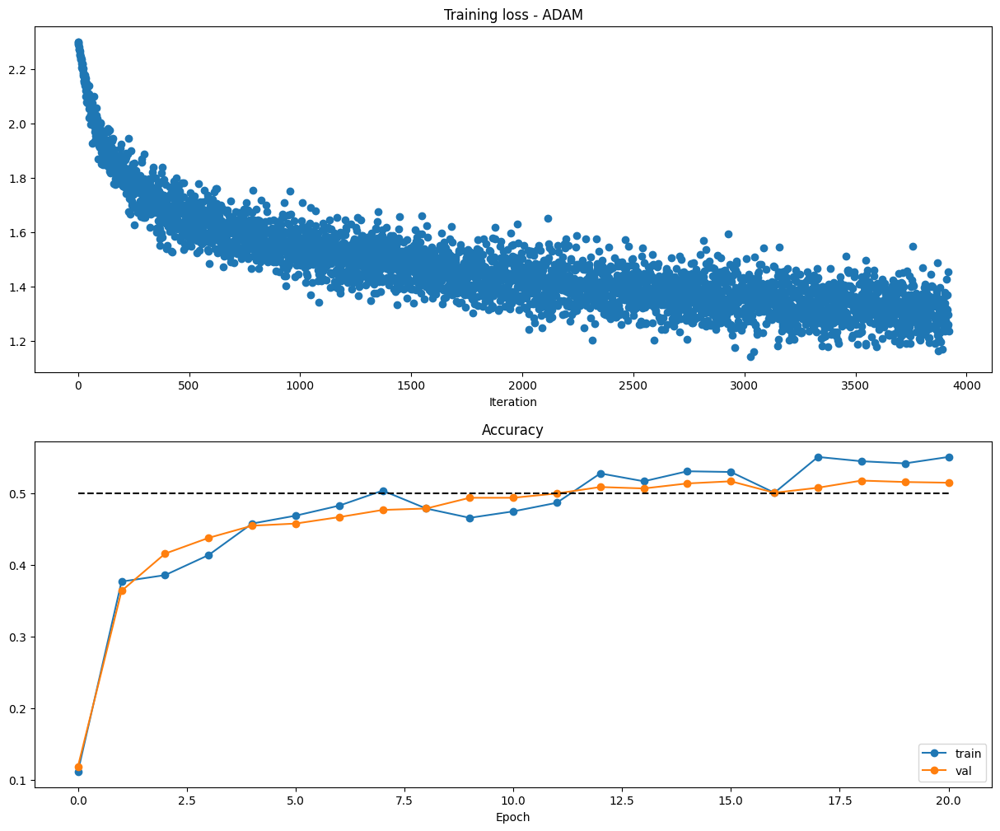

In [ ]:
##############################################################################
#             VISUALIZAÇÃO DA PERDA E ACURÁCIA DO TREINAMENTO                #
##############################################################################
##############################################################################
#                                  ADAM                                      #
##############################################################################

# Execute esta célula para visualizar a perda durante o treinamento e a acurácia
# tanto sobre o conjunto de treinamento quanto sobre o conjunto de validação.

plt.subplot(2, 1, 1)
plt.title('Training loss - ADAM')
plt.plot(solver_ADAM.loss_history, 'o')
plt.xlabel('Iteration')

plt.subplot(2, 1, 2)
plt.title('Accuracy')
plt.plot(solver_ADAM.train_acc_history, '-o', label='train')
plt.plot(solver_ADAM.val_acc_history, '-o', label='val')
plt.plot([0.5] * len(solver_ADAM.val_acc_history), 'k--')
plt.xlabel('Epoch')
plt.legend(loc='lower right')
plt.gcf().set_size_inches(15, 12)
plt.show()

## Visualizando Perda e Acurácia durante o Treinamento

In [ ]:
# Execute esta célula para visualizar a perda durante o treinamento e a acurácia
# tanto sobre o conjunto de treinamento quanto sobre o conjunto de validação.

plt.subplot(2, 1, 1)
plt.title('Training loss')
plt.plot(solver.loss_history, 'o')
plt.xlabel('Iteration')

plt.subplot(2, 1, 2)
plt.title('Accuracy')
plt.plot(solver.train_acc_history, '-o', label='train')
plt.plot(solver.val_acc_history, '-o', label='val')
plt.plot([0.5] * len(solver.val_acc_history), 'k--')
plt.xlabel('Epoch')
plt.legend(loc='lower right')
plt.gcf().set_size_inches(15, 12)
plt.show()

# Batch Normalization

Uma forma de tornar redes profundas mais fáceis de treinar é utilizar procedimentos de otimização mais sofisticados como, por exemplo, SGD+momento, RMSProp ou Adam. Uma outra estratégia é modificar a arquitetura da rede de forma a torná-la mais fáceil de treinar. Uma ideia nesse sentido é usar *batch normalization* (ou 'normalização em lote') que foi proposta em [1].

A ideia em si é relativamente simples. Métodos de aprendizado de máquina tendem a trabalhar melhor quando sua entrada de dados consiste de características (*features*) não-correlacionadas com média zero e variância unitária. Quando uma rede neural é treinada, pode-se preprocessar os dados antes de utilizá-los no treinamento da rede de forma a explicitamente eliminar qualquer correlação que suas características (*features*) apresentem; isto irá assegurar que a primeira camada da rede receba dados que seguem uma distribuição "adequada".

Entretanto, mesmo que se preprocessem os dados de entrada, as ativações nas camadas mais profundas da rede provavelmente irão apresentar alguma correlação e não mais terão média nula e/ou variância unitária, uma vez que são produzidas a partir de camadas anteriores da própria rede. Pior ainda, durante o processo de treinamento a distribuição de características (*features*) em cada camada da rede irá se alterar na medida que os pesos de cada camada são atualizados.

Os autores de [1] fizeram a hipótese de que a modificação da distribuição de características (*features*) dentro de redes neurais profundas pode tornar seu treinamento mais difícil. Para contornar esse problema, eles propuseram a inserção na rede de camadas de normalização - denominadas de *batch normalization*. Durante o treinamento, uma camada de *batch normalization* utiliza os dados de um *minibatch* para estimar a média e o desvio padrão de cada característica (*feature*). Então, tais estimativas são usadas para se *centralizar* e normalizar as características(*features*)  dos dados do *minibatch*. Médias móveis de tais estimativas são mantidas durante o treinamento, de modo que, durante o período de teste, elas possam ser usadas para *centralizar* e normalizar as características (*features*) dos dados de teste.

É possível que esta estratégia de normalização possa reduzir a capacidade de representação de uma rede, uma vez que. em alguns casos, talvez fosse ideal para certas camadas ter características cujas médias não são nula ou que não apresentem variâncias unitárias. Dessa forma, as camadas de *batch normalization* devem incluir parâmetros de deslocamento (*shift*) e escala (*scale*) que devem ser aprendidos para cada dimensão independentemente durante o treinamento.

[1] Sergey Ioffe and Christian Szegedy, "Batch Normalization: Accelerating Deep Network Training by Reducing Internal Covariate Shift", ICML 2015.

## Camada de *Batch Normalization*: *Forward pass*

Analise a implementação da função de ativação (*forward pass*) para camada *batch normalization* codificada pela função `batchnorm_forward` na célula a seguir.


In [ ]:
def batchnorm_forward(x, gamma, beta, bn_param):
    """
    Forward pass for batch normalization.

    During training the sample mean and (uncorrected) sample variance are
    computed from minibatch statistics and used to normalize the incoming data.
    During training we also keep an exponentially decaying running mean of the
    mean and variance of each feature, and these averages are used to normalize
    data at test-time.

    At each timestep we update the running averages for mean and variance using
    an exponential decay based on the momentum parameter:

    running_mean = momentum * running_mean + (1 - momentum) * sample_mean
    running_var = momentum * running_var + (1 - momentum) * sample_var

    Note that the batch normalization paper suggests a different test-time
    behavior: they compute sample mean and variance for each feature using a
    large number of training images rather than using a running average. For
    this implementation we have chosen to use running averages instead since
    they do not require an additional estimation step; the torch7
    implementation of batch normalization also uses running averages.

    Input:
    - x: Data of shape (N, D) #shape dos dados de entrada
    - gamma: Scale parameter of shape (D,) # parâmetro de escala
    - beta: Shift paremeter of shape (D,) # parâmetro de deslocamento
    - bn_param: Dictionary with the following keys:
      - mode: 'train' or 'test'; required # modo: treino/teste
      - eps: Constant for numeric stability # epson --:> constante
      - momentum: Constant for running mean / variance. # momentum o quanto iremos manter da média e da variância anterior
      - running_mean: Array of shape (D,) giving running mean of features # vetor de médias
      - running_var Array of shape (D,) giving running variance of features # vetor de variâncias

    Returns a tuple of:
    - out: of shape (N, D) # vetor com os dados normalizados
    - cache: A tuple of values needed in the backward pass # valores dos parâmetros para o backpropagarion
    """
    # Avaliação de uma média e variância da amostra do batch utilizado a cada iteração
    # com esses valores faz a normalização dos dados
    # calculo de valores de média movel para as variancias e médias para a realização do teste
    # parametro de escala (gamma) e deslocamento (beta) para controlar o quanto a normalização é feita


    mode = bn_param['mode'] # modo --:> treino/teste
    eps = bn_param.get('eps', 1e-5) # epslon defaut
    momentum = bn_param.get('momentum', 0.9) # momentum

    N, D = x.shape
    running_mean = bn_param.get('running_mean', np.zeros(D, dtype=x.dtype)) # vetor da média do batch
    running_var = bn_param.get('running_var', np.zeros(D, dtype=x.dtype)) # vetor da variância do batch

    out, cache = None, None

    if mode == 'train':

        #######################################################################
        # Forward pass
        # Step 1 - shape of mu (D,)
        mu = 1 / float(N) * np.sum(x, axis=0) #media

        # Step 2 - shape of var (N,D)
        xmu = x - mu

        # Step 3 - shape of carre (N,D)
        carre = xmu**2

        # Step 4 - shape of var (D,)
        var = 1 / float(N) * np.sum(carre, axis=0) # calculo da variância

        # Step 5 - Shape sqrtvar (D,)
        sqrtvar = np.sqrt(var + eps) # calculo do desvio padrão acrescentado do epslon

        # Step 6 - Shape invvar (D,)
        invvar = 1. / sqrtvar

        # Step 7 - Shape va2 (N,D)
        va2 = xmu * invvar # Ajuste dos valores

        # Step 8 - Shape va3 (N,D)
        va3 = gamma * va2 # saída escalada com o valor de gamma (*gamma)

        # Step 9 - Shape out (N,D)
        out = va3 + beta # Saída deslocada de beta (+beta)

        ## média amostral e variância amostra para a obtenção da média móvel
        running_mean = momentum * running_mean + (1.0 - momentum) * mu
        running_var = momentum * running_var + (1.0 - momentum) * var

        ## Armazenamento dos parâmetros na variavel cache
        cache = (mu, xmu, carre, var, sqrtvar, invvar,
                 va2, va3, gamma, beta, x, bn_param)

        #######################################################################

    elif mode == 'test':

        #######################################################################
        mu = running_mean # recupera o valor da média
        var = running_var # recupera o valor da variância
        xhat = (x - mu) / np.sqrt(var + eps) #ajuste do valor --:> subtrai o valor da média e divide pela raiz quadrada de variância somada do epslon
        out = gamma * xhat + beta # a saída deve ser escalada de gamma e deslocada de beta
        cache = (mu, var, gamma, beta, bn_param) # guarda os valores dos parâmetros na variável cache

        #######################################################################
    else:
        raise ValueError('Invalid forward batchnorm mode "%s"' % mode)

    # Store the updated running means back into bn_param
    bn_param['running_mean'] = running_mean
    bn_param['running_var'] = running_var

    return out, cache


Em seguida, você pode testar essa implementação utilizando os trechos de código nas células a seguir (lembre-se de executar a célula anterior para que a função seja definida):

In [ ]:
# Checa o 'forward pass' durante o treinamento por meio da verificação de médias e variâncias
# das características tanto antes quanto depois da camada de 'batch normalization'

# Simula o 'forward pass' para uma rede de 2-camadas
np.random.seed(231)
N, D1, D2, D3 = 200, 50, 60, 3
X = np.random.randn(N, D1)
W1 = np.random.randn(D1, D2)
W2 = np.random.randn(D2, D3)
a = np.maximum(0, X.dot(W1)).dot(W2)

print('-------------------------------------------------------------- \nBefore batch normalization:\n-------------------------------------------------------------- \n')
print('  means: ', a.mean(axis=0))
print(f'  stds: {a.std(axis=0)}\n')

# Médias devem estar próximas de zero e desvios padrões próximos de um
print('-------------------------------------------------------------- \n After batch normalization (gamma=1, beta=0)\n-------------------------------------------------------------- \n')
a_norm, _ = batchnorm_forward(a, np.ones(D3), np.zeros(D3), {'mode': 'train'})
print('  mean: ', a_norm.mean(axis=0))
print(f'  std: {a_norm.std(axis=0)}\n')

# Agora, médias devem estar próximas de 'beta' e desvios padrões próximos de 'gamma'
gamma = np.asarray([1.0, 2.0, 3.0])
beta = np.asarray([11.0, 12.0, 13.0])
a_norm, _ = batchnorm_forward(a, gamma, beta, {'mode': 'train'})
print('-------------------------------------------------------------- \nAfter batch normalization (nontrivial gamma, beta)\n-------------------------------------------------------------- \n')
print('  means: ', a_norm.mean(axis=0))
print(f'  stds:{ a_norm.std(axis=0)}\n')

-------------------------------------------------------------- 
Before batch normalization:
-------------------------------------------------------------- 

  means:  [ -2.3814598  -13.18038246   1.91780462]
  stds: [27.18502186 34.21455511 37.68611762]

-------------------------------------------------------------- 
 After batch normalization (gamma=1, beta=0)
-------------------------------------------------------------- 

  mean:  [5.99520433e-17 7.16093851e-17 8.32667268e-19]
  std: [0.99999999 1.         1.        ]

-------------------------------------------------------------- 
After batch normalization (nontrivial gamma, beta)
-------------------------------------------------------------- 

  means:  [11. 12. 13.]
  stds:[0.99999999 1.99999999 2.99999999]



In [ ]:
# Checa o 'forward pass' durante o teste por meio da execução do 'forward pass' em modo de
# treinamento por várias vezes de forma a obter médias móveis significativas (aquecimento);
# para, em seguida, checar as médias e variâncias das ativações após o 'forward pass' em modo
# de teste.

np.random.seed(231)
N, D1, D2, D3 = 200, 50, 60, 3
W1 = np.random.randn(D1, D2)
W2 = np.random.randn(D2, D3)

# Realiza "aquecimento" para se obter médias móveis significativas
bn_param = {'mode': 'train'}
gamma = np.ones(D3)
beta = np.zeros(D3)
for t in range(50):
  X = np.random.randn(N, D1)
  a = np.maximum(0, X.dot(W1)).dot(W2)
  batchnorm_forward(a, gamma, beta, bn_param)

# Altera para modo de teste de forma a utilizar as médias móveis obtidas anteriormente
bn_param['mode'] = 'test'
X = np.random.randn(N, D1)
a = np.maximum(0, X.dot(W1)).dot(W2)
a_norm, _ = batchnorm_forward(a, gamma, beta, bn_param)

# Médias devem estar próximas de zero e desvios padrões próximos de um,
# porém devem apresentar um 'ruído' maior que aquele observado durante o treinamento.
print('After batch normalization (test-time):')
print('  means: ', a_norm.mean(axis=0))
print('  stds: ', a_norm.std(axis=0))

After batch normalization (test-time):
  means:  [-0.03927354 -0.04349152 -0.10452688]
  stds:  [1.01531428 1.01238373 0.97819988]


## Camada de *Batch Normalization*: *Backward pass*

Agora, analise a implementação da função `batchnorm_backward` na célula a seguir.


In [ ]:
def batchnorm_backward(dout, cache):
    """
    Backward pass for batch normalization.

    For this implementation, you should write out a computation graph for
    batch normalization on paper and propagate gradients backward through
    intermediate nodes.

    Inputs:
    - dout: Upstream derivatives, of shape (N, D)
    - cache: Variable of intermediates from batchnorm_forward.

    Returns a tuple of:
    - dx: Gradient with respect to inputs x, of shape (N, D)
    - dgamma: Gradient with respect to scale parameter gamma, of shape (D,)
    - dbeta: Gradient with respect to shift parameter beta, of shape (D,)
    """
    # Fazer os ajustes dos valores  de x gamma e beta

    dx, dgamma, dbeta = None, None, None
    ###########################################################################

    mu, xmu, carre, var, sqrtvar, invvar, va2, va3, gamma, beta, x, bn_param = cache # Recupera os valores da cache
    eps = bn_param.get('eps', 1e-5) # define o valor do epslon
    N, D = dout.shape # extrai as dimensões da variavel de derivadas

    # Backprop Step 9
    dva3 = dout
    dbeta = np.sum(dout, axis=0) # derivada de beta

    # Backprop step 8
    dva2 = gamma * dva3
    dgamma = np.sum(va2 * dva3, axis=0) # derivada de gamma

    # Backprop step 7
    dxmu = invvar * dva2
    dinvvar = np.sum(xmu * dva2, axis=0)

    # Backprop step 6
    dsqrtvar = -1. / (sqrtvar**2) * dinvvar

    # Backprop step 5
    dvar = 0.5 * (var + eps)**(-0.5) * dsqrtvar

    # Backprop step 4
    dcarre = 1 / float(N) * np.ones((carre.shape)) * dvar

    # Backprop step 3
    dxmu += 2 * xmu * dcarre

    # Backprop step 2
    dx = dxmu
    dmu = - np.sum(dxmu, axis=0)

    # Basckprop step 1
    dx += 1 / float(N) * np.ones((dxmu.shape)) * dmu # derivada das entradas

    ###########################################################################

    return dx, dgamma, dbeta # Retorna os valores das:
                             # derivadas das entradas (dx)
                             # derivadas de gamma (dgamma)
                             # derivadas de beta (dbeta)


Em seguida, você pode testar essa implementação utilizando o trecho de código abaixo que faz verificação numérica do gradiente (lembre-se de executar a célula anterior para que a função seja definida):

In [ ]:
# Verificação do 'backward pass' da camada de 'batch normalization'
np.random.seed(231)
N, D = 4, 5
x = 5 * np.random.randn(N, D) + 12
gamma = np.random.randn(D)
beta = np.random.randn(D)
dout = np.random.randn(N, D)

bn_param = {'mode': 'train'}
fx = lambda x: batchnorm_forward(x, gamma, beta, bn_param)[0]
fg = lambda a: batchnorm_forward(x, a, beta, bn_param)[0]
fb = lambda b: batchnorm_forward(x, gamma, b, bn_param)[0]

dx_num = eval_numerical_gradient_array(fx, x, dout)
da_num = eval_numerical_gradient_array(fg, gamma.copy(), dout)
db_num = eval_numerical_gradient_array(fb, beta.copy(), dout)

_, cache = batchnorm_forward(x, gamma, beta, bn_param)
dx, dgamma, dbeta = batchnorm_backward(dout, cache)

dx error:  1.6674604875341426e-09
dgamma error:  7.417225040694815e-13
dbeta error:  2.379446949959628e-12


# *Dropout*

*Dropout* [1] é uma técnica para regularização de redes neurais por meio da atribuição de zero para algumas características (*features*) de forma aleatória durante o *forward pass*.

A seguir, você irá examinar a imeplementação de uma camada de *dropout* e mais adiante sua implementação de rede completamente conectada poderá opcionalmente utilizar essa técnica.

[1] Geoffrey E. Hinton et al, "Improving neural networks by preventing co-adaptation of feature detectors", arXiv 2012

## Camada de *Dropout*: *forward pass*

Analise a implementação da função de ativação (*forward pass*) para camada *dropout* codificada pela função `dropout_forward` na célula a seguir.

Uma vez que a técnica de *dropout* funciona completamente diferente durante os modos de treino e teste, você deve se assegurar de compreender a implementação a operação para ambos os modos.


In [ ]:
def dropout_forward(x, dropout_param):
    """
    Performs the forward pass for (inverted) dropout.

    Inputs:
    - x: Input data, of any shape
    - dropout_param: A dictionary with the following keys:
      - p: Dropout parameter. We drop each neuron output with probability p.
      - mode: 'test' or 'train'. If the mode is train, then perform dropout;
        if the mode is test, then just return the input.
      - seed: Seed for the random number generator. Passing seed makes this
        function deterministic, which is needed for gradient checking but not
        in real networks.

    Outputs:
    - out: Array of the same shape as x.
    - cache: tuple (dropout_param, mask). In training mode, mask is the dropout
      mask that was used to multiply the input; in test mode, mask is None.
    """
    # Função de dropout 2 parametros de entada
      # x --:> dados de entrada
      # dropout_param --:> dicionário de parâmetros
        # p --:> parâmetro de dorpout --> probabilidade de desativar o neurônio
        # mode --:> treino/teste
        # seed --:> semente de número randomico

    # Saída:
      # out: rede com os neurônios que ficarão ativos
      # cache: valor com os parâmetros que serão atualizados no backpropagation
      # mask:
              # treino: mascara com valores para multiplicar os  neuronios [Matriz de 0 e 1]
              # teste: não tem mascara

    p, mode = dropout_param['p'], dropout_param['mode'] # p e mode recebem os valores indicados na entrada da função

    if 'seed' in dropout_param: # seta a semente
        np.random.seed(dropout_param['seed'])

    mask = None # define uma mascara que irá representar os neurônios ativados
    out = None

    if mode == 'train': # modo de treino

        #######################################################################

        # inverted dropout
        # geram números aleatórios entre 0 e 1 se o valor gerado for menor que p ele zera o neurônio

        mask = (np.random.rand(*x.shape) < p) / p
        out = x * mask # a saída é o valor de entrada de * a máscara

        # neurônios com valores 0 serão desligados!
        #######################################################################

    elif mode == 'test':

        #######################################################################
        # no modo de teste não temos a mascara de dopout e nossa saída são os valores de entrada x
        out = x

        #######################################################################

    cache = (dropout_param, mask) # armazena os valores dos parâmetros de dropout e a mascara de dropout para o backpropagation
    out = out.astype(x.dtype, copy=False) # garante que o tipo da saída é o mesmo da entrada

    return out, cache # retorna os valores de saída out e os valores de cache



Em seguida, você pode testar essa implementação utilizando os trechos de código nas células a seguir (lembre-se de executar a célula anterior para que a função seja definida):

In [ ]:
np.random.seed(231)
x = np.random.randn(500, 500) + 10

for p in [0.3, 0.6, 0.75]:
  out, _ = dropout_forward(x, {'mode': 'train', 'p': p})
  out_test, _ = dropout_forward(x, {'mode': 'test', 'p': p})

  print('Running tests with p = ', p)
  print('Mean of input: ', x.mean())
  print('Mean of train-time output: ', out.mean())
  print('Mean of test-time output: ', out_test.mean())
  print('Fraction of train-time output set to zero: ', (out == 0).mean())
  print('Fraction of test-time output set to zero: ', (out_test == 0).mean())
  print()

Running tests with p =  0.3
Mean of input:  10.000207878477502
Mean of train-time output:  10.035072797050494
Mean of test-time output:  10.000207878477502
Fraction of train-time output set to zero:  0.699124
Fraction of test-time output set to zero:  0.0

Running tests with p =  0.6
Mean of input:  10.000207878477502
Mean of train-time output:  9.976910758765856
Mean of test-time output:  10.000207878477502
Fraction of train-time output set to zero:  0.401368
Fraction of test-time output set to zero:  0.0

Running tests with p =  0.75
Mean of input:  10.000207878477502
Mean of train-time output:  9.993068588261146
Mean of test-time output:  10.000207878477502
Fraction of train-time output set to zero:  0.250496
Fraction of test-time output set to zero:  0.0



## Camada de *Dropout*: *backward pass*

Agora, analise a implementação do *backward pass* da camada de *dropout* na função `dropout_backward` na célula a seguir.


In [ ]:
def dropout_backward(dout, cache):
    """
    Perform the backward pass for (inverted) dropout.

    Inputs:
    - dout: Upstream derivatives, of any shape
    - cache: (dropout_param, mask) from dropout_forward.
    """
    dropout_param, mask = cache # retorna os valores da mascara e dos parâmetros de dorpout
    mode = dropout_param['mode'] # retorna o mode

    dx = None
    if mode == 'train':
        #######################################################################

        dx = dout * mask #aplica as derivadas na mascara

        #######################################################################
    elif mode == 'test':

        dx = dout # no modo de teste a saída são os próprios valores das derivadas

    return dx # retorna os valores das derivadas


Em seguida, você pode testar essa implementação utilizando o trecho de código abaixo que faz verificação numérica do gradiente (lembre-se de executar a célula anterior para que a função seja definida):

In [ ]:
np.random.seed(231)
x = np.random.randn(10, 10) + 10
dout = np.random.randn(*x.shape)

dropout_param = {'mode': 'train', 'p': 0.8, 'seed': 123}
out, cache = dropout_forward(x, dropout_param)
dx = dropout_backward(dout, cache)
dx_num = eval_numerical_gradient_array(lambda xx: dropout_forward(xx, dropout_param)[0], x, dout)

print('dx relative error: ', rel_error(dx, dx_num))

dx relative error:  5.445612718272284e-11


# Redes Multicamadas

A seguir, você irá implementar e testar uma rede completamente conectada com um número arbitrário de camadas.

Leia e estude a implementação da classe `FullyConnectedNet` fornecida na célula a seguir.

Você deve se preocupar com a implementação da inicialização, bem como do *forward pass* e do *backward pass*. Por enquanto, não se preocupe com a implementação de *dropout* ou de *batch normalization*, pois você irá explorar essas técnicas em outras atividades mais adiante.

In [ ]:
class FullyConnectedNet(object):
    """
    A fully-connected neural network with an arbitrary number of hidden layers,
    ReLU nonlinearities, and a softmax loss function. This will also implement
    dropout and batch normalization as options. For a network with L layers,
    the architecture will be

    {affine - [batch norm] - relu - [dropout]} x (L - 1) - affine - softmax

    where batch normalization and dropout are optional, and the {...} block is
    repeated L - 1 times.

    Similar to the TwoLayerNet above, learnable parameters are stored in the
    self.params dictionary and will be learned using the Solver class.
    """

    def __init__(self, hidden_dims, input_dim=3*32*32, num_classes=10,
                 dropout=0, use_batchnorm=False, reg=0.0,
                 weight_scale=1e-2, dtype=np.float32, seed=None):
        """
        Initialize a new FullyConnectedNet.

        Inputs:
        - hidden_dims: A list of integers giving the size of each hidden layer.
        - input_dim: An integer giving the size of the input.
        - num_classes: An integer giving the number of classes to classify.
        - dropout: Scalar between 0 and 1 giving dropout strength. If dropout=0 then
          the network should not use dropout at all.
        - use_batchnorm: Whether or not the network should use batch normalization.
        - reg: Scalar giving L2 regularization strength.
        - weight_scale: Scalar giving the standard deviation for random
          initialization of the weights.
        - dtype: A numpy datatype object; all computations will be performed using
          this datatype. float32 is faster but less accurate, so you should use
          float64 for numeric gradient checking.
        - seed: If not None, then pass this random seed to the dropout layers. This
          will make the dropout layers deteriminstic so we can gradient check the
          model.
        """
        # inicializa os parâmetros da função
        self.use_batchnorm = use_batchnorm # se utiliza ou não o batch_normaliztion
        self.use_dropout = dropout > 0 # dropout = 0 --:> sem dropout
        self.reg = reg # regularização
        self.num_layers = 1 + len(hidden_dims) # numero de camadas 1(saída) + hidden
        self.dtype = dtype
        self.params = {}

        ############################################################################
        if type(hidden_dims) != list:
            raise ValueError('hidden_dim has to be a list')

        self.L = len(hidden_dims) + 1 # número de camadas
        self.N = input_dim # dimensões das camadas
        self.C = num_classes # número das classes de saída
        dims = [self.N] + hidden_dims + [self.C]

        # parâmetros da rede
          # w = pesos
          # b = termos independenres

        Ws = {'W' + str(i + 1):
              weight_scale * np.random.randn(dims[i], dims[i + 1]) for i in range(len(dims) - 1)}
        b = {'b' + str(i + 1): np.zeros(dims[i + 1])
             for i in range(len(dims) - 1)}

        # parâmetros b e w são add nos dicionários de parâmetros
        self.params.update(b)
        self.params.update(Ws)

        ############################################################################

        # When using dropout we need to pass a dropout_param dictionary to each
        # dropout layer so that the layer knows the dropout probability and the mode
        # (train / test). You can pass the same dropout_param to each dropout layer.

        # dicionário de parâmetros do dropout
          # se n for usar o dropout o dicionario é inicializado vazio
        self.dropout_param = {}
        if self.use_dropout: # se for usar o dropout informar mode: 'train' e passar o valor de p
            self.dropout_param = {'mode': 'train', 'p': dropout}
            if seed is not None: # voce também pode setar uma semente aleatória
                self.dropout_param['seed'] = seed

        # With batch normalization we need to keep track of running means and
        # variances, so we need to pass a special bn_param object to each batch
        # normalization layer. You should pass self.bn_params[0] to the forward pass
        # of the first batch normalization layer, self.bn_params[1] to the forward
        # pass of the second batch normalization layer, etc.

        # batch normalization parâmetros gamma e beta
        self.bn_params = []
        if self.use_batchnorm:
            # self.bn_params = [{'mode': 'train'} for i in range(self.num_layers - 1)]
            print('We use batchnorm here')
            self.bn_params = {'bn_param' + str(i + 1): {'mode': 'train',
                                                        'running_mean': np.zeros(dims[i + 1]),
                                                        'running_var': np.zeros(dims[i + 1])}
                              for i in iter(range(len(dims) - 2))}
            gammas = {'gamma' + str(i + 1):
                      np.ones(dims[i + 1]) for i in range(len(dims) - 2)}
            betas = {'beta' + str(i + 1): np.zeros(dims[i + 1])
                     for i in range(len(dims) - 2)}

            self.params.update(betas)
            self.params.update(gammas)

        # Cast all parameters to the correct datatype
        for k, v in self.params.items():
            self.params[k] = v.astype(dtype)


    def loss(self, X, y=None):
        """
        Compute loss and gradient for the fully-connected net.

        Input / output: Same as TwoLayerNet above.
        """
        X = X.astype(self.dtype)
        mode = 'test' if y is None else 'train'

        # Set train/test mode for batchnorm params and dropout param since they
        # behave differently during training and testing.
        if self.use_dropout:
            self.dropout_param['mode'] = mode
        if self.use_batchnorm:
            for key, bn_param in self.bn_params.items():
                bn_param[mode] = mode

        scores = None

        ############################################################################
        # We are gonna store everythin in a dictionnary hidden

        hidden = {}
        hidden['h0'] = X.reshape(X.shape[0], np.prod(X.shape[1:]))
        if self.use_dropout:
            # dropout on the input layer
            hdrop, cache_hdrop = dropout_forward(
                hidden['h0'], self.dropout_param)
            hidden['hdrop0'], hidden['cache_hdrop0'] = hdrop, cache_hdrop

        for i in range(self.L):
            idx = i + 1
            # Naming of the variable
            w = self.params['W' + str(idx)]
            b = self.params['b' + str(idx)]
            h = hidden['h' + str(idx - 1)]
            if self.use_dropout:
                h = hidden['hdrop' + str(idx - 1)]
            if self.use_batchnorm and idx != self.L:
                gamma = self.params['gamma' + str(idx)]
                beta = self.params['beta' + str(idx)]
                bn_param = self.bn_params['bn_param' + str(idx)]

            # Computing of the forward pass.
            # Special case of the last layer (output)

            if idx == self.L:
                h, cache_h = affine_forward(h, w, b)
                hidden['h' + str(idx)] = h
                hidden['cache_h' + str(idx)] = cache_h

            # For all other layers
            else:
                if self.use_batchnorm:
                    h, cache_h = affine_norm_relu_forward(
                        h, w, b, gamma, beta, bn_param)
                    hidden['h' + str(idx)] = h
                    hidden['cache_h' + str(idx)] = cache_h
                else:
                    h, cache_h = affine_relu_forward(h, w, b)
                    hidden['h' + str(idx)] = h
                    hidden['cache_h' + str(idx)] = cache_h

                if self.use_dropout:
                    h = hidden['h' + str(idx)]
                    hdrop, cache_hdrop = dropout_forward(h, self.dropout_param)
                    hidden['hdrop' + str(idx)] = hdrop
                    hidden['cache_hdrop' + str(idx)] = cache_hdrop

        scores = hidden['h' + str(self.L)]

        ############################################################################

        # If test mode return early
        if mode == 'test':
            return scores

        loss, grads = 0.0, {}

        ############################################################################
        # Computing of the loss
        data_loss, dscores = softmax_loss(scores, y)
        reg_loss = 0
        for w in [self.params[f] for f in self.params.keys() if f[0] == 'W']:
            reg_loss += 0.5 * self.reg * np.sum(w * w)

        loss = data_loss + reg_loss

        # Backward pass

        hidden['dh' + str(self.L)] = dscores
        for i in range(self.L)[::-1]:
            idx = i + 1
            dh = hidden['dh' + str(idx)]
            h_cache = hidden['cache_h' + str(idx)]
            if idx == self.L:
                dh, dw, db = affine_backward(dh, h_cache)
                hidden['dh' + str(idx - 1)] = dh
                hidden['dW' + str(idx)] = dw
                hidden['db' + str(idx)] = db

            else:
                if self.use_dropout:
                    # First backprop in the dropout layer
                    cache_hdrop = hidden['cache_hdrop' + str(idx)]
                    dh = dropout_backward(dh, cache_hdrop)
                if self.use_batchnorm:
                    dh, dw, db, dgamma, dbeta = affine_norm_relu_backward(
                        dh, h_cache)
                    hidden['dh' + str(idx - 1)] = dh
                    hidden['dW' + str(idx)] = dw
                    hidden['db' + str(idx)] = db
                    hidden['dgamma' + str(idx)] = dgamma
                    hidden['dbeta' + str(idx)] = dbeta
                else:
                    dh, dw, db = affine_relu_backward(dh, h_cache)
                    hidden['dh' + str(idx - 1)] = dh
                    hidden['dW' + str(idx)] = dw
                    hidden['db' + str(idx)] = db

        # w gradients where we add the regulariation term
        list_dw = {key[1:]: val + self.reg * self.params[key[1:]]
                   for key, val in hidden.items() if key[:2] == 'dW'}
        # Paramerters b
        list_db = {key[1:]: val for key, val in hidden.items() if key[:2] ==
                   'db'}
        # Parameters gamma
        list_dgamma = {key[1:]: val for key, val in hidden.items() if key[
            :6] == 'dgamma'}
        # Paramters beta
        list_dbeta = {key[1:]: val for key, val in hidden.items() if key[
            :5] == 'dbeta'}

        grads = {}
        grads.update(list_dw)
        grads.update(list_db)
        grads.update(list_dgamma)
        grads.update(list_dbeta)

        ############################################################################

        return loss, grads

# Auxiliary function


def affine_norm_relu_forward(x, w, b, gamma, beta, bn_param):
    """
    Convenience layer that perorms an affine transform followed by a ReLU
    Inputs:
    - x: Input to the affine layer
    - w, b: Weights for the affine layer
    - gamma, beta : Weight for the batch norm regularization
    - bn_params : Contain variable use to batch norml, running_mean and var
    Returns a tuple of:
    - out: Output from the ReLU
    - cache: Object to give to the backward pass
    """

    h, h_cache = affine_forward(x, w, b)
    hnorm, hnorm_cache = batchnorm_forward(h, gamma, beta, bn_param)
    hnormrelu, relu_cache = relu_forward(hnorm)
    cache = (h_cache, hnorm_cache, relu_cache)

    return hnormrelu, cache


def affine_norm_relu_backward(dout, cache):
    """
    Backward pass for the affine-relu convenience layer
    """
    h_cache, hnorm_cache, relu_cache = cache

    dhnormrelu = relu_backward(dout, relu_cache)
    dhnorm, dgamma, dbeta = batchnorm_backward(dhnormrelu, hnorm_cache)
    dx, dw, db = affine_backward(dhnorm, h_cache)

    return dx, dw, db, dgamma, dbeta


## Perda Inicial e Verificação de Gradiente

Com intuito de realizar uma simples verificação, você deve executar o seguinte código para checar a perda inicial e o gradiente da rede sem e com regularização.

Os valores de perda inicial lhe parecem razoáveis?

Para a verificação de gradiente, você deve esperar erros em torno de 1e-6 ou menos.

In [ ]:
np.random.seed(231)
N, D, H1, H2, C = 2, 15, 20, 30, 10
X = np.random.randn(N, D)
y = np.random.randint(C, size=(N,))

for reg in [0, 3.14]:
  print('Running check with reg = ', reg)
  model = FullyConnectedNet([H1, H2], input_dim=D, num_classes=C,
                            reg=reg, weight_scale=5e-2, dtype=np.float64)

  loss, grads = model.loss(X, y)
  print('Initial loss: ', loss)

  for name in sorted(grads):
    f = lambda _: model.loss(X, y)[0]
    grad_num = eval_numerical_gradient(f, model.params[name], verbose=False, h=1e-5)
    print('%s relative error: %.2e' % (name, rel_error(grad_num, grads[name])))

Running check with reg =  0
Initial loss:  2.3004790897684924
W1 relative error: 1.48e-07
W2 relative error: 2.21e-05
W3 relative error: 3.53e-07
b1 relative error: 5.38e-09
b2 relative error: 2.09e-09
b3 relative error: 5.80e-11
Running check with reg =  3.14
Initial loss:  7.052114776533016
W1 relative error: 1.14e-08
W2 relative error: 6.87e-08
W3 relative error: 3.48e-08
b1 relative error: 1.48e-08
b2 relative error: 1.72e-09
b3 relative error: 1.80e-10


Para uma outra verificação simples, você deve tentar realizar um "sobreajuste" (*overfitting*) de um pequeno conjunto com 50 imagens. Primeiramente, você deve experimentar com uma rede de três camadas com 100 unidades em cada camada escondida. **Você precisará ajustar a taxa de aprendizado e a escala de inicialização**, porém você deve ser capaz de "sobreajustar" seu modelo e alcançar 100% de acurácia no treinamento dentro de 20 épocas.

(Iteration 1 / 40) loss: 44.720838
(Epoch 0 / 20) train acc: 0.120000; val_acc: 0.120000
(Epoch 1 / 20) train acc: 0.200000; val_acc: 0.120000
(Epoch 2 / 20) train acc: 0.460000; val_acc: 0.132000
(Epoch 3 / 20) train acc: 0.580000; val_acc: 0.151000
(Epoch 4 / 20) train acc: 0.580000; val_acc: 0.166000
(Epoch 5 / 20) train acc: 0.800000; val_acc: 0.171000
(Iteration 11 / 40) loss: 1.046424
(Epoch 6 / 20) train acc: 0.860000; val_acc: 0.170000
(Epoch 7 / 20) train acc: 0.900000; val_acc: 0.165000
(Epoch 8 / 20) train acc: 0.900000; val_acc: 0.161000
(Epoch 9 / 20) train acc: 0.960000; val_acc: 0.160000
(Epoch 10 / 20) train acc: 0.980000; val_acc: 0.160000
(Iteration 21 / 40) loss: 0.550636
(Epoch 11 / 20) train acc: 1.000000; val_acc: 0.154000
(Epoch 12 / 20) train acc: 1.000000; val_acc: 0.155000
(Epoch 13 / 20) train acc: 1.000000; val_acc: 0.156000
(Epoch 14 / 20) train acc: 1.000000; val_acc: 0.156000
(Epoch 15 / 20) train acc: 1.000000; val_acc: 0.157000
(Iteration 31 / 40) loss:

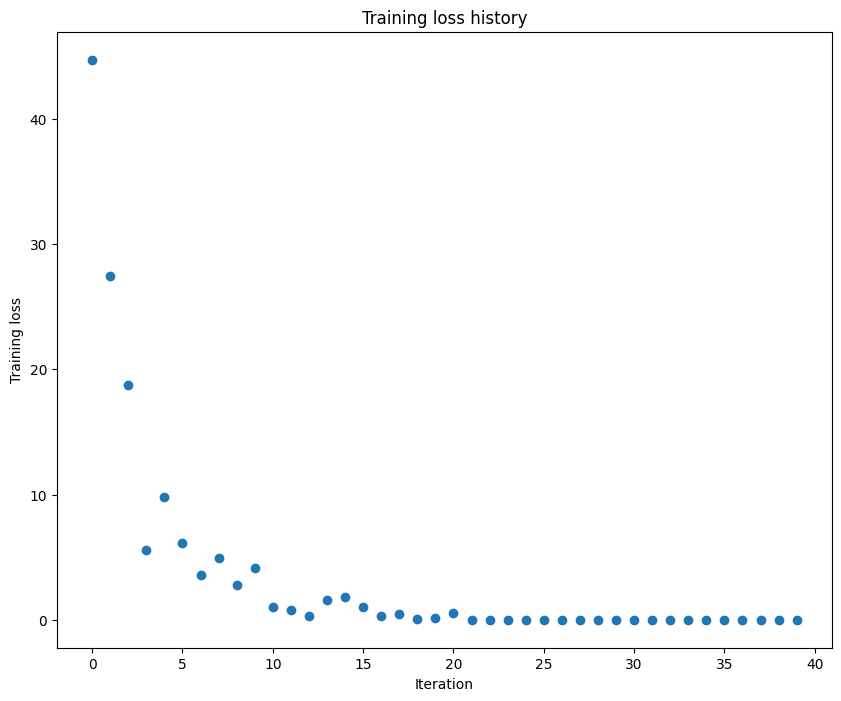

In [ ]:
# TODO: Usar uma rede de 3-camadas para "sobreajustar" (overfit) 50 exemplos de treinamento.

num_train = 50
small_data = {
  'X_train': data['X_train'][:num_train],
  'y_train': data['y_train'][:num_train],
  'X_val': data['X_val'],
  'y_val': data['y_val'],
}

#weight_scale = 1e-2    # experimente variar entre 1e-2 e 5e-2
#learning_rate = 1e-4   # experimente variar entre 1e-4 e 5e-4
weight_scale = 5e-2
learning_rate = 5e-4

model = FullyConnectedNet([100, 100],
              weight_scale=weight_scale, dtype=np.float64)
solver = Solver(model, small_data,
                print_every=10, num_epochs=20, batch_size=25,
                update_rule='sgd',
                optim_config={
                  'learning_rate': learning_rate,
                }
         )
solver.train()

plt.plot(solver.loss_history, 'o')
plt.title('Training loss history')
plt.xlabel('Iteration')
plt.ylabel('Training loss')
plt.show()

(Iteration 1 / 40) loss: 2.369865
(Epoch 0 / 20) train acc: 0.040000; val_acc: 0.099000
(Epoch 1 / 20) train acc: 0.040000; val_acc: 0.099000
(Epoch 2 / 20) train acc: 0.040000; val_acc: 0.101000
(Epoch 3 / 20) train acc: 0.040000; val_acc: 0.103000
(Epoch 4 / 20) train acc: 0.040000; val_acc: 0.110000
(Epoch 5 / 20) train acc: 0.040000; val_acc: 0.110000
(Iteration 11 / 40) loss: 2.335340
(Epoch 6 / 20) train acc: 0.040000; val_acc: 0.113000
(Epoch 7 / 20) train acc: 0.040000; val_acc: 0.110000
(Epoch 8 / 20) train acc: 0.040000; val_acc: 0.112000
(Epoch 9 / 20) train acc: 0.040000; val_acc: 0.110000
(Epoch 10 / 20) train acc: 0.040000; val_acc: 0.113000
(Iteration 21 / 40) loss: 2.293749
(Epoch 11 / 20) train acc: 0.040000; val_acc: 0.115000
(Epoch 12 / 20) train acc: 0.060000; val_acc: 0.114000
(Epoch 13 / 20) train acc: 0.060000; val_acc: 0.116000
(Epoch 14 / 20) train acc: 0.080000; val_acc: 0.115000
(Epoch 15 / 20) train acc: 0.100000; val_acc: 0.118000
(Iteration 31 / 40) loss: 

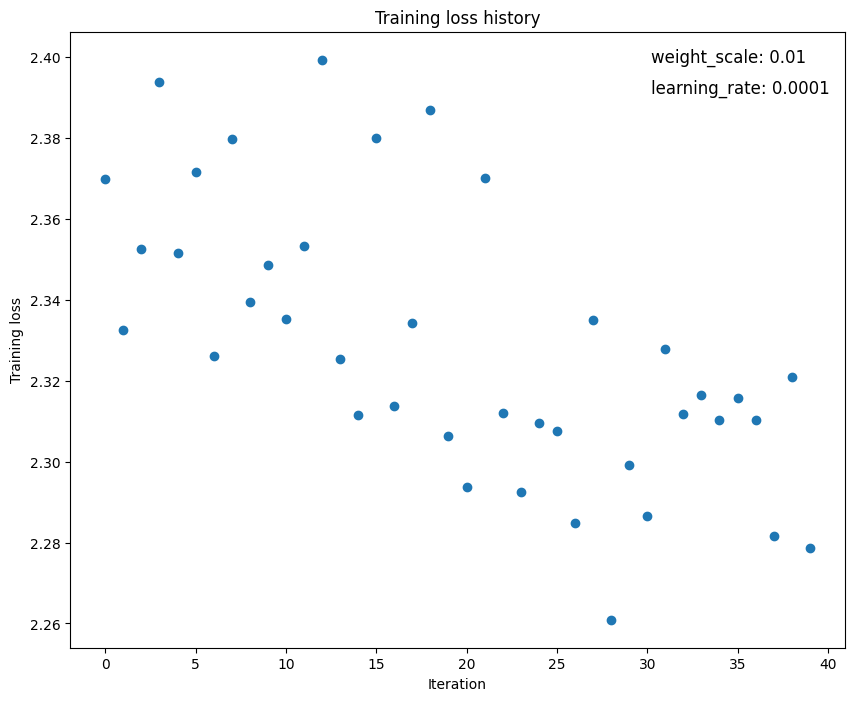

(Iteration 1 / 40) loss: 2.433657
(Epoch 0 / 20) train acc: 0.040000; val_acc: 0.107000
(Epoch 1 / 20) train acc: 0.060000; val_acc: 0.102000
(Epoch 2 / 20) train acc: 0.060000; val_acc: 0.101000
(Epoch 3 / 20) train acc: 0.060000; val_acc: 0.102000
(Epoch 4 / 20) train acc: 0.060000; val_acc: 0.102000
(Epoch 5 / 20) train acc: 0.060000; val_acc: 0.104000
(Iteration 11 / 40) loss: 2.362482
(Epoch 6 / 20) train acc: 0.060000; val_acc: 0.103000
(Epoch 7 / 20) train acc: 0.060000; val_acc: 0.112000
(Epoch 8 / 20) train acc: 0.060000; val_acc: 0.115000
(Epoch 9 / 20) train acc: 0.080000; val_acc: 0.122000
(Epoch 10 / 20) train acc: 0.060000; val_acc: 0.120000
(Iteration 21 / 40) loss: 2.294282
(Epoch 11 / 20) train acc: 0.100000; val_acc: 0.126000
(Epoch 12 / 20) train acc: 0.120000; val_acc: 0.127000
(Epoch 13 / 20) train acc: 0.140000; val_acc: 0.127000
(Epoch 14 / 20) train acc: 0.140000; val_acc: 0.126000
(Epoch 15 / 20) train acc: 0.160000; val_acc: 0.127000
(Iteration 31 / 40) loss: 

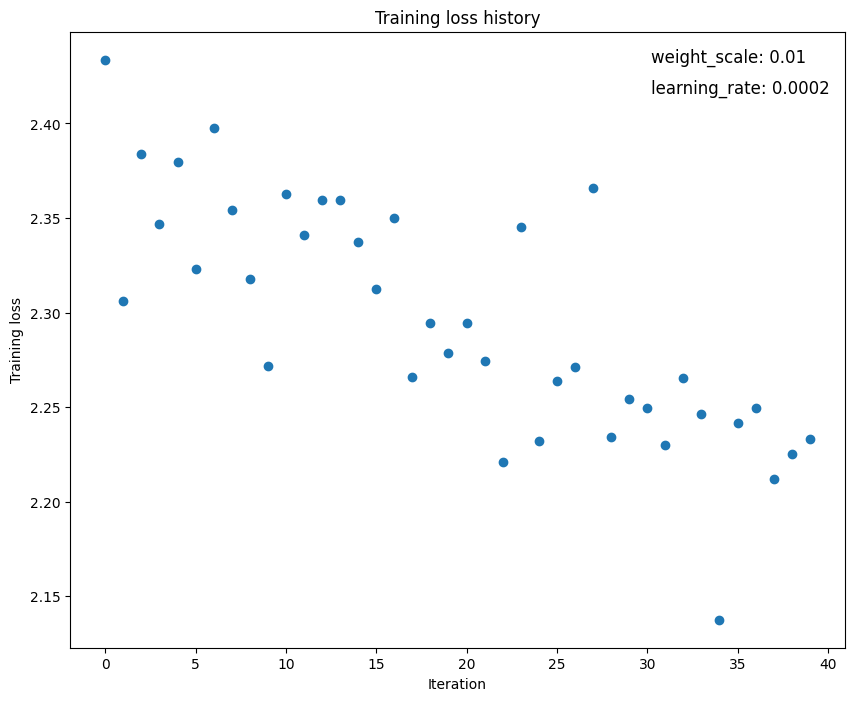

(Iteration 1 / 40) loss: 2.210331
(Epoch 0 / 20) train acc: 0.100000; val_acc: 0.109000
(Epoch 1 / 20) train acc: 0.120000; val_acc: 0.109000
(Epoch 2 / 20) train acc: 0.120000; val_acc: 0.112000
(Epoch 3 / 20) train acc: 0.200000; val_acc: 0.114000
(Epoch 4 / 20) train acc: 0.200000; val_acc: 0.117000
(Epoch 5 / 20) train acc: 0.200000; val_acc: 0.120000
(Iteration 11 / 40) loss: 2.250450
(Epoch 6 / 20) train acc: 0.220000; val_acc: 0.125000
(Epoch 7 / 20) train acc: 0.260000; val_acc: 0.123000
(Epoch 8 / 20) train acc: 0.260000; val_acc: 0.126000
(Epoch 9 / 20) train acc: 0.300000; val_acc: 0.134000
(Epoch 10 / 20) train acc: 0.340000; val_acc: 0.133000
(Iteration 21 / 40) loss: 2.157611
(Epoch 11 / 20) train acc: 0.340000; val_acc: 0.139000
(Epoch 12 / 20) train acc: 0.340000; val_acc: 0.138000
(Epoch 13 / 20) train acc: 0.360000; val_acc: 0.144000
(Epoch 14 / 20) train acc: 0.380000; val_acc: 0.141000
(Epoch 15 / 20) train acc: 0.420000; val_acc: 0.145000
(Iteration 31 / 40) loss: 

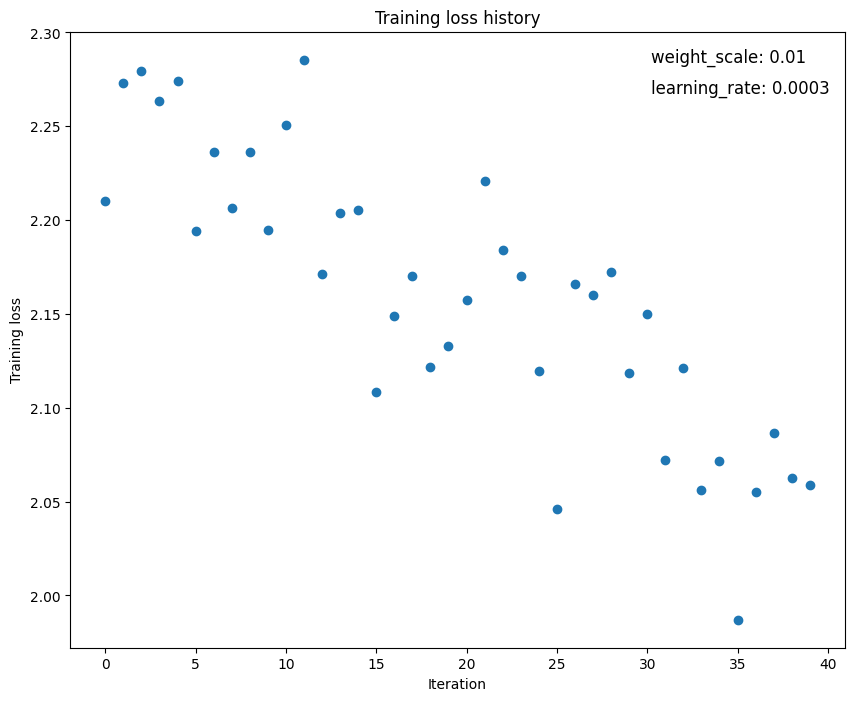

(Iteration 1 / 40) loss: 2.375962
(Epoch 0 / 20) train acc: 0.080000; val_acc: 0.111000
(Epoch 1 / 20) train acc: 0.100000; val_acc: 0.112000
(Epoch 2 / 20) train acc: 0.100000; val_acc: 0.110000
(Epoch 3 / 20) train acc: 0.120000; val_acc: 0.110000
(Epoch 4 / 20) train acc: 0.180000; val_acc: 0.102000
(Epoch 5 / 20) train acc: 0.180000; val_acc: 0.105000
(Iteration 11 / 40) loss: 2.269156
(Epoch 6 / 20) train acc: 0.240000; val_acc: 0.100000
(Epoch 7 / 20) train acc: 0.240000; val_acc: 0.102000
(Epoch 8 / 20) train acc: 0.300000; val_acc: 0.097000
(Epoch 9 / 20) train acc: 0.280000; val_acc: 0.098000
(Epoch 10 / 20) train acc: 0.300000; val_acc: 0.100000
(Iteration 21 / 40) loss: 2.146683
(Epoch 11 / 20) train acc: 0.320000; val_acc: 0.106000
(Epoch 12 / 20) train acc: 0.380000; val_acc: 0.105000
(Epoch 13 / 20) train acc: 0.380000; val_acc: 0.110000
(Epoch 14 / 20) train acc: 0.380000; val_acc: 0.112000
(Epoch 15 / 20) train acc: 0.360000; val_acc: 0.117000
(Iteration 31 / 40) loss: 

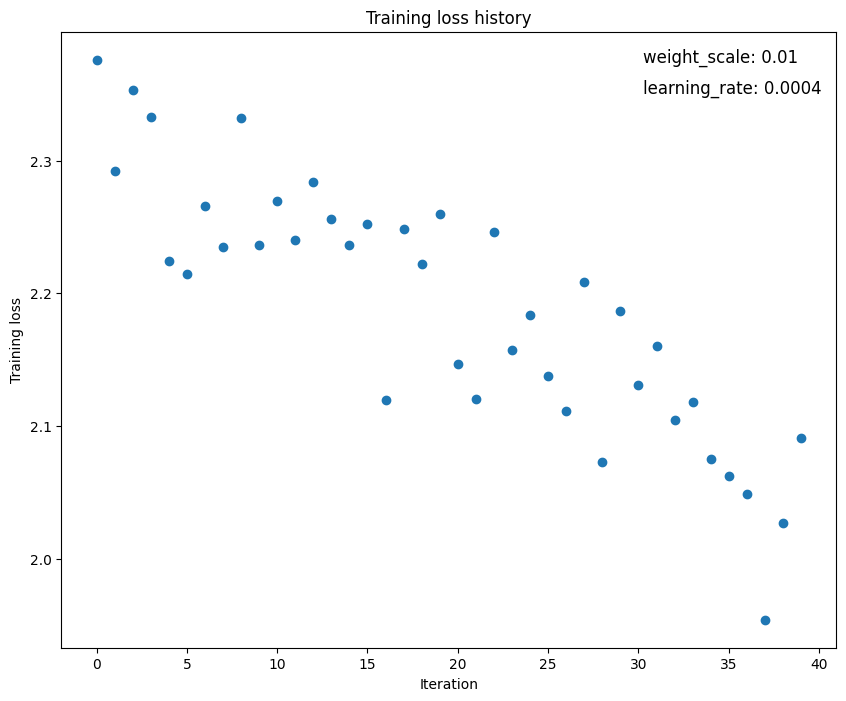

(Iteration 1 / 40) loss: 2.283264
(Epoch 0 / 20) train acc: 0.060000; val_acc: 0.084000
(Epoch 1 / 20) train acc: 0.060000; val_acc: 0.086000
(Epoch 2 / 20) train acc: 0.080000; val_acc: 0.086000
(Epoch 3 / 20) train acc: 0.160000; val_acc: 0.102000
(Epoch 4 / 20) train acc: 0.180000; val_acc: 0.103000
(Epoch 5 / 20) train acc: 0.200000; val_acc: 0.102000
(Iteration 11 / 40) loss: 2.267664
(Epoch 6 / 20) train acc: 0.200000; val_acc: 0.108000
(Epoch 7 / 20) train acc: 0.220000; val_acc: 0.112000
(Epoch 8 / 20) train acc: 0.240000; val_acc: 0.114000
(Epoch 9 / 20) train acc: 0.300000; val_acc: 0.122000
(Epoch 10 / 20) train acc: 0.320000; val_acc: 0.125000
(Iteration 21 / 40) loss: 2.147984
(Epoch 11 / 20) train acc: 0.400000; val_acc: 0.129000
(Epoch 12 / 20) train acc: 0.460000; val_acc: 0.129000
(Epoch 13 / 20) train acc: 0.420000; val_acc: 0.136000
(Epoch 14 / 20) train acc: 0.460000; val_acc: 0.132000
(Epoch 15 / 20) train acc: 0.460000; val_acc: 0.136000
(Iteration 31 / 40) loss: 

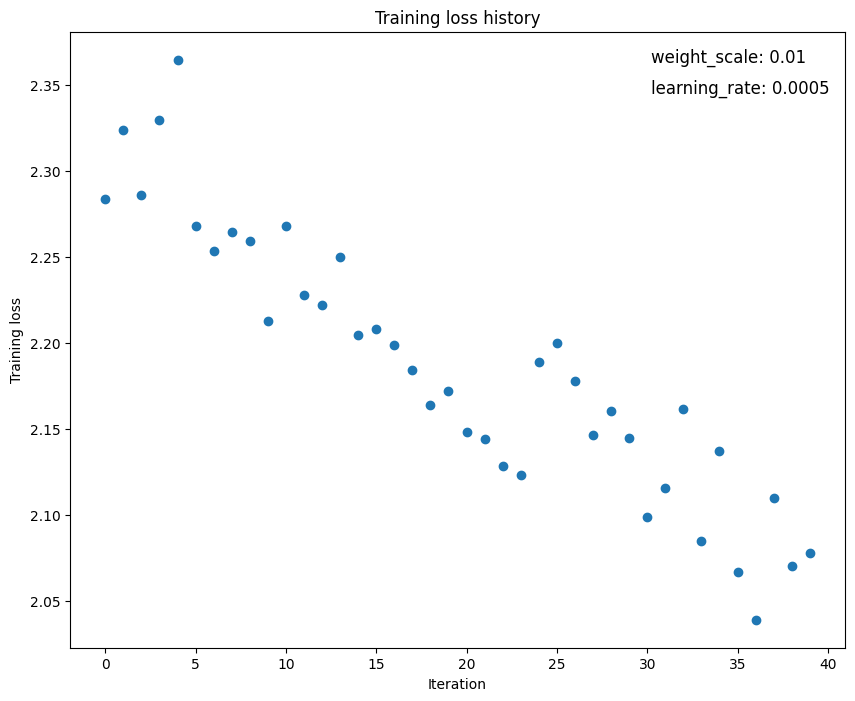

(Iteration 1 / 40) loss: 2.933307
(Epoch 0 / 20) train acc: 0.120000; val_acc: 0.101000
(Epoch 1 / 20) train acc: 0.120000; val_acc: 0.102000
(Epoch 2 / 20) train acc: 0.140000; val_acc: 0.099000
(Epoch 3 / 20) train acc: 0.140000; val_acc: 0.101000
(Epoch 4 / 20) train acc: 0.160000; val_acc: 0.100000
(Epoch 5 / 20) train acc: 0.180000; val_acc: 0.103000
(Iteration 11 / 40) loss: 2.487535
(Epoch 6 / 20) train acc: 0.200000; val_acc: 0.101000
(Epoch 7 / 20) train acc: 0.180000; val_acc: 0.102000
(Epoch 8 / 20) train acc: 0.200000; val_acc: 0.102000
(Epoch 9 / 20) train acc: 0.200000; val_acc: 0.103000
(Epoch 10 / 20) train acc: 0.220000; val_acc: 0.102000
(Iteration 21 / 40) loss: 2.261408
(Epoch 11 / 20) train acc: 0.240000; val_acc: 0.107000
(Epoch 12 / 20) train acc: 0.260000; val_acc: 0.111000
(Epoch 13 / 20) train acc: 0.260000; val_acc: 0.110000
(Epoch 14 / 20) train acc: 0.260000; val_acc: 0.110000
(Epoch 15 / 20) train acc: 0.280000; val_acc: 0.117000
(Iteration 31 / 40) loss: 

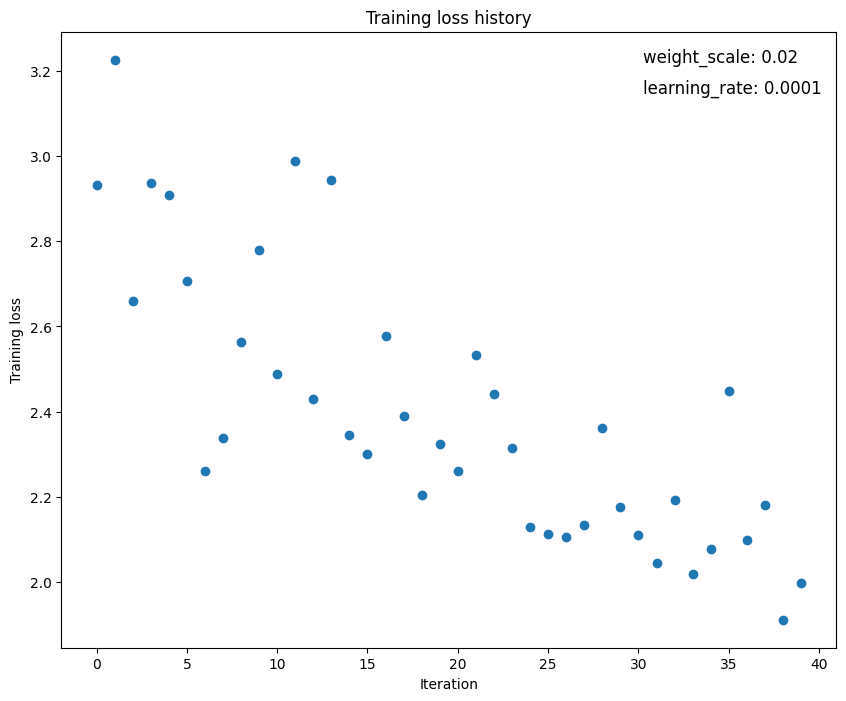

(Iteration 1 / 40) loss: 3.405856
(Epoch 0 / 20) train acc: 0.140000; val_acc: 0.086000
(Epoch 1 / 20) train acc: 0.120000; val_acc: 0.097000
(Epoch 2 / 20) train acc: 0.160000; val_acc: 0.094000
(Epoch 3 / 20) train acc: 0.180000; val_acc: 0.107000
(Epoch 4 / 20) train acc: 0.240000; val_acc: 0.116000
(Epoch 5 / 20) train acc: 0.300000; val_acc: 0.113000
(Iteration 11 / 40) loss: 2.469844
(Epoch 6 / 20) train acc: 0.320000; val_acc: 0.113000
(Epoch 7 / 20) train acc: 0.360000; val_acc: 0.119000
(Epoch 8 / 20) train acc: 0.360000; val_acc: 0.118000
(Epoch 9 / 20) train acc: 0.400000; val_acc: 0.123000
(Epoch 10 / 20) train acc: 0.440000; val_acc: 0.127000
(Iteration 21 / 40) loss: 1.490460
(Epoch 11 / 20) train acc: 0.460000; val_acc: 0.129000
(Epoch 12 / 20) train acc: 0.520000; val_acc: 0.139000
(Epoch 13 / 20) train acc: 0.520000; val_acc: 0.137000
(Epoch 14 / 20) train acc: 0.520000; val_acc: 0.143000
(Epoch 15 / 20) train acc: 0.500000; val_acc: 0.145000
(Iteration 31 / 40) loss: 

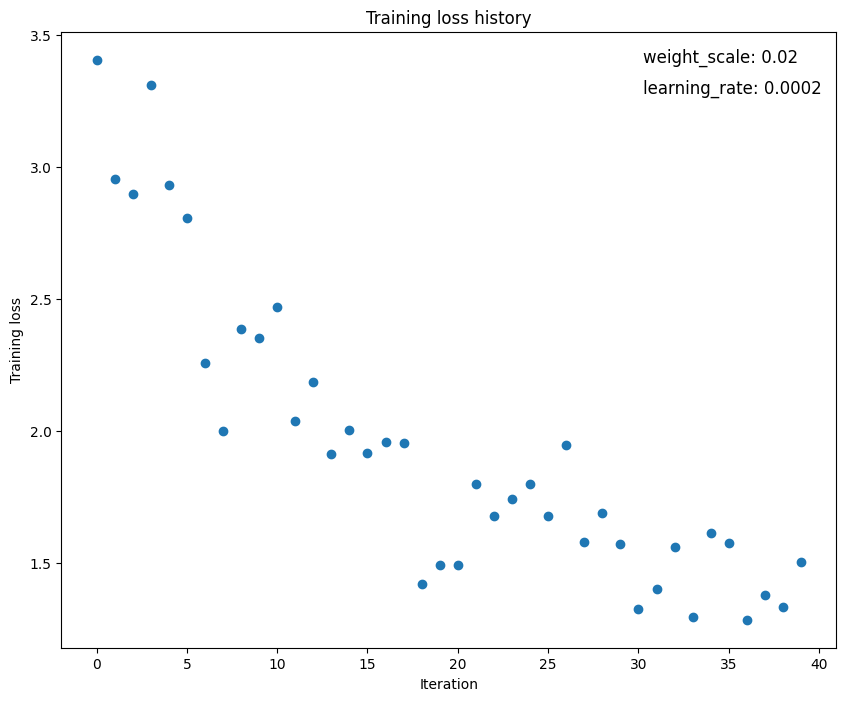

(Iteration 1 / 40) loss: 3.207605
(Epoch 0 / 20) train acc: 0.080000; val_acc: 0.074000
(Epoch 1 / 20) train acc: 0.100000; val_acc: 0.083000
(Epoch 2 / 20) train acc: 0.140000; val_acc: 0.080000
(Epoch 3 / 20) train acc: 0.160000; val_acc: 0.101000
(Epoch 4 / 20) train acc: 0.200000; val_acc: 0.103000
(Epoch 5 / 20) train acc: 0.320000; val_acc: 0.103000
(Iteration 11 / 40) loss: 2.334534
(Epoch 6 / 20) train acc: 0.340000; val_acc: 0.112000
(Epoch 7 / 20) train acc: 0.420000; val_acc: 0.109000
(Epoch 8 / 20) train acc: 0.480000; val_acc: 0.116000
(Epoch 9 / 20) train acc: 0.480000; val_acc: 0.120000
(Epoch 10 / 20) train acc: 0.540000; val_acc: 0.123000
(Iteration 21 / 40) loss: 1.939382
(Epoch 11 / 20) train acc: 0.560000; val_acc: 0.126000
(Epoch 12 / 20) train acc: 0.520000; val_acc: 0.128000
(Epoch 13 / 20) train acc: 0.560000; val_acc: 0.123000
(Epoch 14 / 20) train acc: 0.640000; val_acc: 0.130000
(Epoch 15 / 20) train acc: 0.620000; val_acc: 0.123000
(Iteration 31 / 40) loss: 

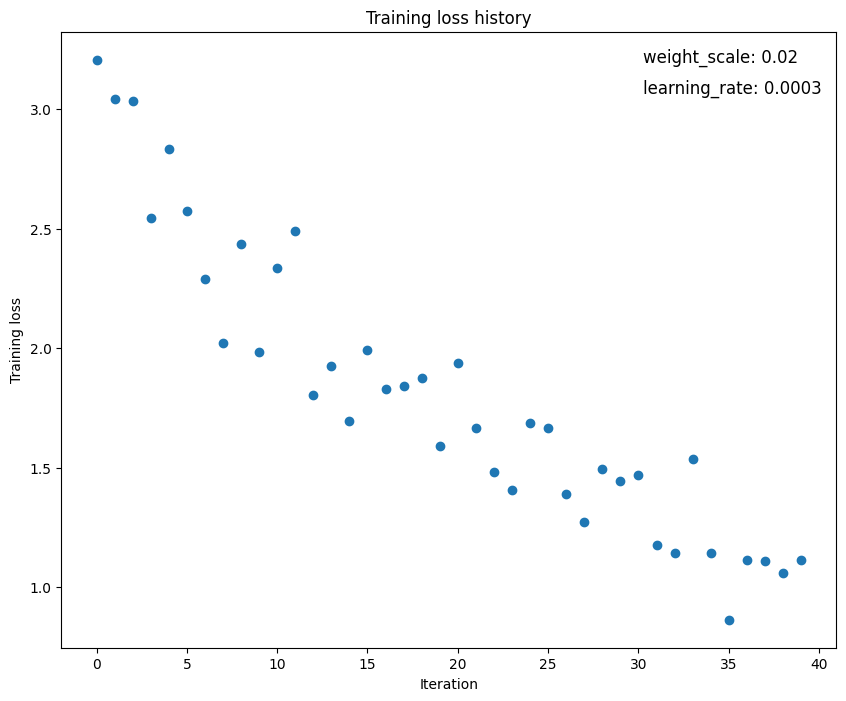

(Iteration 1 / 40) loss: 3.329087
(Epoch 0 / 20) train acc: 0.120000; val_acc: 0.132000
(Epoch 1 / 20) train acc: 0.180000; val_acc: 0.125000
(Epoch 2 / 20) train acc: 0.220000; val_acc: 0.133000
(Epoch 3 / 20) train acc: 0.220000; val_acc: 0.137000
(Epoch 4 / 20) train acc: 0.360000; val_acc: 0.122000
(Epoch 5 / 20) train acc: 0.360000; val_acc: 0.121000
(Iteration 11 / 40) loss: 1.770495
(Epoch 6 / 20) train acc: 0.440000; val_acc: 0.114000
(Epoch 7 / 20) train acc: 0.480000; val_acc: 0.128000
(Epoch 8 / 20) train acc: 0.460000; val_acc: 0.132000
(Epoch 9 / 20) train acc: 0.480000; val_acc: 0.129000
(Epoch 10 / 20) train acc: 0.500000; val_acc: 0.136000
(Iteration 21 / 40) loss: 1.416474
(Epoch 11 / 20) train acc: 0.560000; val_acc: 0.134000
(Epoch 12 / 20) train acc: 0.640000; val_acc: 0.135000
(Epoch 13 / 20) train acc: 0.640000; val_acc: 0.140000
(Epoch 14 / 20) train acc: 0.680000; val_acc: 0.141000
(Epoch 15 / 20) train acc: 0.680000; val_acc: 0.145000
(Iteration 31 / 40) loss: 

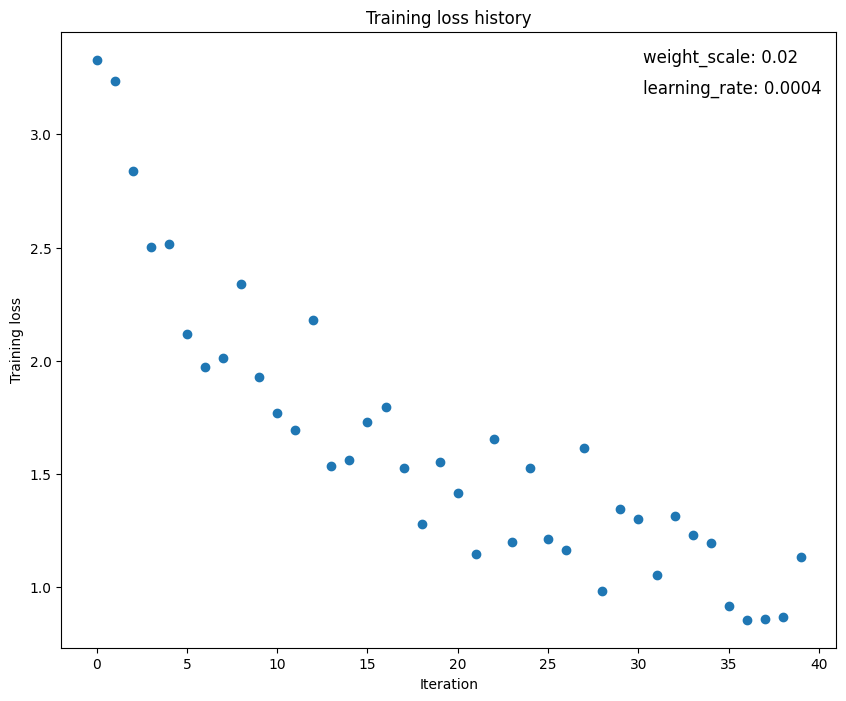

(Iteration 1 / 40) loss: 3.097791
(Epoch 0 / 20) train acc: 0.060000; val_acc: 0.140000
(Epoch 1 / 20) train acc: 0.080000; val_acc: 0.135000
(Epoch 2 / 20) train acc: 0.260000; val_acc: 0.146000
(Epoch 3 / 20) train acc: 0.320000; val_acc: 0.136000
(Epoch 4 / 20) train acc: 0.400000; val_acc: 0.144000
(Epoch 5 / 20) train acc: 0.420000; val_acc: 0.146000
(Iteration 11 / 40) loss: 1.402994
(Epoch 6 / 20) train acc: 0.460000; val_acc: 0.141000
(Epoch 7 / 20) train acc: 0.560000; val_acc: 0.141000
(Epoch 8 / 20) train acc: 0.620000; val_acc: 0.151000
(Epoch 9 / 20) train acc: 0.620000; val_acc: 0.144000
(Epoch 10 / 20) train acc: 0.680000; val_acc: 0.146000
(Iteration 21 / 40) loss: 1.165318
(Epoch 11 / 20) train acc: 0.700000; val_acc: 0.143000
(Epoch 12 / 20) train acc: 0.660000; val_acc: 0.142000
(Epoch 13 / 20) train acc: 0.760000; val_acc: 0.149000
(Epoch 14 / 20) train acc: 0.820000; val_acc: 0.160000
(Epoch 15 / 20) train acc: 0.840000; val_acc: 0.143000
(Iteration 31 / 40) loss: 

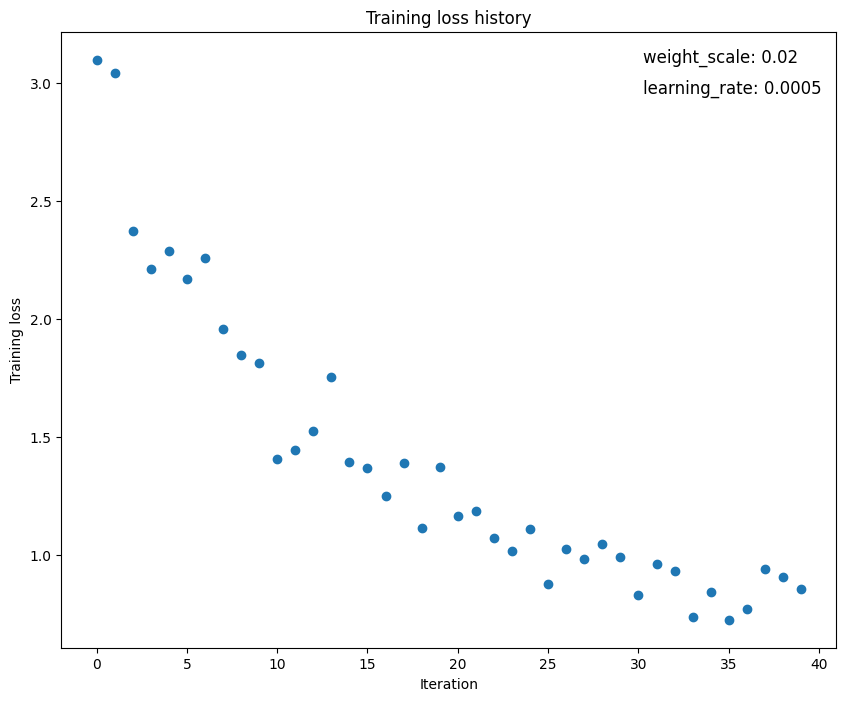

(Iteration 1 / 40) loss: 8.933724
(Epoch 0 / 20) train acc: 0.100000; val_acc: 0.089000
(Epoch 1 / 20) train acc: 0.120000; val_acc: 0.087000
(Epoch 2 / 20) train acc: 0.120000; val_acc: 0.088000
(Epoch 3 / 20) train acc: 0.160000; val_acc: 0.090000
(Epoch 4 / 20) train acc: 0.160000; val_acc: 0.097000
(Epoch 5 / 20) train acc: 0.160000; val_acc: 0.094000
(Iteration 11 / 40) loss: 5.569225
(Epoch 6 / 20) train acc: 0.160000; val_acc: 0.092000
(Epoch 7 / 20) train acc: 0.180000; val_acc: 0.089000
(Epoch 8 / 20) train acc: 0.180000; val_acc: 0.090000
(Epoch 9 / 20) train acc: 0.200000; val_acc: 0.097000
(Epoch 10 / 20) train acc: 0.240000; val_acc: 0.099000
(Iteration 21 / 40) loss: 2.886857
(Epoch 11 / 20) train acc: 0.260000; val_acc: 0.098000
(Epoch 12 / 20) train acc: 0.300000; val_acc: 0.098000
(Epoch 13 / 20) train acc: 0.320000; val_acc: 0.095000
(Epoch 14 / 20) train acc: 0.340000; val_acc: 0.096000
(Epoch 15 / 20) train acc: 0.360000; val_acc: 0.095000
(Iteration 31 / 40) loss: 

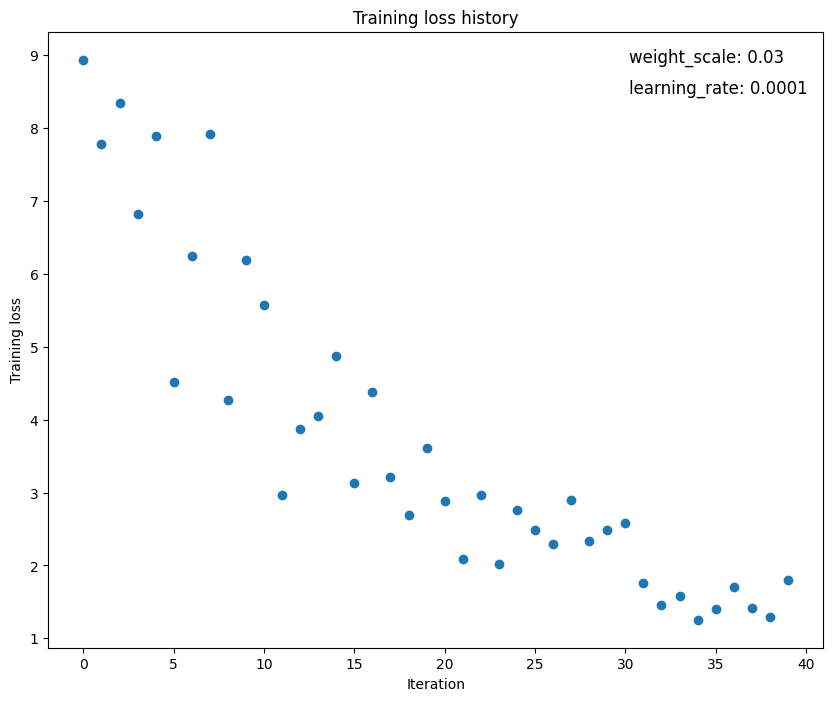

(Iteration 1 / 40) loss: 7.401510
(Epoch 0 / 20) train acc: 0.080000; val_acc: 0.130000
(Epoch 1 / 20) train acc: 0.140000; val_acc: 0.123000
(Epoch 2 / 20) train acc: 0.180000; val_acc: 0.120000
(Epoch 3 / 20) train acc: 0.240000; val_acc: 0.108000
(Epoch 4 / 20) train acc: 0.240000; val_acc: 0.107000
(Epoch 5 / 20) train acc: 0.280000; val_acc: 0.108000
(Iteration 11 / 40) loss: 2.703921
(Epoch 6 / 20) train acc: 0.320000; val_acc: 0.115000
(Epoch 7 / 20) train acc: 0.420000; val_acc: 0.125000
(Epoch 8 / 20) train acc: 0.460000; val_acc: 0.127000
(Epoch 9 / 20) train acc: 0.520000; val_acc: 0.131000
(Epoch 10 / 20) train acc: 0.600000; val_acc: 0.130000
(Iteration 21 / 40) loss: 1.515261
(Epoch 11 / 20) train acc: 0.620000; val_acc: 0.133000
(Epoch 12 / 20) train acc: 0.680000; val_acc: 0.143000
(Epoch 13 / 20) train acc: 0.740000; val_acc: 0.143000
(Epoch 14 / 20) train acc: 0.720000; val_acc: 0.140000
(Epoch 15 / 20) train acc: 0.780000; val_acc: 0.141000
(Iteration 31 / 40) loss: 

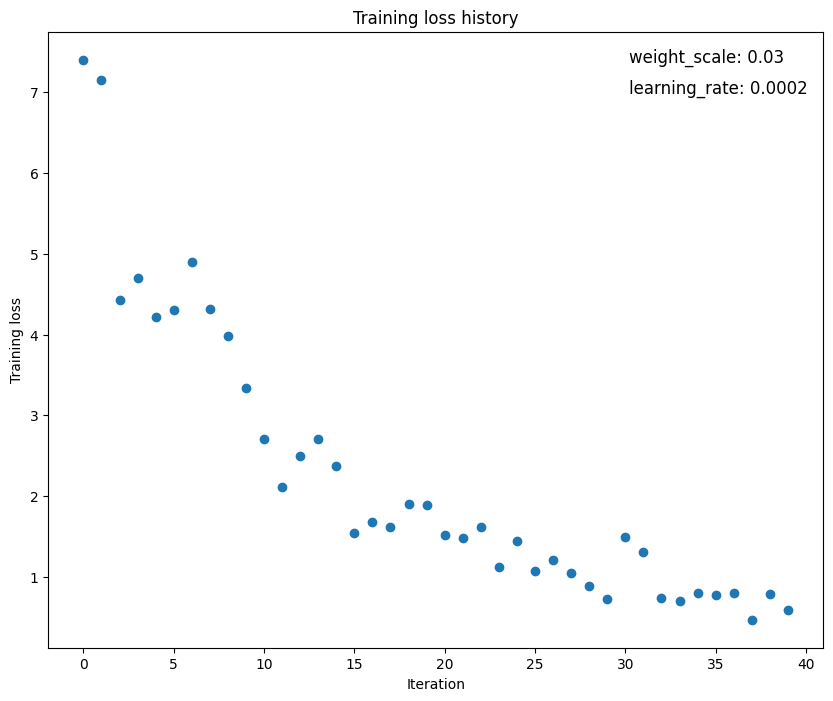

(Iteration 1 / 40) loss: 7.418430
(Epoch 0 / 20) train acc: 0.100000; val_acc: 0.104000
(Epoch 1 / 20) train acc: 0.140000; val_acc: 0.099000
(Epoch 2 / 20) train acc: 0.240000; val_acc: 0.112000
(Epoch 3 / 20) train acc: 0.300000; val_acc: 0.102000
(Epoch 4 / 20) train acc: 0.400000; val_acc: 0.123000
(Epoch 5 / 20) train acc: 0.400000; val_acc: 0.125000
(Iteration 11 / 40) loss: 2.858476
(Epoch 6 / 20) train acc: 0.520000; val_acc: 0.117000
(Epoch 7 / 20) train acc: 0.640000; val_acc: 0.125000
(Epoch 8 / 20) train acc: 0.660000; val_acc: 0.123000
(Epoch 9 / 20) train acc: 0.680000; val_acc: 0.125000
(Epoch 10 / 20) train acc: 0.720000; val_acc: 0.134000
(Iteration 21 / 40) loss: 1.570318
(Epoch 11 / 20) train acc: 0.740000; val_acc: 0.128000
(Epoch 12 / 20) train acc: 0.800000; val_acc: 0.130000
(Epoch 13 / 20) train acc: 0.800000; val_acc: 0.133000
(Epoch 14 / 20) train acc: 0.840000; val_acc: 0.136000
(Epoch 15 / 20) train acc: 0.840000; val_acc: 0.141000
(Iteration 31 / 40) loss: 

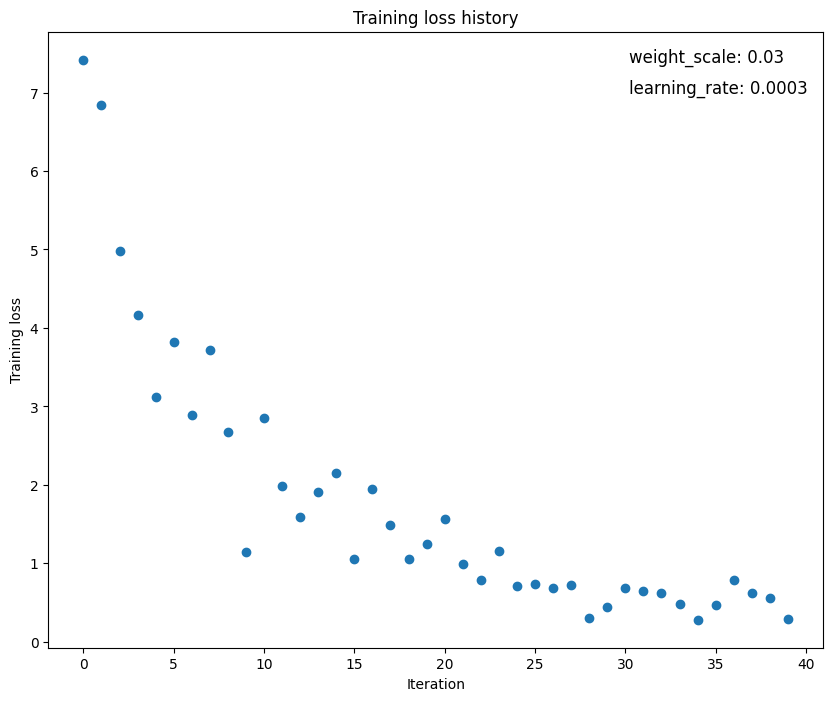

(Iteration 1 / 40) loss: 6.513045
(Epoch 0 / 20) train acc: 0.120000; val_acc: 0.088000
(Epoch 1 / 20) train acc: 0.120000; val_acc: 0.086000
(Epoch 2 / 20) train acc: 0.280000; val_acc: 0.093000
(Epoch 3 / 20) train acc: 0.300000; val_acc: 0.109000
(Epoch 4 / 20) train acc: 0.420000; val_acc: 0.120000
(Epoch 5 / 20) train acc: 0.580000; val_acc: 0.100000
(Iteration 11 / 40) loss: 1.922549
(Epoch 6 / 20) train acc: 0.660000; val_acc: 0.097000
(Epoch 7 / 20) train acc: 0.660000; val_acc: 0.110000
(Epoch 8 / 20) train acc: 0.780000; val_acc: 0.107000
(Epoch 9 / 20) train acc: 0.800000; val_acc: 0.108000
(Epoch 10 / 20) train acc: 0.840000; val_acc: 0.098000
(Iteration 21 / 40) loss: 0.635531
(Epoch 11 / 20) train acc: 0.880000; val_acc: 0.111000
(Epoch 12 / 20) train acc: 0.880000; val_acc: 0.105000
(Epoch 13 / 20) train acc: 0.900000; val_acc: 0.113000
(Epoch 14 / 20) train acc: 0.960000; val_acc: 0.112000
(Epoch 15 / 20) train acc: 0.980000; val_acc: 0.113000
(Iteration 31 / 40) loss: 

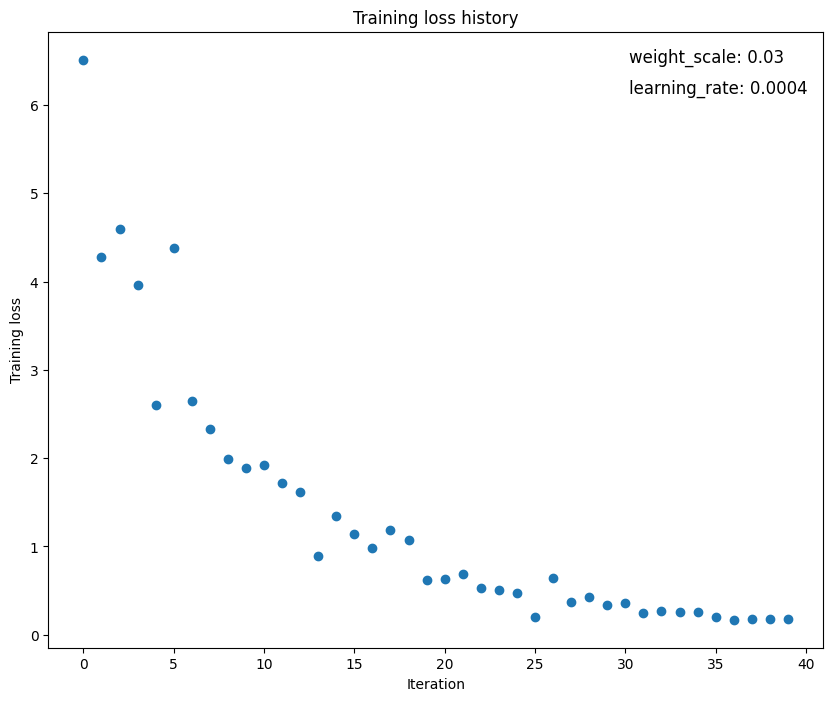

(Iteration 1 / 40) loss: 5.814871
(Epoch 0 / 20) train acc: 0.140000; val_acc: 0.094000
(Epoch 1 / 20) train acc: 0.200000; val_acc: 0.098000
(Epoch 2 / 20) train acc: 0.280000; val_acc: 0.119000
(Epoch 3 / 20) train acc: 0.360000; val_acc: 0.105000
(Epoch 4 / 20) train acc: 0.460000; val_acc: 0.122000
(Epoch 5 / 20) train acc: 0.540000; val_acc: 0.123000
(Iteration 11 / 40) loss: 1.734090
(Epoch 6 / 20) train acc: 0.620000; val_acc: 0.122000
(Epoch 7 / 20) train acc: 0.720000; val_acc: 0.110000
(Epoch 8 / 20) train acc: 0.820000; val_acc: 0.114000
(Epoch 9 / 20) train acc: 0.780000; val_acc: 0.117000
(Epoch 10 / 20) train acc: 0.920000; val_acc: 0.124000
(Iteration 21 / 40) loss: 0.815589
(Epoch 11 / 20) train acc: 0.900000; val_acc: 0.121000
(Epoch 12 / 20) train acc: 0.940000; val_acc: 0.129000
(Epoch 13 / 20) train acc: 1.000000; val_acc: 0.127000
(Epoch 14 / 20) train acc: 0.980000; val_acc: 0.127000
(Epoch 15 / 20) train acc: 0.980000; val_acc: 0.126000
(Iteration 31 / 40) loss: 

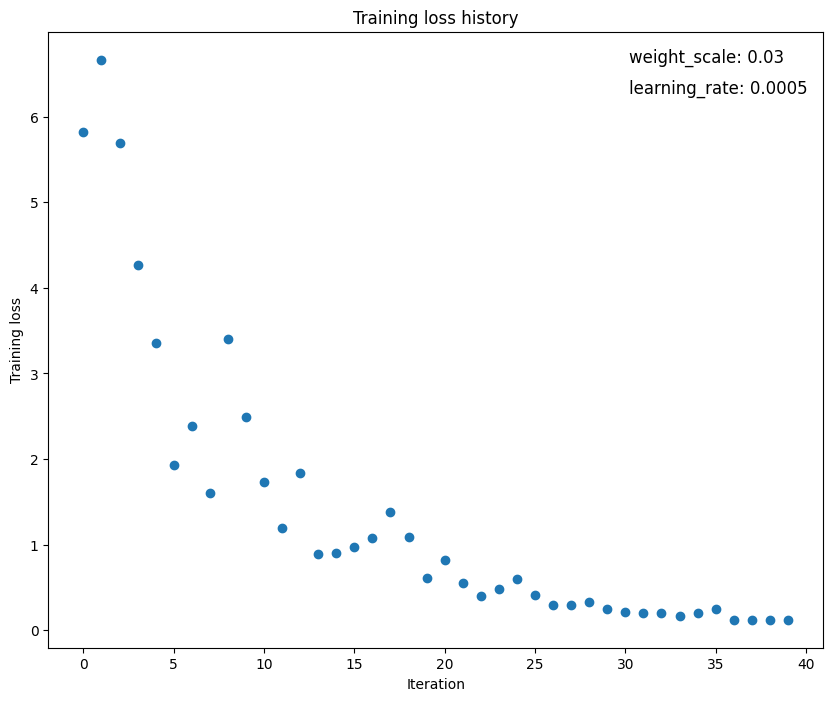

(Iteration 1 / 40) loss: 10.823872
(Epoch 0 / 20) train acc: 0.080000; val_acc: 0.105000
(Epoch 1 / 20) train acc: 0.120000; val_acc: 0.101000
(Epoch 2 / 20) train acc: 0.120000; val_acc: 0.104000
(Epoch 3 / 20) train acc: 0.160000; val_acc: 0.105000
(Epoch 4 / 20) train acc: 0.200000; val_acc: 0.100000
(Epoch 5 / 20) train acc: 0.260000; val_acc: 0.095000
(Iteration 11 / 40) loss: 5.950326
(Epoch 6 / 20) train acc: 0.320000; val_acc: 0.099000
(Epoch 7 / 20) train acc: 0.320000; val_acc: 0.098000
(Epoch 8 / 20) train acc: 0.340000; val_acc: 0.099000
(Epoch 9 / 20) train acc: 0.440000; val_acc: 0.098000
(Epoch 10 / 20) train acc: 0.400000; val_acc: 0.094000
(Iteration 21 / 40) loss: 3.005220
(Epoch 11 / 20) train acc: 0.440000; val_acc: 0.089000
(Epoch 12 / 20) train acc: 0.480000; val_acc: 0.095000
(Epoch 13 / 20) train acc: 0.520000; val_acc: 0.096000
(Epoch 14 / 20) train acc: 0.540000; val_acc: 0.094000
(Epoch 15 / 20) train acc: 0.620000; val_acc: 0.100000
(Iteration 31 / 40) loss:

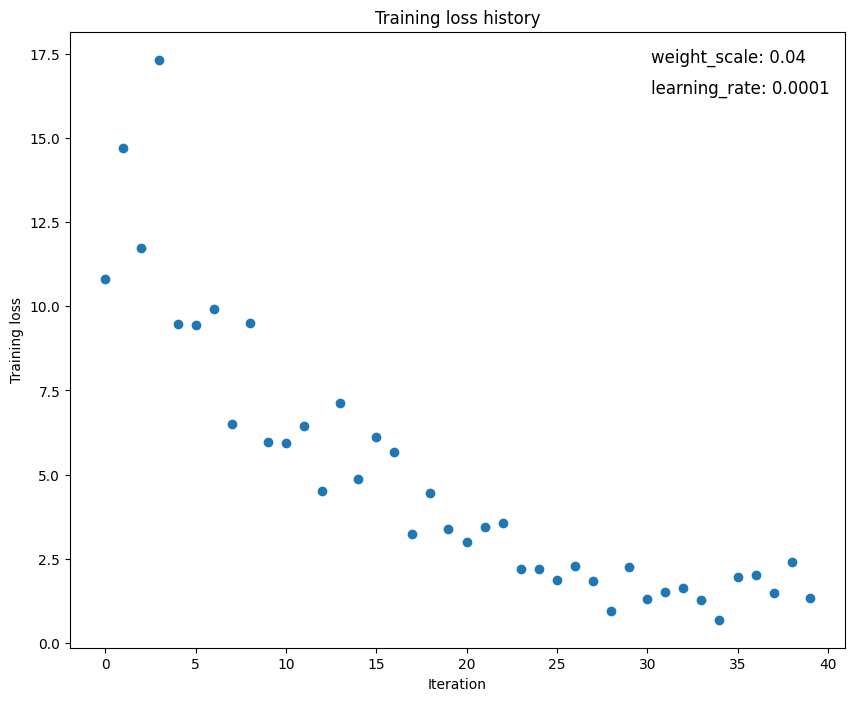

(Iteration 1 / 40) loss: 10.780030
(Epoch 0 / 20) train acc: 0.100000; val_acc: 0.110000
(Epoch 1 / 20) train acc: 0.120000; val_acc: 0.112000
(Epoch 2 / 20) train acc: 0.180000; val_acc: 0.130000
(Epoch 3 / 20) train acc: 0.280000; val_acc: 0.132000
(Epoch 4 / 20) train acc: 0.300000; val_acc: 0.132000
(Epoch 5 / 20) train acc: 0.380000; val_acc: 0.147000
(Iteration 11 / 40) loss: 5.794094
(Epoch 6 / 20) train acc: 0.480000; val_acc: 0.152000
(Epoch 7 / 20) train acc: 0.580000; val_acc: 0.137000
(Epoch 8 / 20) train acc: 0.520000; val_acc: 0.140000
(Epoch 9 / 20) train acc: 0.660000; val_acc: 0.140000
(Epoch 10 / 20) train acc: 0.680000; val_acc: 0.141000
(Iteration 21 / 40) loss: 1.237506
(Epoch 11 / 20) train acc: 0.680000; val_acc: 0.138000
(Epoch 12 / 20) train acc: 0.700000; val_acc: 0.141000
(Epoch 13 / 20) train acc: 0.780000; val_acc: 0.141000
(Epoch 14 / 20) train acc: 0.800000; val_acc: 0.138000
(Epoch 15 / 20) train acc: 0.860000; val_acc: 0.141000
(Iteration 31 / 40) loss:

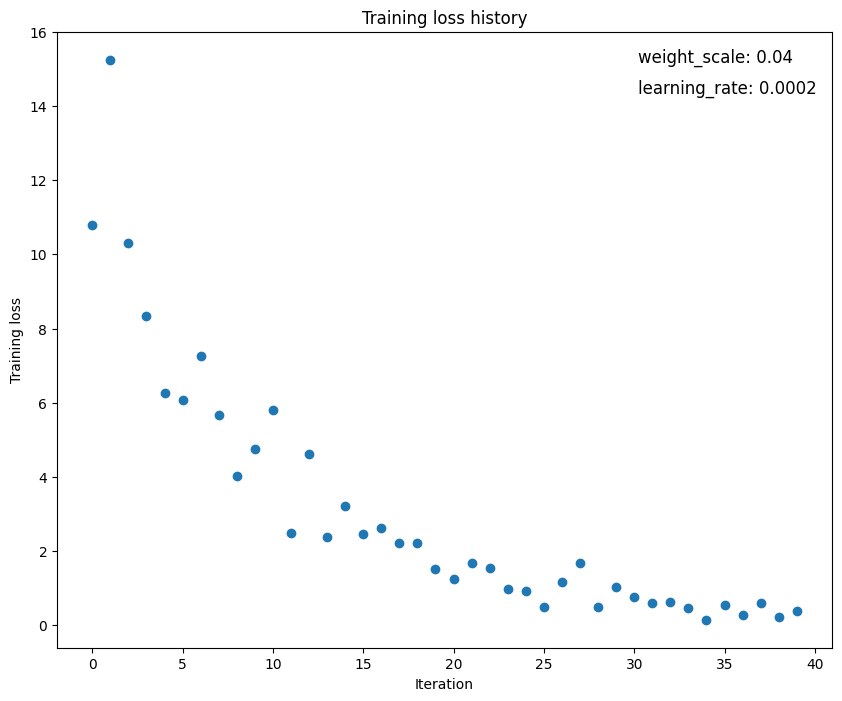

(Iteration 1 / 40) loss: 20.621086
(Epoch 0 / 20) train acc: 0.140000; val_acc: 0.082000
(Epoch 1 / 20) train acc: 0.160000; val_acc: 0.099000
(Epoch 2 / 20) train acc: 0.260000; val_acc: 0.103000
(Epoch 3 / 20) train acc: 0.440000; val_acc: 0.106000
(Epoch 4 / 20) train acc: 0.480000; val_acc: 0.117000
(Epoch 5 / 20) train acc: 0.540000; val_acc: 0.118000
(Iteration 11 / 40) loss: 2.020044
(Epoch 6 / 20) train acc: 0.700000; val_acc: 0.121000
(Epoch 7 / 20) train acc: 0.700000; val_acc: 0.119000
(Epoch 8 / 20) train acc: 0.920000; val_acc: 0.126000
(Epoch 9 / 20) train acc: 0.940000; val_acc: 0.128000
(Epoch 10 / 20) train acc: 0.920000; val_acc: 0.127000
(Iteration 21 / 40) loss: 0.285544
(Epoch 11 / 20) train acc: 0.940000; val_acc: 0.129000
(Epoch 12 / 20) train acc: 0.920000; val_acc: 0.128000
(Epoch 13 / 20) train acc: 0.860000; val_acc: 0.119000
(Epoch 14 / 20) train acc: 1.000000; val_acc: 0.129000
(Epoch 15 / 20) train acc: 1.000000; val_acc: 0.130000
(Iteration 31 / 40) loss:

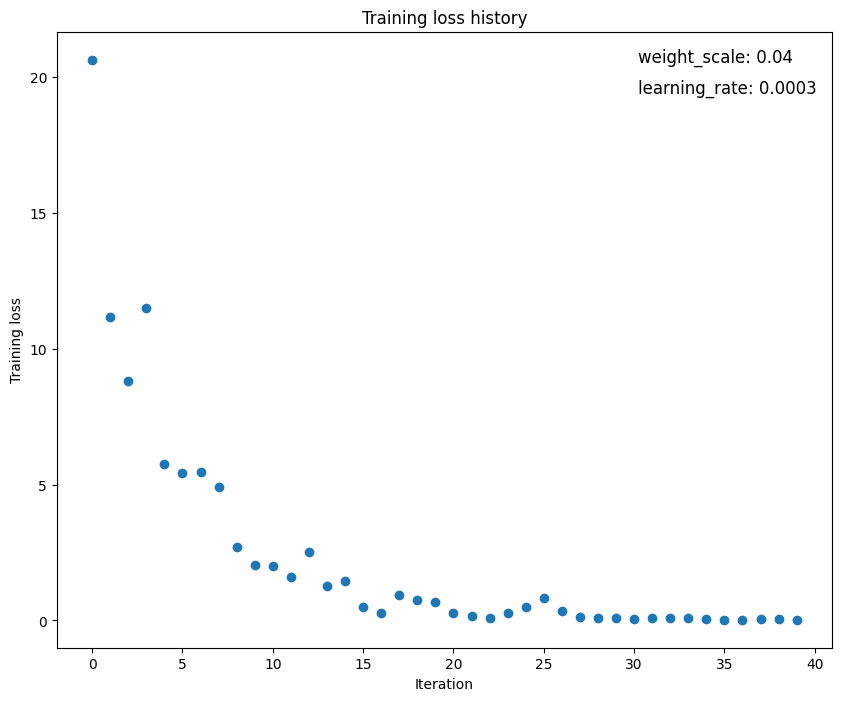

(Iteration 1 / 40) loss: 16.607541
(Epoch 0 / 20) train acc: 0.200000; val_acc: 0.113000
(Epoch 1 / 20) train acc: 0.300000; val_acc: 0.108000
(Epoch 2 / 20) train acc: 0.360000; val_acc: 0.118000
(Epoch 3 / 20) train acc: 0.440000; val_acc: 0.117000
(Epoch 4 / 20) train acc: 0.620000; val_acc: 0.116000
(Epoch 5 / 20) train acc: 0.740000; val_acc: 0.099000
(Iteration 11 / 40) loss: 2.790597
(Epoch 6 / 20) train acc: 0.820000; val_acc: 0.107000
(Epoch 7 / 20) train acc: 0.840000; val_acc: 0.108000
(Epoch 8 / 20) train acc: 0.880000; val_acc: 0.104000
(Epoch 9 / 20) train acc: 0.920000; val_acc: 0.100000
(Epoch 10 / 20) train acc: 0.960000; val_acc: 0.103000
(Iteration 21 / 40) loss: 0.381048
(Epoch 11 / 20) train acc: 0.980000; val_acc: 0.102000
(Epoch 12 / 20) train acc: 0.960000; val_acc: 0.101000
(Epoch 13 / 20) train acc: 0.980000; val_acc: 0.101000
(Epoch 14 / 20) train acc: 0.980000; val_acc: 0.102000
(Epoch 15 / 20) train acc: 0.980000; val_acc: 0.111000
(Iteration 31 / 40) loss:

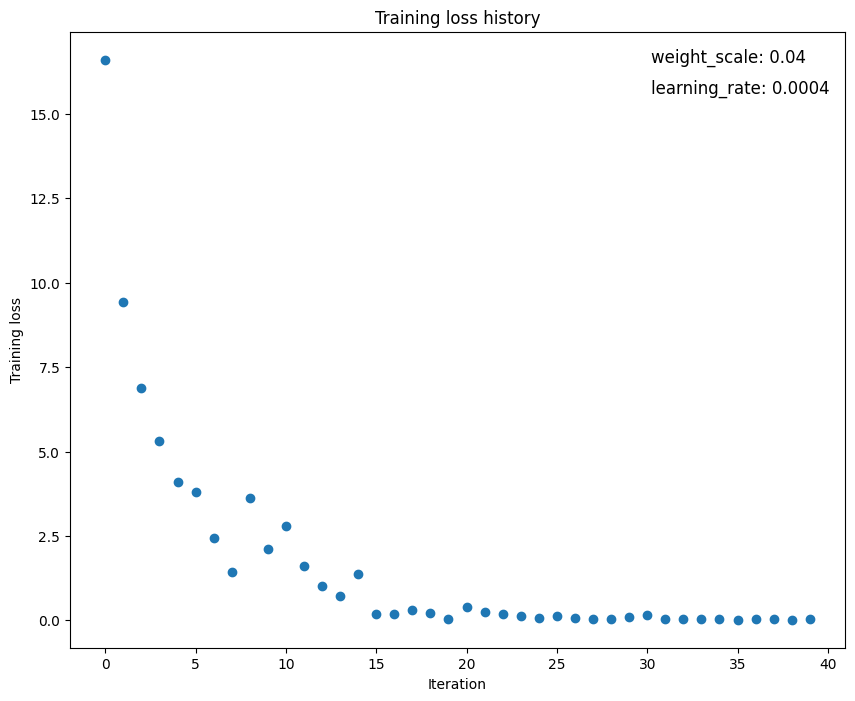

(Iteration 1 / 40) loss: 15.435587
(Epoch 0 / 20) train acc: 0.260000; val_acc: 0.103000
(Epoch 1 / 20) train acc: 0.280000; val_acc: 0.109000
(Epoch 2 / 20) train acc: 0.380000; val_acc: 0.101000
(Epoch 3 / 20) train acc: 0.580000; val_acc: 0.108000
(Epoch 4 / 20) train acc: 0.660000; val_acc: 0.124000
(Epoch 5 / 20) train acc: 0.820000; val_acc: 0.115000
(Iteration 11 / 40) loss: 0.317440
(Epoch 6 / 20) train acc: 0.860000; val_acc: 0.115000
(Epoch 7 / 20) train acc: 0.900000; val_acc: 0.115000
(Epoch 8 / 20) train acc: 0.920000; val_acc: 0.111000
(Epoch 9 / 20) train acc: 0.940000; val_acc: 0.107000
(Epoch 10 / 20) train acc: 0.960000; val_acc: 0.112000
(Iteration 21 / 40) loss: 0.289487
(Epoch 11 / 20) train acc: 0.940000; val_acc: 0.112000
(Epoch 12 / 20) train acc: 0.960000; val_acc: 0.112000
(Epoch 13 / 20) train acc: 0.960000; val_acc: 0.118000
(Epoch 14 / 20) train acc: 0.960000; val_acc: 0.107000
(Epoch 15 / 20) train acc: 0.980000; val_acc: 0.106000
(Iteration 31 / 40) loss:

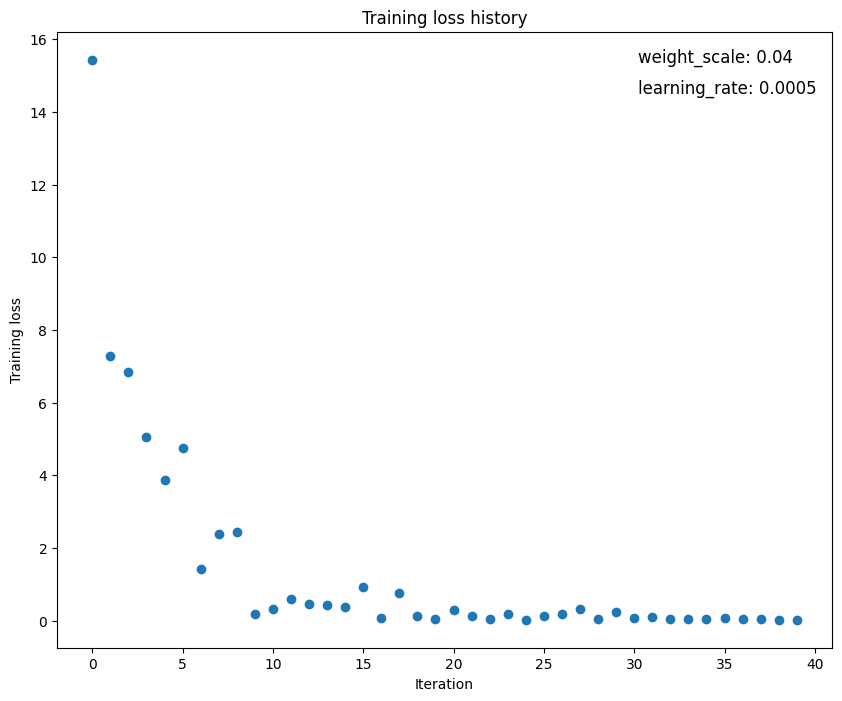

(Iteration 1 / 40) loss: 25.414393
(Epoch 0 / 20) train acc: 0.120000; val_acc: 0.112000
(Epoch 1 / 20) train acc: 0.100000; val_acc: 0.117000
(Epoch 2 / 20) train acc: 0.140000; val_acc: 0.118000
(Epoch 3 / 20) train acc: 0.180000; val_acc: 0.125000
(Epoch 4 / 20) train acc: 0.260000; val_acc: 0.123000
(Epoch 5 / 20) train acc: 0.300000; val_acc: 0.121000
(Iteration 11 / 40) loss: 13.087829
(Epoch 6 / 20) train acc: 0.320000; val_acc: 0.131000
(Epoch 7 / 20) train acc: 0.420000; val_acc: 0.124000
(Epoch 8 / 20) train acc: 0.440000; val_acc: 0.133000
(Epoch 9 / 20) train acc: 0.500000; val_acc: 0.136000
(Epoch 10 / 20) train acc: 0.560000; val_acc: 0.134000
(Iteration 21 / 40) loss: 3.189765
(Epoch 11 / 20) train acc: 0.640000; val_acc: 0.135000
(Epoch 12 / 20) train acc: 0.660000; val_acc: 0.136000
(Epoch 13 / 20) train acc: 0.640000; val_acc: 0.136000
(Epoch 14 / 20) train acc: 0.720000; val_acc: 0.130000
(Epoch 15 / 20) train acc: 0.800000; val_acc: 0.134000
(Iteration 31 / 40) loss

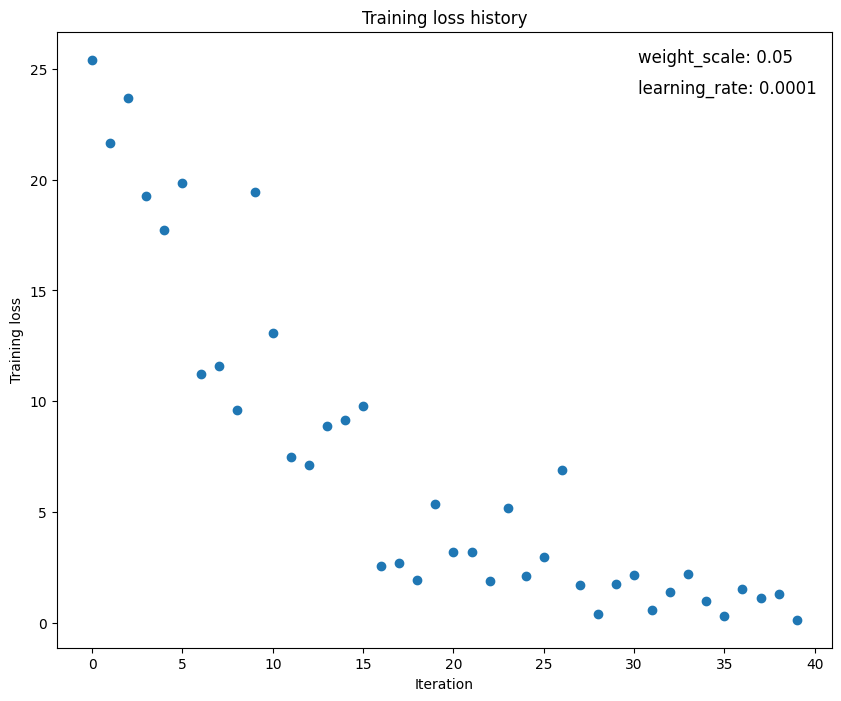

(Iteration 1 / 40) loss: 35.812063
(Epoch 0 / 20) train acc: 0.200000; val_acc: 0.108000
(Epoch 1 / 20) train acc: 0.240000; val_acc: 0.116000
(Epoch 2 / 20) train acc: 0.260000; val_acc: 0.106000
(Epoch 3 / 20) train acc: 0.320000; val_acc: 0.111000
(Epoch 4 / 20) train acc: 0.340000; val_acc: 0.118000
(Epoch 5 / 20) train acc: 0.440000; val_acc: 0.100000
(Iteration 11 / 40) loss: 6.607487
(Epoch 6 / 20) train acc: 0.480000; val_acc: 0.119000
(Epoch 7 / 20) train acc: 0.620000; val_acc: 0.119000
(Epoch 8 / 20) train acc: 0.680000; val_acc: 0.116000
(Epoch 9 / 20) train acc: 0.760000; val_acc: 0.118000
(Epoch 10 / 20) train acc: 0.780000; val_acc: 0.124000
(Iteration 21 / 40) loss: 0.276626
(Epoch 11 / 20) train acc: 0.800000; val_acc: 0.123000
(Epoch 12 / 20) train acc: 0.840000; val_acc: 0.117000
(Epoch 13 / 20) train acc: 0.860000; val_acc: 0.117000
(Epoch 14 / 20) train acc: 0.880000; val_acc: 0.120000
(Epoch 15 / 20) train acc: 0.900000; val_acc: 0.129000
(Iteration 31 / 40) loss:

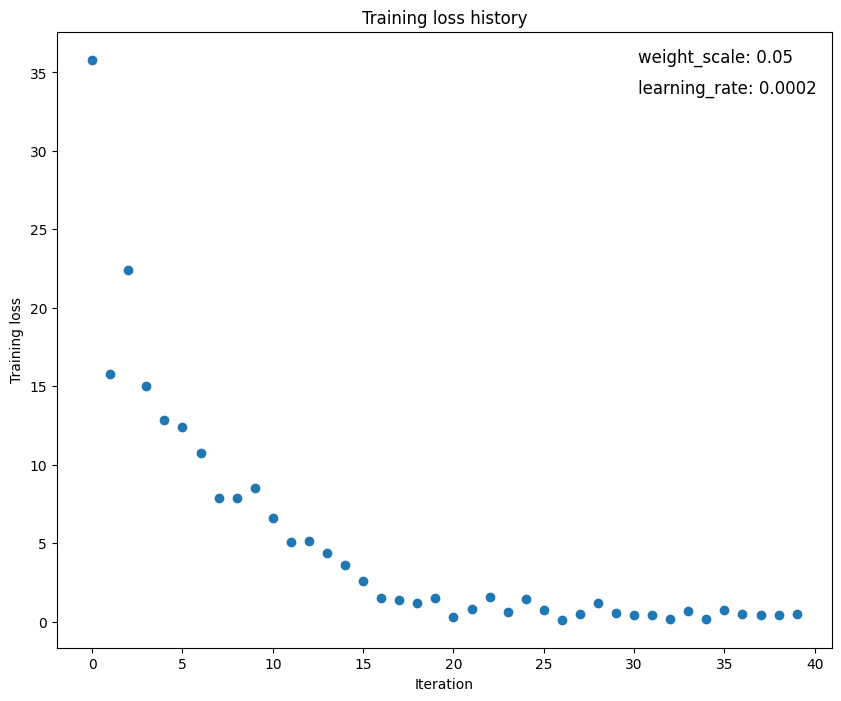

(Iteration 1 / 40) loss: 27.930823
(Epoch 0 / 20) train acc: 0.200000; val_acc: 0.111000
(Epoch 1 / 20) train acc: 0.220000; val_acc: 0.122000
(Epoch 2 / 20) train acc: 0.340000; val_acc: 0.114000
(Epoch 3 / 20) train acc: 0.400000; val_acc: 0.138000
(Epoch 4 / 20) train acc: 0.600000; val_acc: 0.127000
(Epoch 5 / 20) train acc: 0.620000; val_acc: 0.137000
(Iteration 11 / 40) loss: 6.320331
(Epoch 6 / 20) train acc: 0.680000; val_acc: 0.134000
(Epoch 7 / 20) train acc: 0.800000; val_acc: 0.139000
(Epoch 8 / 20) train acc: 0.860000; val_acc: 0.133000
(Epoch 9 / 20) train acc: 0.900000; val_acc: 0.126000
(Epoch 10 / 20) train acc: 0.900000; val_acc: 0.143000
(Iteration 21 / 40) loss: 0.286333
(Epoch 11 / 20) train acc: 0.940000; val_acc: 0.139000
(Epoch 12 / 20) train acc: 0.920000; val_acc: 0.133000
(Epoch 13 / 20) train acc: 0.960000; val_acc: 0.139000
(Epoch 14 / 20) train acc: 0.960000; val_acc: 0.139000
(Epoch 15 / 20) train acc: 0.980000; val_acc: 0.139000
(Iteration 31 / 40) loss:

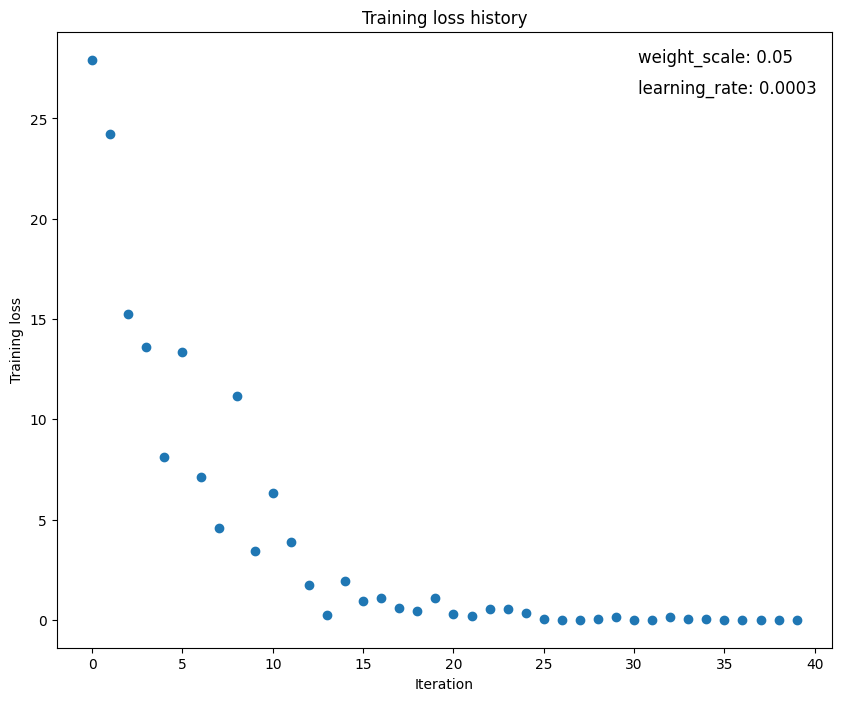

(Iteration 1 / 40) loss: 40.659336
(Epoch 0 / 20) train acc: 0.160000; val_acc: 0.106000
(Epoch 1 / 20) train acc: 0.240000; val_acc: 0.120000
(Epoch 2 / 20) train acc: 0.320000; val_acc: 0.123000
(Epoch 3 / 20) train acc: 0.460000; val_acc: 0.123000
(Epoch 4 / 20) train acc: 0.560000; val_acc: 0.109000
(Epoch 5 / 20) train acc: 0.680000; val_acc: 0.111000
(Iteration 11 / 40) loss: 2.856898
(Epoch 6 / 20) train acc: 0.660000; val_acc: 0.124000
(Epoch 7 / 20) train acc: 0.780000; val_acc: 0.126000
(Epoch 8 / 20) train acc: 0.860000; val_acc: 0.117000
(Epoch 9 / 20) train acc: 0.920000; val_acc: 0.118000
(Epoch 10 / 20) train acc: 0.900000; val_acc: 0.119000
(Iteration 21 / 40) loss: 0.469127
(Epoch 11 / 20) train acc: 0.980000; val_acc: 0.118000
(Epoch 12 / 20) train acc: 1.000000; val_acc: 0.124000
(Epoch 13 / 20) train acc: 1.000000; val_acc: 0.125000
(Epoch 14 / 20) train acc: 1.000000; val_acc: 0.125000
(Epoch 15 / 20) train acc: 1.000000; val_acc: 0.127000
(Iteration 31 / 40) loss:

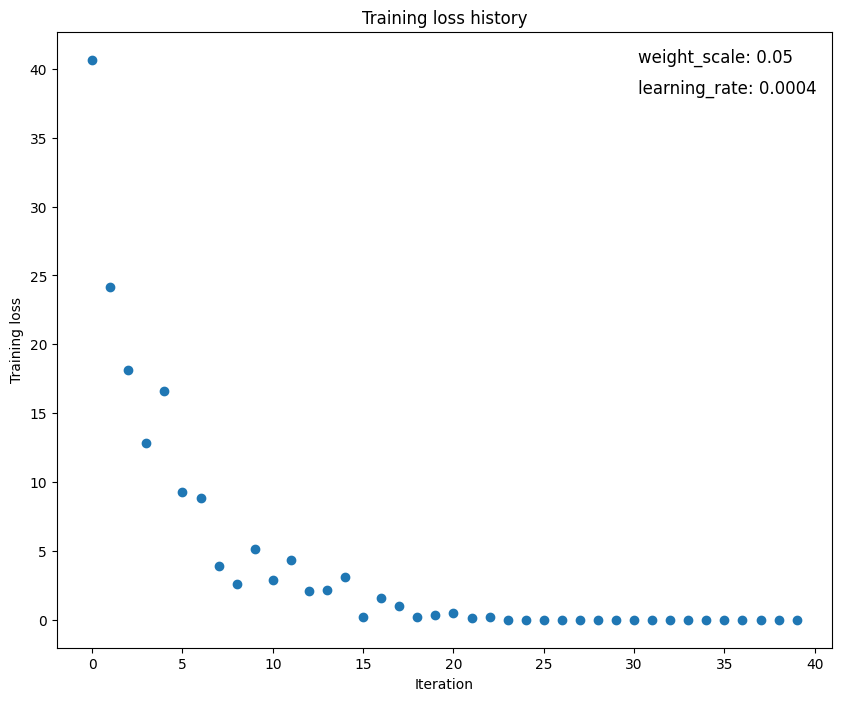

(Iteration 1 / 40) loss: 25.768020
(Epoch 0 / 20) train acc: 0.100000; val_acc: 0.103000
(Epoch 1 / 20) train acc: 0.220000; val_acc: 0.102000
(Epoch 2 / 20) train acc: 0.280000; val_acc: 0.108000
(Epoch 3 / 20) train acc: 0.320000; val_acc: 0.125000
(Epoch 4 / 20) train acc: 0.600000; val_acc: 0.133000
(Epoch 5 / 20) train acc: 0.720000; val_acc: 0.152000
(Iteration 11 / 40) loss: 1.277811
(Epoch 6 / 20) train acc: 0.700000; val_acc: 0.140000
(Epoch 7 / 20) train acc: 0.820000; val_acc: 0.156000
(Epoch 8 / 20) train acc: 0.920000; val_acc: 0.148000
(Epoch 9 / 20) train acc: 0.920000; val_acc: 0.150000
(Epoch 10 / 20) train acc: 0.940000; val_acc: 0.149000
(Iteration 21 / 40) loss: 0.543672
(Epoch 11 / 20) train acc: 0.980000; val_acc: 0.149000
(Epoch 12 / 20) train acc: 1.000000; val_acc: 0.144000
(Epoch 13 / 20) train acc: 1.000000; val_acc: 0.143000
(Epoch 14 / 20) train acc: 1.000000; val_acc: 0.145000
(Epoch 15 / 20) train acc: 1.000000; val_acc: 0.144000
(Iteration 31 / 40) loss:

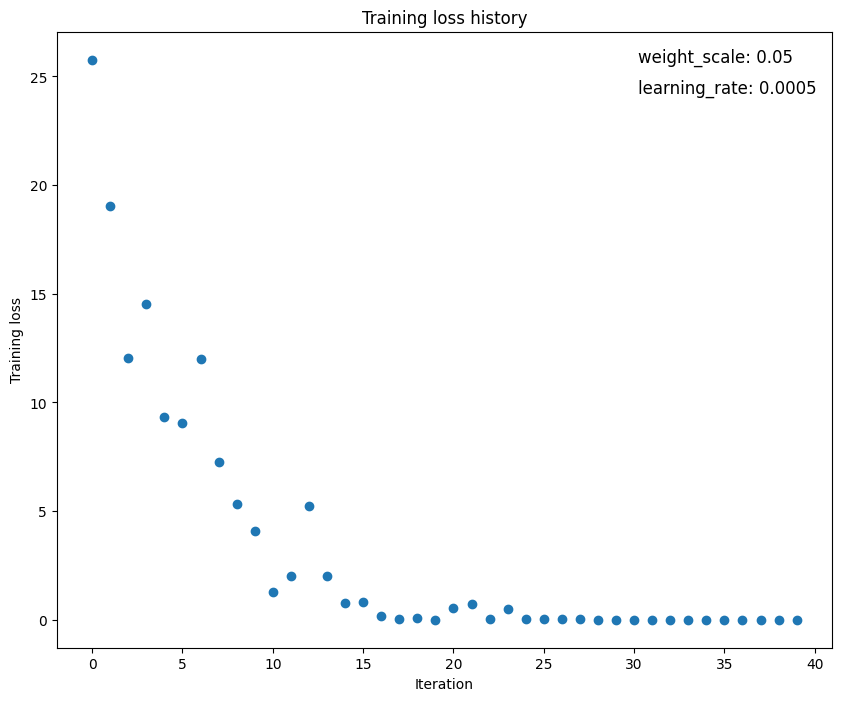

In [ ]:
# TODO: Usar uma rede de 3-camadas para "sobreajustar" (overfit) 50 exemplos de treinamento.

num_train = 50
small_data = {
  'X_train': data['X_train'][:num_train],
  'y_train': data['y_train'][:num_train],
  'X_val': data['X_val'],
  'y_val': data['y_val'],
}

#weight_scale = 1e-2    # experimente variar entre 1e-2 e 5e-2
#learning_rate = 1e-4   # experimente variar entre 1e-4 e 5e-4
weight_scale_list = [1e-2, 2e-2, 3e-2, 4e-2, 5e-2]
learning_rate_list = [1e-4, 2e-4, 3e-4, 4e-4, 5e-4]

for weight_scale in weight_scale_list:
  for learning_rate in learning_rate_list:
    model = FullyConnectedNet([100, 100],
              weight_scale=weight_scale, dtype=np.float64)
    solver = Solver(model, small_data,
                print_every=10, num_epochs=20, batch_size=25,
                update_rule='sgd',
                optim_config={
                  'learning_rate': learning_rate,
                }
         )
    solver.train()

    plt.plot(solver.loss_history, 'o')
    plt.title(f'Training loss history')
    plt.xlabel('Iteration')
    plt.ylabel('Training loss')
    plt.annotate(f'weight_scale: {weight_scale}', xy=(0.75, 0.95), xycoords='axes fraction', fontsize=12)
    plt.annotate(f'learning_rate: {learning_rate}', xy=(0.75, 0.90), xycoords='axes fraction', fontsize=12)
    plt.show()

 **Rede com 3 camadas**

 Com as variações de weight_scale (variando entre 1e-2 e 5e-2 ) e learning_rate (vairandoentre 1e-4 e 5e-4) com intervalos fixos de:

  * weight_scale = [1e-2, 2e-2, 3e-2, 4e-2, 5e-2]
  * learning_rate = [1e-4, 2e-4, 3e-4, 4e-4, 5e-4]

Foram observados comportamentos de sobreajuste (overfitting) com valores de acurácia de treino= 100%  nas redes com os seguintes valores de weight_scale e learning_rate:

-----------------------------------------------------
  * weight_scale= 3e-2  |  learning_rate= 4e-4
  * weight_scale= 3e-2  |  learning_rate= 5e-4
  * weight_scale= 4e-2  |  learning_rate= 4e-4
  * weight_scale= 4e-2  |  learning_rate= 5e-4
  * weight_scale= 5e-2  |  learning_rate= 3e-4
  * weight_scale= 5e-2  |  learning_rate= 4e-4
  * weight_scale= 5e-2  |  learning_rate= 5e-4
-----------------------------------------------------

(Iteration 1 / 40) loss: 4.685291
(Epoch 0 / 20) train acc: 0.060000; val_acc: 0.101000
(Epoch 1 / 20) train acc: 0.060000; val_acc: 0.102000
(Epoch 2 / 20) train acc: 0.080000; val_acc: 0.102000
(Epoch 3 / 20) train acc: 0.080000; val_acc: 0.096000
(Epoch 4 / 20) train acc: 0.100000; val_acc: 0.102000
(Epoch 5 / 20) train acc: 0.160000; val_acc: 0.103000
(Iteration 11 / 40) loss: 2.881658
(Epoch 6 / 20) train acc: 0.200000; val_acc: 0.097000
(Epoch 7 / 20) train acc: 0.220000; val_acc: 0.104000
(Epoch 8 / 20) train acc: 0.220000; val_acc: 0.102000
(Epoch 9 / 20) train acc: 0.220000; val_acc: 0.097000
(Epoch 10 / 20) train acc: 0.260000; val_acc: 0.098000
(Iteration 21 / 40) loss: 2.200797
(Epoch 11 / 20) train acc: 0.280000; val_acc: 0.098000
(Epoch 12 / 20) train acc: 0.240000; val_acc: 0.101000
(Epoch 13 / 20) train acc: 0.320000; val_acc: 0.098000
(Epoch 14 / 20) train acc: 0.360000; val_acc: 0.098000
(Epoch 15 / 20) train acc: 0.400000; val_acc: 0.102000
(Iteration 31 / 40) loss: 

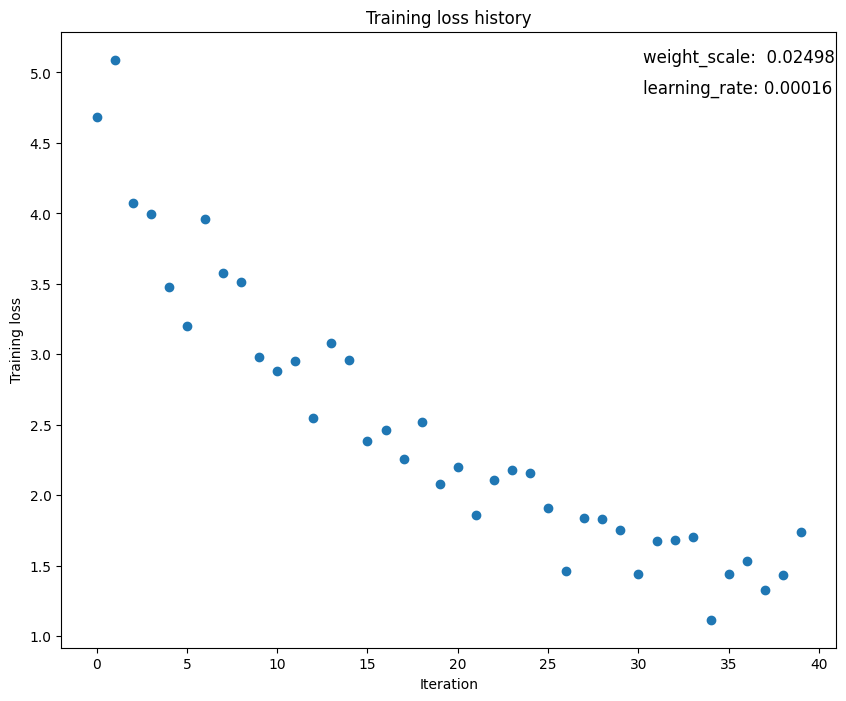

(Iteration 1 / 40) loss: 4.748751
(Epoch 0 / 20) train acc: 0.080000; val_acc: 0.091000
(Epoch 1 / 20) train acc: 0.080000; val_acc: 0.090000
(Epoch 2 / 20) train acc: 0.100000; val_acc: 0.091000
(Epoch 3 / 20) train acc: 0.140000; val_acc: 0.096000
(Epoch 4 / 20) train acc: 0.140000; val_acc: 0.098000
(Epoch 5 / 20) train acc: 0.260000; val_acc: 0.096000
(Iteration 11 / 40) loss: 2.881905
(Epoch 6 / 20) train acc: 0.280000; val_acc: 0.094000
(Epoch 7 / 20) train acc: 0.280000; val_acc: 0.094000
(Epoch 8 / 20) train acc: 0.320000; val_acc: 0.095000
(Epoch 9 / 20) train acc: 0.360000; val_acc: 0.095000
(Epoch 10 / 20) train acc: 0.380000; val_acc: 0.098000
(Iteration 21 / 40) loss: 1.809251
(Epoch 11 / 20) train acc: 0.400000; val_acc: 0.098000
(Epoch 12 / 20) train acc: 0.400000; val_acc: 0.105000
(Epoch 13 / 20) train acc: 0.360000; val_acc: 0.112000
(Epoch 14 / 20) train acc: 0.420000; val_acc: 0.116000
(Epoch 15 / 20) train acc: 0.480000; val_acc: 0.115000
(Iteration 31 / 40) loss: 

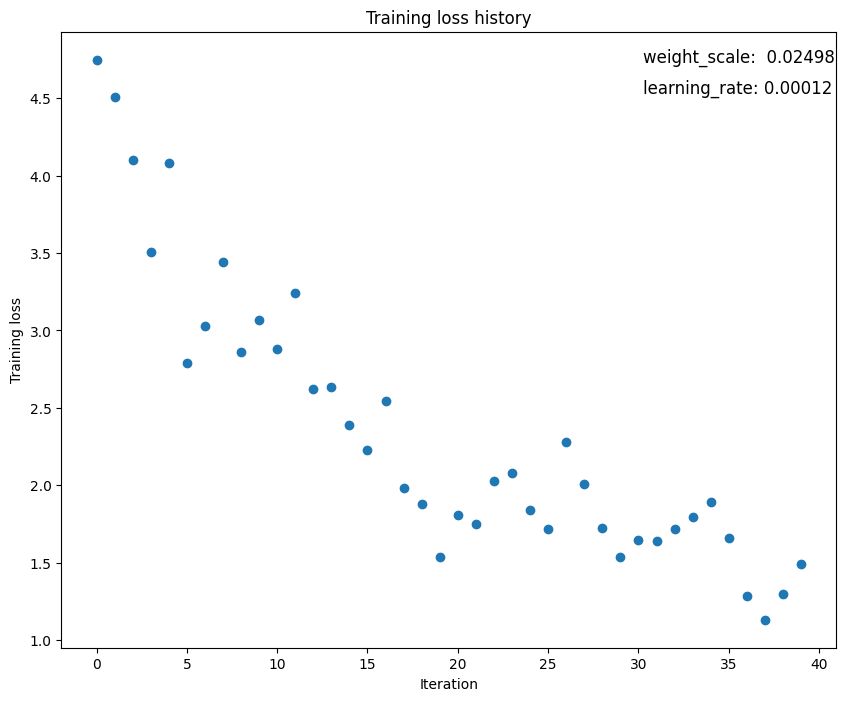

(Iteration 1 / 40) loss: 3.695604
(Epoch 0 / 20) train acc: 0.160000; val_acc: 0.083000
(Epoch 1 / 20) train acc: 0.140000; val_acc: 0.086000
(Epoch 2 / 20) train acc: 0.280000; val_acc: 0.095000
(Epoch 3 / 20) train acc: 0.340000; val_acc: 0.100000
(Epoch 4 / 20) train acc: 0.480000; val_acc: 0.112000
(Epoch 5 / 20) train acc: 0.500000; val_acc: 0.114000
(Iteration 11 / 40) loss: 1.534730
(Epoch 6 / 20) train acc: 0.600000; val_acc: 0.102000
(Epoch 7 / 20) train acc: 0.620000; val_acc: 0.111000
(Epoch 8 / 20) train acc: 0.700000; val_acc: 0.124000
(Epoch 9 / 20) train acc: 0.760000; val_acc: 0.131000
(Epoch 10 / 20) train acc: 0.800000; val_acc: 0.114000
(Iteration 21 / 40) loss: 1.340285
(Epoch 11 / 20) train acc: 0.840000; val_acc: 0.123000
(Epoch 12 / 20) train acc: 0.860000; val_acc: 0.129000
(Epoch 13 / 20) train acc: 0.860000; val_acc: 0.132000
(Epoch 14 / 20) train acc: 0.900000; val_acc: 0.134000
(Epoch 15 / 20) train acc: 0.900000; val_acc: 0.130000
(Iteration 31 / 40) loss: 

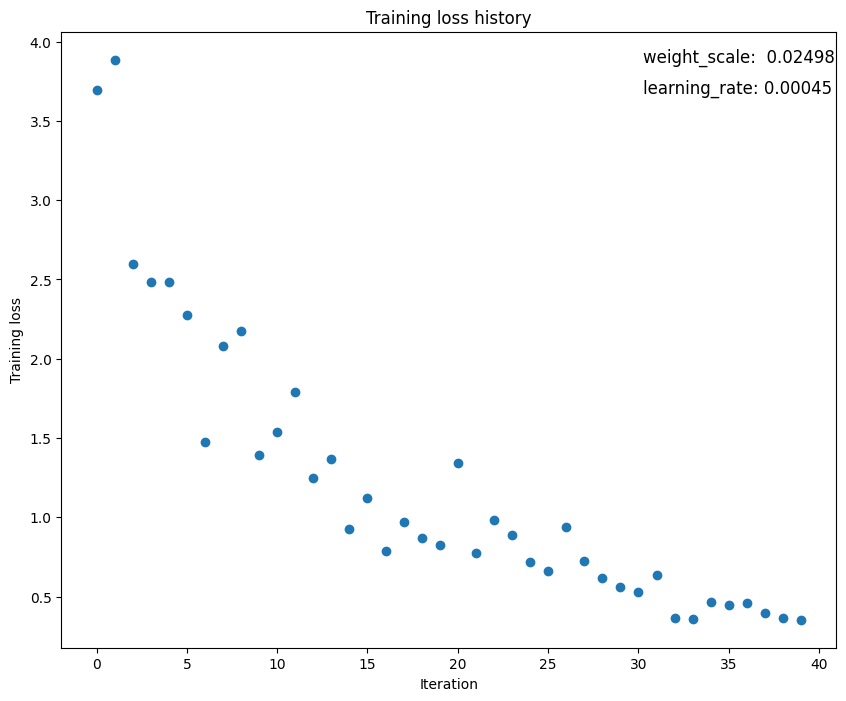

(Iteration 1 / 40) loss: 5.153027
(Epoch 0 / 20) train acc: 0.200000; val_acc: 0.117000
(Epoch 1 / 20) train acc: 0.180000; val_acc: 0.118000
(Epoch 2 / 20) train acc: 0.200000; val_acc: 0.121000
(Epoch 3 / 20) train acc: 0.280000; val_acc: 0.122000
(Epoch 4 / 20) train acc: 0.340000; val_acc: 0.128000
(Epoch 5 / 20) train acc: 0.360000; val_acc: 0.129000
(Iteration 11 / 40) loss: 1.556024
(Epoch 6 / 20) train acc: 0.500000; val_acc: 0.130000
(Epoch 7 / 20) train acc: 0.580000; val_acc: 0.136000
(Epoch 8 / 20) train acc: 0.580000; val_acc: 0.137000
(Epoch 9 / 20) train acc: 0.660000; val_acc: 0.139000
(Epoch 10 / 20) train acc: 0.740000; val_acc: 0.138000
(Iteration 21 / 40) loss: 0.738602
(Epoch 11 / 20) train acc: 0.760000; val_acc: 0.132000
(Epoch 12 / 20) train acc: 0.780000; val_acc: 0.145000
(Epoch 13 / 20) train acc: 0.800000; val_acc: 0.139000
(Epoch 14 / 20) train acc: 0.840000; val_acc: 0.134000
(Epoch 15 / 20) train acc: 0.880000; val_acc: 0.140000
(Iteration 31 / 40) loss: 

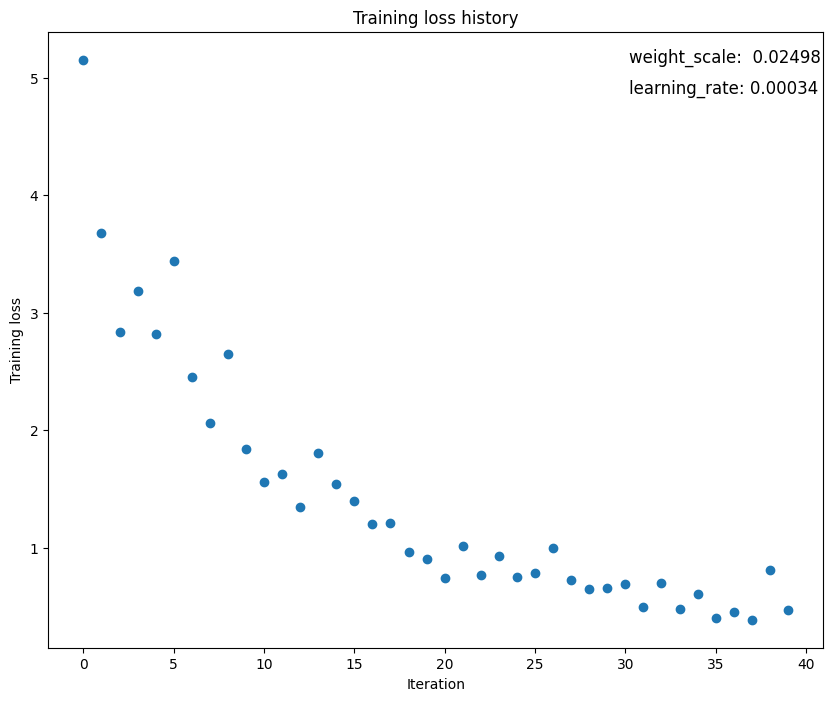

(Iteration 1 / 40) loss: 6.220647
(Epoch 0 / 20) train acc: 0.180000; val_acc: 0.123000
(Epoch 1 / 20) train acc: 0.180000; val_acc: 0.118000
(Epoch 2 / 20) train acc: 0.300000; val_acc: 0.124000
(Epoch 3 / 20) train acc: 0.340000; val_acc: 0.114000
(Epoch 4 / 20) train acc: 0.380000; val_acc: 0.124000
(Epoch 5 / 20) train acc: 0.460000; val_acc: 0.119000
(Iteration 11 / 40) loss: 2.188888
(Epoch 6 / 20) train acc: 0.480000; val_acc: 0.136000
(Epoch 7 / 20) train acc: 0.580000; val_acc: 0.141000
(Epoch 8 / 20) train acc: 0.600000; val_acc: 0.143000
(Epoch 9 / 20) train acc: 0.680000; val_acc: 0.139000
(Epoch 10 / 20) train acc: 0.740000; val_acc: 0.143000
(Iteration 21 / 40) loss: 0.884907
(Epoch 11 / 20) train acc: 0.740000; val_acc: 0.135000
(Epoch 12 / 20) train acc: 0.780000; val_acc: 0.138000
(Epoch 13 / 20) train acc: 0.820000; val_acc: 0.144000
(Epoch 14 / 20) train acc: 0.860000; val_acc: 0.148000
(Epoch 15 / 20) train acc: 0.900000; val_acc: 0.150000
(Iteration 31 / 40) loss: 

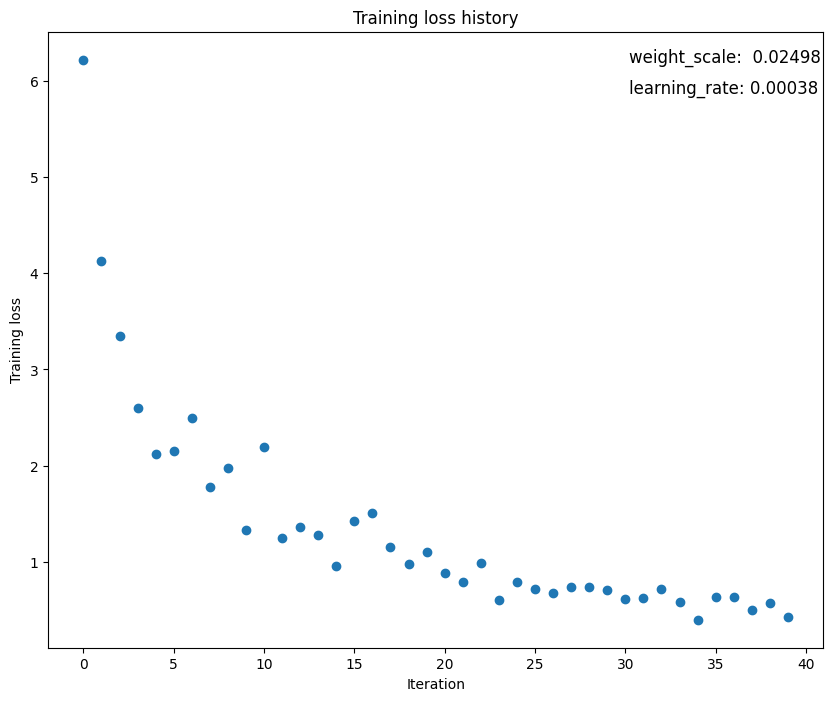

(Iteration 1 / 40) loss: 39.010984
(Epoch 0 / 20) train acc: 0.080000; val_acc: 0.122000
(Epoch 1 / 20) train acc: 0.060000; val_acc: 0.120000
(Epoch 2 / 20) train acc: 0.180000; val_acc: 0.122000
(Epoch 3 / 20) train acc: 0.180000; val_acc: 0.129000
(Epoch 4 / 20) train acc: 0.300000; val_acc: 0.108000
(Epoch 5 / 20) train acc: 0.360000; val_acc: 0.127000
(Iteration 11 / 40) loss: 6.350264
(Epoch 6 / 20) train acc: 0.400000; val_acc: 0.125000
(Epoch 7 / 20) train acc: 0.480000; val_acc: 0.123000
(Epoch 8 / 20) train acc: 0.580000; val_acc: 0.134000
(Epoch 9 / 20) train acc: 0.600000; val_acc: 0.135000
(Epoch 10 / 20) train acc: 0.680000; val_acc: 0.124000
(Iteration 21 / 40) loss: 1.284926
(Epoch 11 / 20) train acc: 0.720000; val_acc: 0.124000
(Epoch 12 / 20) train acc: 0.800000; val_acc: 0.135000
(Epoch 13 / 20) train acc: 0.840000; val_acc: 0.135000
(Epoch 14 / 20) train acc: 0.860000; val_acc: 0.128000
(Epoch 15 / 20) train acc: 0.820000; val_acc: 0.125000
(Iteration 31 / 40) loss:

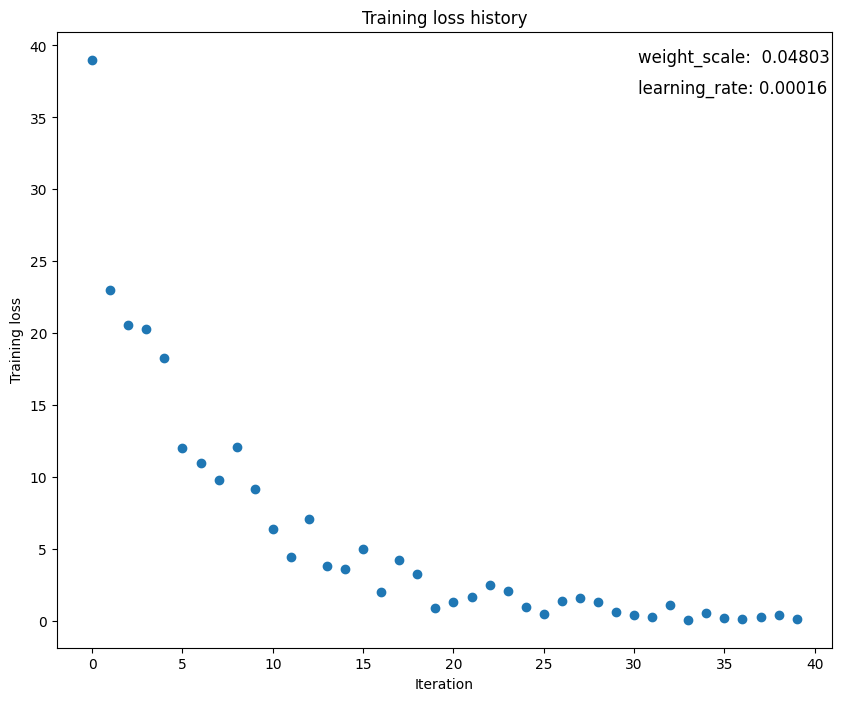

(Iteration 1 / 40) loss: 49.363997
(Epoch 0 / 20) train acc: 0.060000; val_acc: 0.105000
(Epoch 1 / 20) train acc: 0.080000; val_acc: 0.097000
(Epoch 2 / 20) train acc: 0.140000; val_acc: 0.112000
(Epoch 3 / 20) train acc: 0.180000; val_acc: 0.131000
(Epoch 4 / 20) train acc: 0.200000; val_acc: 0.122000
(Epoch 5 / 20) train acc: 0.320000; val_acc: 0.131000
(Iteration 11 / 40) loss: 9.872890
(Epoch 6 / 20) train acc: 0.380000; val_acc: 0.134000
(Epoch 7 / 20) train acc: 0.400000; val_acc: 0.141000
(Epoch 8 / 20) train acc: 0.460000; val_acc: 0.130000
(Epoch 9 / 20) train acc: 0.560000; val_acc: 0.140000
(Epoch 10 / 20) train acc: 0.640000; val_acc: 0.137000
(Iteration 21 / 40) loss: 5.842949
(Epoch 11 / 20) train acc: 0.580000; val_acc: 0.137000
(Epoch 12 / 20) train acc: 0.640000; val_acc: 0.137000
(Epoch 13 / 20) train acc: 0.720000; val_acc: 0.136000
(Epoch 14 / 20) train acc: 0.640000; val_acc: 0.134000
(Epoch 15 / 20) train acc: 0.780000; val_acc: 0.138000
(Iteration 31 / 40) loss:

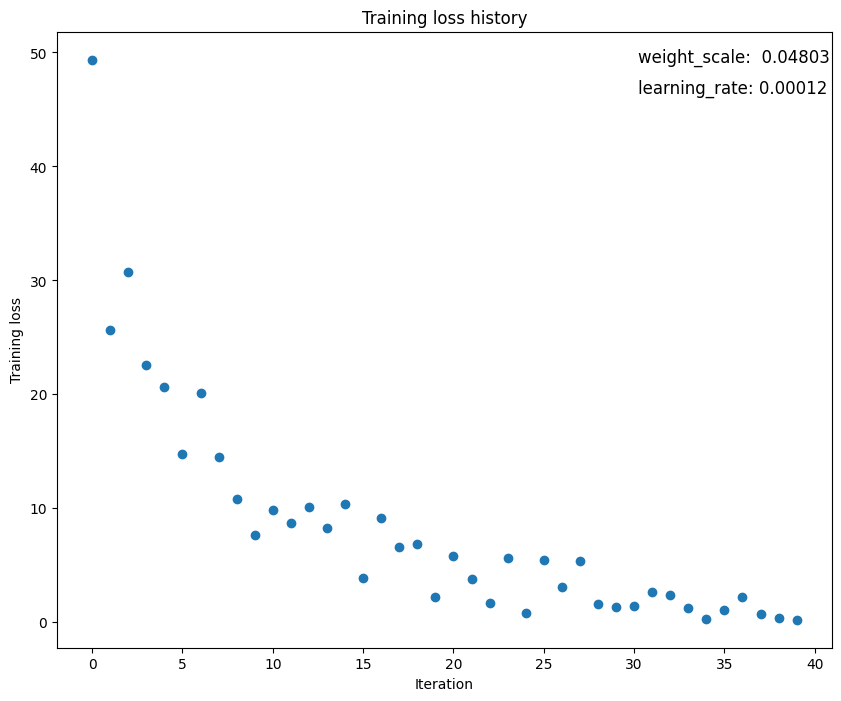

(Iteration 1 / 40) loss: 20.711311
(Epoch 0 / 20) train acc: 0.200000; val_acc: 0.114000
(Epoch 1 / 20) train acc: 0.360000; val_acc: 0.115000
(Epoch 2 / 20) train acc: 0.540000; val_acc: 0.107000
(Epoch 3 / 20) train acc: 0.620000; val_acc: 0.121000
(Epoch 4 / 20) train acc: 0.700000; val_acc: 0.129000
(Epoch 5 / 20) train acc: 0.640000; val_acc: 0.122000
(Iteration 11 / 40) loss: 2.229372
(Epoch 6 / 20) train acc: 0.720000; val_acc: 0.145000
(Epoch 7 / 20) train acc: 0.900000; val_acc: 0.141000
(Epoch 8 / 20) train acc: 0.920000; val_acc: 0.138000
(Epoch 9 / 20) train acc: 0.980000; val_acc: 0.140000
(Epoch 10 / 20) train acc: 0.980000; val_acc: 0.141000
(Iteration 21 / 40) loss: 0.004400
(Epoch 11 / 20) train acc: 0.980000; val_acc: 0.139000
(Epoch 12 / 20) train acc: 1.000000; val_acc: 0.142000
(Epoch 13 / 20) train acc: 1.000000; val_acc: 0.140000
(Epoch 14 / 20) train acc: 1.000000; val_acc: 0.140000
(Epoch 15 / 20) train acc: 1.000000; val_acc: 0.138000
(Iteration 31 / 40) loss:

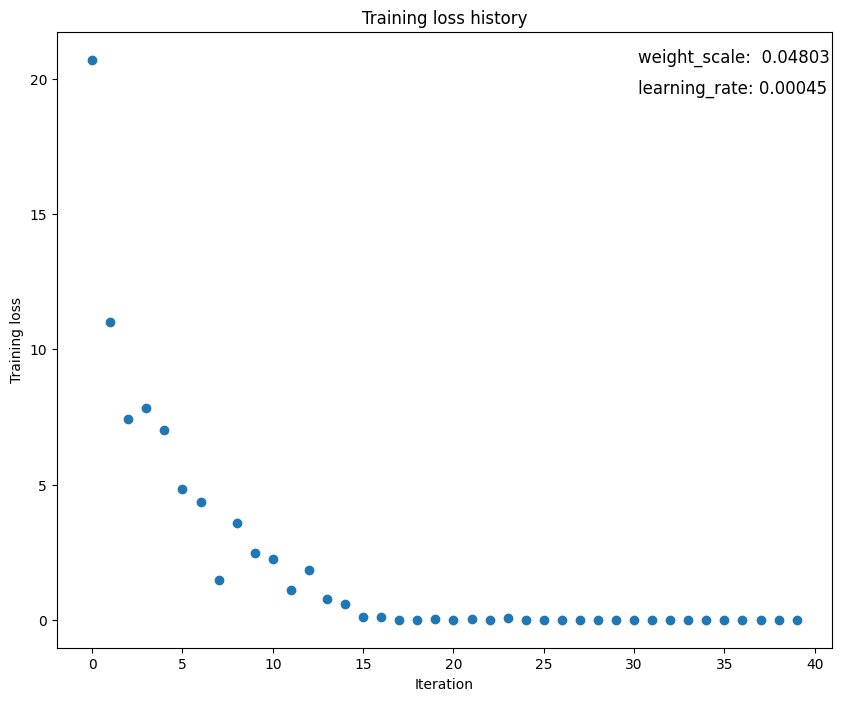

(Iteration 1 / 40) loss: 46.744039
(Epoch 0 / 20) train acc: 0.140000; val_acc: 0.141000
(Epoch 1 / 20) train acc: 0.260000; val_acc: 0.114000
(Epoch 2 / 20) train acc: 0.300000; val_acc: 0.113000
(Epoch 3 / 20) train acc: 0.440000; val_acc: 0.112000
(Epoch 4 / 20) train acc: 0.520000; val_acc: 0.126000
(Epoch 5 / 20) train acc: 0.660000; val_acc: 0.147000
(Iteration 11 / 40) loss: 2.425937
(Epoch 6 / 20) train acc: 0.760000; val_acc: 0.130000
(Epoch 7 / 20) train acc: 0.800000; val_acc: 0.142000
(Epoch 8 / 20) train acc: 0.860000; val_acc: 0.135000
(Epoch 9 / 20) train acc: 0.940000; val_acc: 0.133000
(Epoch 10 / 20) train acc: 0.940000; val_acc: 0.131000
(Iteration 21 / 40) loss: 0.150173
(Epoch 11 / 20) train acc: 0.980000; val_acc: 0.133000
(Epoch 12 / 20) train acc: 0.980000; val_acc: 0.133000
(Epoch 13 / 20) train acc: 0.980000; val_acc: 0.134000
(Epoch 14 / 20) train acc: 1.000000; val_acc: 0.135000
(Epoch 15 / 20) train acc: 1.000000; val_acc: 0.130000
(Iteration 31 / 40) loss:

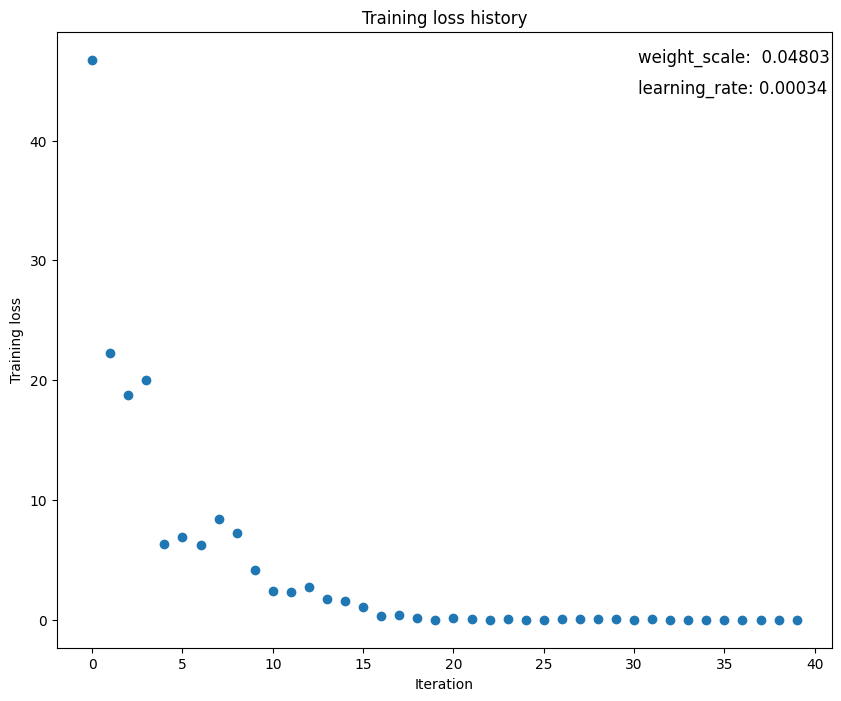

(Iteration 1 / 40) loss: 23.137968
(Epoch 0 / 20) train acc: 0.140000; val_acc: 0.120000
(Epoch 1 / 20) train acc: 0.200000; val_acc: 0.111000
(Epoch 2 / 20) train acc: 0.420000; val_acc: 0.113000
(Epoch 3 / 20) train acc: 0.520000; val_acc: 0.112000
(Epoch 4 / 20) train acc: 0.480000; val_acc: 0.116000
(Epoch 5 / 20) train acc: 0.680000; val_acc: 0.115000
(Iteration 11 / 40) loss: 1.261340
(Epoch 6 / 20) train acc: 0.800000; val_acc: 0.116000
(Epoch 7 / 20) train acc: 0.820000; val_acc: 0.120000
(Epoch 8 / 20) train acc: 0.880000; val_acc: 0.118000
(Epoch 9 / 20) train acc: 0.900000; val_acc: 0.113000
(Epoch 10 / 20) train acc: 0.920000; val_acc: 0.112000
(Iteration 21 / 40) loss: 0.265082
(Epoch 11 / 20) train acc: 0.960000; val_acc: 0.120000
(Epoch 12 / 20) train acc: 0.960000; val_acc: 0.120000
(Epoch 13 / 20) train acc: 0.960000; val_acc: 0.119000
(Epoch 14 / 20) train acc: 1.000000; val_acc: 0.118000
(Epoch 15 / 20) train acc: 1.000000; val_acc: 0.116000
(Iteration 31 / 40) loss:

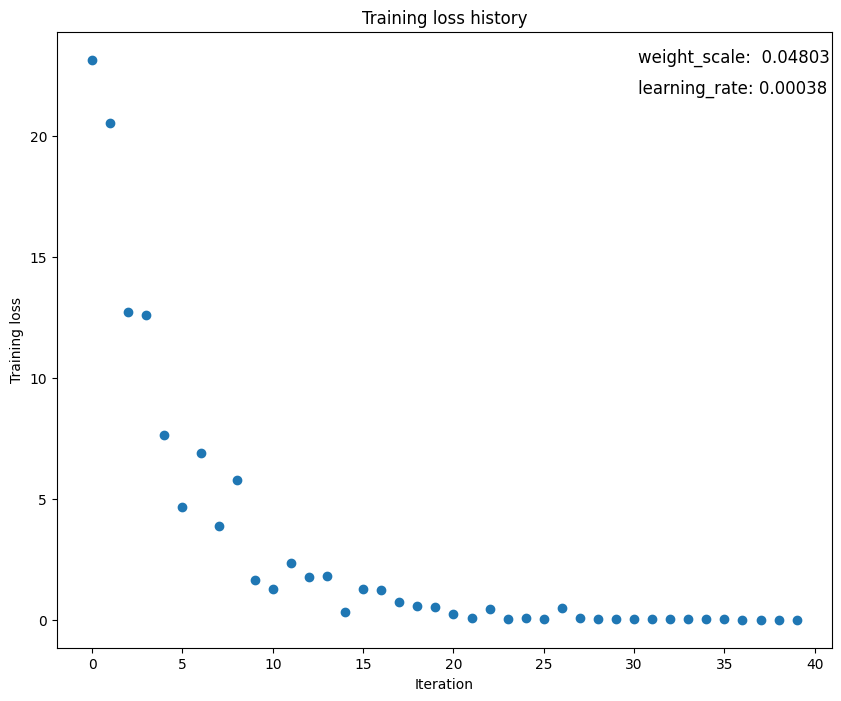

(Iteration 1 / 40) loss: 12.800321
(Epoch 0 / 20) train acc: 0.140000; val_acc: 0.100000
(Epoch 1 / 20) train acc: 0.180000; val_acc: 0.095000
(Epoch 2 / 20) train acc: 0.260000; val_acc: 0.112000
(Epoch 3 / 20) train acc: 0.220000; val_acc: 0.104000
(Epoch 4 / 20) train acc: 0.280000; val_acc: 0.120000
(Epoch 5 / 20) train acc: 0.320000; val_acc: 0.124000
(Iteration 11 / 40) loss: 3.735303
(Epoch 6 / 20) train acc: 0.360000; val_acc: 0.126000
(Epoch 7 / 20) train acc: 0.380000; val_acc: 0.131000
(Epoch 8 / 20) train acc: 0.440000; val_acc: 0.127000
(Epoch 9 / 20) train acc: 0.460000; val_acc: 0.123000
(Epoch 10 / 20) train acc: 0.480000; val_acc: 0.127000
(Iteration 21 / 40) loss: 2.556397
(Epoch 11 / 20) train acc: 0.500000; val_acc: 0.133000
(Epoch 12 / 20) train acc: 0.580000; val_acc: 0.126000
(Epoch 13 / 20) train acc: 0.600000; val_acc: 0.128000
(Epoch 14 / 20) train acc: 0.640000; val_acc: 0.128000
(Epoch 15 / 20) train acc: 0.700000; val_acc: 0.129000
(Iteration 31 / 40) loss:

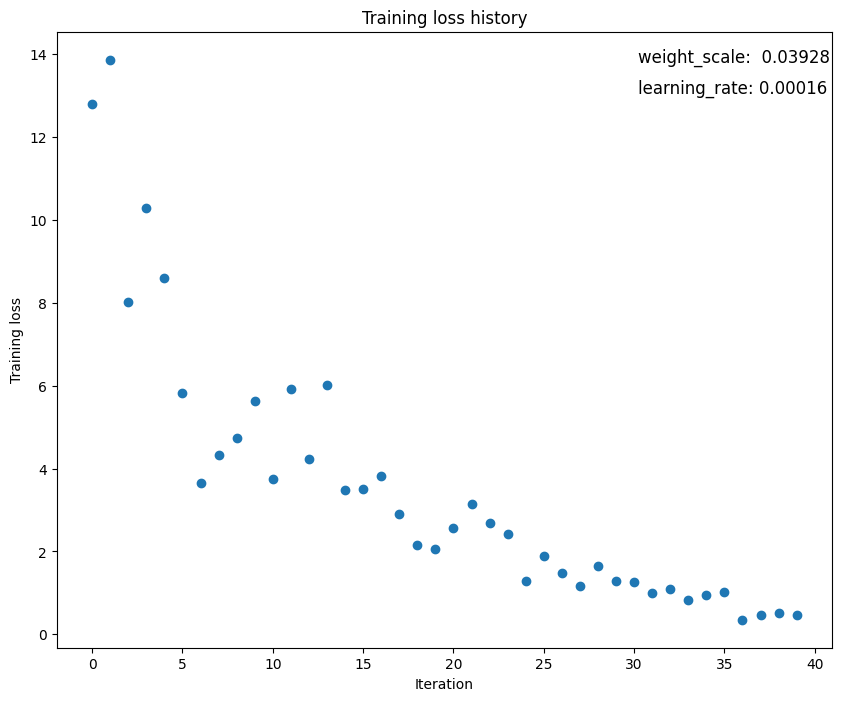

(Iteration 1 / 40) loss: 19.470770
(Epoch 0 / 20) train acc: 0.120000; val_acc: 0.093000
(Epoch 1 / 20) train acc: 0.200000; val_acc: 0.105000
(Epoch 2 / 20) train acc: 0.220000; val_acc: 0.106000
(Epoch 3 / 20) train acc: 0.280000; val_acc: 0.109000
(Epoch 4 / 20) train acc: 0.320000; val_acc: 0.111000
(Epoch 5 / 20) train acc: 0.340000; val_acc: 0.107000
(Iteration 11 / 40) loss: 7.183113
(Epoch 6 / 20) train acc: 0.380000; val_acc: 0.106000
(Epoch 7 / 20) train acc: 0.420000; val_acc: 0.111000
(Epoch 8 / 20) train acc: 0.440000; val_acc: 0.118000
(Epoch 9 / 20) train acc: 0.500000; val_acc: 0.114000
(Epoch 10 / 20) train acc: 0.560000; val_acc: 0.117000
(Iteration 21 / 40) loss: 1.779759
(Epoch 11 / 20) train acc: 0.540000; val_acc: 0.121000
(Epoch 12 / 20) train acc: 0.580000; val_acc: 0.126000
(Epoch 13 / 20) train acc: 0.660000; val_acc: 0.132000
(Epoch 14 / 20) train acc: 0.680000; val_acc: 0.129000
(Epoch 15 / 20) train acc: 0.680000; val_acc: 0.132000
(Iteration 31 / 40) loss:

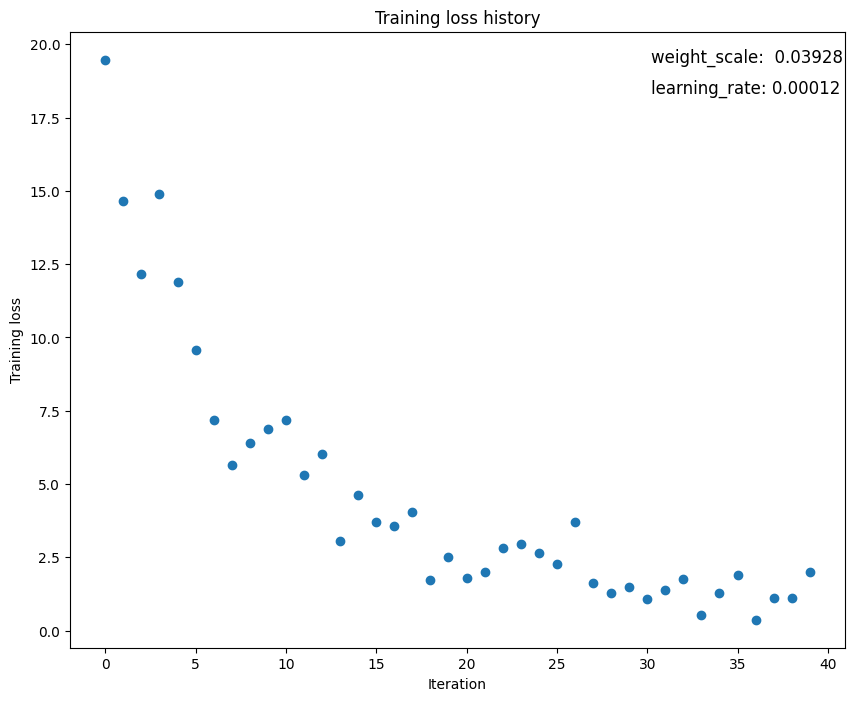

(Iteration 1 / 40) loss: 17.554553
(Epoch 0 / 20) train acc: 0.140000; val_acc: 0.084000
(Epoch 1 / 20) train acc: 0.340000; val_acc: 0.099000
(Epoch 2 / 20) train acc: 0.300000; val_acc: 0.097000
(Epoch 3 / 20) train acc: 0.440000; val_acc: 0.117000
(Epoch 4 / 20) train acc: 0.520000; val_acc: 0.114000
(Epoch 5 / 20) train acc: 0.660000; val_acc: 0.123000
(Iteration 11 / 40) loss: 1.850353
(Epoch 6 / 20) train acc: 0.680000; val_acc: 0.117000
(Epoch 7 / 20) train acc: 0.800000; val_acc: 0.122000
(Epoch 8 / 20) train acc: 0.920000; val_acc: 0.121000
(Epoch 9 / 20) train acc: 0.920000; val_acc: 0.120000
(Epoch 10 / 20) train acc: 0.960000; val_acc: 0.118000
(Iteration 21 / 40) loss: 0.303302
(Epoch 11 / 20) train acc: 1.000000; val_acc: 0.122000
(Epoch 12 / 20) train acc: 1.000000; val_acc: 0.121000
(Epoch 13 / 20) train acc: 1.000000; val_acc: 0.120000
(Epoch 14 / 20) train acc: 1.000000; val_acc: 0.120000
(Epoch 15 / 20) train acc: 1.000000; val_acc: 0.120000
(Iteration 31 / 40) loss:

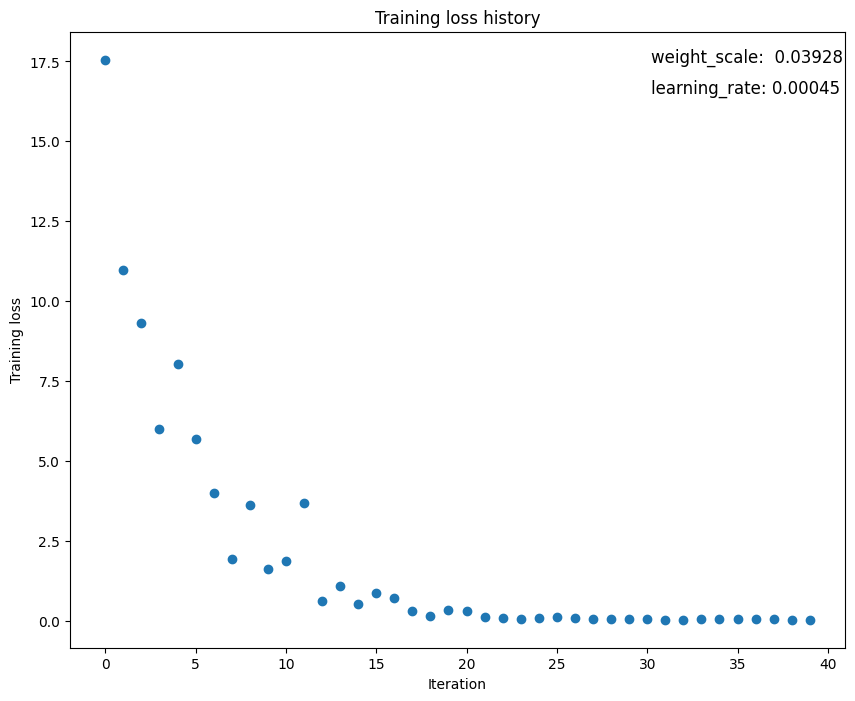

(Iteration 1 / 40) loss: 18.263379
(Epoch 0 / 20) train acc: 0.180000; val_acc: 0.128000
(Epoch 1 / 20) train acc: 0.180000; val_acc: 0.127000
(Epoch 2 / 20) train acc: 0.280000; val_acc: 0.114000
(Epoch 3 / 20) train acc: 0.400000; val_acc: 0.107000
(Epoch 4 / 20) train acc: 0.460000; val_acc: 0.124000
(Epoch 5 / 20) train acc: 0.540000; val_acc: 0.122000
(Iteration 11 / 40) loss: 1.575607
(Epoch 6 / 20) train acc: 0.700000; val_acc: 0.122000
(Epoch 7 / 20) train acc: 0.760000; val_acc: 0.128000
(Epoch 8 / 20) train acc: 0.700000; val_acc: 0.115000
(Epoch 9 / 20) train acc: 0.760000; val_acc: 0.130000
(Epoch 10 / 20) train acc: 0.920000; val_acc: 0.131000
(Iteration 21 / 40) loss: 0.341861
(Epoch 11 / 20) train acc: 0.920000; val_acc: 0.129000
(Epoch 12 / 20) train acc: 0.920000; val_acc: 0.134000
(Epoch 13 / 20) train acc: 0.980000; val_acc: 0.124000
(Epoch 14 / 20) train acc: 1.000000; val_acc: 0.122000
(Epoch 15 / 20) train acc: 1.000000; val_acc: 0.128000
(Iteration 31 / 40) loss:

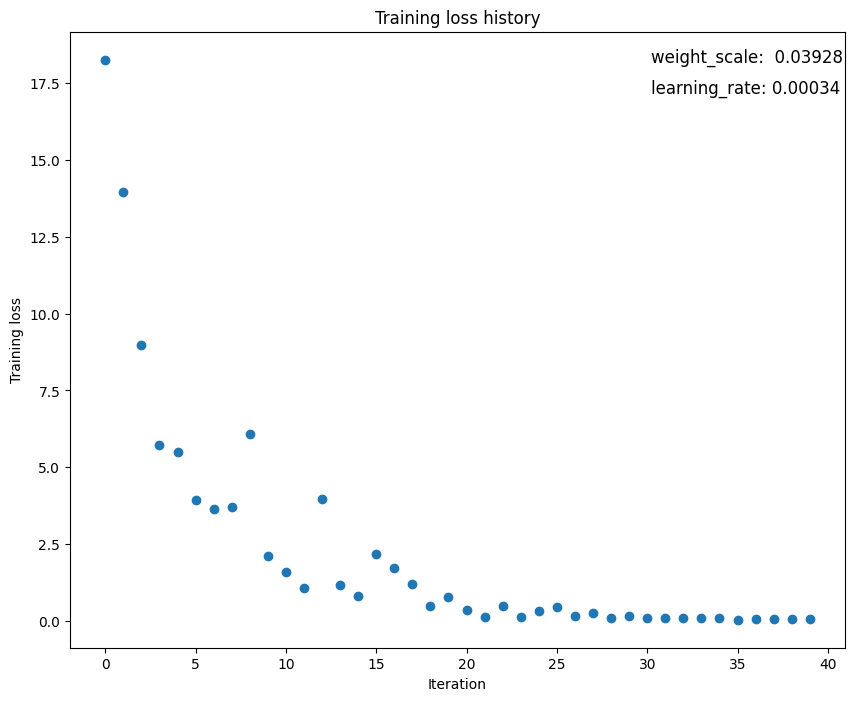

(Iteration 1 / 40) loss: 17.082532
(Epoch 0 / 20) train acc: 0.120000; val_acc: 0.126000
(Epoch 1 / 20) train acc: 0.240000; val_acc: 0.117000
(Epoch 2 / 20) train acc: 0.340000; val_acc: 0.121000
(Epoch 3 / 20) train acc: 0.440000; val_acc: 0.126000
(Epoch 4 / 20) train acc: 0.540000; val_acc: 0.127000
(Epoch 5 / 20) train acc: 0.600000; val_acc: 0.132000
(Iteration 11 / 40) loss: 1.095437
(Epoch 6 / 20) train acc: 0.700000; val_acc: 0.130000
(Epoch 7 / 20) train acc: 0.760000; val_acc: 0.130000
(Epoch 8 / 20) train acc: 0.820000; val_acc: 0.129000
(Epoch 9 / 20) train acc: 0.860000; val_acc: 0.126000
(Epoch 10 / 20) train acc: 0.920000; val_acc: 0.134000
(Iteration 21 / 40) loss: 0.291530
(Epoch 11 / 20) train acc: 0.960000; val_acc: 0.133000
(Epoch 12 / 20) train acc: 0.980000; val_acc: 0.132000
(Epoch 13 / 20) train acc: 0.960000; val_acc: 0.133000
(Epoch 14 / 20) train acc: 0.980000; val_acc: 0.135000
(Epoch 15 / 20) train acc: 0.980000; val_acc: 0.134000
(Iteration 31 / 40) loss:

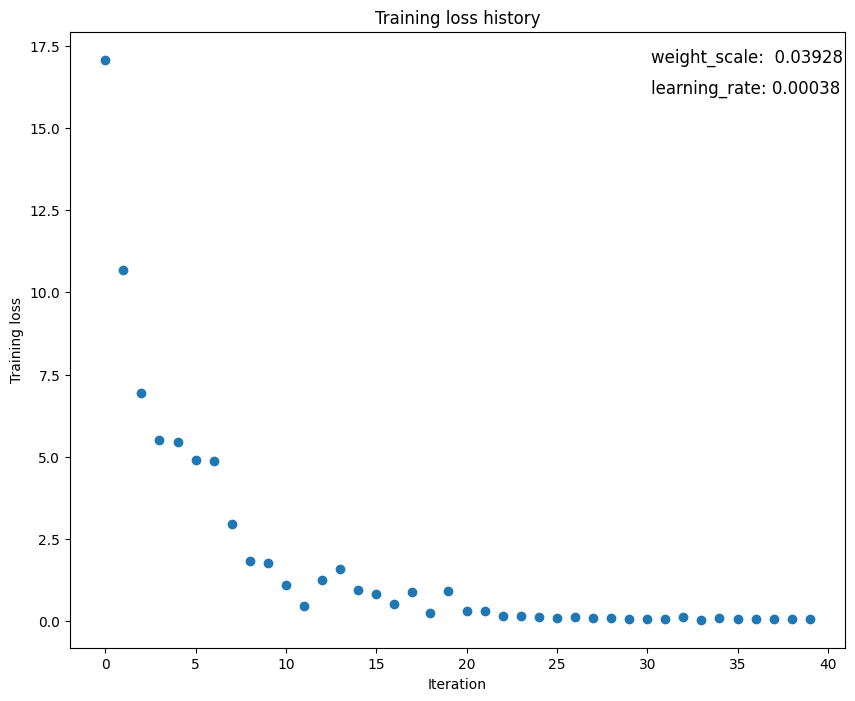

(Iteration 1 / 40) loss: 12.781142
(Epoch 0 / 20) train acc: 0.120000; val_acc: 0.087000
(Epoch 1 / 20) train acc: 0.100000; val_acc: 0.093000
(Epoch 2 / 20) train acc: 0.160000; val_acc: 0.097000
(Epoch 3 / 20) train acc: 0.160000; val_acc: 0.092000
(Epoch 4 / 20) train acc: 0.180000; val_acc: 0.094000
(Epoch 5 / 20) train acc: 0.260000; val_acc: 0.098000
(Iteration 11 / 40) loss: 4.677258
(Epoch 6 / 20) train acc: 0.300000; val_acc: 0.100000
(Epoch 7 / 20) train acc: 0.340000; val_acc: 0.099000
(Epoch 8 / 20) train acc: 0.400000; val_acc: 0.098000
(Epoch 9 / 20) train acc: 0.480000; val_acc: 0.097000
(Epoch 10 / 20) train acc: 0.540000; val_acc: 0.102000
(Iteration 21 / 40) loss: 1.328686
(Epoch 11 / 20) train acc: 0.580000; val_acc: 0.106000
(Epoch 12 / 20) train acc: 0.620000; val_acc: 0.100000
(Epoch 13 / 20) train acc: 0.660000; val_acc: 0.102000
(Epoch 14 / 20) train acc: 0.640000; val_acc: 0.105000
(Epoch 15 / 20) train acc: 0.680000; val_acc: 0.104000
(Iteration 31 / 40) loss:

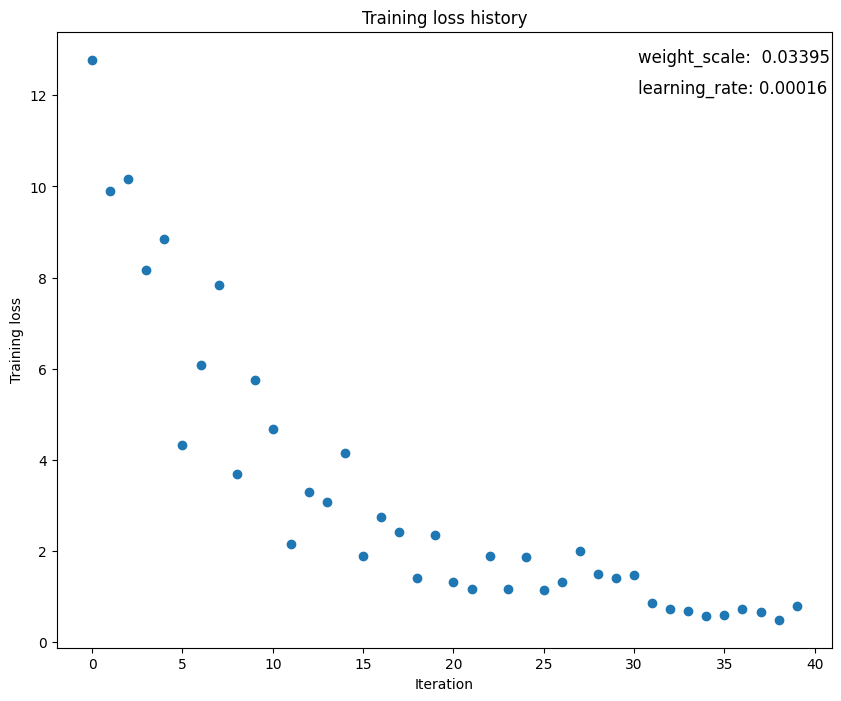

(Iteration 1 / 40) loss: 10.491901
(Epoch 0 / 20) train acc: 0.100000; val_acc: 0.130000
(Epoch 1 / 20) train acc: 0.100000; val_acc: 0.128000
(Epoch 2 / 20) train acc: 0.140000; val_acc: 0.122000
(Epoch 3 / 20) train acc: 0.200000; val_acc: 0.115000
(Epoch 4 / 20) train acc: 0.200000; val_acc: 0.107000
(Epoch 5 / 20) train acc: 0.220000; val_acc: 0.113000
(Iteration 11 / 40) loss: 4.704903
(Epoch 6 / 20) train acc: 0.280000; val_acc: 0.110000
(Epoch 7 / 20) train acc: 0.300000; val_acc: 0.118000
(Epoch 8 / 20) train acc: 0.300000; val_acc: 0.121000
(Epoch 9 / 20) train acc: 0.400000; val_acc: 0.124000
(Epoch 10 / 20) train acc: 0.440000; val_acc: 0.124000
(Iteration 21 / 40) loss: 2.687024
(Epoch 11 / 20) train acc: 0.460000; val_acc: 0.130000
(Epoch 12 / 20) train acc: 0.500000; val_acc: 0.133000
(Epoch 13 / 20) train acc: 0.540000; val_acc: 0.133000
(Epoch 14 / 20) train acc: 0.580000; val_acc: 0.131000
(Epoch 15 / 20) train acc: 0.620000; val_acc: 0.136000
(Iteration 31 / 40) loss:

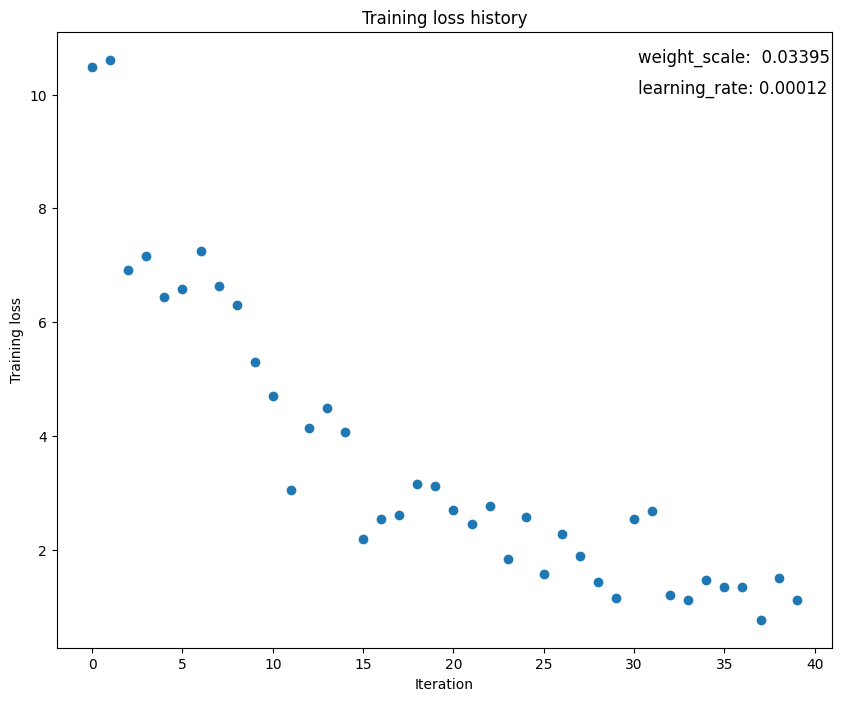

(Iteration 1 / 40) loss: 10.458730
(Epoch 0 / 20) train acc: 0.180000; val_acc: 0.111000
(Epoch 1 / 20) train acc: 0.200000; val_acc: 0.111000
(Epoch 2 / 20) train acc: 0.360000; val_acc: 0.101000
(Epoch 3 / 20) train acc: 0.440000; val_acc: 0.105000
(Epoch 4 / 20) train acc: 0.560000; val_acc: 0.118000
(Epoch 5 / 20) train acc: 0.660000; val_acc: 0.125000
(Iteration 11 / 40) loss: 2.172454
(Epoch 6 / 20) train acc: 0.740000; val_acc: 0.126000
(Epoch 7 / 20) train acc: 0.720000; val_acc: 0.125000
(Epoch 8 / 20) train acc: 0.740000; val_acc: 0.125000
(Epoch 9 / 20) train acc: 0.920000; val_acc: 0.128000
(Epoch 10 / 20) train acc: 0.860000; val_acc: 0.140000
(Iteration 21 / 40) loss: 0.488720
(Epoch 11 / 20) train acc: 0.880000; val_acc: 0.135000
(Epoch 12 / 20) train acc: 1.000000; val_acc: 0.134000
(Epoch 13 / 20) train acc: 0.980000; val_acc: 0.133000
(Epoch 14 / 20) train acc: 1.000000; val_acc: 0.138000
(Epoch 15 / 20) train acc: 0.980000; val_acc: 0.144000
(Iteration 31 / 40) loss:

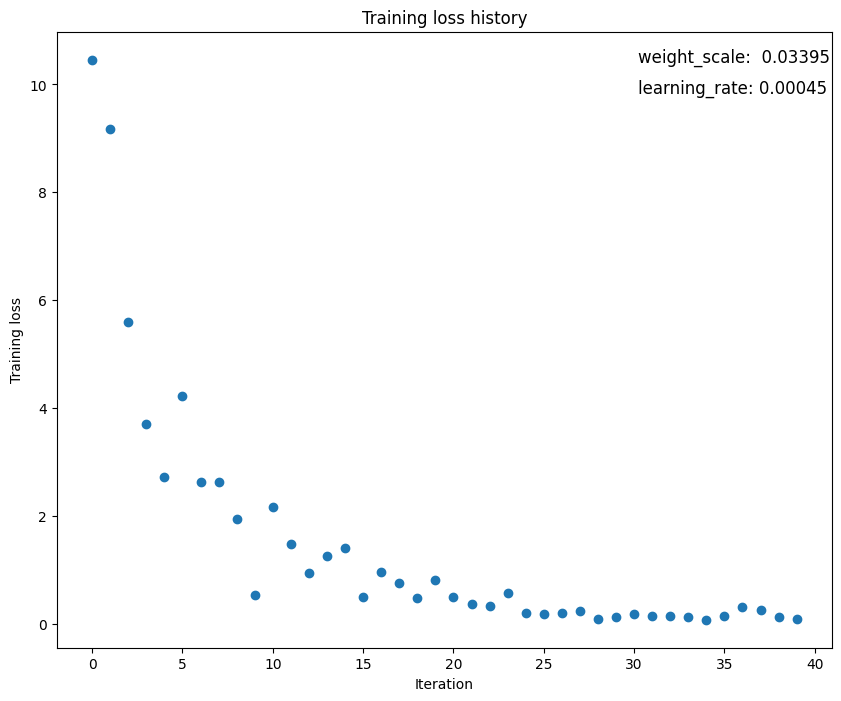

(Iteration 1 / 40) loss: 9.163019
(Epoch 0 / 20) train acc: 0.140000; val_acc: 0.086000
(Epoch 1 / 20) train acc: 0.120000; val_acc: 0.086000
(Epoch 2 / 20) train acc: 0.240000; val_acc: 0.087000
(Epoch 3 / 20) train acc: 0.260000; val_acc: 0.110000
(Epoch 4 / 20) train acc: 0.440000; val_acc: 0.118000
(Epoch 5 / 20) train acc: 0.560000; val_acc: 0.095000
(Iteration 11 / 40) loss: 2.366095
(Epoch 6 / 20) train acc: 0.600000; val_acc: 0.097000
(Epoch 7 / 20) train acc: 0.660000; val_acc: 0.108000
(Epoch 8 / 20) train acc: 0.780000; val_acc: 0.101000
(Epoch 9 / 20) train acc: 0.800000; val_acc: 0.104000
(Epoch 10 / 20) train acc: 0.840000; val_acc: 0.097000
(Iteration 21 / 40) loss: 0.624111
(Epoch 11 / 20) train acc: 0.900000; val_acc: 0.104000
(Epoch 12 / 20) train acc: 0.900000; val_acc: 0.100000
(Epoch 13 / 20) train acc: 0.900000; val_acc: 0.106000
(Epoch 14 / 20) train acc: 0.960000; val_acc: 0.106000
(Epoch 15 / 20) train acc: 0.980000; val_acc: 0.104000
(Iteration 31 / 40) loss: 

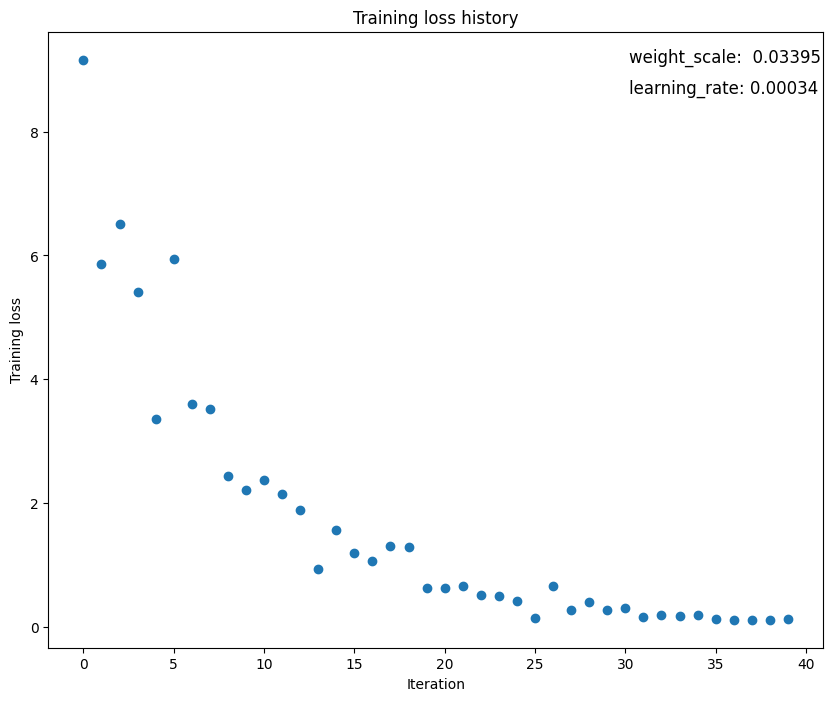

(Iteration 1 / 40) loss: 8.094424
(Epoch 0 / 20) train acc: 0.120000; val_acc: 0.092000
(Epoch 1 / 20) train acc: 0.200000; val_acc: 0.099000
(Epoch 2 / 20) train acc: 0.280000; val_acc: 0.112000
(Epoch 3 / 20) train acc: 0.360000; val_acc: 0.105000
(Epoch 4 / 20) train acc: 0.440000; val_acc: 0.121000
(Epoch 5 / 20) train acc: 0.500000; val_acc: 0.121000
(Iteration 11 / 40) loss: 2.354819
(Epoch 6 / 20) train acc: 0.580000; val_acc: 0.123000
(Epoch 7 / 20) train acc: 0.700000; val_acc: 0.107000
(Epoch 8 / 20) train acc: 0.800000; val_acc: 0.120000
(Epoch 9 / 20) train acc: 0.760000; val_acc: 0.123000
(Epoch 10 / 20) train acc: 0.840000; val_acc: 0.124000
(Iteration 21 / 40) loss: 1.065856
(Epoch 11 / 20) train acc: 0.880000; val_acc: 0.124000
(Epoch 12 / 20) train acc: 0.920000; val_acc: 0.124000
(Epoch 13 / 20) train acc: 0.940000; val_acc: 0.122000
(Epoch 14 / 20) train acc: 0.980000; val_acc: 0.127000
(Epoch 15 / 20) train acc: 0.980000; val_acc: 0.128000
(Iteration 31 / 40) loss: 

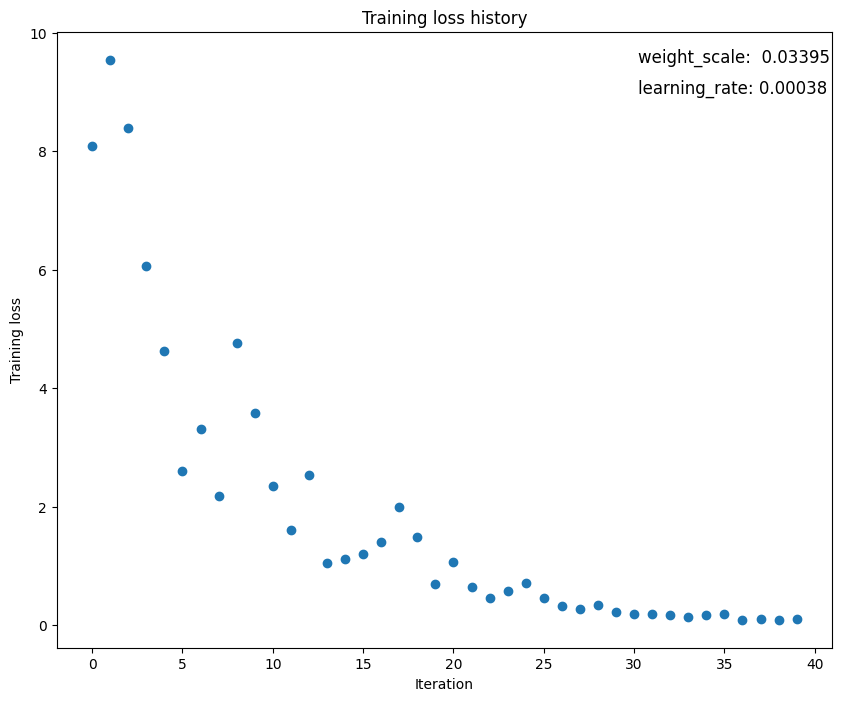

(Iteration 1 / 40) loss: 2.277036
(Epoch 0 / 20) train acc: 0.120000; val_acc: 0.105000
(Epoch 1 / 20) train acc: 0.120000; val_acc: 0.109000
(Epoch 2 / 20) train acc: 0.120000; val_acc: 0.104000
(Epoch 3 / 20) train acc: 0.120000; val_acc: 0.104000
(Epoch 4 / 20) train acc: 0.100000; val_acc: 0.102000
(Epoch 5 / 20) train acc: 0.140000; val_acc: 0.104000
(Iteration 11 / 40) loss: 2.156496
(Epoch 6 / 20) train acc: 0.160000; val_acc: 0.104000
(Epoch 7 / 20) train acc: 0.160000; val_acc: 0.110000
(Epoch 8 / 20) train acc: 0.140000; val_acc: 0.112000
(Epoch 9 / 20) train acc: 0.220000; val_acc: 0.112000
(Epoch 10 / 20) train acc: 0.240000; val_acc: 0.112000
(Iteration 21 / 40) loss: 2.137854
(Epoch 11 / 20) train acc: 0.260000; val_acc: 0.117000
(Epoch 12 / 20) train acc: 0.300000; val_acc: 0.113000
(Epoch 13 / 20) train acc: 0.320000; val_acc: 0.115000
(Epoch 14 / 20) train acc: 0.300000; val_acc: 0.121000
(Epoch 15 / 20) train acc: 0.320000; val_acc: 0.118000
(Iteration 31 / 40) loss: 

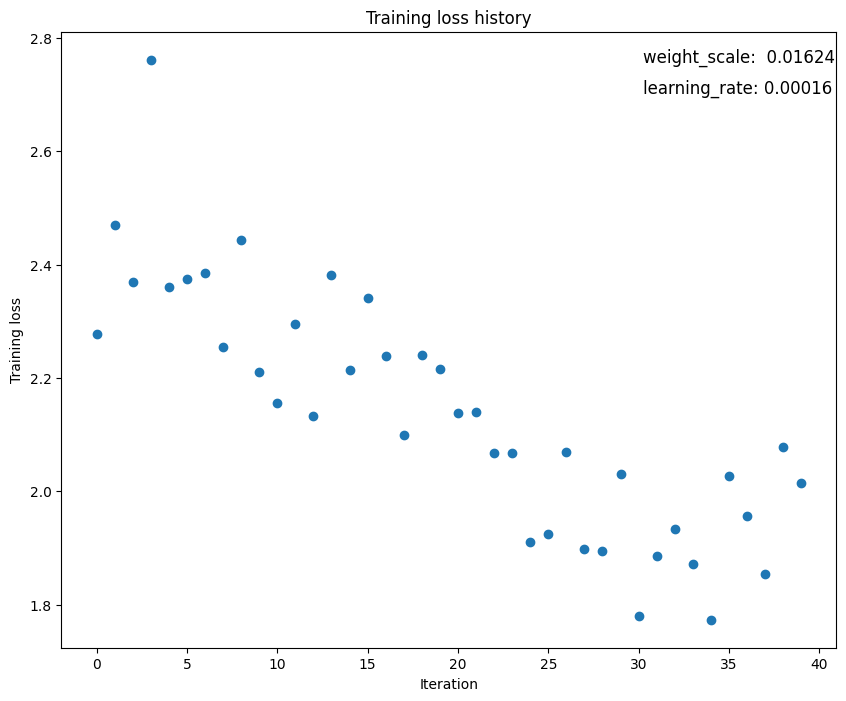

(Iteration 1 / 40) loss: 2.255497
(Epoch 0 / 20) train acc: 0.060000; val_acc: 0.099000
(Epoch 1 / 20) train acc: 0.060000; val_acc: 0.099000
(Epoch 2 / 20) train acc: 0.100000; val_acc: 0.100000
(Epoch 3 / 20) train acc: 0.120000; val_acc: 0.106000
(Epoch 4 / 20) train acc: 0.120000; val_acc: 0.108000
(Epoch 5 / 20) train acc: 0.140000; val_acc: 0.117000
(Iteration 11 / 40) loss: 2.483136
(Epoch 6 / 20) train acc: 0.160000; val_acc: 0.119000
(Epoch 7 / 20) train acc: 0.160000; val_acc: 0.124000
(Epoch 8 / 20) train acc: 0.160000; val_acc: 0.124000
(Epoch 9 / 20) train acc: 0.180000; val_acc: 0.124000
(Epoch 10 / 20) train acc: 0.180000; val_acc: 0.129000
(Iteration 21 / 40) loss: 2.208438
(Epoch 11 / 20) train acc: 0.180000; val_acc: 0.131000
(Epoch 12 / 20) train acc: 0.180000; val_acc: 0.129000
(Epoch 13 / 20) train acc: 0.200000; val_acc: 0.137000
(Epoch 14 / 20) train acc: 0.240000; val_acc: 0.139000
(Epoch 15 / 20) train acc: 0.240000; val_acc: 0.140000
(Iteration 31 / 40) loss: 

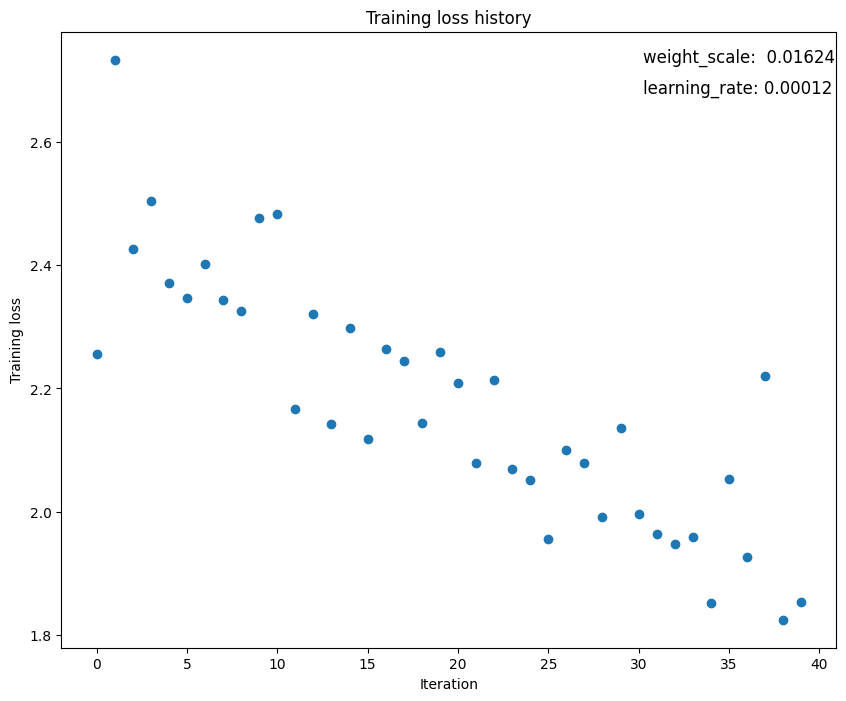

(Iteration 1 / 40) loss: 2.693038
(Epoch 0 / 20) train acc: 0.140000; val_acc: 0.110000
(Epoch 1 / 20) train acc: 0.140000; val_acc: 0.110000
(Epoch 2 / 20) train acc: 0.140000; val_acc: 0.116000
(Epoch 3 / 20) train acc: 0.160000; val_acc: 0.108000
(Epoch 4 / 20) train acc: 0.280000; val_acc: 0.113000
(Epoch 5 / 20) train acc: 0.340000; val_acc: 0.120000
(Iteration 11 / 40) loss: 2.008820
(Epoch 6 / 20) train acc: 0.380000; val_acc: 0.121000
(Epoch 7 / 20) train acc: 0.400000; val_acc: 0.121000
(Epoch 8 / 20) train acc: 0.480000; val_acc: 0.122000
(Epoch 9 / 20) train acc: 0.520000; val_acc: 0.131000
(Epoch 10 / 20) train acc: 0.600000; val_acc: 0.133000
(Iteration 21 / 40) loss: 1.718159
(Epoch 11 / 20) train acc: 0.560000; val_acc: 0.126000
(Epoch 12 / 20) train acc: 0.660000; val_acc: 0.129000
(Epoch 13 / 20) train acc: 0.660000; val_acc: 0.131000
(Epoch 14 / 20) train acc: 0.720000; val_acc: 0.131000
(Epoch 15 / 20) train acc: 0.720000; val_acc: 0.129000
(Iteration 31 / 40) loss: 

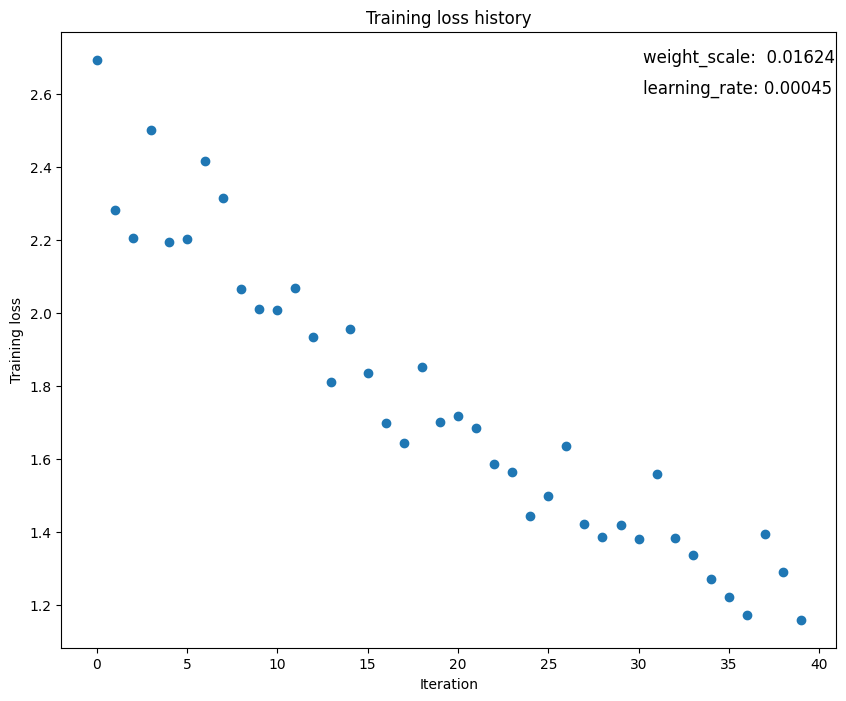

(Iteration 1 / 40) loss: 2.425042
(Epoch 0 / 20) train acc: 0.140000; val_acc: 0.114000
(Epoch 1 / 20) train acc: 0.140000; val_acc: 0.115000
(Epoch 2 / 20) train acc: 0.120000; val_acc: 0.122000
(Epoch 3 / 20) train acc: 0.260000; val_acc: 0.110000
(Epoch 4 / 20) train acc: 0.260000; val_acc: 0.116000
(Epoch 5 / 20) train acc: 0.300000; val_acc: 0.119000
(Iteration 11 / 40) loss: 2.085165
(Epoch 6 / 20) train acc: 0.340000; val_acc: 0.117000
(Epoch 7 / 20) train acc: 0.360000; val_acc: 0.126000
(Epoch 8 / 20) train acc: 0.380000; val_acc: 0.119000
(Epoch 9 / 20) train acc: 0.420000; val_acc: 0.110000
(Epoch 10 / 20) train acc: 0.520000; val_acc: 0.111000
(Iteration 21 / 40) loss: 1.481192
(Epoch 11 / 20) train acc: 0.520000; val_acc: 0.113000
(Epoch 12 / 20) train acc: 0.560000; val_acc: 0.113000
(Epoch 13 / 20) train acc: 0.560000; val_acc: 0.111000
(Epoch 14 / 20) train acc: 0.560000; val_acc: 0.115000
(Epoch 15 / 20) train acc: 0.600000; val_acc: 0.109000
(Iteration 31 / 40) loss: 

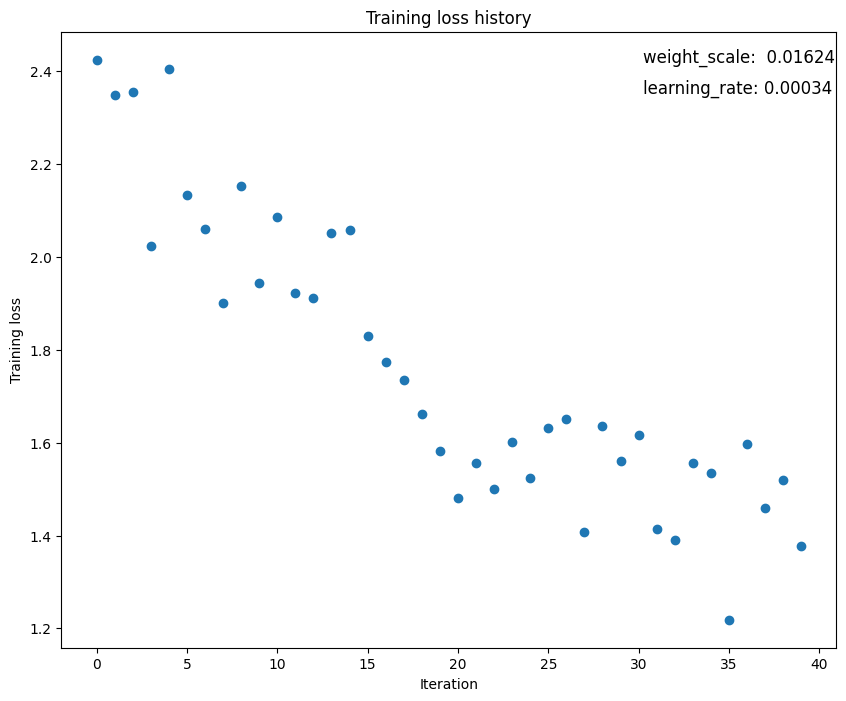

(Iteration 1 / 40) loss: 2.375908
(Epoch 0 / 20) train acc: 0.220000; val_acc: 0.115000
(Epoch 1 / 20) train acc: 0.240000; val_acc: 0.111000
(Epoch 2 / 20) train acc: 0.280000; val_acc: 0.114000
(Epoch 3 / 20) train acc: 0.280000; val_acc: 0.114000
(Epoch 4 / 20) train acc: 0.300000; val_acc: 0.115000
(Epoch 5 / 20) train acc: 0.280000; val_acc: 0.121000
(Iteration 11 / 40) loss: 1.932609
(Epoch 6 / 20) train acc: 0.340000; val_acc: 0.121000
(Epoch 7 / 20) train acc: 0.300000; val_acc: 0.133000
(Epoch 8 / 20) train acc: 0.400000; val_acc: 0.143000
(Epoch 9 / 20) train acc: 0.440000; val_acc: 0.138000
(Epoch 10 / 20) train acc: 0.500000; val_acc: 0.139000
(Iteration 21 / 40) loss: 1.713909
(Epoch 11 / 20) train acc: 0.500000; val_acc: 0.143000
(Epoch 12 / 20) train acc: 0.500000; val_acc: 0.153000
(Epoch 13 / 20) train acc: 0.520000; val_acc: 0.154000
(Epoch 14 / 20) train acc: 0.600000; val_acc: 0.153000
(Epoch 15 / 20) train acc: 0.600000; val_acc: 0.150000
(Iteration 31 / 40) loss: 

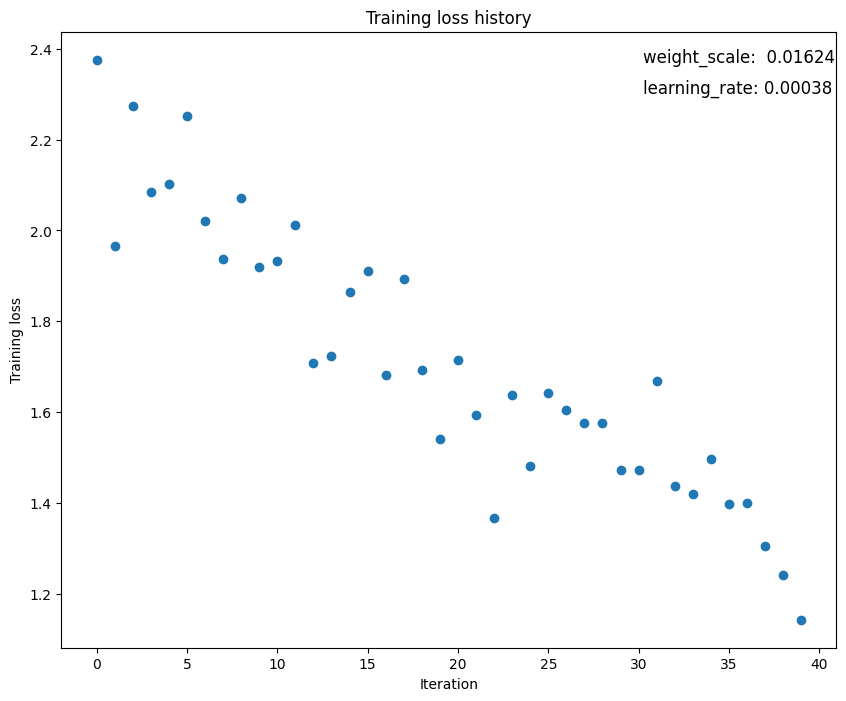

In [ ]:
# TODO: Usar uma rede de 3-camadas para "sobreajustar" (overfit) 50 exemplos de treinamento.

num_train = 50
small_data = {
  'X_train': data['X_train'][:num_train],
  'y_train': data['y_train'][:num_train],
  'X_val': data['X_val'],
  'y_val': data['y_val'],
}

#weight_scale = 1e-2    # experimente variar entre 1e-2 e 5e-2
#learning_rate = 1e-4   # experimente variar entre 1e-4 e 5e-4

# defindo os valores de weight_scale e learning_rate usando valores aleatórios
np.random.seed(42)
weight_scale_list = np.random.uniform(1e-2, 5e-2, 5)
learning_rate_list = np.random.uniform(1e-4, 5e-4, 5)

for weight_scale in weight_scale_list:
  for learning_rate in learning_rate_list:
    model = FullyConnectedNet([100, 100],
              weight_scale=weight_scale, dtype=np.float64)
    solver = Solver(model, small_data,
                print_every=10, num_epochs=20, batch_size=25,
                update_rule='sgd',
                optim_config={
                  'learning_rate': learning_rate,
                }
         )
    solver.train()

    plt.plot(solver.loss_history, 'o')
    plt.title(f'Training loss history')
    plt.xlabel('Iteration')
    plt.ylabel('Training loss')
    plt.annotate(f'weight_scale: {weight_scale: .5f}', xy=(0.75, 0.95), xycoords='axes fraction', fontsize=12)
    plt.annotate(f'learning_rate: {learning_rate:.5f}', xy=(0.75, 0.90), xycoords='axes fraction', fontsize=12)
    plt.show()

**Rede com 3 camadas**

Com as variações de weight_scale (variando entre 1e-2 e 5e-2 ) e learning_rate (vairandoentre 1e-4 e 5e-4) feitas com valores aleatórios foram observados comportamentos de sobreajuste (overfitting) com valores de acurácia de treino= 100%  nas redes com os seguintes valores de weight_scale e learning_rate:

Lista de valores gerados aleatoriamente:


  * weight_scale = [0.0249816,  0.04802857, 0.03927976, 0.03394634, 0.01624075]
  * learning_rate = [0.0001624,  0.00012323, 0.00044647, 0.00034045, 0.00038323]


-----------------------------------------------------

  * weight_scale= 0,04803  |  learning_rate= 0,00045
  * weight_scale= 0,04803  |  learning_rate= 0,00034
  * weight_scale= 0,04803  |  learning_rate= 0,00038
  * weight_scale= 0,03928  |  learning_rate= 0,00045
  * weight_scale= 0,03928  |  learning_rate= 0,00034
  * weight_scale= 0,03928  |  learning_rate= 0,00038
  * weight_scale= 0,03395  |  learning_rate= 0,00045
  * weight_scale= 0,03395  |  learning_rate= 0,00034
  * weight_scale= 0,03395  |  learning_rate= 0,00038

-----------------------------------------------------



Agora, você deve usar uma rede de cinco camadas com 100 unidades em cada camada para fazer o sobreajuste (*overfitting*) de 50 exemplos de treinamento.
**Novamente, você deverá ajustar a taxa de aprendizado e a escala de inicialição de pesos**, porém você deve conseguir alcançar 100% de acurácia dentro de 20 épocas.

(Iteration 1 / 40) loss: 111.588318
(Epoch 0 / 20) train acc: 0.300000; val_acc: 0.086000
(Epoch 1 / 20) train acc: 0.180000; val_acc: 0.107000
(Epoch 2 / 20) train acc: 0.440000; val_acc: 0.106000
(Epoch 3 / 20) train acc: 0.680000; val_acc: 0.126000
(Epoch 4 / 20) train acc: 0.740000; val_acc: 0.127000
(Epoch 5 / 20) train acc: 0.920000; val_acc: 0.124000
(Iteration 11 / 40) loss: 0.000081
(Epoch 6 / 20) train acc: 0.900000; val_acc: 0.130000
(Epoch 7 / 20) train acc: 1.000000; val_acc: 0.109000
(Epoch 8 / 20) train acc: 1.000000; val_acc: 0.107000
(Epoch 9 / 20) train acc: 1.000000; val_acc: 0.107000
(Epoch 10 / 20) train acc: 1.000000; val_acc: 0.107000
(Iteration 21 / 40) loss: 0.000030
(Epoch 11 / 20) train acc: 1.000000; val_acc: 0.107000
(Epoch 12 / 20) train acc: 1.000000; val_acc: 0.107000
(Epoch 13 / 20) train acc: 1.000000; val_acc: 0.107000
(Epoch 14 / 20) train acc: 1.000000; val_acc: 0.108000
(Epoch 15 / 20) train acc: 1.000000; val_acc: 0.108000
(Iteration 31 / 40) loss

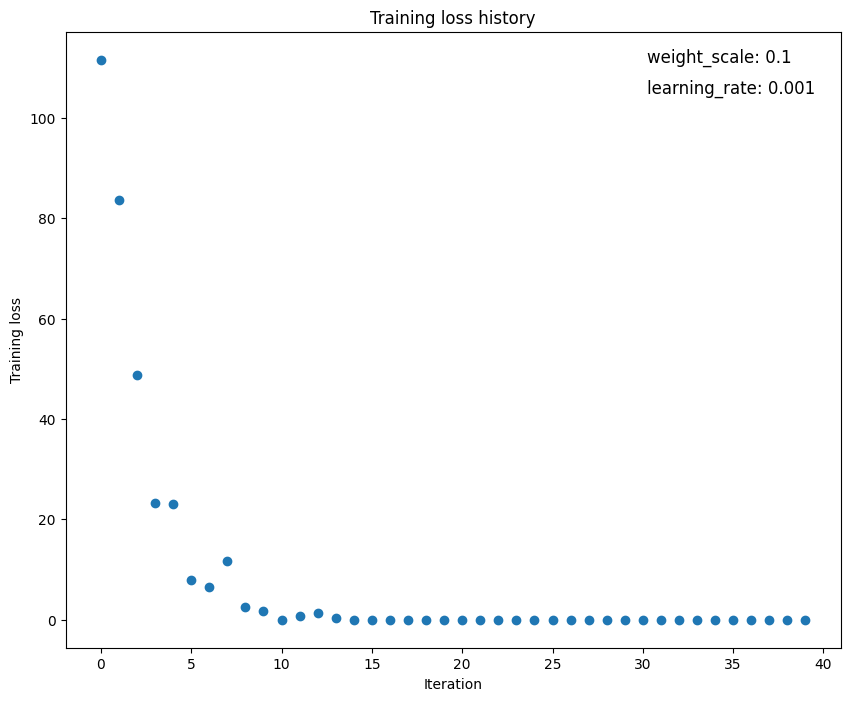

In [ ]:
# TODO: Usar uma rede de 5-camadas para "sobreajustar" (overfit) 50 exemplos de treinamento.

num_train = 50
small_data = {
  'X_train': data['X_train'][:num_train],
  'y_train': data['y_train'][:num_train],
  'X_val': data['X_val'],
  'y_val': data['y_val'],
}

#weight_scale = 1e-2    # experimente variar entre 1e-2 e 1e-1
#learning_rate = 1e-4   # experimente variar entre 1e-5 e 1e-3
weight_scale_list = [1e-1]
learning_rate_list = [1e-3]

for weight_scale in weight_scale_list:
  for learning_rate in learning_rate_list:
    model = FullyConnectedNet([100, 100, 100, 100],
              weight_scale=weight_scale, dtype=np.float64)
    solver = Solver(model, small_data,
                print_every=10, num_epochs=20, batch_size=25,
                update_rule='sgd',
                optim_config={
                  'learning_rate': learning_rate,
                }
         )
    solver.train()

    plt.plot(solver.loss_history, 'o')
    plt.title(f'Training loss history')
    plt.xlabel('Iteration')
    plt.ylabel('Training loss')
    plt.annotate(f'weight_scale: {weight_scale}', xy=(0.75, 0.95), xycoords='axes fraction', fontsize=12)
    plt.annotate(f'learning_rate: {learning_rate}', xy=(0.75, 0.90), xycoords='axes fraction', fontsize=12)
    plt.show()

(Iteration 1 / 40) loss: 2.858523
(Epoch 0 / 20) train acc: 0.100000; val_acc: 0.092000
(Epoch 1 / 20) train acc: 0.100000; val_acc: 0.090000
(Epoch 2 / 20) train acc: 0.120000; val_acc: 0.096000
(Epoch 3 / 20) train acc: 0.120000; val_acc: 0.095000
(Epoch 4 / 20) train acc: 0.120000; val_acc: 0.094000
(Epoch 5 / 20) train acc: 0.120000; val_acc: 0.094000
(Iteration 11 / 40) loss: 2.663336
(Epoch 6 / 20) train acc: 0.120000; val_acc: 0.092000
(Epoch 7 / 20) train acc: 0.140000; val_acc: 0.094000
(Epoch 8 / 20) train acc: 0.120000; val_acc: 0.093000
(Epoch 9 / 20) train acc: 0.120000; val_acc: 0.093000
(Epoch 10 / 20) train acc: 0.140000; val_acc: 0.096000
(Iteration 21 / 40) loss: 3.042846
(Epoch 11 / 20) train acc: 0.140000; val_acc: 0.093000
(Epoch 12 / 20) train acc: 0.140000; val_acc: 0.091000
(Epoch 13 / 20) train acc: 0.140000; val_acc: 0.093000
(Epoch 14 / 20) train acc: 0.140000; val_acc: 0.090000
(Epoch 15 / 20) train acc: 0.140000; val_acc: 0.091000
(Iteration 31 / 40) loss: 

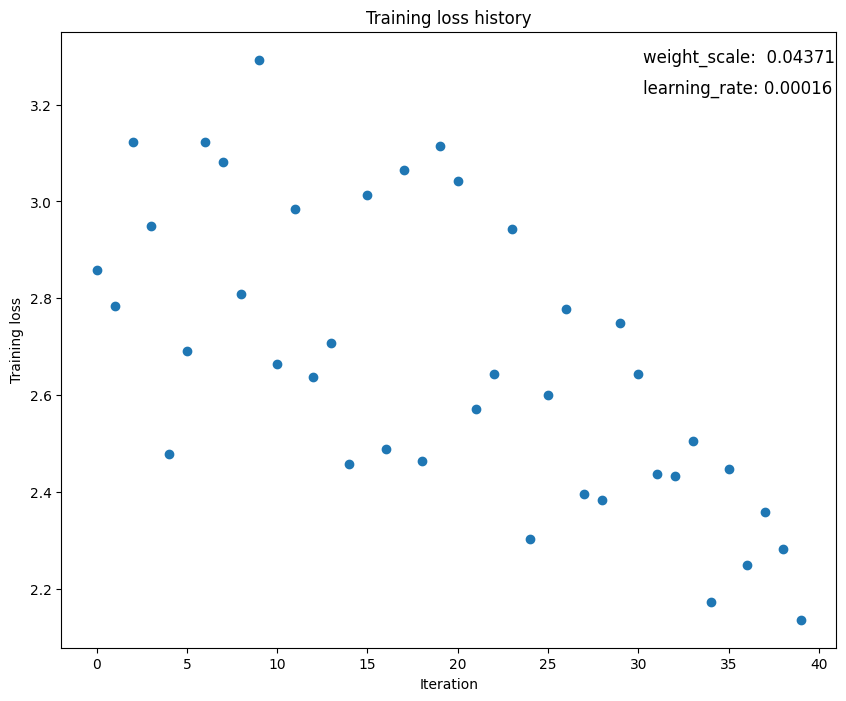

(Iteration 1 / 40) loss: 2.872877
(Epoch 0 / 20) train acc: 0.060000; val_acc: 0.082000
(Epoch 1 / 20) train acc: 0.060000; val_acc: 0.084000
(Epoch 2 / 20) train acc: 0.080000; val_acc: 0.085000
(Epoch 3 / 20) train acc: 0.080000; val_acc: 0.088000
(Epoch 4 / 20) train acc: 0.100000; val_acc: 0.089000
(Epoch 5 / 20) train acc: 0.100000; val_acc: 0.091000
(Iteration 11 / 40) loss: 2.939428
(Epoch 6 / 20) train acc: 0.100000; val_acc: 0.093000
(Epoch 7 / 20) train acc: 0.120000; val_acc: 0.092000
(Epoch 8 / 20) train acc: 0.120000; val_acc: 0.094000
(Epoch 9 / 20) train acc: 0.120000; val_acc: 0.094000
(Epoch 10 / 20) train acc: 0.120000; val_acc: 0.097000
(Iteration 21 / 40) loss: 2.603985
(Epoch 11 / 20) train acc: 0.120000; val_acc: 0.100000
(Epoch 12 / 20) train acc: 0.120000; val_acc: 0.098000
(Epoch 13 / 20) train acc: 0.120000; val_acc: 0.098000
(Epoch 14 / 20) train acc: 0.120000; val_acc: 0.097000
(Epoch 15 / 20) train acc: 0.140000; val_acc: 0.097000
(Iteration 31 / 40) loss: 

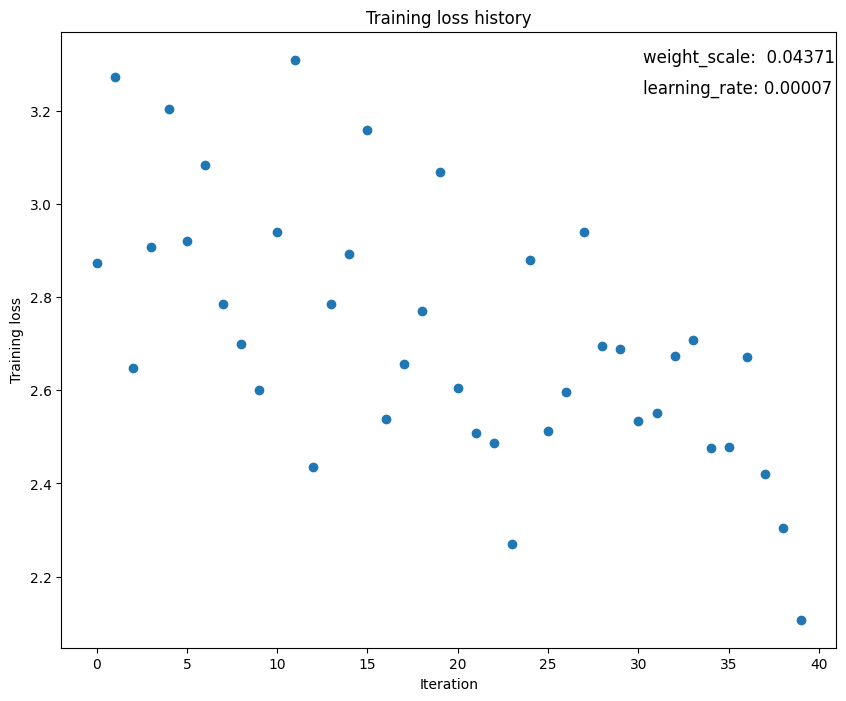

(Iteration 1 / 40) loss: 2.826344
(Epoch 0 / 20) train acc: 0.100000; val_acc: 0.116000
(Epoch 1 / 20) train acc: 0.140000; val_acc: 0.112000
(Epoch 2 / 20) train acc: 0.160000; val_acc: 0.120000
(Epoch 3 / 20) train acc: 0.240000; val_acc: 0.115000
(Epoch 4 / 20) train acc: 0.320000; val_acc: 0.099000
(Epoch 5 / 20) train acc: 0.340000; val_acc: 0.103000
(Iteration 11 / 40) loss: 1.851279
(Epoch 6 / 20) train acc: 0.360000; val_acc: 0.098000
(Epoch 7 / 20) train acc: 0.400000; val_acc: 0.102000
(Epoch 8 / 20) train acc: 0.440000; val_acc: 0.103000
(Epoch 9 / 20) train acc: 0.460000; val_acc: 0.100000
(Epoch 10 / 20) train acc: 0.560000; val_acc: 0.125000
(Iteration 21 / 40) loss: 1.680647
(Epoch 11 / 20) train acc: 0.580000; val_acc: 0.117000
(Epoch 12 / 20) train acc: 0.560000; val_acc: 0.117000
(Epoch 13 / 20) train acc: 0.660000; val_acc: 0.112000
(Epoch 14 / 20) train acc: 0.640000; val_acc: 0.123000
(Epoch 15 / 20) train acc: 0.700000; val_acc: 0.127000
(Iteration 31 / 40) loss: 

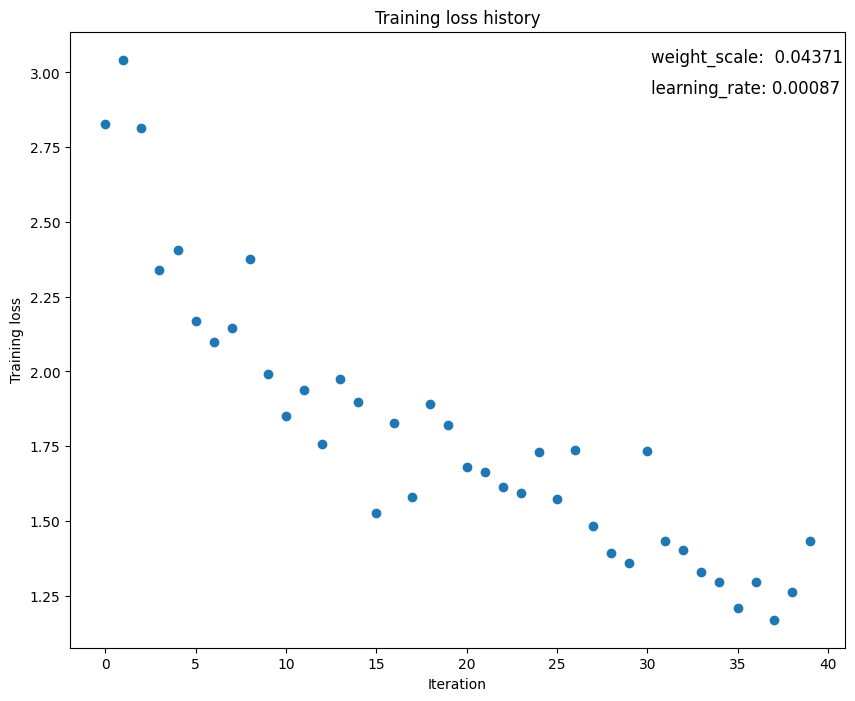

(Iteration 1 / 40) loss: 2.926117
(Epoch 0 / 20) train acc: 0.100000; val_acc: 0.107000
(Epoch 1 / 20) train acc: 0.080000; val_acc: 0.110000
(Epoch 2 / 20) train acc: 0.120000; val_acc: 0.109000
(Epoch 3 / 20) train acc: 0.140000; val_acc: 0.116000
(Epoch 4 / 20) train acc: 0.220000; val_acc: 0.116000
(Epoch 5 / 20) train acc: 0.240000; val_acc: 0.112000
(Iteration 11 / 40) loss: 2.178234
(Epoch 6 / 20) train acc: 0.240000; val_acc: 0.120000
(Epoch 7 / 20) train acc: 0.280000; val_acc: 0.117000
(Epoch 8 / 20) train acc: 0.320000; val_acc: 0.117000
(Epoch 9 / 20) train acc: 0.400000; val_acc: 0.117000
(Epoch 10 / 20) train acc: 0.340000; val_acc: 0.108000
(Iteration 21 / 40) loss: 1.849667
(Epoch 11 / 20) train acc: 0.320000; val_acc: 0.108000
(Epoch 12 / 20) train acc: 0.440000; val_acc: 0.109000
(Epoch 13 / 20) train acc: 0.440000; val_acc: 0.115000
(Epoch 14 / 20) train acc: 0.440000; val_acc: 0.119000
(Epoch 15 / 20) train acc: 0.480000; val_acc: 0.116000
(Iteration 31 / 40) loss: 

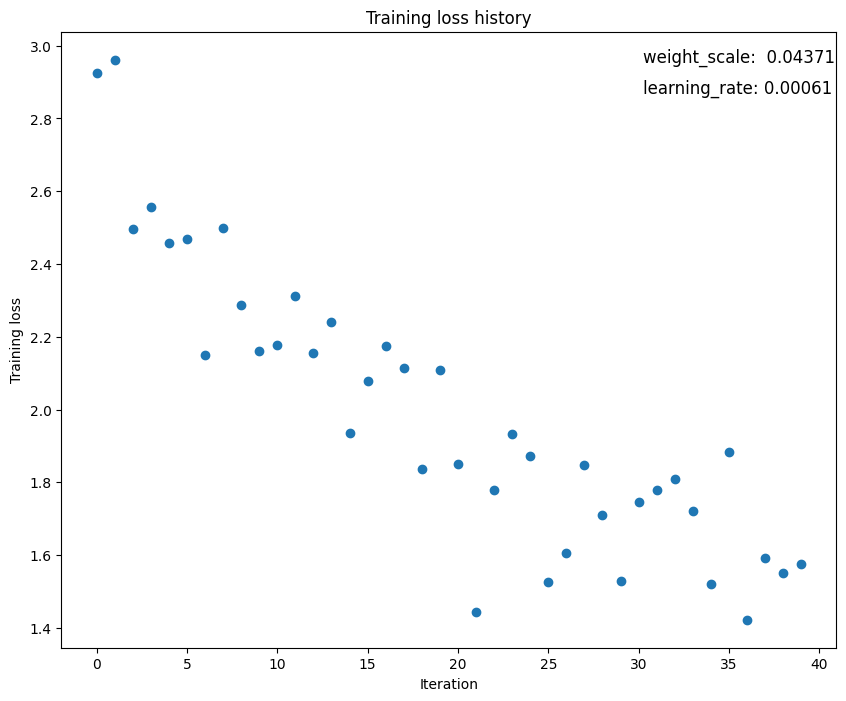

(Iteration 1 / 40) loss: 2.691393
(Epoch 0 / 20) train acc: 0.100000; val_acc: 0.091000
(Epoch 1 / 20) train acc: 0.120000; val_acc: 0.099000
(Epoch 2 / 20) train acc: 0.160000; val_acc: 0.097000
(Epoch 3 / 20) train acc: 0.160000; val_acc: 0.092000
(Epoch 4 / 20) train acc: 0.200000; val_acc: 0.095000
(Epoch 5 / 20) train acc: 0.200000; val_acc: 0.105000
(Iteration 11 / 40) loss: 2.282143
(Epoch 6 / 20) train acc: 0.220000; val_acc: 0.105000
(Epoch 7 / 20) train acc: 0.240000; val_acc: 0.110000
(Epoch 8 / 20) train acc: 0.260000; val_acc: 0.105000
(Epoch 9 / 20) train acc: 0.300000; val_acc: 0.113000
(Epoch 10 / 20) train acc: 0.340000; val_acc: 0.111000
(Iteration 21 / 40) loss: 1.617750
(Epoch 11 / 20) train acc: 0.340000; val_acc: 0.110000
(Epoch 12 / 20) train acc: 0.340000; val_acc: 0.118000
(Epoch 13 / 20) train acc: 0.340000; val_acc: 0.102000
(Epoch 14 / 20) train acc: 0.400000; val_acc: 0.108000
(Epoch 15 / 20) train acc: 0.400000; val_acc: 0.122000
(Iteration 31 / 40) loss: 

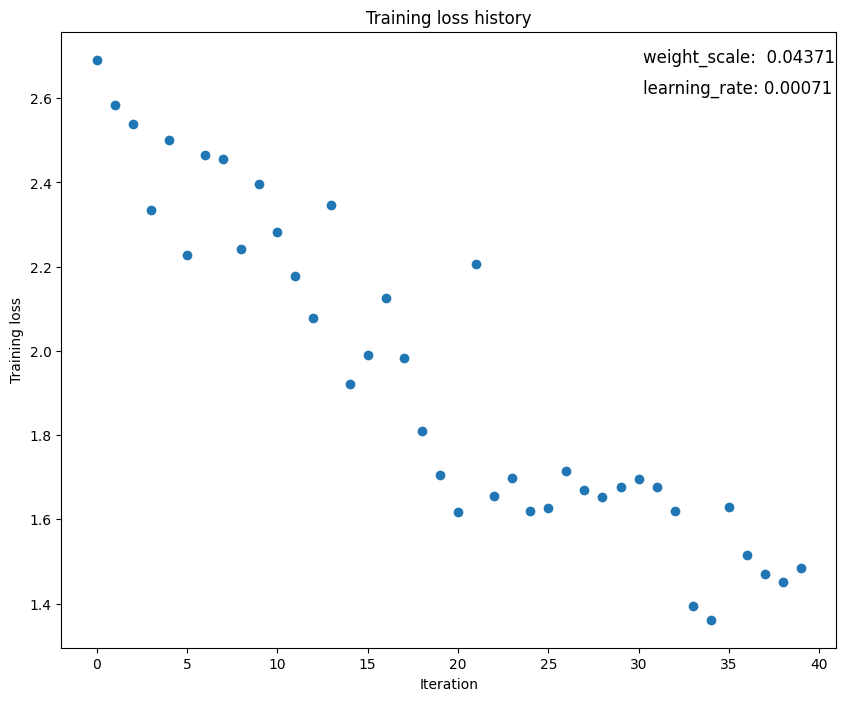

(Iteration 1 / 40) loss: 42.848874
(Epoch 0 / 20) train acc: 0.180000; val_acc: 0.098000
(Epoch 1 / 20) train acc: 0.220000; val_acc: 0.101000
(Epoch 2 / 20) train acc: 0.260000; val_acc: 0.108000
(Epoch 3 / 20) train acc: 0.440000; val_acc: 0.121000
(Epoch 4 / 20) train acc: 0.520000; val_acc: 0.117000
(Epoch 5 / 20) train acc: 0.640000; val_acc: 0.116000
(Iteration 11 / 40) loss: 4.102308
(Epoch 6 / 20) train acc: 0.640000; val_acc: 0.124000
(Epoch 7 / 20) train acc: 0.800000; val_acc: 0.126000
(Epoch 8 / 20) train acc: 0.820000; val_acc: 0.122000
(Epoch 9 / 20) train acc: 0.840000; val_acc: 0.126000
(Epoch 10 / 20) train acc: 0.900000; val_acc: 0.123000
(Iteration 21 / 40) loss: 0.739907
(Epoch 11 / 20) train acc: 0.940000; val_acc: 0.127000
(Epoch 12 / 20) train acc: 0.960000; val_acc: 0.126000
(Epoch 13 / 20) train acc: 0.980000; val_acc: 0.127000
(Epoch 14 / 20) train acc: 0.980000; val_acc: 0.127000
(Epoch 15 / 20) train acc: 0.980000; val_acc: 0.127000
(Iteration 31 / 40) loss:

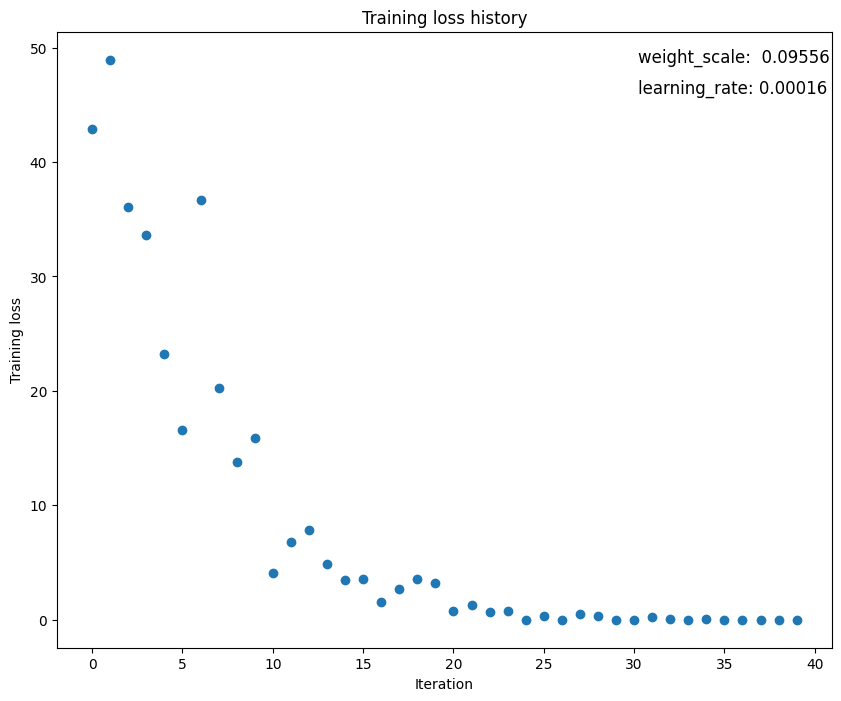

(Iteration 1 / 40) loss: 111.911875
(Epoch 0 / 20) train acc: 0.120000; val_acc: 0.115000
(Epoch 1 / 20) train acc: 0.140000; val_acc: 0.131000
(Epoch 2 / 20) train acc: 0.160000; val_acc: 0.125000
(Epoch 3 / 20) train acc: 0.240000; val_acc: 0.136000
(Epoch 4 / 20) train acc: 0.340000; val_acc: 0.135000
(Epoch 5 / 20) train acc: 0.300000; val_acc: 0.122000
(Iteration 11 / 40) loss: 36.338543
(Epoch 6 / 20) train acc: 0.320000; val_acc: 0.117000
(Epoch 7 / 20) train acc: 0.300000; val_acc: 0.132000
(Epoch 8 / 20) train acc: 0.300000; val_acc: 0.129000
(Epoch 9 / 20) train acc: 0.320000; val_acc: 0.135000
(Epoch 10 / 20) train acc: 0.400000; val_acc: 0.136000
(Iteration 21 / 40) loss: 15.621894
(Epoch 11 / 20) train acc: 0.520000; val_acc: 0.129000
(Epoch 12 / 20) train acc: 0.640000; val_acc: 0.127000
(Epoch 13 / 20) train acc: 0.620000; val_acc: 0.137000
(Epoch 14 / 20) train acc: 0.700000; val_acc: 0.136000
(Epoch 15 / 20) train acc: 0.700000; val_acc: 0.139000
(Iteration 31 / 40) lo

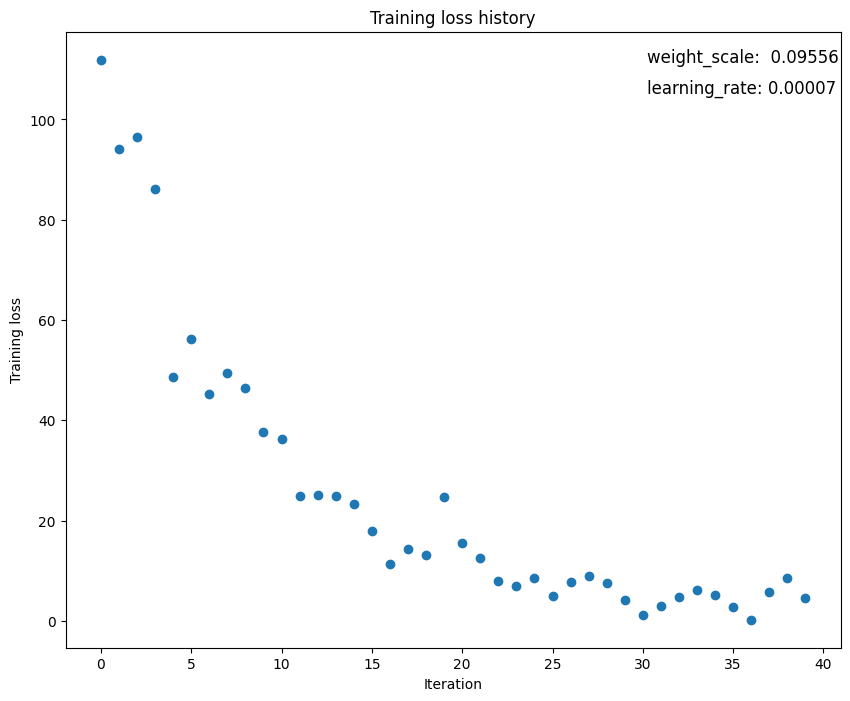

(Iteration 1 / 40) loss: 108.488109
(Epoch 0 / 20) train acc: 0.140000; val_acc: 0.132000
(Epoch 1 / 20) train acc: 0.320000; val_acc: 0.127000
(Epoch 2 / 20) train acc: 0.320000; val_acc: 0.128000
(Epoch 3 / 20) train acc: 0.440000; val_acc: 0.135000
(Epoch 4 / 20) train acc: 0.700000; val_acc: 0.131000
(Epoch 5 / 20) train acc: 0.780000; val_acc: 0.133000
(Iteration 11 / 40) loss: 0.452126
(Epoch 6 / 20) train acc: 0.920000; val_acc: 0.131000
(Epoch 7 / 20) train acc: 0.980000; val_acc: 0.116000
(Epoch 8 / 20) train acc: 0.980000; val_acc: 0.113000
(Epoch 9 / 20) train acc: 0.980000; val_acc: 0.113000
(Epoch 10 / 20) train acc: 1.000000; val_acc: 0.118000
(Iteration 21 / 40) loss: 0.001974
(Epoch 11 / 20) train acc: 1.000000; val_acc: 0.117000
(Epoch 12 / 20) train acc: 1.000000; val_acc: 0.117000
(Epoch 13 / 20) train acc: 1.000000; val_acc: 0.117000
(Epoch 14 / 20) train acc: 1.000000; val_acc: 0.117000
(Epoch 15 / 20) train acc: 1.000000; val_acc: 0.117000
(Iteration 31 / 40) loss

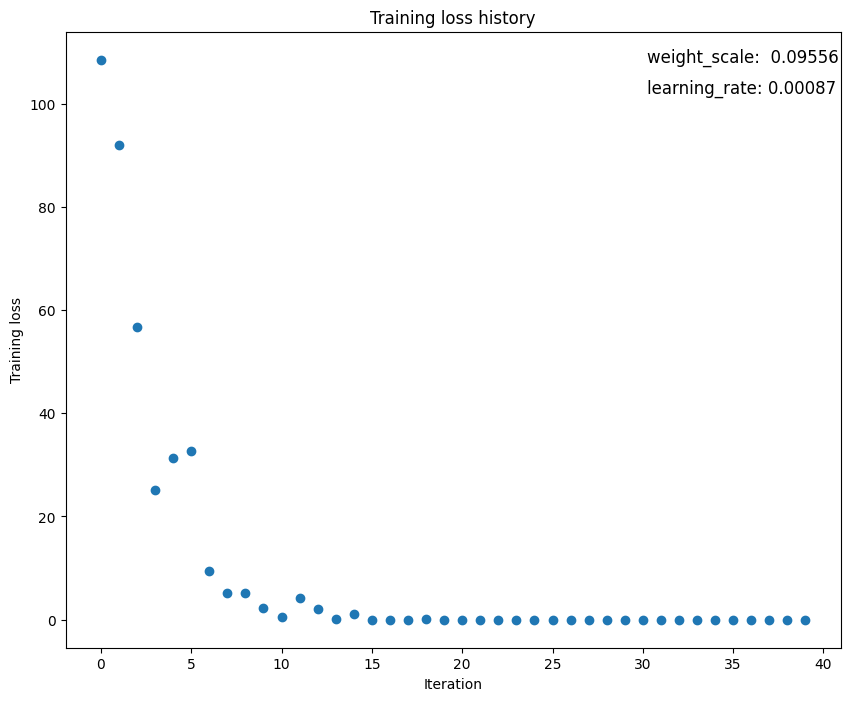

(Iteration 1 / 40) loss: 125.919175
(Epoch 0 / 20) train acc: 0.100000; val_acc: 0.088000
(Epoch 1 / 20) train acc: 0.200000; val_acc: 0.085000
(Epoch 2 / 20) train acc: 0.440000; val_acc: 0.106000
(Epoch 3 / 20) train acc: 0.600000; val_acc: 0.103000
(Epoch 4 / 20) train acc: 0.740000; val_acc: 0.100000
(Epoch 5 / 20) train acc: 0.860000; val_acc: 0.100000
(Iteration 11 / 40) loss: 2.924423
(Epoch 6 / 20) train acc: 0.900000; val_acc: 0.094000
(Epoch 7 / 20) train acc: 0.940000; val_acc: 0.103000
(Epoch 8 / 20) train acc: 1.000000; val_acc: 0.100000
(Epoch 9 / 20) train acc: 1.000000; val_acc: 0.100000
(Epoch 10 / 20) train acc: 1.000000; val_acc: 0.100000
(Iteration 21 / 40) loss: 0.001966
(Epoch 11 / 20) train acc: 1.000000; val_acc: 0.101000
(Epoch 12 / 20) train acc: 1.000000; val_acc: 0.101000
(Epoch 13 / 20) train acc: 1.000000; val_acc: 0.100000
(Epoch 14 / 20) train acc: 1.000000; val_acc: 0.100000
(Epoch 15 / 20) train acc: 1.000000; val_acc: 0.100000
(Iteration 31 / 40) loss

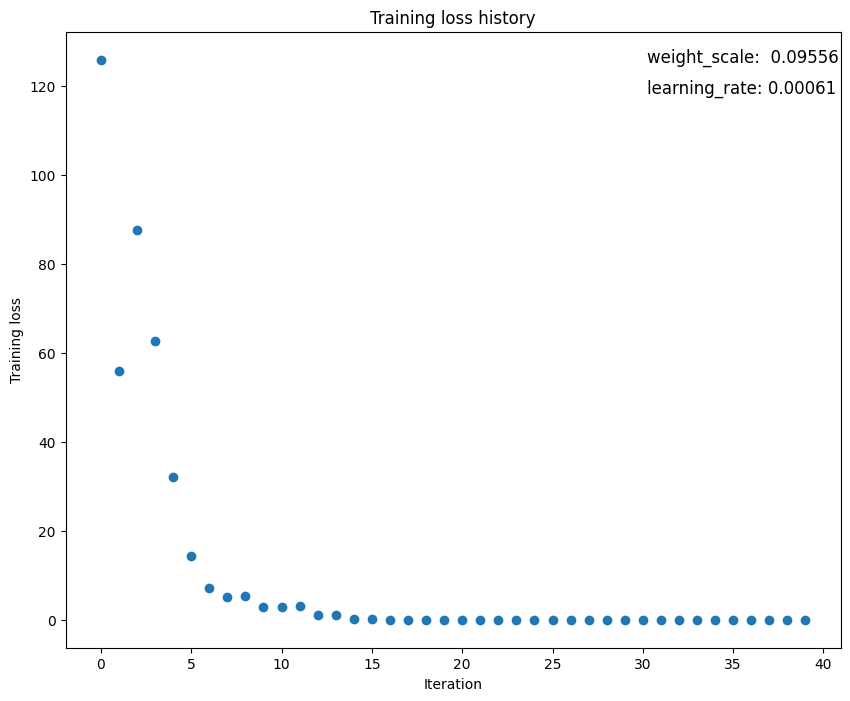

(Iteration 1 / 40) loss: 90.777800
(Epoch 0 / 20) train acc: 0.140000; val_acc: 0.105000
(Epoch 1 / 20) train acc: 0.280000; val_acc: 0.101000
(Epoch 2 / 20) train acc: 0.300000; val_acc: 0.090000
(Epoch 3 / 20) train acc: 0.520000; val_acc: 0.099000
(Epoch 4 / 20) train acc: 0.660000; val_acc: 0.108000
(Epoch 5 / 20) train acc: 0.800000; val_acc: 0.113000
(Iteration 11 / 40) loss: 1.740268
(Epoch 6 / 20) train acc: 0.860000; val_acc: 0.117000
(Epoch 7 / 20) train acc: 0.920000; val_acc: 0.105000
(Epoch 8 / 20) train acc: 1.000000; val_acc: 0.109000
(Epoch 9 / 20) train acc: 1.000000; val_acc: 0.111000
(Epoch 10 / 20) train acc: 1.000000; val_acc: 0.114000
(Iteration 21 / 40) loss: 0.002626
(Epoch 11 / 20) train acc: 1.000000; val_acc: 0.115000
(Epoch 12 / 20) train acc: 1.000000; val_acc: 0.115000
(Epoch 13 / 20) train acc: 1.000000; val_acc: 0.114000
(Epoch 14 / 20) train acc: 1.000000; val_acc: 0.114000
(Epoch 15 / 20) train acc: 1.000000; val_acc: 0.114000
(Iteration 31 / 40) loss:

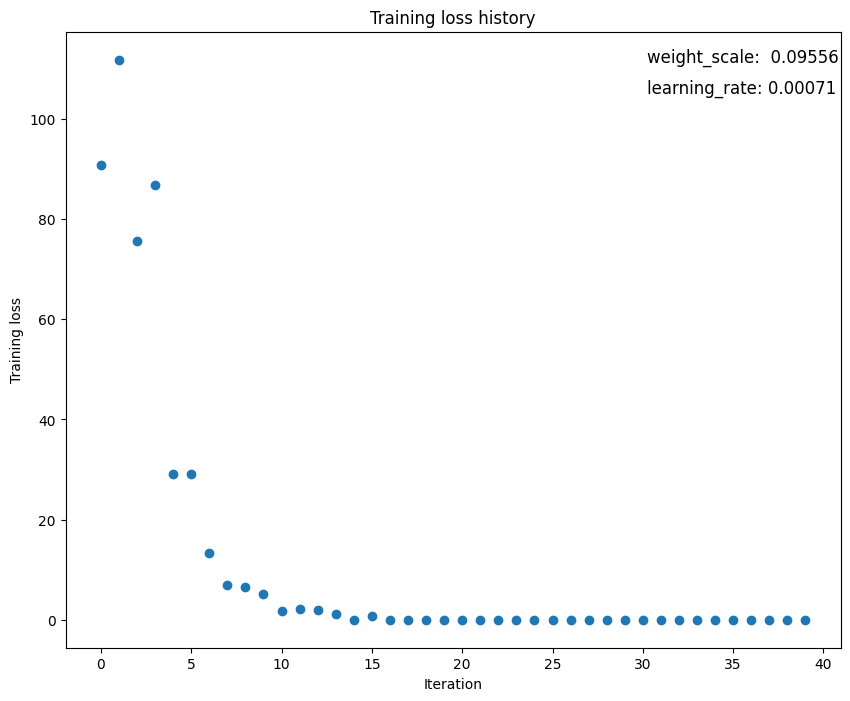

(Iteration 1 / 40) loss: 27.191407
(Epoch 0 / 20) train acc: 0.120000; val_acc: 0.097000
(Epoch 1 / 20) train acc: 0.180000; val_acc: 0.098000
(Epoch 2 / 20) train acc: 0.200000; val_acc: 0.083000
(Epoch 3 / 20) train acc: 0.220000; val_acc: 0.085000
(Epoch 4 / 20) train acc: 0.320000; val_acc: 0.086000
(Epoch 5 / 20) train acc: 0.400000; val_acc: 0.085000
(Iteration 11 / 40) loss: 8.369975
(Epoch 6 / 20) train acc: 0.400000; val_acc: 0.096000
(Epoch 7 / 20) train acc: 0.440000; val_acc: 0.091000
(Epoch 8 / 20) train acc: 0.500000; val_acc: 0.093000
(Epoch 9 / 20) train acc: 0.540000; val_acc: 0.099000
(Epoch 10 / 20) train acc: 0.460000; val_acc: 0.091000
(Iteration 21 / 40) loss: 4.445337
(Epoch 11 / 20) train acc: 0.640000; val_acc: 0.099000
(Epoch 12 / 20) train acc: 0.660000; val_acc: 0.101000
(Epoch 13 / 20) train acc: 0.720000; val_acc: 0.099000
(Epoch 14 / 20) train acc: 0.720000; val_acc: 0.096000
(Epoch 15 / 20) train acc: 0.780000; val_acc: 0.094000
(Iteration 31 / 40) loss:

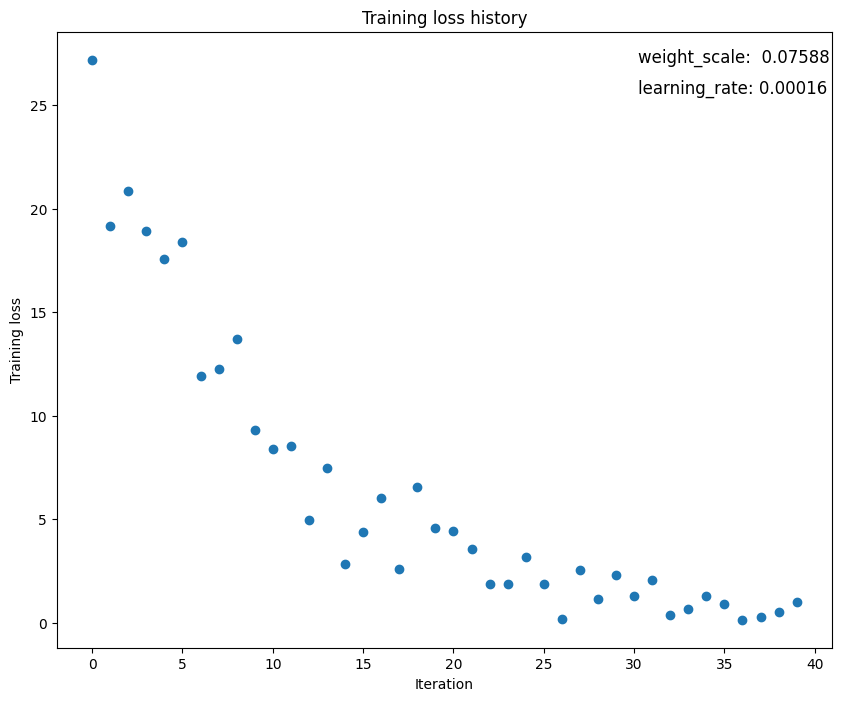

(Iteration 1 / 40) loss: 25.108830
(Epoch 0 / 20) train acc: 0.040000; val_acc: 0.072000
(Epoch 1 / 20) train acc: 0.040000; val_acc: 0.072000
(Epoch 2 / 20) train acc: 0.040000; val_acc: 0.075000
(Epoch 3 / 20) train acc: 0.100000; val_acc: 0.085000
(Epoch 4 / 20) train acc: 0.060000; val_acc: 0.083000
(Epoch 5 / 20) train acc: 0.080000; val_acc: 0.090000
(Iteration 11 / 40) loss: 8.836438
(Epoch 6 / 20) train acc: 0.160000; val_acc: 0.081000
(Epoch 7 / 20) train acc: 0.180000; val_acc: 0.089000
(Epoch 8 / 20) train acc: 0.280000; val_acc: 0.090000
(Epoch 9 / 20) train acc: 0.280000; val_acc: 0.090000
(Epoch 10 / 20) train acc: 0.320000; val_acc: 0.093000
(Iteration 21 / 40) loss: 5.690118
(Epoch 11 / 20) train acc: 0.360000; val_acc: 0.095000
(Epoch 12 / 20) train acc: 0.400000; val_acc: 0.091000
(Epoch 13 / 20) train acc: 0.380000; val_acc: 0.090000
(Epoch 14 / 20) train acc: 0.420000; val_acc: 0.092000
(Epoch 15 / 20) train acc: 0.460000; val_acc: 0.089000
(Iteration 31 / 40) loss:

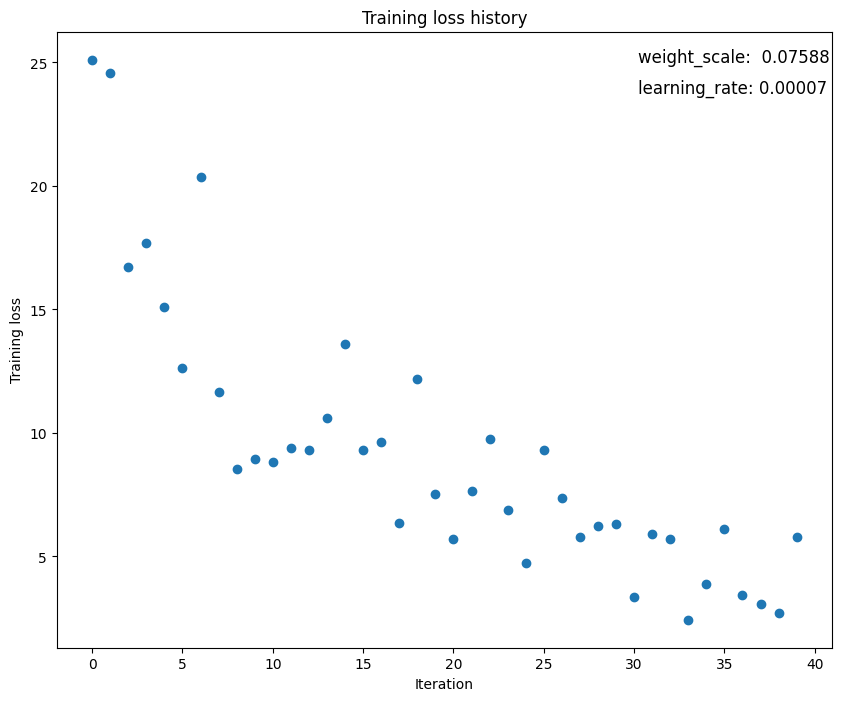

(Iteration 1 / 40) loss: 51.290786
(Epoch 0 / 20) train acc: 0.180000; val_acc: 0.100000
(Epoch 1 / 20) train acc: 0.180000; val_acc: 0.128000
(Epoch 2 / 20) train acc: 0.420000; val_acc: 0.116000
(Epoch 3 / 20) train acc: 0.520000; val_acc: 0.119000
(Epoch 4 / 20) train acc: 0.740000; val_acc: 0.139000
(Epoch 5 / 20) train acc: 0.840000; val_acc: 0.121000
(Iteration 11 / 40) loss: 0.752736
(Epoch 6 / 20) train acc: 0.900000; val_acc: 0.126000
(Epoch 7 / 20) train acc: 0.940000; val_acc: 0.132000
(Epoch 8 / 20) train acc: 0.960000; val_acc: 0.124000
(Epoch 9 / 20) train acc: 0.980000; val_acc: 0.120000
(Epoch 10 / 20) train acc: 0.980000; val_acc: 0.119000
(Iteration 21 / 40) loss: 0.171664
(Epoch 11 / 20) train acc: 1.000000; val_acc: 0.118000
(Epoch 12 / 20) train acc: 1.000000; val_acc: 0.118000
(Epoch 13 / 20) train acc: 1.000000; val_acc: 0.118000
(Epoch 14 / 20) train acc: 1.000000; val_acc: 0.119000
(Epoch 15 / 20) train acc: 1.000000; val_acc: 0.121000
(Iteration 31 / 40) loss:

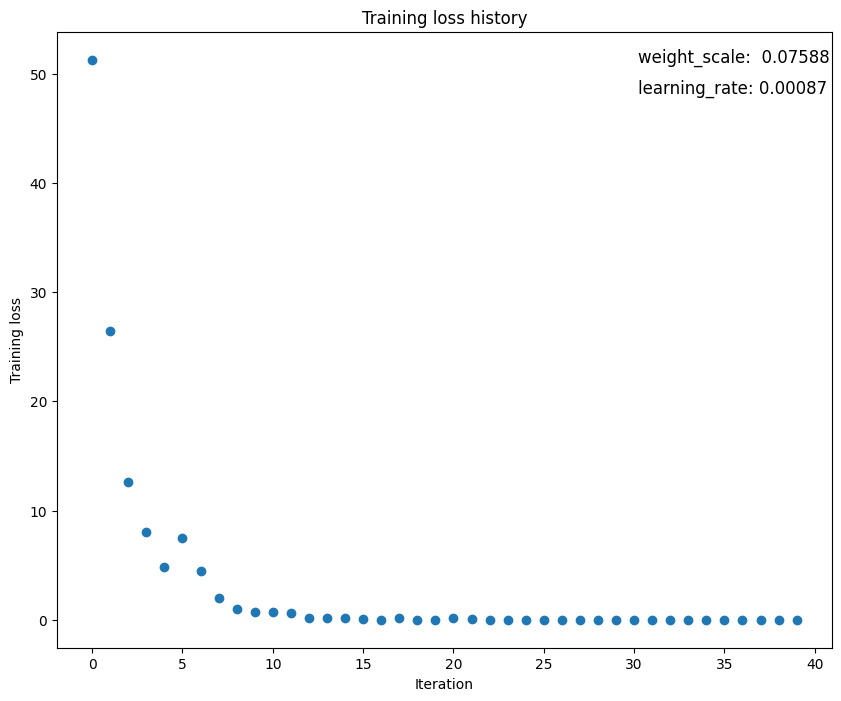

(Iteration 1 / 40) loss: 28.441947
(Epoch 0 / 20) train acc: 0.100000; val_acc: 0.098000
(Epoch 1 / 20) train acc: 0.180000; val_acc: 0.109000
(Epoch 2 / 20) train acc: 0.320000; val_acc: 0.107000
(Epoch 3 / 20) train acc: 0.500000; val_acc: 0.107000
(Epoch 4 / 20) train acc: 0.400000; val_acc: 0.102000
(Epoch 5 / 20) train acc: 0.540000; val_acc: 0.121000
(Iteration 11 / 40) loss: 8.996002
(Epoch 6 / 20) train acc: 0.760000; val_acc: 0.120000
(Epoch 7 / 20) train acc: 0.820000; val_acc: 0.136000
(Epoch 8 / 20) train acc: 0.880000; val_acc: 0.125000
(Epoch 9 / 20) train acc: 0.920000; val_acc: 0.125000
(Epoch 10 / 20) train acc: 0.940000; val_acc: 0.126000
(Iteration 21 / 40) loss: 0.141936
(Epoch 11 / 20) train acc: 0.980000; val_acc: 0.124000
(Epoch 12 / 20) train acc: 1.000000; val_acc: 0.120000
(Epoch 13 / 20) train acc: 1.000000; val_acc: 0.121000
(Epoch 14 / 20) train acc: 1.000000; val_acc: 0.122000
(Epoch 15 / 20) train acc: 1.000000; val_acc: 0.122000
(Iteration 31 / 40) loss:

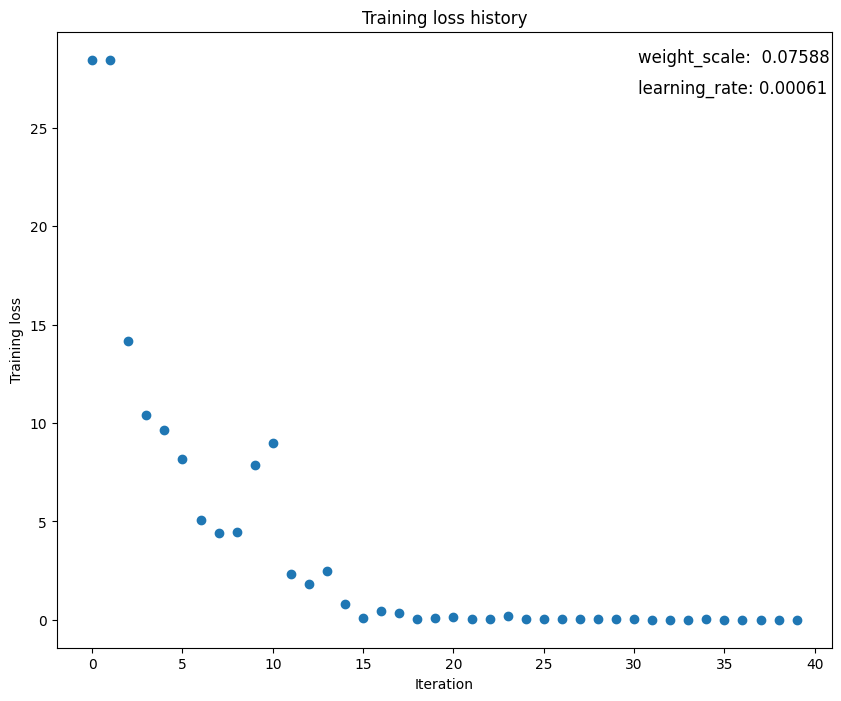

(Iteration 1 / 40) loss: 20.800449
(Epoch 0 / 20) train acc: 0.200000; val_acc: 0.105000
(Epoch 1 / 20) train acc: 0.220000; val_acc: 0.124000
(Epoch 2 / 20) train acc: 0.220000; val_acc: 0.115000
(Epoch 3 / 20) train acc: 0.460000; val_acc: 0.137000
(Epoch 4 / 20) train acc: 0.640000; val_acc: 0.136000
(Epoch 5 / 20) train acc: 0.740000; val_acc: 0.137000
(Iteration 11 / 40) loss: 1.383004
(Epoch 6 / 20) train acc: 0.840000; val_acc: 0.140000
(Epoch 7 / 20) train acc: 0.920000; val_acc: 0.143000
(Epoch 8 / 20) train acc: 0.940000; val_acc: 0.143000
(Epoch 9 / 20) train acc: 0.980000; val_acc: 0.150000
(Epoch 10 / 20) train acc: 0.980000; val_acc: 0.143000
(Iteration 21 / 40) loss: 0.275998
(Epoch 11 / 20) train acc: 0.980000; val_acc: 0.140000
(Epoch 12 / 20) train acc: 0.980000; val_acc: 0.142000
(Epoch 13 / 20) train acc: 1.000000; val_acc: 0.144000
(Epoch 14 / 20) train acc: 1.000000; val_acc: 0.144000
(Epoch 15 / 20) train acc: 1.000000; val_acc: 0.144000
(Iteration 31 / 40) loss:

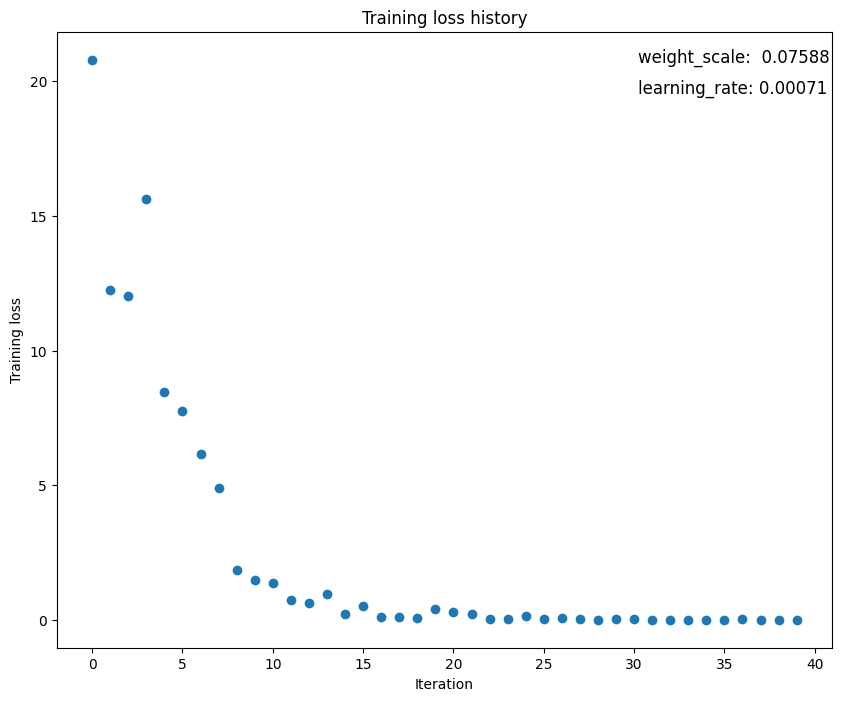

(Iteration 1 / 40) loss: 14.639528
(Epoch 0 / 20) train acc: 0.160000; val_acc: 0.090000
(Epoch 1 / 20) train acc: 0.200000; val_acc: 0.092000
(Epoch 2 / 20) train acc: 0.240000; val_acc: 0.096000
(Epoch 3 / 20) train acc: 0.260000; val_acc: 0.104000
(Epoch 4 / 20) train acc: 0.300000; val_acc: 0.104000
(Epoch 5 / 20) train acc: 0.280000; val_acc: 0.102000
(Iteration 11 / 40) loss: 5.439397
(Epoch 6 / 20) train acc: 0.280000; val_acc: 0.105000
(Epoch 7 / 20) train acc: 0.320000; val_acc: 0.113000
(Epoch 8 / 20) train acc: 0.340000; val_acc: 0.111000
(Epoch 9 / 20) train acc: 0.380000; val_acc: 0.105000
(Epoch 10 / 20) train acc: 0.400000; val_acc: 0.106000
(Iteration 21 / 40) loss: 3.985152
(Epoch 11 / 20) train acc: 0.380000; val_acc: 0.110000
(Epoch 12 / 20) train acc: 0.460000; val_acc: 0.111000
(Epoch 13 / 20) train acc: 0.520000; val_acc: 0.106000
(Epoch 14 / 20) train acc: 0.560000; val_acc: 0.113000
(Epoch 15 / 20) train acc: 0.560000; val_acc: 0.113000
(Iteration 31 / 40) loss:

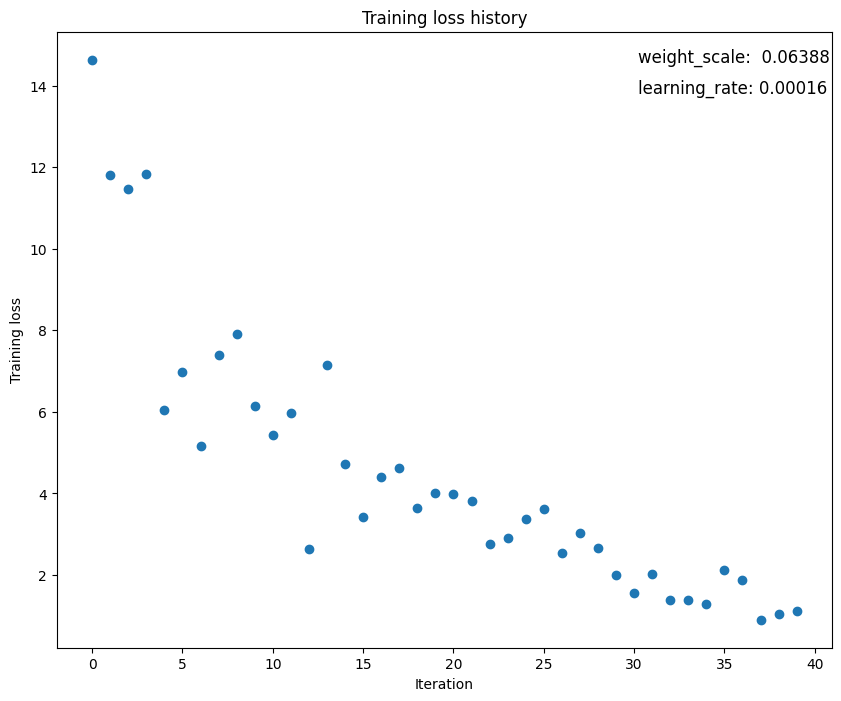

(Iteration 1 / 40) loss: 12.146935
(Epoch 0 / 20) train acc: 0.060000; val_acc: 0.096000
(Epoch 1 / 20) train acc: 0.060000; val_acc: 0.094000
(Epoch 2 / 20) train acc: 0.080000; val_acc: 0.093000
(Epoch 3 / 20) train acc: 0.100000; val_acc: 0.092000
(Epoch 4 / 20) train acc: 0.120000; val_acc: 0.093000
(Epoch 5 / 20) train acc: 0.120000; val_acc: 0.099000
(Iteration 11 / 40) loss: 10.498103
(Epoch 6 / 20) train acc: 0.100000; val_acc: 0.103000
(Epoch 7 / 20) train acc: 0.120000; val_acc: 0.104000
(Epoch 8 / 20) train acc: 0.120000; val_acc: 0.106000
(Epoch 9 / 20) train acc: 0.120000; val_acc: 0.104000
(Epoch 10 / 20) train acc: 0.120000; val_acc: 0.104000
(Iteration 21 / 40) loss: 5.457529
(Epoch 11 / 20) train acc: 0.140000; val_acc: 0.105000
(Epoch 12 / 20) train acc: 0.140000; val_acc: 0.109000
(Epoch 13 / 20) train acc: 0.160000; val_acc: 0.111000
(Epoch 14 / 20) train acc: 0.180000; val_acc: 0.116000
(Epoch 15 / 20) train acc: 0.180000; val_acc: 0.116000
(Iteration 31 / 40) loss

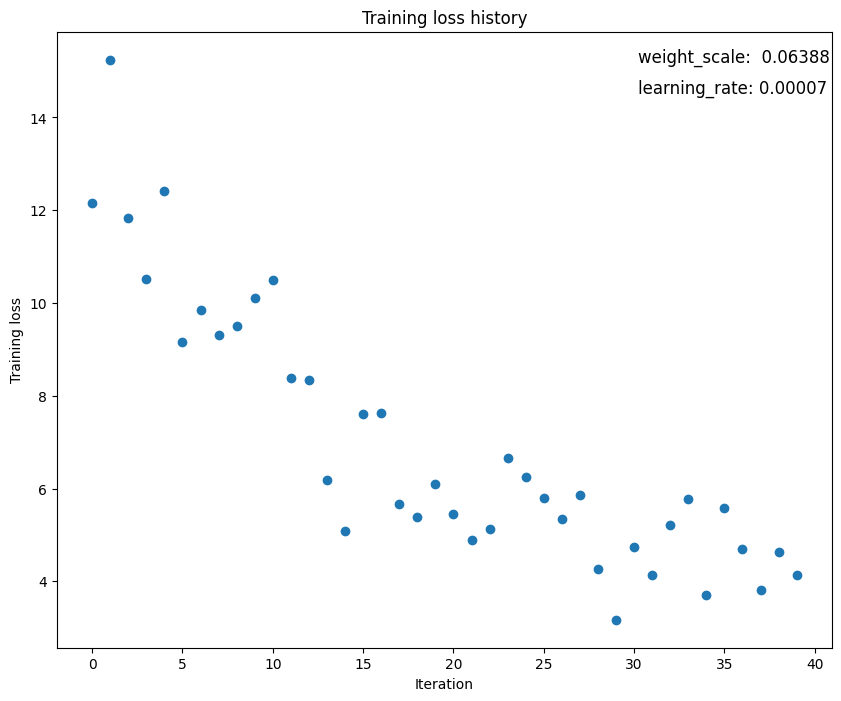

(Iteration 1 / 40) loss: 13.976726
(Epoch 0 / 20) train acc: 0.140000; val_acc: 0.123000
(Epoch 1 / 20) train acc: 0.260000; val_acc: 0.148000
(Epoch 2 / 20) train acc: 0.380000; val_acc: 0.135000
(Epoch 3 / 20) train acc: 0.400000; val_acc: 0.148000
(Epoch 4 / 20) train acc: 0.700000; val_acc: 0.131000
(Epoch 5 / 20) train acc: 0.740000; val_acc: 0.131000
(Iteration 11 / 40) loss: 1.350549
(Epoch 6 / 20) train acc: 0.840000; val_acc: 0.140000
(Epoch 7 / 20) train acc: 0.900000; val_acc: 0.144000
(Epoch 8 / 20) train acc: 0.880000; val_acc: 0.142000
(Epoch 9 / 20) train acc: 0.920000; val_acc: 0.138000
(Epoch 10 / 20) train acc: 0.960000; val_acc: 0.139000
(Iteration 21 / 40) loss: 0.341617
(Epoch 11 / 20) train acc: 1.000000; val_acc: 0.144000
(Epoch 12 / 20) train acc: 1.000000; val_acc: 0.142000
(Epoch 13 / 20) train acc: 1.000000; val_acc: 0.140000
(Epoch 14 / 20) train acc: 1.000000; val_acc: 0.140000
(Epoch 15 / 20) train acc: 1.000000; val_acc: 0.138000
(Iteration 31 / 40) loss:

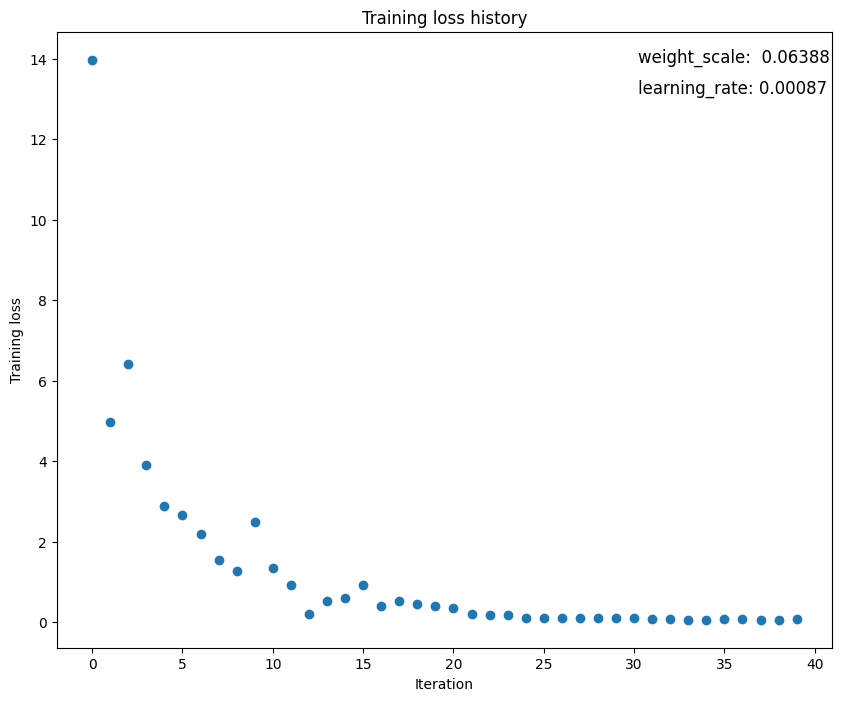

(Iteration 1 / 40) loss: 13.087528
(Epoch 0 / 20) train acc: 0.140000; val_acc: 0.093000
(Epoch 1 / 20) train acc: 0.300000; val_acc: 0.101000
(Epoch 2 / 20) train acc: 0.400000; val_acc: 0.105000
(Epoch 3 / 20) train acc: 0.540000; val_acc: 0.108000
(Epoch 4 / 20) train acc: 0.700000; val_acc: 0.108000
(Epoch 5 / 20) train acc: 0.660000; val_acc: 0.097000
(Iteration 11 / 40) loss: 0.621099
(Epoch 6 / 20) train acc: 0.740000; val_acc: 0.123000
(Epoch 7 / 20) train acc: 0.800000; val_acc: 0.126000
(Epoch 8 / 20) train acc: 0.880000; val_acc: 0.124000
(Epoch 9 / 20) train acc: 0.920000; val_acc: 0.122000
(Epoch 10 / 20) train acc: 0.880000; val_acc: 0.124000
(Iteration 21 / 40) loss: 0.663754
(Epoch 11 / 20) train acc: 0.920000; val_acc: 0.124000
(Epoch 12 / 20) train acc: 0.960000; val_acc: 0.117000
(Epoch 13 / 20) train acc: 0.980000; val_acc: 0.126000
(Epoch 14 / 20) train acc: 0.980000; val_acc: 0.117000
(Epoch 15 / 20) train acc: 1.000000; val_acc: 0.123000
(Iteration 31 / 40) loss:

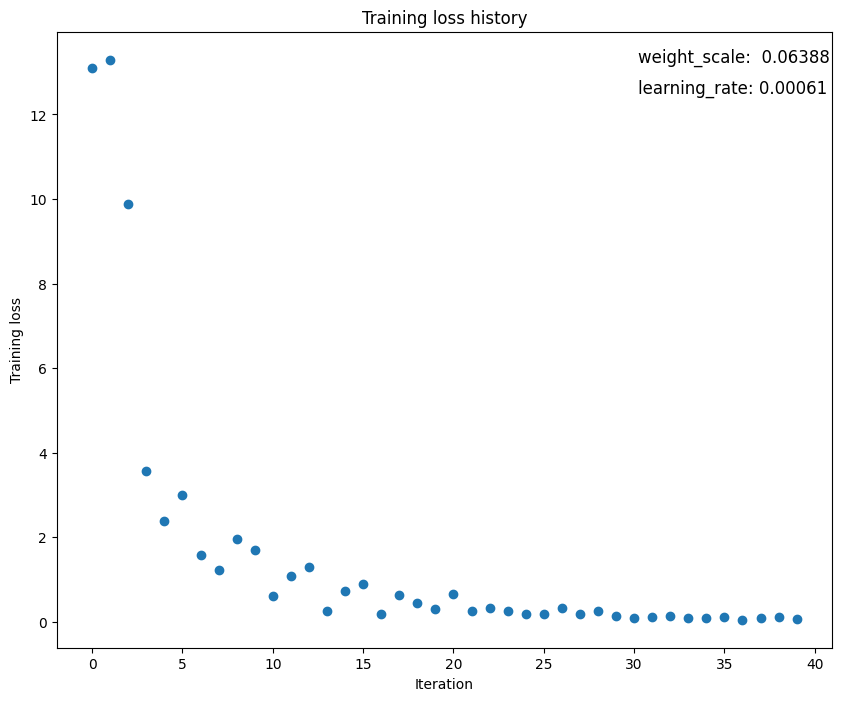

(Iteration 1 / 40) loss: 19.109334
(Epoch 0 / 20) train acc: 0.200000; val_acc: 0.078000
(Epoch 1 / 20) train acc: 0.240000; val_acc: 0.112000
(Epoch 2 / 20) train acc: 0.360000; val_acc: 0.128000
(Epoch 3 / 20) train acc: 0.500000; val_acc: 0.127000
(Epoch 4 / 20) train acc: 0.620000; val_acc: 0.117000
(Epoch 5 / 20) train acc: 0.660000; val_acc: 0.118000
(Iteration 11 / 40) loss: 1.120775
(Epoch 6 / 20) train acc: 0.760000; val_acc: 0.116000
(Epoch 7 / 20) train acc: 0.840000; val_acc: 0.126000
(Epoch 8 / 20) train acc: 0.880000; val_acc: 0.120000
(Epoch 9 / 20) train acc: 0.940000; val_acc: 0.125000
(Epoch 10 / 20) train acc: 0.980000; val_acc: 0.118000
(Iteration 21 / 40) loss: 0.377771
(Epoch 11 / 20) train acc: 1.000000; val_acc: 0.119000
(Epoch 12 / 20) train acc: 1.000000; val_acc: 0.118000
(Epoch 13 / 20) train acc: 1.000000; val_acc: 0.119000
(Epoch 14 / 20) train acc: 1.000000; val_acc: 0.118000
(Epoch 15 / 20) train acc: 1.000000; val_acc: 0.118000
(Iteration 31 / 40) loss:

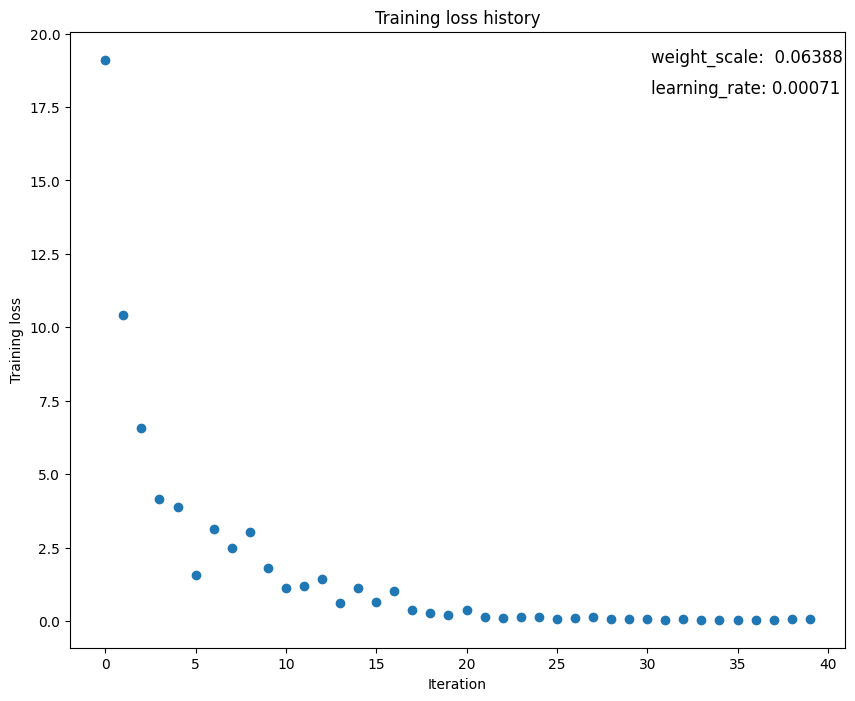

(Iteration 1 / 40) loss: 2.319719
(Epoch 0 / 20) train acc: 0.040000; val_acc: 0.092000
(Epoch 1 / 20) train acc: 0.040000; val_acc: 0.092000
(Epoch 2 / 20) train acc: 0.040000; val_acc: 0.092000
(Epoch 3 / 20) train acc: 0.040000; val_acc: 0.092000
(Epoch 4 / 20) train acc: 0.060000; val_acc: 0.092000
(Epoch 5 / 20) train acc: 0.060000; val_acc: 0.093000
(Iteration 11 / 40) loss: 2.306147
(Epoch 6 / 20) train acc: 0.060000; val_acc: 0.094000
(Epoch 7 / 20) train acc: 0.060000; val_acc: 0.093000
(Epoch 8 / 20) train acc: 0.080000; val_acc: 0.094000
(Epoch 9 / 20) train acc: 0.080000; val_acc: 0.094000
(Epoch 10 / 20) train acc: 0.080000; val_acc: 0.094000
(Iteration 21 / 40) loss: 2.295370
(Epoch 11 / 20) train acc: 0.080000; val_acc: 0.094000
(Epoch 12 / 20) train acc: 0.080000; val_acc: 0.094000
(Epoch 13 / 20) train acc: 0.080000; val_acc: 0.094000
(Epoch 14 / 20) train acc: 0.080000; val_acc: 0.094000
(Epoch 15 / 20) train acc: 0.080000; val_acc: 0.094000
(Iteration 31 / 40) loss: 

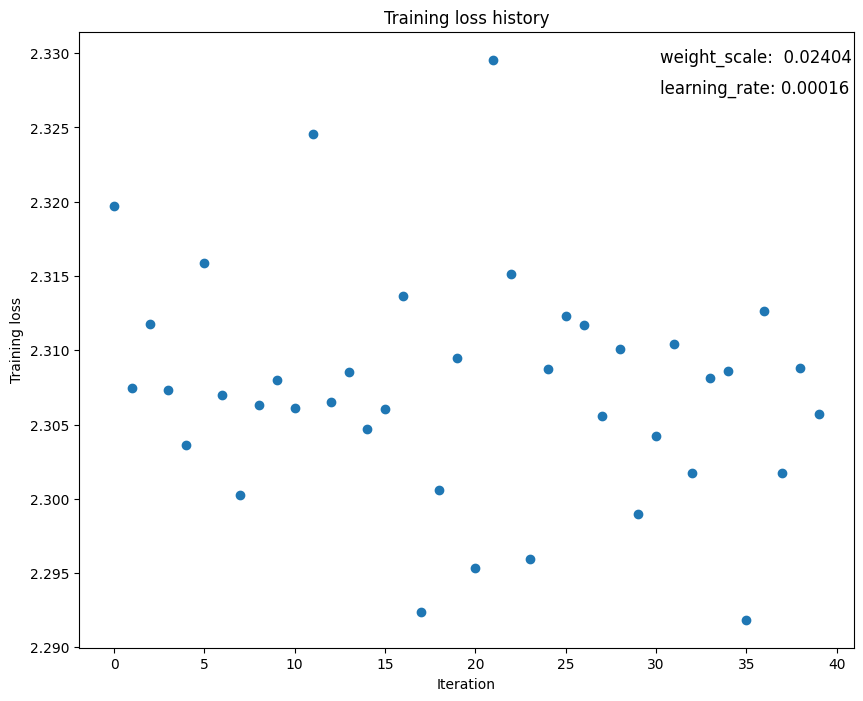

(Iteration 1 / 40) loss: 2.321448
(Epoch 0 / 20) train acc: 0.120000; val_acc: 0.097000
(Epoch 1 / 20) train acc: 0.120000; val_acc: 0.097000
(Epoch 2 / 20) train acc: 0.120000; val_acc: 0.097000
(Epoch 3 / 20) train acc: 0.120000; val_acc: 0.095000
(Epoch 4 / 20) train acc: 0.120000; val_acc: 0.095000
(Epoch 5 / 20) train acc: 0.120000; val_acc: 0.095000
(Iteration 11 / 40) loss: 2.311520
(Epoch 6 / 20) train acc: 0.120000; val_acc: 0.095000
(Epoch 7 / 20) train acc: 0.120000; val_acc: 0.095000
(Epoch 8 / 20) train acc: 0.120000; val_acc: 0.095000
(Epoch 9 / 20) train acc: 0.120000; val_acc: 0.095000
(Epoch 10 / 20) train acc: 0.120000; val_acc: 0.095000
(Iteration 21 / 40) loss: 2.306369
(Epoch 11 / 20) train acc: 0.120000; val_acc: 0.096000
(Epoch 12 / 20) train acc: 0.120000; val_acc: 0.096000
(Epoch 13 / 20) train acc: 0.120000; val_acc: 0.096000
(Epoch 14 / 20) train acc: 0.120000; val_acc: 0.096000
(Epoch 15 / 20) train acc: 0.120000; val_acc: 0.096000
(Iteration 31 / 40) loss: 

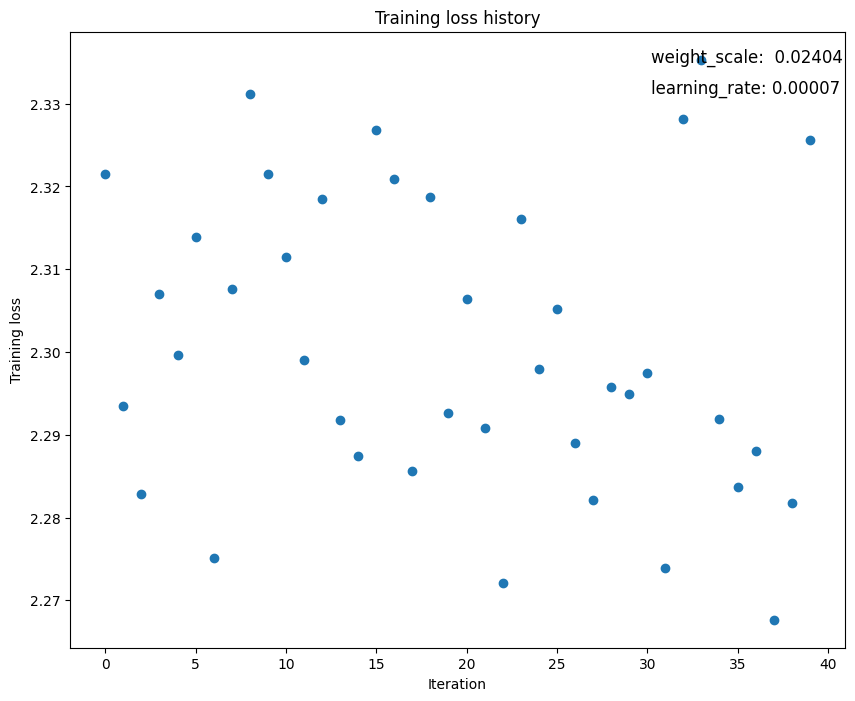

(Iteration 1 / 40) loss: 2.294359
(Epoch 0 / 20) train acc: 0.120000; val_acc: 0.081000
(Epoch 1 / 20) train acc: 0.120000; val_acc: 0.079000
(Epoch 2 / 20) train acc: 0.120000; val_acc: 0.079000
(Epoch 3 / 20) train acc: 0.120000; val_acc: 0.078000
(Epoch 4 / 20) train acc: 0.120000; val_acc: 0.078000
(Epoch 5 / 20) train acc: 0.120000; val_acc: 0.078000
(Iteration 11 / 40) loss: 2.292481
(Epoch 6 / 20) train acc: 0.120000; val_acc: 0.079000
(Epoch 7 / 20) train acc: 0.120000; val_acc: 0.079000
(Epoch 8 / 20) train acc: 0.120000; val_acc: 0.078000
(Epoch 9 / 20) train acc: 0.120000; val_acc: 0.082000
(Epoch 10 / 20) train acc: 0.120000; val_acc: 0.080000
(Iteration 21 / 40) loss: 2.271164
(Epoch 11 / 20) train acc: 0.120000; val_acc: 0.082000
(Epoch 12 / 20) train acc: 0.140000; val_acc: 0.082000
(Epoch 13 / 20) train acc: 0.160000; val_acc: 0.081000
(Epoch 14 / 20) train acc: 0.160000; val_acc: 0.082000
(Epoch 15 / 20) train acc: 0.180000; val_acc: 0.082000
(Iteration 31 / 40) loss: 

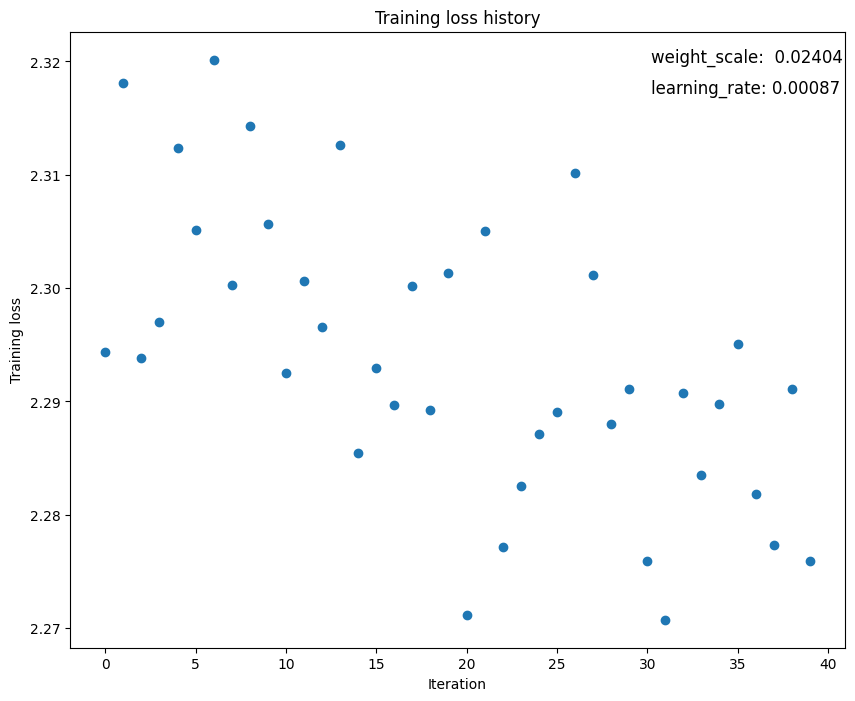

(Iteration 1 / 40) loss: 2.286513
(Epoch 0 / 20) train acc: 0.080000; val_acc: 0.076000
(Epoch 1 / 20) train acc: 0.080000; val_acc: 0.076000
(Epoch 2 / 20) train acc: 0.080000; val_acc: 0.077000
(Epoch 3 / 20) train acc: 0.080000; val_acc: 0.077000
(Epoch 4 / 20) train acc: 0.080000; val_acc: 0.076000
(Epoch 5 / 20) train acc: 0.080000; val_acc: 0.079000
(Iteration 11 / 40) loss: 2.277254
(Epoch 6 / 20) train acc: 0.100000; val_acc: 0.073000
(Epoch 7 / 20) train acc: 0.100000; val_acc: 0.079000
(Epoch 8 / 20) train acc: 0.100000; val_acc: 0.076000
(Epoch 9 / 20) train acc: 0.100000; val_acc: 0.077000
(Epoch 10 / 20) train acc: 0.120000; val_acc: 0.078000
(Iteration 21 / 40) loss: 2.279055
(Epoch 11 / 20) train acc: 0.120000; val_acc: 0.079000
(Epoch 12 / 20) train acc: 0.120000; val_acc: 0.080000
(Epoch 13 / 20) train acc: 0.140000; val_acc: 0.081000
(Epoch 14 / 20) train acc: 0.140000; val_acc: 0.080000
(Epoch 15 / 20) train acc: 0.140000; val_acc: 0.079000
(Iteration 31 / 40) loss: 

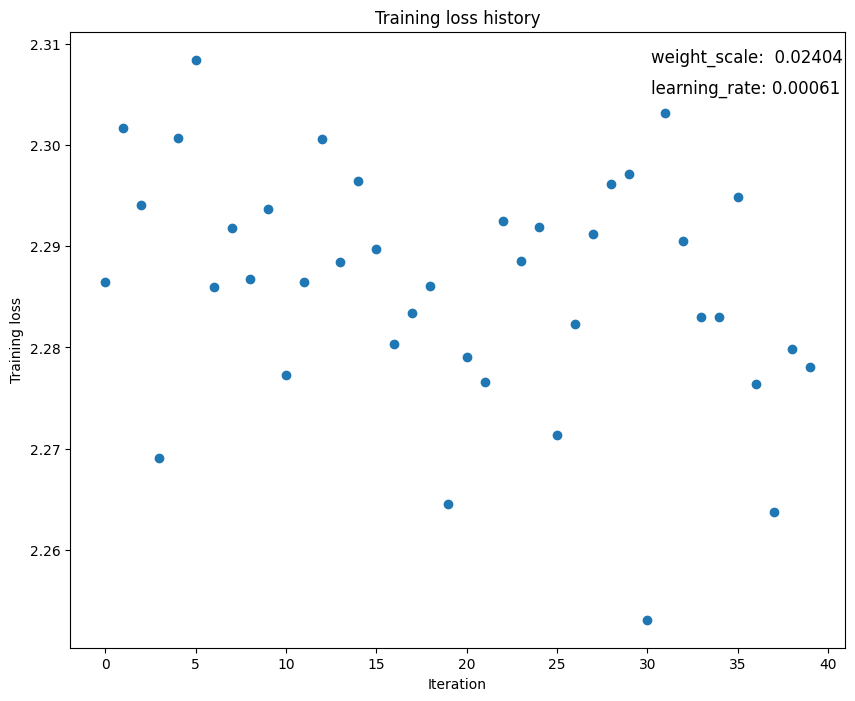

(Iteration 1 / 40) loss: 2.308369
(Epoch 0 / 20) train acc: 0.140000; val_acc: 0.114000
(Epoch 1 / 20) train acc: 0.140000; val_acc: 0.116000
(Epoch 2 / 20) train acc: 0.140000; val_acc: 0.116000
(Epoch 3 / 20) train acc: 0.160000; val_acc: 0.116000
(Epoch 4 / 20) train acc: 0.160000; val_acc: 0.119000
(Epoch 5 / 20) train acc: 0.160000; val_acc: 0.121000
(Iteration 11 / 40) loss: 2.313683
(Epoch 6 / 20) train acc: 0.160000; val_acc: 0.121000
(Epoch 7 / 20) train acc: 0.160000; val_acc: 0.123000
(Epoch 8 / 20) train acc: 0.160000; val_acc: 0.124000
(Epoch 9 / 20) train acc: 0.160000; val_acc: 0.124000
(Epoch 10 / 20) train acc: 0.160000; val_acc: 0.124000
(Iteration 21 / 40) loss: 2.293202
(Epoch 11 / 20) train acc: 0.160000; val_acc: 0.121000
(Epoch 12 / 20) train acc: 0.160000; val_acc: 0.123000
(Epoch 13 / 20) train acc: 0.160000; val_acc: 0.126000
(Epoch 14 / 20) train acc: 0.160000; val_acc: 0.131000
(Epoch 15 / 20) train acc: 0.160000; val_acc: 0.129000
(Iteration 31 / 40) loss: 

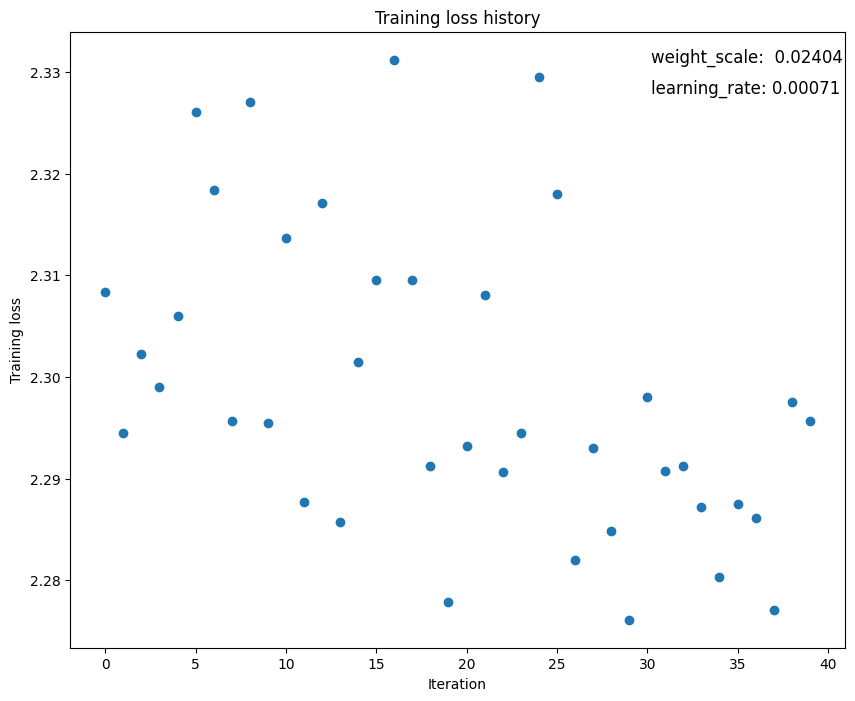

In [ ]:
# TODO: Usar uma rede de 5-camadas para "sobreajustar" (overfit) 50 exemplos de treinamento.

num_train = 50
small_data = {
  'X_train': data['X_train'][:num_train],
  'y_train': data['y_train'][:num_train],
  'X_val': data['X_val'],
  'y_val': data['y_val'],
}

#weight_scale = 1e-2    # experimente variar entre 1e-2 e 1e-1
#learning_rate = 1e-4   # experimente variar entre 1e-5 e 1e-3

# defindo os valores de weight_scale e learning_rate usando valores aleatórios
np.random.seed(42)
weight_scale_list = np.random.uniform(1e-2, 1e-1, 5)
learning_rate_list = np.random.uniform(1e-5,  1e-3, 5)

for weight_scale in weight_scale_list:
  for learning_rate in learning_rate_list:
    model = FullyConnectedNet([100, 100, 100, 100],
              weight_scale=weight_scale, dtype=np.float64)
    solver = Solver(model, small_data,
                print_every=10, num_epochs=20, batch_size=25,
                update_rule='sgd',
                optim_config={
                  'learning_rate': learning_rate,
                }
         )
    solver.train()

    plt.plot(solver.loss_history, 'o')
    plt.title(f'Training loss history')
    plt.xlabel('Iteration')
    plt.ylabel('Training loss')
    plt.annotate(f'weight_scale: {weight_scale: .5f}', xy=(0.75, 0.95), xycoords='axes fraction', fontsize=12)
    plt.annotate(f'learning_rate: {learning_rate:.5f}', xy=(0.75, 0.90), xycoords='axes fraction', fontsize=12)
    plt.show()

**Rede com 5 camadas**

Com as variações de weight_scale (variando entre 1e-2 e 1e-1 ) e learning_rate (vairandoentre 1e-5 e 1e-3) feitas com valores aleatórios foram observados comportamentos de sobreajuste (overfitting) com valores de acurácia de treino= 100%  nas redes com os seguintes valores de weight_scale e learning_rate:

Lista de valores gerados aleatoriamente:


  * weight_scale = [0.04370861, 0.09556429, 0.07587945, 0.06387926, 0.02404168]
  * learning_rate = [1.64434575e-04, 6.75027760e-05, 8.67514384e-04, 6.05103862e-04, 7.10991852e-04]

-----------------------------------------------------

  * weight_scale= 0,09556  |  learning_rate= 0,00016
  * weight_scale= 0,09556  |  learning_rate= 0,00087
  * weight_scale= 0,09556  |  learning_rate= 0,00061
  * weight_scale= 0,09556  |  learning_rate= 0,00071
  * weight_scale= 0,07588  |  learning_rate= 0,00087
  * weight_scale= 0,07588  |  learning_rate= 0,00061
  * weight_scale= 0,07588  |  learning_rate= 0,00071
  * weight_scale= 0,06388  |  learning_rate= 0,00087
  * weight_scale= 0,06388  |  learning_rate= 0,00061
  * weight_scale= 0,06388  |  learning_rate= 0,00071

-----------------------------------------------------



# Regras de Atualização

Até então, você tem utilizado apenas o método de descida mais íngreme estocástico (SGD - *stochastic gradient descent*) como regra de atualização. O uso de regras de atualização mais sofisticadas pode facilitar o treinamento de redes profundas. A seguit, você irá implementar outras regras de atualização comuns na atualidade e comparar seus resultados com os obtidos pelo SGD básico.

## Regra de Atualização: SGD + Momento

SGD com momento é amplamente utilizando como regra de atualização e tende a fazer com que o treinamento de redes profundas obtenha convergência mais rápido do que quando utilizado apenas o SGD.

Você pode retornar a célula em que a classe `Solver` foi definida e examinar novamente a implementação da regra de atulização SGD+momento codificada na função `sgd_momentum`.

Em seguida, você deve executar o seguinte código para verificar essa implementação.

Você deve observer erros menores que 1e-8.

In [ ]:
# Teste da implementação de SGD+momento; você deve observar erros menores que 1e-8

N, D = 4, 5
w = np.linspace(-0.4, 0.6, num=N*D).reshape(N, D)
dw = np.linspace(-0.6, 0.4, num=N*D).reshape(N, D)
v = np.linspace(0.6, 0.9, num=N*D).reshape(N, D)

config = {'learning_rate': 1e-3, 'velocity': v}
next_w, _ = optim.sgd_momentum(w, dw, config=config)

expected_next_w = np.asarray([
  [ 0.1406,      0.20738947,  0.27417895,  0.34096842,  0.40775789],
  [ 0.47454737,  0.54133684,  0.60812632,  0.67491579,  0.74170526],
  [ 0.80849474,  0.87528421,  0.94207368,  1.00886316,  1.07565263],
  [ 1.14244211,  1.20923158,  1.27602105,  1.34281053,  1.4096    ]])
expected_velocity = np.asarray([
  [ 0.5406,      0.55475789,  0.56891579, 0.58307368,  0.59723158],
  [ 0.61138947,  0.62554737,  0.63970526,  0.65386316,  0.66802105],
  [ 0.68217895,  0.69633684,  0.71049474,  0.72465263,  0.73881053],
  [ 0.75296842,  0.76712632,  0.78128421,  0.79544211,  0.8096    ]])

print('next_w error: ', rel_error(next_w, expected_next_w))
print('velocity error: ', rel_error(expected_velocity, config['velocity']))

next_w error:  8.882347033505819e-09
velocity error:  4.269287743278663e-09


Uma vez que você testou a implementação dessa regra de atualização, execute o seguinte código para treinamento de uma rede de 6-camadas utilizando tanto a regra básica SGD como a nova SGD+momento.

Você deve ver que a regra de atualização SGD+momento consegue obter uma convergência mais rápida.

running with  sgd
(Iteration 1 / 200) loss: 2.521606
(Epoch 0 / 5) train acc: 0.128000; val_acc: 0.114000
(Iteration 11 / 200) loss: 2.160424
(Iteration 21 / 200) loss: 2.097504
(Iteration 31 / 200) loss: 2.098880
(Epoch 1 / 5) train acc: 0.279000; val_acc: 0.255000
(Iteration 41 / 200) loss: 1.806953
(Iteration 51 / 200) loss: 1.860829
(Iteration 61 / 200) loss: 1.881248
(Iteration 71 / 200) loss: 1.741238
(Epoch 2 / 5) train acc: 0.322000; val_acc: 0.280000
(Iteration 81 / 200) loss: 2.017569
(Iteration 91 / 200) loss: 1.698108
(Iteration 101 / 200) loss: 1.866861
(Iteration 111 / 200) loss: 1.779454
(Epoch 3 / 5) train acc: 0.390000; val_acc: 0.304000
(Iteration 121 / 200) loss: 1.831222
(Iteration 131 / 200) loss: 1.764433
(Iteration 141 / 200) loss: 1.733389
(Iteration 151 / 200) loss: 1.825504
(Epoch 4 / 5) train acc: 0.399000; val_acc: 0.295000
(Iteration 161 / 200) loss: 1.612197
(Iteration 171 / 200) loss: 1.657043
(Iteration 181 / 200) loss: 1.497392
(Iteration 191 / 200) los

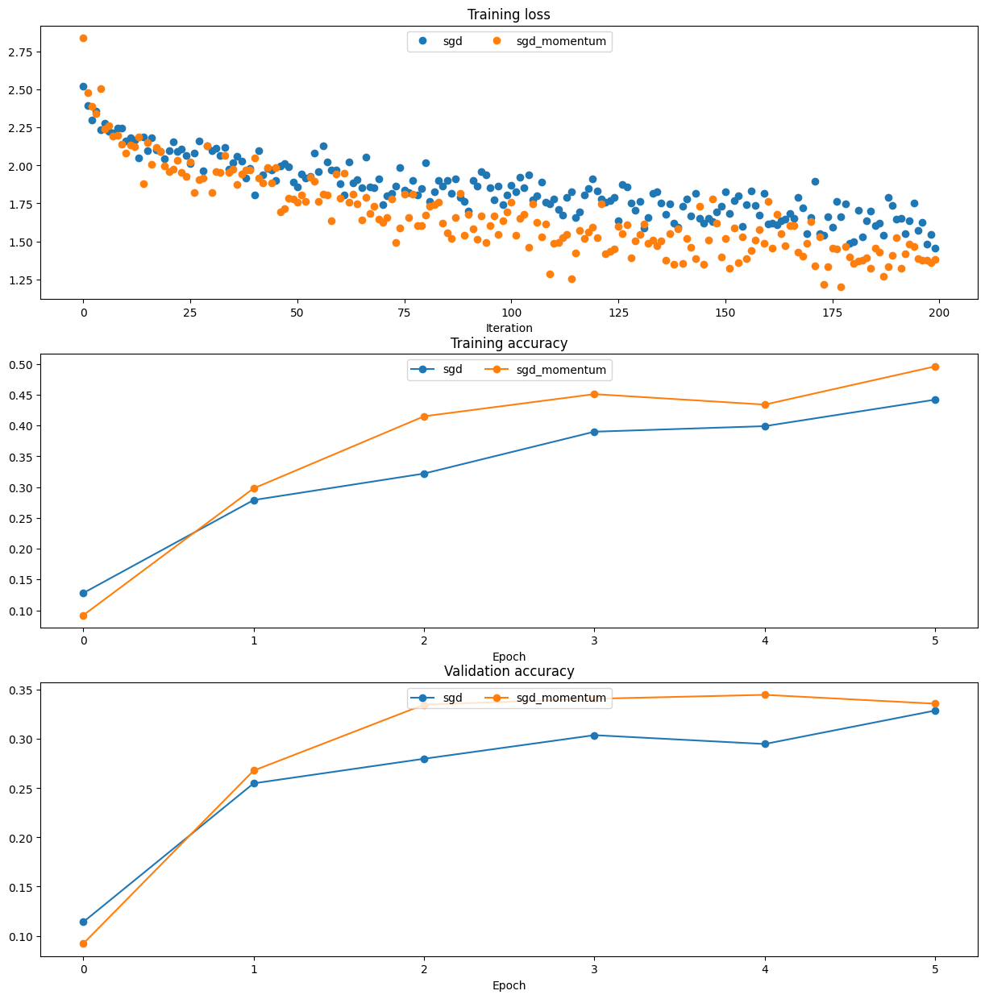

In [ ]:
num_train = 4000
small_data = {
  'X_train': data['X_train'][:num_train],
  'y_train': data['y_train'][:num_train],
  'X_val': data['X_val'],
  'y_val': data['y_val'],
}

solvers = {}

for update_rule in ['sgd', 'sgd_momentum']:
  print('running with ', update_rule)
  model = FullyConnectedNet([100, 100, 100, 100, 100], weight_scale=5e-2)

  solver = Solver(model, small_data,
                  num_epochs=5, batch_size=100,
                  update_rule=update_rule,
                  optim_config={
                    'learning_rate': 1e-2,
                  },
                  verbose=True)
  solvers[update_rule] = solver
  solver.train()
  print()

plt.subplot(3, 1, 1)
plt.title('Training loss')
plt.xlabel('Iteration')

plt.subplot(3, 1, 2)
plt.title('Training accuracy')
plt.xlabel('Epoch')

plt.subplot(3, 1, 3)
plt.title('Validation accuracy')
plt.xlabel('Epoch')

for update_rule, solver in list(solvers.items()):
  plt.subplot(3, 1, 1)
  plt.plot(solver.loss_history, 'o', label=update_rule)

  plt.subplot(3, 1, 2)
  plt.plot(solver.train_acc_history, '-o', label=update_rule)

  plt.subplot(3, 1, 3)
  plt.plot(solver.val_acc_history, '-o', label=update_rule)

for i in [1, 2, 3]:
  plt.subplot(3, 1, i)
  plt.legend(loc='upper center', ncol=4)
plt.gcf().set_size_inches(15, 15)
plt.show()

## Outras Regras de Atualização: RMSProp e Adam

RMSProp [1] e Adam [2] são regras de atualização que ajustam as taxas de aprendizagem por parâmetros usando uma média móvel dos momentos de segunda ordem dos graduentes.

Você pode retornar a célula em que a classe `Solver` foi definida e examinar novamente a implementação da regras RMSProp e Adam codificadas nas funções `rmsprop` e `adam`, respectivamente.

Em seguida, você poderá checar essas implementações usando o código abaixo.

[1] Tijmen Tieleman and Geoffrey Hinton. "Lecture 6.5-rmsprop: Divide the gradient by a running average of its recent magnitude." COURSERA: Neural Networks for Machine Learning 4 (2012).

[2] Diederik Kingma and Jimmy Ba, "Adam: A Method for Stochastic Optimization", ICLR 2015.

In [ ]:
# Teste da implementação de RMSProp; você deve observar erros menores que 1e-7

N, D = 4, 5
w = np.linspace(-0.4, 0.6, num=N*D).reshape(N, D)
dw = np.linspace(-0.6, 0.4, num=N*D).reshape(N, D)
cache = np.linspace(0.6, 0.9, num=N*D).reshape(N, D)

config = {'learning_rate': 1e-2, 'cache': cache}
next_w, _ = optim.rmsprop(w, dw, config=config)

expected_next_w = np.asarray([
  [-0.39223849, -0.34037513, -0.28849239, -0.23659121, -0.18467247],
  [-0.132737,   -0.08078555, -0.02881884,  0.02316247,  0.07515774],
  [ 0.12716641,  0.17918792,  0.23122175,  0.28326742,  0.33532447],
  [ 0.38739248,  0.43947102,  0.49155973,  0.54365823,  0.59576619]])
expected_cache = np.asarray([
  [ 0.5976,      0.6126277,   0.6277108,   0.64284931,  0.65804321],
  [ 0.67329252,  0.68859723,  0.70395734,  0.71937285,  0.73484377],
  [ 0.75037008,  0.7659518,   0.78158892,  0.79728144,  0.81302936],
  [ 0.82883269,  0.84469141,  0.86060554,  0.87657507,  0.8926    ]])

print('next_w error: ', rel_error(expected_next_w, next_w))
print('cache error: ', rel_error(expected_cache, config['cache']))

next_w error:  9.524687511038133e-08
cache error:  2.6477955807156126e-09


In [ ]:
# Teste da implementação de Adam; você deve observar erros em torno de 1e-7 ou menos

N, D = 4, 5
w = np.linspace(-0.4, 0.6, num=N*D).reshape(N, D)
dw = np.linspace(-0.6, 0.4, num=N*D).reshape(N, D)
m = np.linspace(0.6, 0.9, num=N*D).reshape(N, D)
v = np.linspace(0.7, 0.5, num=N*D).reshape(N, D)

config = {'learning_rate': 1e-2, 'm': m, 'v': v, 't': 5}
next_w, _ = optim.adam(w, dw, config=config)

expected_next_w = np.asarray([
  [-0.40094747, -0.34836187, -0.29577703, -0.24319299, -0.19060977],
  [-0.1380274,  -0.08544591, -0.03286534,  0.01971428,  0.0722929],
  [ 0.1248705,   0.17744702,  0.23002243,  0.28259667,  0.33516969],
  [ 0.38774145,  0.44031188,  0.49288093,  0.54544852,  0.59801459]])
expected_v = np.asarray([
  [ 0.69966,     0.68908382,  0.67851319,  0.66794809,  0.65738853,],
  [ 0.64683452,  0.63628604,  0.6257431,   0.61520571,  0.60467385,],
  [ 0.59414753,  0.58362676,  0.57311152,  0.56260183,  0.55209767,],
  [ 0.54159906,  0.53110598,  0.52061845,  0.51013645,  0.49966,   ]])
expected_m = np.asarray([
  [ 0.48,        0.49947368,  0.51894737,  0.53842105,  0.55789474],
  [ 0.57736842,  0.59684211,  0.61631579,  0.63578947,  0.65526316],
  [ 0.67473684,  0.69421053,  0.71368421,  0.73315789,  0.75263158],
  [ 0.77210526,  0.79157895,  0.81105263,  0.83052632,  0.85      ]])

print('next_w error: ', rel_error(expected_next_w, next_w))
print('v error: ', rel_error(expected_v, config['v']))
print('m error: ', rel_error(expected_m, config['m']))

next_w error:  1.1395691798535431e-07
v error:  4.208314038113071e-09
m error:  4.214963193114416e-09


Uma vez que você tenha testado essas implementações das regras RMSProp e Adam, execute o seguinte código para treinar redes profundas utilizando tais regras:

running with  adam
(Iteration 1 / 200) loss: 3.149152
(Epoch 0 / 5) train acc: 0.111000; val_acc: 0.125000
(Iteration 11 / 200) loss: 2.041414
(Iteration 21 / 200) loss: 1.932501
(Iteration 31 / 200) loss: 2.074253
(Epoch 1 / 5) train acc: 0.386000; val_acc: 0.317000
(Iteration 41 / 200) loss: 1.738817
(Iteration 51 / 200) loss: 1.860063
(Iteration 61 / 200) loss: 1.722012
(Iteration 71 / 200) loss: 1.404010
(Epoch 2 / 5) train acc: 0.453000; val_acc: 0.337000
(Iteration 81 / 200) loss: 1.614145
(Iteration 91 / 200) loss: 1.468123
(Iteration 101 / 200) loss: 1.378546
(Iteration 111 / 200) loss: 1.372382
(Epoch 3 / 5) train acc: 0.488000; val_acc: 0.372000
(Iteration 121 / 200) loss: 1.531597
(Iteration 131 / 200) loss: 1.322509
(Iteration 141 / 200) loss: 1.377224
(Iteration 151 / 200) loss: 1.428618
(Epoch 4 / 5) train acc: 0.552000; val_acc: 0.373000
(Iteration 161 / 200) loss: 1.288232
(Iteration 171 / 200) loss: 1.316989
(Iteration 181 / 200) loss: 1.128278
(Iteration 191 / 200) lo

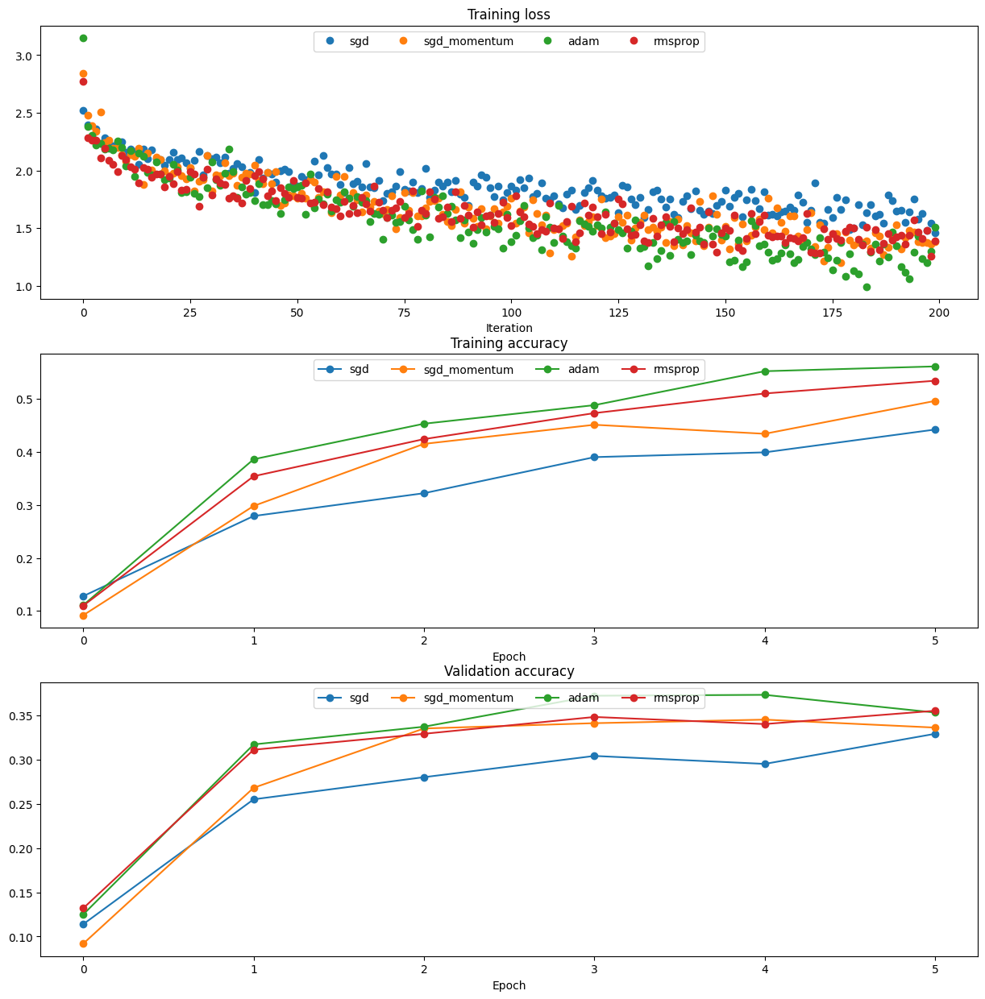

In [ ]:
learning_rates = {'rmsprop': 1e-4, 'adam': 1e-3}
for update_rule in ['adam', 'rmsprop']:
  print('running with ', update_rule)
  model = FullyConnectedNet([100, 100, 100, 100, 100], weight_scale=5e-2)

  solver = Solver(model, small_data,
                  num_epochs=5, batch_size=100,
                  update_rule=update_rule,
                  optim_config={
                    'learning_rate': learning_rates[update_rule]
                  },
                  verbose=True)
  solvers[update_rule] = solver
  solver.train()
  print()

plt.subplot(3, 1, 1)
plt.title('Training loss')
plt.xlabel('Iteration')

plt.subplot(3, 1, 2)
plt.title('Training accuracy')
plt.xlabel('Epoch')

plt.subplot(3, 1, 3)
plt.title('Validation accuracy')
plt.xlabel('Epoch')

for update_rule, solver in list(solvers.items()):
  plt.subplot(3, 1, 1)
  plt.plot(solver.loss_history, 'o', label=update_rule)

  plt.subplot(3, 1, 2)
  plt.plot(solver.train_acc_history, '-o', label=update_rule)

  plt.subplot(3, 1, 3)
  plt.plot(solver.val_acc_history, '-o', label=update_rule)

for i in [1, 2, 3]:
  plt.subplot(3, 1, i)
  plt.legend(loc='upper center', ncol=4)
plt.gcf().set_size_inches(15, 15)
plt.show()

# *Batch normalization* para Redes Profundas

Execute agora o seguinte cógido para treinar uma rede de 6-camadas em um subconjunto de 1000 amostras de treinamento tanto com quanto sem usar *batch normalization*.

In [ ]:
np.random.seed(231)
# Tentativa de treinamento de uma rede profunda com e sem 'batch normalization'
hidden_dims = [100, 100, 100, 100, 100]

num_train = 1000
small_data = {
  'X_train': data['X_train'][:num_train],
  'y_train': data['y_train'][:num_train],
  'X_val': data['X_val'],
  'y_val': data['y_val'],
}

weight_scale = 2e-2
bn_model = FullyConnectedNet(hidden_dims, weight_scale=weight_scale, use_batchnorm=True)
model = FullyConnectedNet(hidden_dims, weight_scale=weight_scale, use_batchnorm=False)

bn_solver = Solver(bn_model, small_data,
                num_epochs=10, batch_size=50,
                update_rule='adam',
                optim_config={
                  'learning_rate': 1e-3,
                },
                verbose=True, print_every=200)
bn_solver.train()

solver = Solver(model, small_data,
                num_epochs=10, batch_size=50,
                update_rule='adam',
                optim_config={
                  'learning_rate': 1e-3,
                },
                verbose=True, print_every=200)
solver.train()

We use batchnorm here
(Iteration 1 / 200) loss: 2.340974
(Epoch 0 / 10) train acc: 0.132000; val_acc: 0.121000
(Epoch 1 / 10) train acc: 0.332000; val_acc: 0.277000
(Epoch 2 / 10) train acc: 0.432000; val_acc: 0.310000
(Epoch 3 / 10) train acc: 0.481000; val_acc: 0.316000
(Epoch 4 / 10) train acc: 0.554000; val_acc: 0.321000
(Epoch 5 / 10) train acc: 0.600000; val_acc: 0.336000
(Epoch 6 / 10) train acc: 0.630000; val_acc: 0.339000
(Epoch 7 / 10) train acc: 0.681000; val_acc: 0.338000
(Epoch 8 / 10) train acc: 0.712000; val_acc: 0.339000
(Epoch 9 / 10) train acc: 0.759000; val_acc: 0.348000
(Epoch 10 / 10) train acc: 0.749000; val_acc: 0.335000
(Iteration 1 / 200) loss: 2.302332
(Epoch 0 / 10) train acc: 0.123000; val_acc: 0.130000
(Epoch 1 / 10) train acc: 0.264000; val_acc: 0.212000
(Epoch 2 / 10) train acc: 0.320000; val_acc: 0.298000
(Epoch 3 / 10) train acc: 0.343000; val_acc: 0.275000
(Epoch 4 / 10) train acc: 0.397000; val_acc: 0.318000
(Epoch 5 / 10) train acc: 0.445000; val_acc

Execute o seguinte código para visualizar os resultados das duas redes treinadas anteriormente. Você deverá notar que a utilização de *batch normalization* ajuda o procedimento de treinamento da rede convergir mais rapidamente.

In [ ]:
def plot_training_history(title, label, baseline, bn_solvers, plot_fn, bl_marker='.', bn_marker='.', labels=None):
    """utility function for plotting training history"""
    plt.title(title)
    plt.xlabel(label)
    bn_plots = [plot_fn(bn_solver) for bn_solver in bn_solvers]
    bl_plot = plot_fn(baseline)
    num_bn = len(bn_plots)
    for i in range(num_bn):
        label='with_norm'
        if labels is not None:
            label += str(labels[i])
        plt.plot(bn_plots[i], bn_marker, label=label)
    label='baseline'
    if labels is not None:
        label += str(labels[0])
    plt.plot(bl_plot, bl_marker, label=label)
    plt.legend(loc='lower center', ncol=num_bn+1)




In [ ]:
plt.subplot(3, 1, 1)
plot_training_history('Training loss','Iteration', solver, [bn_solver], \
                      lambda x: x.loss_history, bl_marker='o', bn_marker='o')
plt.subplot(3, 1, 2)
plot_training_history('Training accuracy','Epoch', solver, [bn_solver], \
                      lambda x: x.train_acc_history, bl_marker='-o', bn_marker='-o')
plt.subplot(3, 1, 3)
plot_training_history('Validation accuracy','Epoch', solver, [bn_solver], \
                      lambda x: x.val_acc_history, bl_marker='-o', bn_marker='-o')

plt.gcf().set_size_inches(15, 15)
plt.show()

# *Batch normalization* e inicialização

Agora, você irá realizar um pequeno experimento para estudar a interação entre *batch normalization* e a inicialização de pesos.

Na próxima célula, você irá encontrar código para realizar treinamento de redes de 8-camadas com e sem *batch normalization* utilizando diferentes escalas para inicialização de pesos.

Já na célula seguinte, existe código para 'plotar' gráficos sobre: (i) acurácia de treinamento; (ii) acurácia de validação; e (iii) perda durante o treinamento. Tais informações serão exibidas como funções da escala de inicialização de pesos utilizada.

In [ ]:
np.random.seed(231)
# Tentativa de treinamento de uma rede 'bem' profunda com e sem 'batch normalization'
hidden_dims = [50, 50, 50, 50, 50, 50, 50]

num_train = 1000
small_data = {
  'X_train': data['X_train'][:num_train],
  'y_train': data['y_train'][:num_train],
  'X_val': data['X_val'],
  'y_val': data['y_val'],
}

bn_solvers = {}
solvers = {}
weight_scales = np.logspace(-4, 0, num=20)
for i, weight_scale in enumerate(weight_scales):
  print('Running weight scale %d / %d' % (i + 1, len(weight_scales)))
  bn_model = FullyConnectedNet(hidden_dims, weight_scale=weight_scale, use_batchnorm=True)
  model = FullyConnectedNet(hidden_dims, weight_scale=weight_scale, use_batchnorm=False)

  bn_solver = Solver(bn_model, small_data,
                  num_epochs=10, batch_size=50,
                  update_rule='adam',
                  optim_config={
                    'learning_rate': 1e-3,
                  },
                  verbose=False, print_every=200)
  bn_solver.train()
  bn_solvers[weight_scale] = bn_solver

  solver = Solver(model, small_data,
                  num_epochs=10, batch_size=50,
                  update_rule='adam',
                  optim_config={
                    'learning_rate': 1e-3,
                  },
                  verbose=False, print_every=200)
  solver.train()
  solvers[weight_scale] = solver

Running weight scale 1 / 20
We use batchnorm here
Running weight scale 2 / 20
We use batchnorm here
Running weight scale 3 / 20
We use batchnorm here
Running weight scale 4 / 20
We use batchnorm here
Running weight scale 5 / 20
We use batchnorm here
Running weight scale 6 / 20
We use batchnorm here
Running weight scale 7 / 20
We use batchnorm here
Running weight scale 8 / 20
We use batchnorm here
Running weight scale 9 / 20
We use batchnorm here
Running weight scale 10 / 20
We use batchnorm here
Running weight scale 11 / 20
We use batchnorm here
Running weight scale 12 / 20
We use batchnorm here
Running weight scale 13 / 20
We use batchnorm here
Running weight scale 14 / 20
We use batchnorm here
Running weight scale 15 / 20
We use batchnorm here
Running weight scale 16 / 20
We use batchnorm here
Running weight scale 17 / 20
We use batchnorm here
Running weight scale 18 / 20
We use batchnorm here
Running weight scale 19 / 20
We use batchnorm here
Running weight scale 20 / 20
We use batc

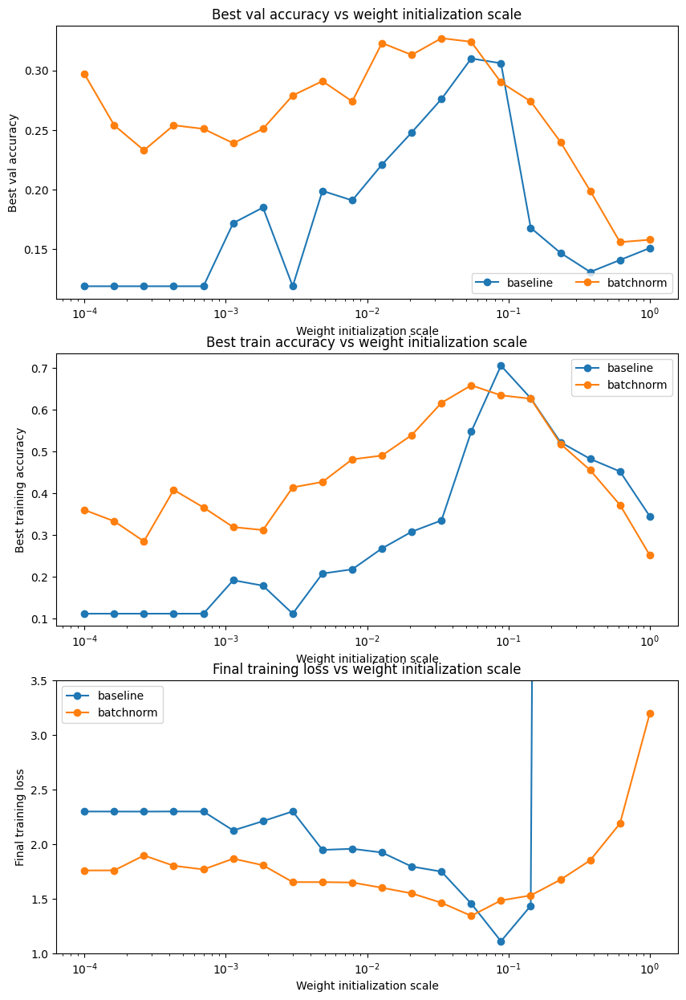

In [ ]:
# 'Plota' gráficos dos resultados do experimento com diferentes escalas de iniciação de pesos.
best_train_accs, bn_best_train_accs = [], []
best_val_accs, bn_best_val_accs = [], []
final_train_loss, bn_final_train_loss = [], []

for ws in weight_scales:
  best_train_accs.append(max(solvers[ws].train_acc_history))
  bn_best_train_accs.append(max(bn_solvers[ws].train_acc_history))

  best_val_accs.append(max(solvers[ws].val_acc_history))
  bn_best_val_accs.append(max(bn_solvers[ws].val_acc_history))

  final_train_loss.append(np.mean(solvers[ws].loss_history[-100:]))
  bn_final_train_loss.append(np.mean(bn_solvers[ws].loss_history[-100:]))

plt.subplot(3, 1, 1)
plt.title('Best val accuracy vs weight initialization scale')
plt.xlabel('Weight initialization scale')
plt.ylabel('Best val accuracy')
plt.semilogx(weight_scales, best_val_accs, '-o', label='baseline')
plt.semilogx(weight_scales, bn_best_val_accs, '-o', label='batchnorm')
plt.legend(ncol=2, loc='lower right')

plt.subplot(3, 1, 2)
plt.title('Best train accuracy vs weight initialization scale')
plt.xlabel('Weight initialization scale')
plt.ylabel('Best training accuracy')
plt.semilogx(weight_scales, best_train_accs, '-o', label='baseline')
plt.semilogx(weight_scales, bn_best_train_accs, '-o', label='batchnorm')
plt.legend()

plt.subplot(3, 1, 3)
plt.title('Final training loss vs weight initialization scale')
plt.xlabel('Weight initialization scale')
plt.ylabel('Final training loss')
plt.semilogx(weight_scales, final_train_loss, '-o', label='baseline')
plt.semilogx(weight_scales, bn_final_train_loss, '-o', label='batchnorm')
plt.legend()
plt.gca().set_ylim(1.0, 3.5)

plt.gcf().set_size_inches(10, 15)
plt.show()

# *Batch normalization* e tamanho do *minibatch*

Você agora irá realizar um pequeno experimento para estudar a interação entre *batch normalization* e o tamanho do *minibatch*.

No próxima célula, você encontrará código para treinar redes de 6 camadas com e sem uso de *batch normalization* utilizando diferentes tamando de *minibatch*.


In [ ]:
def run_batchsize_experiments(normalization_mode):
    np.random.seed(231)
    # Tentativa de treinamento de uma rede 'bem' profunda com e sem 'batch normalization'
    hidden_dims = [100, 100, 100, 100, 100]
    num_train = 1000
    small_data = {
      'X_train': data['X_train'][:num_train],
      'y_train': data['y_train'][:num_train],
      'X_val': data['X_val'],
      'y_val': data['y_val'],
    }
    n_epochs=10
    weight_scale = 2e-2
    batch_sizes = [5,10,50]
    lr = 10**(-3.5)
    solver_bsize = batch_sizes[0]

    print('No normalization: batch size = ',solver_bsize)
    model = FullyConnectedNet(hidden_dims, weight_scale=weight_scale, use_batchnorm=False)
    solver = Solver(model, small_data,
                    num_epochs=n_epochs, batch_size=solver_bsize,
                    update_rule='adam',
                    optim_config={
                      'learning_rate': lr,
                    },
                    verbose=False)
    solver.train()

    bn_solvers = []
    for i in range(len(batch_sizes)):
        b_size=batch_sizes[i]
        print('Normalization: batch size = ',b_size)
        bn_model = FullyConnectedNet(hidden_dims, weight_scale=weight_scale, use_batchnorm=True)
        bn_solver = Solver(bn_model, small_data,
                        num_epochs=n_epochs, batch_size=b_size,
                        update_rule='adam',
                        optim_config={
                          'learning_rate': lr,
                        },
                        verbose=False)
        bn_solver.train()
        bn_solvers.append(bn_solver)

    return bn_solvers, solver, batch_sizes

batch_sizes = [5,10,50]
bn_solvers_bsize, solver_bsize, batch_sizes = run_batchsize_experiments('batchnorm')

No normalization: batch size =  5
Normalization: batch size =  5
We use batchnorm here
Normalization: batch size =  10
We use batchnorm here
Normalization: batch size =  50
We use batchnorm here


Na célula seguinte, você encontrará código para plotar as acurácias de treinamento e de validação ao longo do tempo.

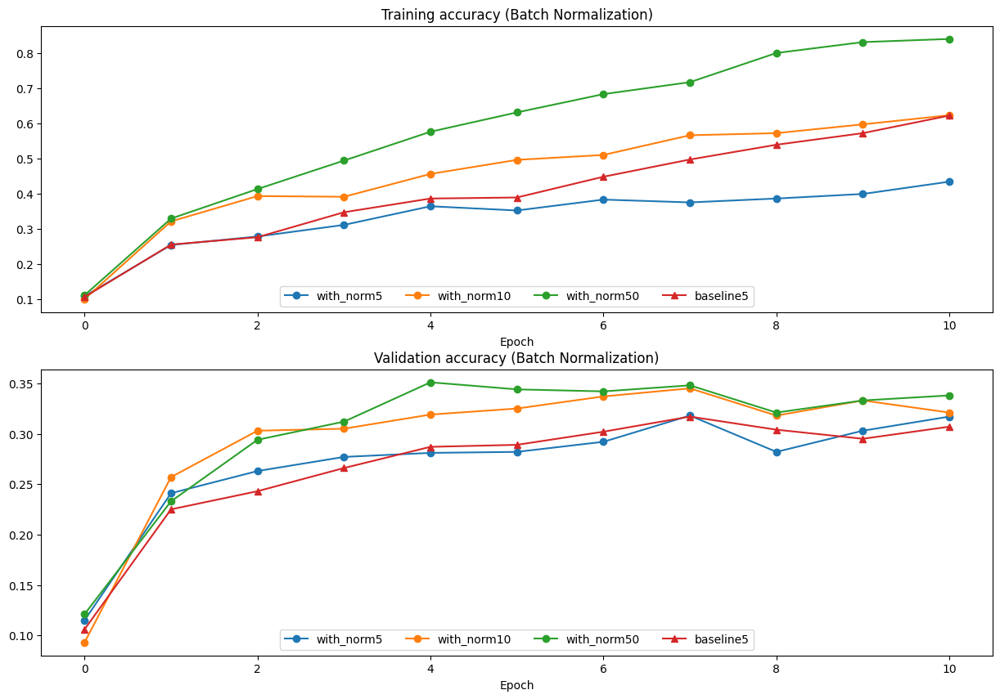

In [ ]:
plt.subplot(2, 1, 1)
plot_training_history('Training accuracy (Batch Normalization)','Epoch', solver_bsize, bn_solvers_bsize, \
                      lambda x: x.train_acc_history, bl_marker='-^', bn_marker='-o', labels=batch_sizes)
plt.subplot(2, 1, 2)
plot_training_history('Validation accuracy (Batch Normalization)','Epoch', solver_bsize, bn_solvers_bsize, \
                      lambda x: x.val_acc_history, bl_marker='-^', bn_marker='-o', labels=batch_sizes)

plt.gcf().set_size_inches(15, 10)
plt.show()

# Redes Completamente Conectadas com *Dropout*

Agora, você deve realizar experimento utilizando *dropout*.

Mais especificamente, se o construtor da rede receber um valor não-nulo para o parâmetro `dropout`, então será adicionar uma camada de *dropout* imediatamente depois de cada camada não-linear ReLU.

Para verificar esse comportamento, execute o seguinte código para verificar numericamente essa implementação:

In [ ]:
np.random.seed(231)
N, D, H1, H2, C = 2, 15, 20, 30, 10
X = np.random.randn(N, D)
y = np.random.randint(C, size=(N,))

for dropout in [0, 0.25, 0.5]:
  print('Running check with dropout = ', dropout)
  model = FullyConnectedNet([H1, H2], input_dim=D, num_classes=C,
                            weight_scale=5e-2, dtype=np.float64,
                            dropout=dropout, seed=123)

  loss, grads = model.loss(X, y)
  print('Initial loss: ', loss)

  for name in sorted(grads):
    f = lambda _: model.loss(X, y)[0]
    grad_num = eval_numerical_gradient(f, model.params[name], verbose=False, h=1e-5)
    print('%s relative error: %.2e' % (name, rel_error(grad_num, grads[name])))
  print()

Running check with dropout =  0
Initial loss:  2.3004790897684924
W1 relative error: 1.48e-07
W2 relative error: 2.21e-05
W3 relative error: 3.53e-07
b1 relative error: 5.38e-09
b2 relative error: 2.09e-09
b3 relative error: 5.80e-11

Running check with dropout =  0.25
Initial loss:  2.284540910068713
W1 relative error: 1.86e-10
W2 relative error: 1.60e-08
W3 relative error: 3.04e-09
b1 relative error: 1.10e-10
b2 relative error: 1.56e-08
b3 relative error: 8.58e-11

Running check with dropout =  0.5
Initial loss:  2.303349343266342
W1 relative error: 1.10e-08
W2 relative error: 1.92e-08
W3 relative error: 3.14e-08
b1 relative error: 5.52e-09
b2 relative error: 3.32e-09
b3 relative error: 1.40e-10



# Experimento de Regularização

De forma a realizar experimentos com a camada de *dropout* implementada, você irá usar o código na próxima célula para treinar um par de redes de duas camadas sobre 500 amostras de treino: uma não irá usar *dropout*, enquanto a outra irá utilizar *dropout* com uma probabilidade de 0,75.


In [ ]:
# Treinar duas redes idênticas, uma com 'dropout e outra sem
np.random.seed(231)
num_train = 500
small_data = {
  'X_train': data['X_train'][:num_train],
  'y_train': data['y_train'][:num_train],
  'X_val': data['X_val'],
  'y_val': data['y_val'],
}

solvers = {}
dropout_choices = [0, 0.75]
for dropout in dropout_choices:
  model = FullyConnectedNet([500], dropout=dropout)
  print(dropout)

  solver = Solver(model, small_data,
                  num_epochs=25, batch_size=100,
                  update_rule='adam',
                  optim_config={
                    'learning_rate': 5e-4,
                  },
                  verbose=True, print_every=100)
  solver.train()
  solvers[dropout] = solver

0
(Iteration 1 / 125) loss: 7.856643
(Epoch 0 / 25) train acc: 0.274000; val_acc: 0.192000
(Epoch 1 / 25) train acc: 0.410000; val_acc: 0.263000
(Epoch 2 / 25) train acc: 0.518000; val_acc: 0.269000
(Epoch 3 / 25) train acc: 0.550000; val_acc: 0.248000
(Epoch 4 / 25) train acc: 0.684000; val_acc: 0.296000
(Epoch 5 / 25) train acc: 0.758000; val_acc: 0.292000
(Epoch 6 / 25) train acc: 0.782000; val_acc: 0.266000
(Epoch 7 / 25) train acc: 0.860000; val_acc: 0.241000
(Epoch 8 / 25) train acc: 0.866000; val_acc: 0.283000
(Epoch 9 / 25) train acc: 0.898000; val_acc: 0.281000
(Epoch 10 / 25) train acc: 0.898000; val_acc: 0.265000
(Epoch 11 / 25) train acc: 0.950000; val_acc: 0.289000
(Epoch 12 / 25) train acc: 0.958000; val_acc: 0.296000
(Epoch 13 / 25) train acc: 0.948000; val_acc: 0.283000
(Epoch 14 / 25) train acc: 0.978000; val_acc: 0.280000
(Epoch 15 / 25) train acc: 0.974000; val_acc: 0.295000
(Epoch 16 / 25) train acc: 0.984000; val_acc: 0.309000
(Epoch 17 / 25) train acc: 0.976000; v

Na célula seguinte, você irá encontrar código para produzir visualizações das acurácias de treinamento e validação das duas redes ao longo do tempo.

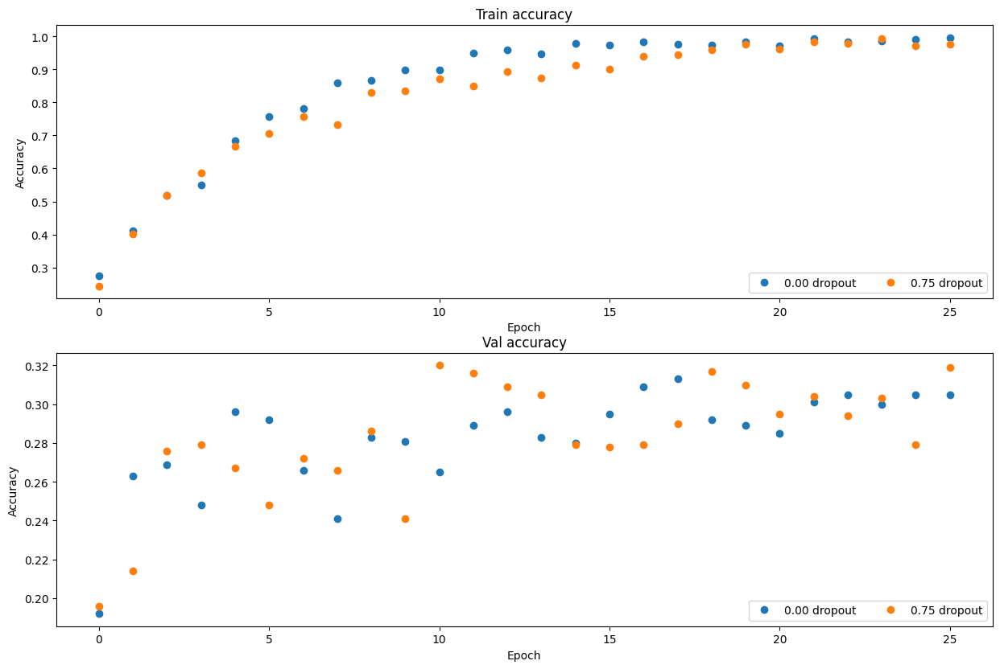

In [ ]:
# 'Plota' acurácias de treinamento e validação para as duas redes

train_accs = []
val_accs = []
for dropout in dropout_choices:
  solver = solvers[dropout]
  train_accs.append(solver.train_acc_history[-1])
  val_accs.append(solver.val_acc_history[-1])

plt.subplot(3, 1, 1)
for dropout in dropout_choices:
  plt.plot(solvers[dropout].train_acc_history, 'o', label='%.2f dropout' % dropout)
plt.title('Train accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(ncol=2, loc='lower right')

plt.subplot(3, 1, 2)
for dropout in dropout_choices:
  plt.plot(solvers[dropout].val_acc_history, 'o', label='%.2f dropout' % dropout)
plt.title('Val accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(ncol=2, loc='lower right')

plt.gcf().set_size_inches(15, 15)
plt.show()

# Treinar um bom modelo!

Agora, você deverá treinar o melhor modelo (completamente conectado) que conseguir sobre a base de dados CIFAR-10, armazenando seu melhor modelo na variável `best_model`. Você deverá ser capar de obter pelo menos 50% de acurácia sobre o conjunto de validação utilizando uma rede completamente conectada.

Se você for cuidadoso, é possível se obter acurácias acima de 55%, porém isto não é necessário neste momento e você não receberá pontos extras se o fizer. Mais adiante, você será estimulado a treinar a melhor rede convolucional que conseguir sobre a bass de dados CIFAR-10 e, portanto, é melhor que você use seu esforços trabalhando com redes convolucionais do que com redes completamente conectadas.


In [ ]:
np.random.seed(42)
learning_rate_list = np.random.uniform(1e-1, 1e-2, 10)
learning_rate_list

array([0.06629139, 0.01443571, 0.03412055, 0.04612074, 0.08595832,
       0.08596049, 0.09477247, 0.02204415, 0.04589965, 0.03627347])

In [ ]:
best_model = None
################################################################################
# TODO: Treinar o melhor modelo que você conseguir usando a classe             #
# FullyConnectedNet sobre a base de dados CIFAR-10. Você talvez ache útil usar #
# as técnicas de "batch normalization" e "dropout" para isso.                  #
# Ao final, você deve armazenar o melhor modelo na variável "best_model".      #
################################################################################


best_model={}
weight_scale_list = np.random.uniform(1e-2, 5e-2)
learning_rate_list = np.random.uniform(1e-1, 1e-2)
reg_list = np.random.uniform(0.5, 1)
hidden_layers = [[50,50,50,50],[75,75,75,75], [100,100,100,100], [150,150,150,150]]
update_rule_list=['sgd','sgd_momentum','rmsprop','adam']
batch_size_list= [200, 250, 500, 750]
# #batch_norm_list= [False, True]
# batch_norm_list= [True]
dropout_list= [0, 10, 15, 20]
i = 0

for m in range(2):
  n = np.random.randint(0, 4)
  print(n)
  weight_scale = np.random.uniform(1e-2, 5e-2)
  print(weight_scale )
  learning_rate = np.random.uniform(1e-1, 1e-2)
  print(learning_rate)
  hidden_dims = hidden_layers[n]
  print(hidden_dims)
  update_rule = update_rule_list[n]
  print(update_rule)
  batch_size = batch_size_list[n]
  print(batch_size)
  dropout_p = dropout_list
  print(dropout_p)
  reg = np.random.uniform(0.5, 1)
  print(reg)

3
0.024690233128577193
0.09172580651582771
[150, 150, 150, 150]
adam
750
[0, 10, 15, 20]
0.8818301645356057
2
0.04900112684027722
0.02620110843245474
[100, 100, 100, 100]
rmsprop
500
[0, 10, 15, 20]
0.5282803913204761


We use batchnorm here

 modelo: modelo1 -------- best_val_acc: 0.518 -------- best_test_acc: 0.501
 

 Best Model: {'test_accuracy': 0.501, 'val_accuracy': 0.518, 'weight_scale': 0.028759204759008547, 'learning_rate': 0.044311730120203535, 'hidden_dims': [50, 50, 50, 50], 'update_rule': 'sgd', 'batch_size': 200, 'batch_norm': True, 'dropout_p': 0, 'reg': 0.67078766599908, 'Solver': <__main__.Solver object at 0x7b978ce04ca0>} 



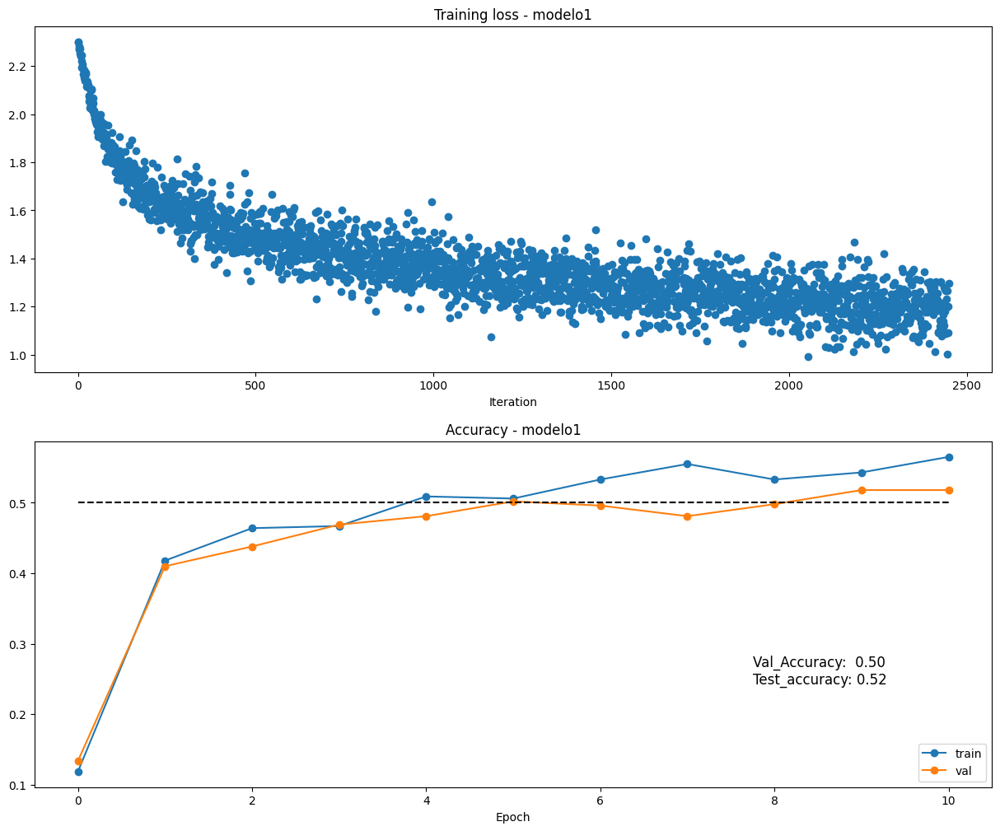


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo2 -------- best_val_acc: 0.51 -------- best_test_acc: 0.493
 

 Best Model: {'test_accuracy': 0.493, 'val_accuracy': 0.51, 'weight_scale': 0.01490638334489752, 'learning_rate': 0.012439996489425661, 'hidden_dims': [50, 50, 50, 50], 'update_rule': 'sgd', 'batch_size': 200, 'batch_norm': True, 'dropout_p': 0, 'reg': 0.6400577172754628, 'Solver': <__main__.Solver object at 0x7b978ce05d80>} 



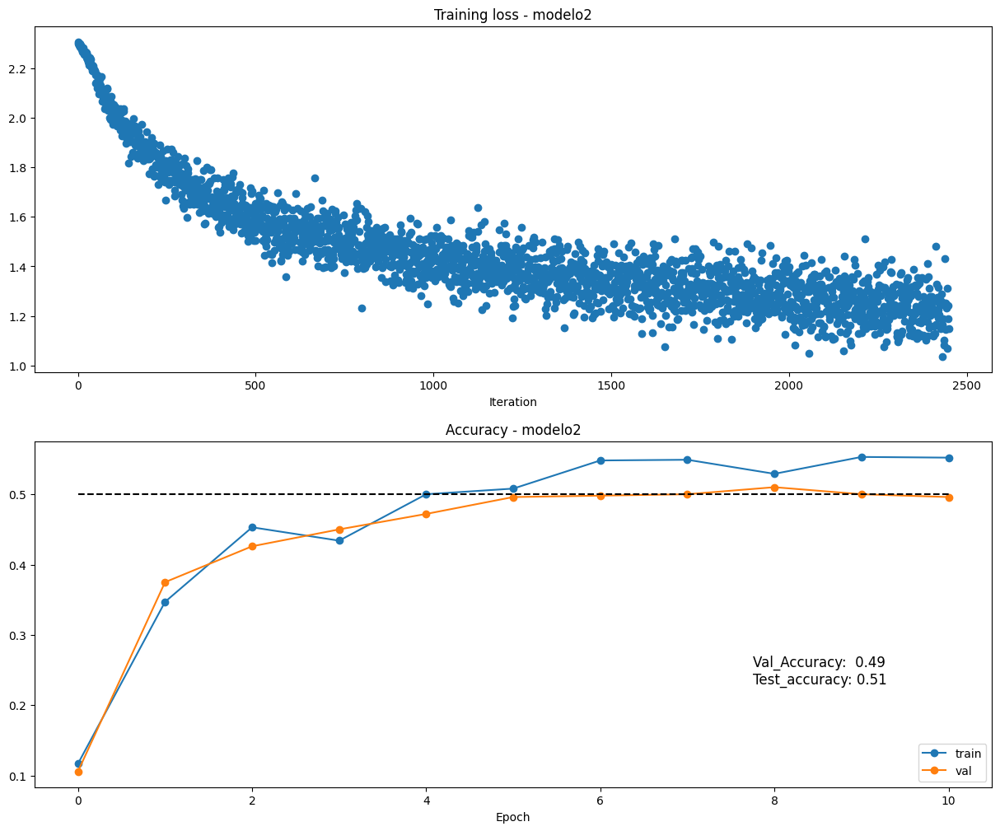


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo3 -------- best_val_acc: 0.508 -------- best_test_acc: 0.487
 

 Best Model: {'test_accuracy': 0.487, 'val_accuracy': 0.508, 'weight_scale': 0.025367118331105526, 'learning_rate': 0.0716850182275135, 'hidden_dims': [100, 100, 100, 100], 'update_rule': 'rmsprop', 'batch_size': 500, 'batch_norm': True, 'dropout_p': 15, 'reg': 0.8701728226700522, 'Solver': <__main__.Solver object at 0x7b9786f563b0>} 



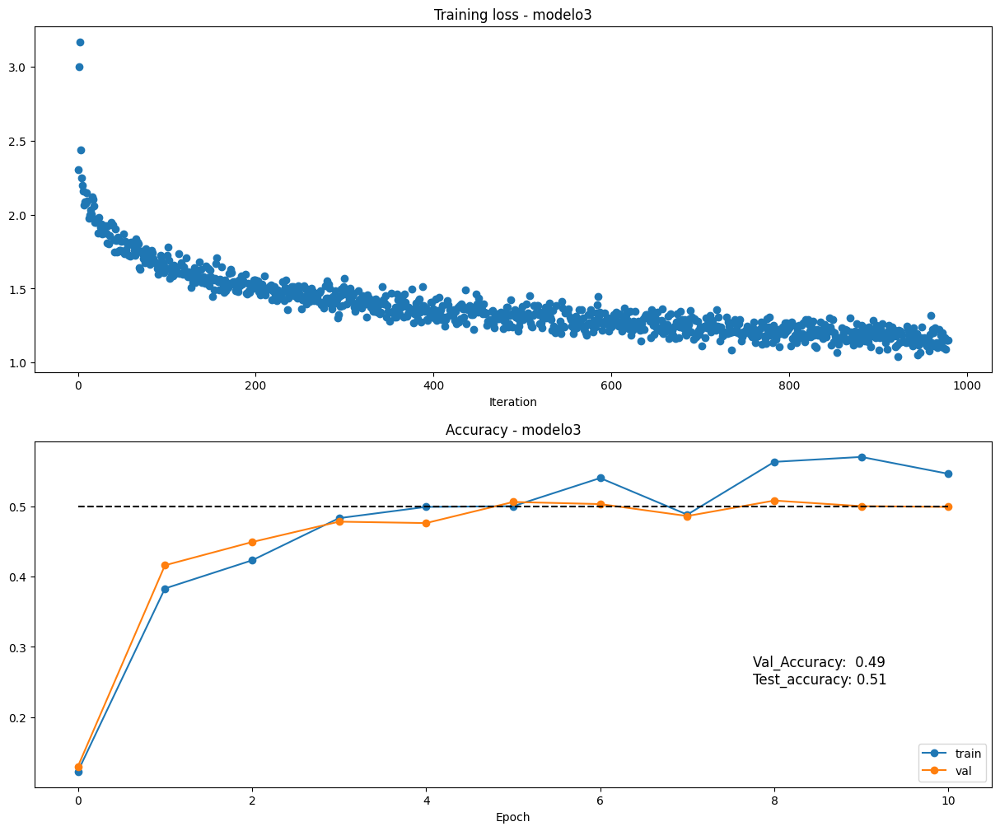


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo4 -------- best_val_acc: 0.54 -------- best_test_acc: 0.527
 

 Best Model: {'test_accuracy': 0.527, 'val_accuracy': 0.54, 'weight_scale': 0.04227154658164418, 'learning_rate': 0.02623238910199714, 'hidden_dims': [100, 100, 100, 100], 'update_rule': 'rmsprop', 'batch_size': 500, 'batch_norm': True, 'dropout_p': 15, 'reg': 0.779547078503013, 'Solver': <__main__.Solver object at 0x7b9786e36830>} 



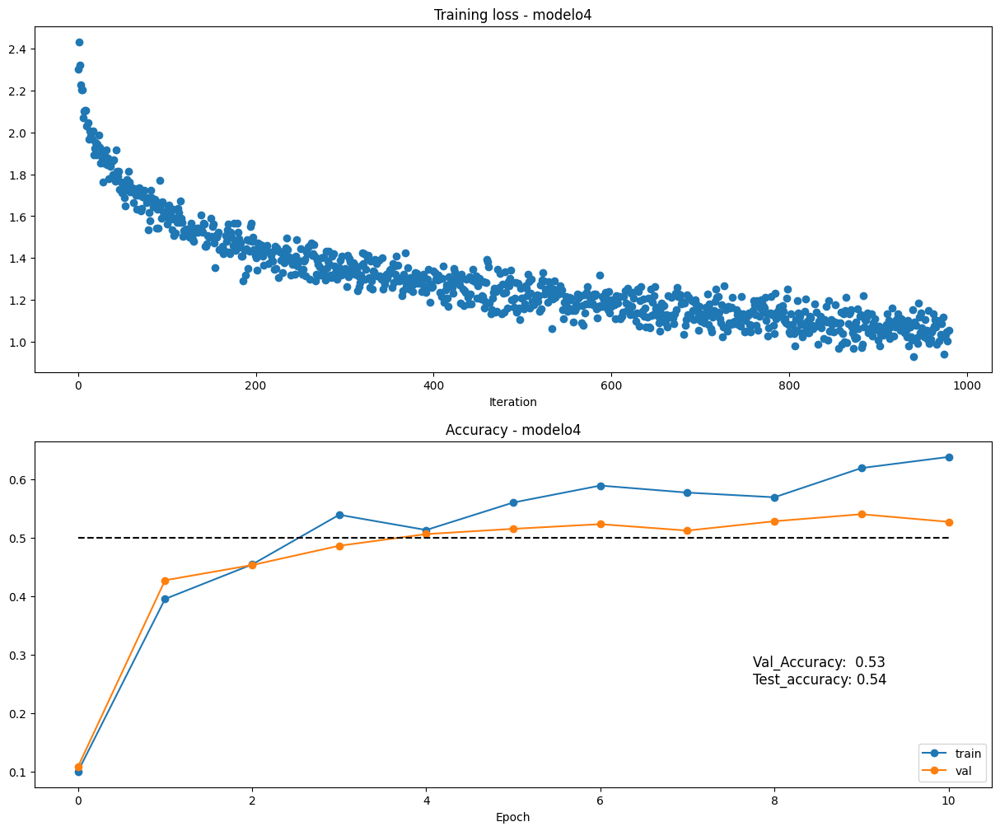


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo5 -------- best_val_acc: 0.528 -------- best_test_acc: 0.523
 

 Best Model: {'test_accuracy': 0.523, 'val_accuracy': 0.528, 'weight_scale': 0.04473942232140706, 'learning_rate': 0.027563363831968182, 'hidden_dims': [75, 75, 75, 75], 'update_rule': 'sgd_momentum', 'batch_size': 250, 'batch_norm': True, 'dropout_p': 10, 'reg': 0.7554275071252868, 'Solver': <__main__.Solver object at 0x7b9786eb79a0>} 



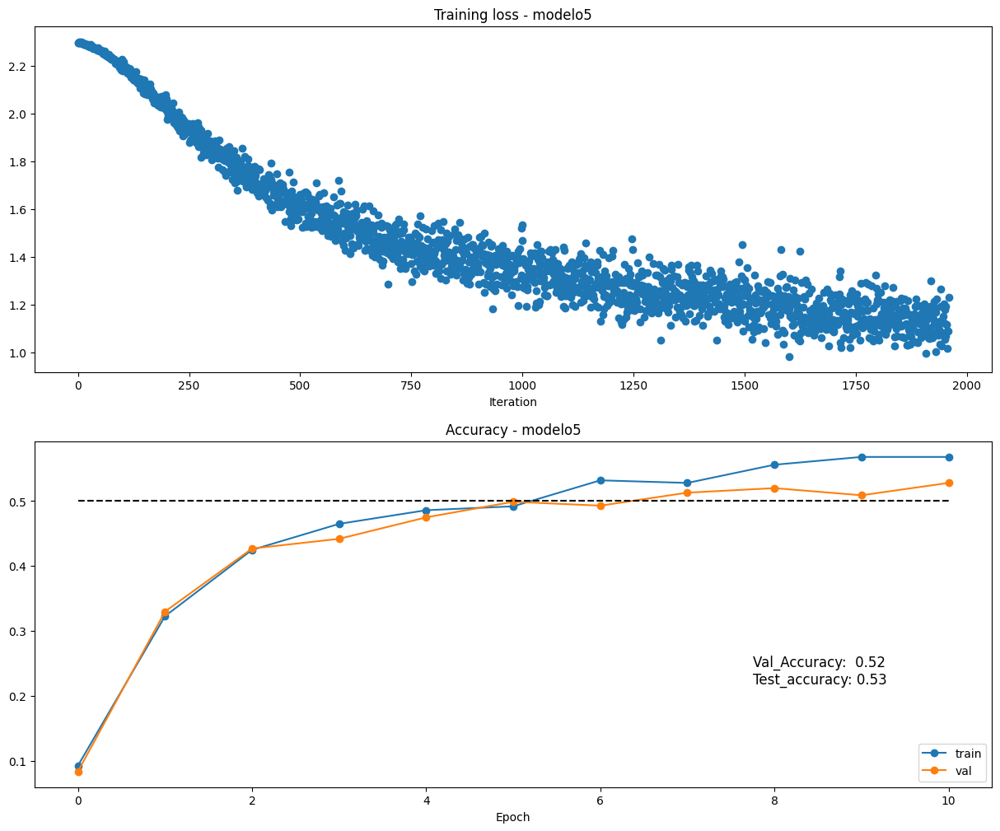


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo6 -------- best_val_acc: 0.496 -------- best_test_acc: 0.484
 

 Best Model: {'test_accuracy': 0.484, 'val_accuracy': 0.496, 'weight_scale': 0.047594185511374586, 'learning_rate': 0.07287381451179782, 'hidden_dims': [100, 100, 100, 100], 'update_rule': 'rmsprop', 'batch_size': 500, 'batch_norm': True, 'dropout_p': 15, 'reg': 0.6594870759277145, 'Solver': <__main__.Solver object at 0x7b9786dfa080>} 



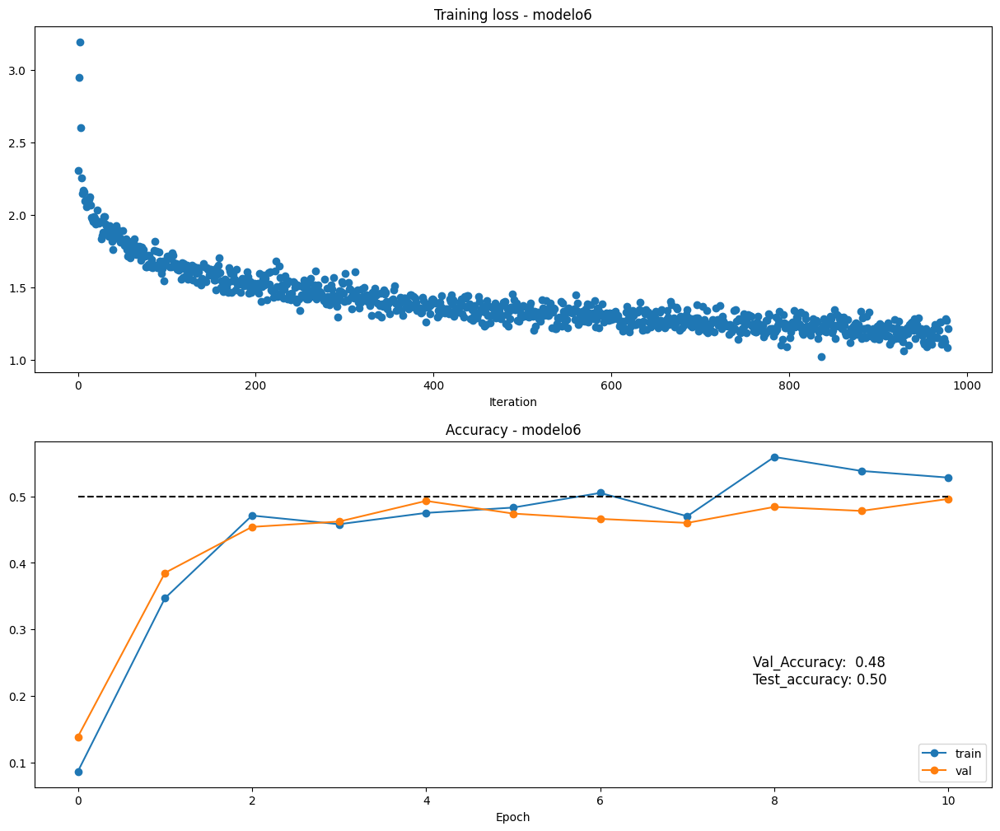


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo7 -------- best_val_acc: 0.552 -------- best_test_acc: 0.521
 

 Best Model: {'test_accuracy': 0.521, 'val_accuracy': 0.552, 'weight_scale': 0.01427651505590259, 'learning_rate': 0.04811794919914662, 'hidden_dims': [150, 150, 150, 150], 'update_rule': 'adam', 'batch_size': 750, 'batch_norm': True, 'dropout_p': 20, 'reg': 0.6730066023588521, 'Solver': <__main__.Solver object at 0x7b9786ca4a90>} 



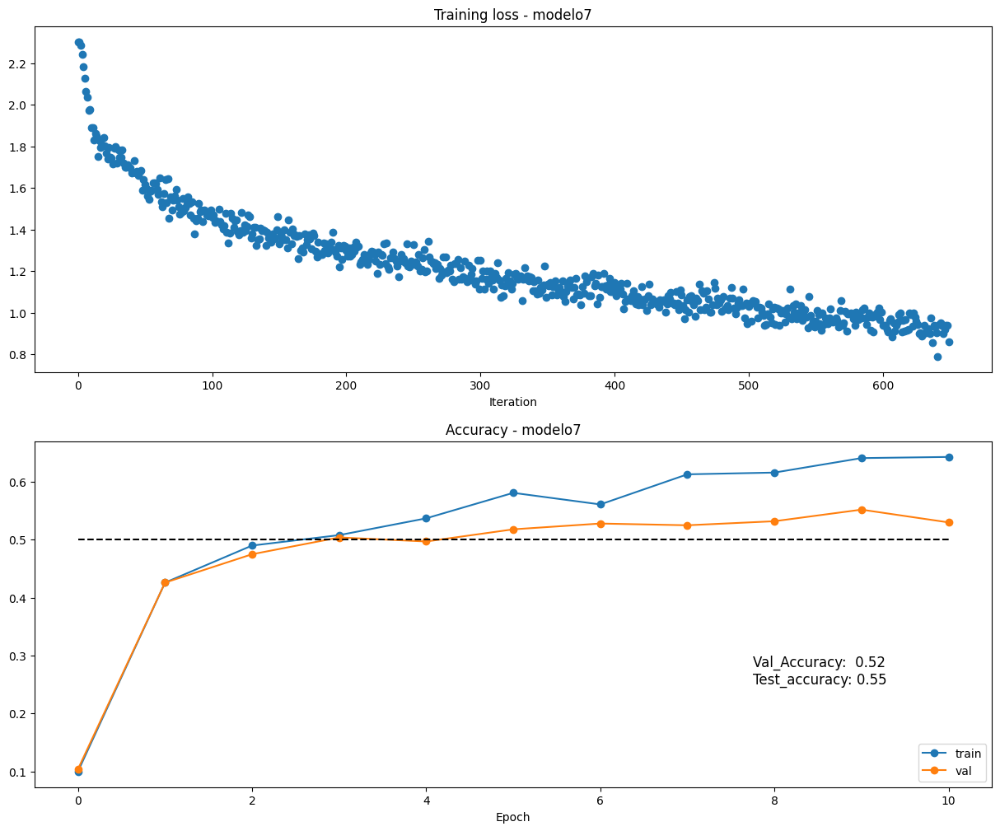


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo8 -------- best_val_acc: 0.527 -------- best_test_acc: 0.523
 

 Best Model: {'test_accuracy': 0.523, 'val_accuracy': 0.527, 'weight_scale': 0.010759841294804659, 'learning_rate': 0.0699478906234107, 'hidden_dims': [75, 75, 75, 75], 'update_rule': 'sgd_momentum', 'batch_size': 250, 'batch_norm': True, 'dropout_p': 10, 'reg': 0.7321277176580765, 'Solver': <__main__.Solver object at 0x7b9786ca77c0>} 



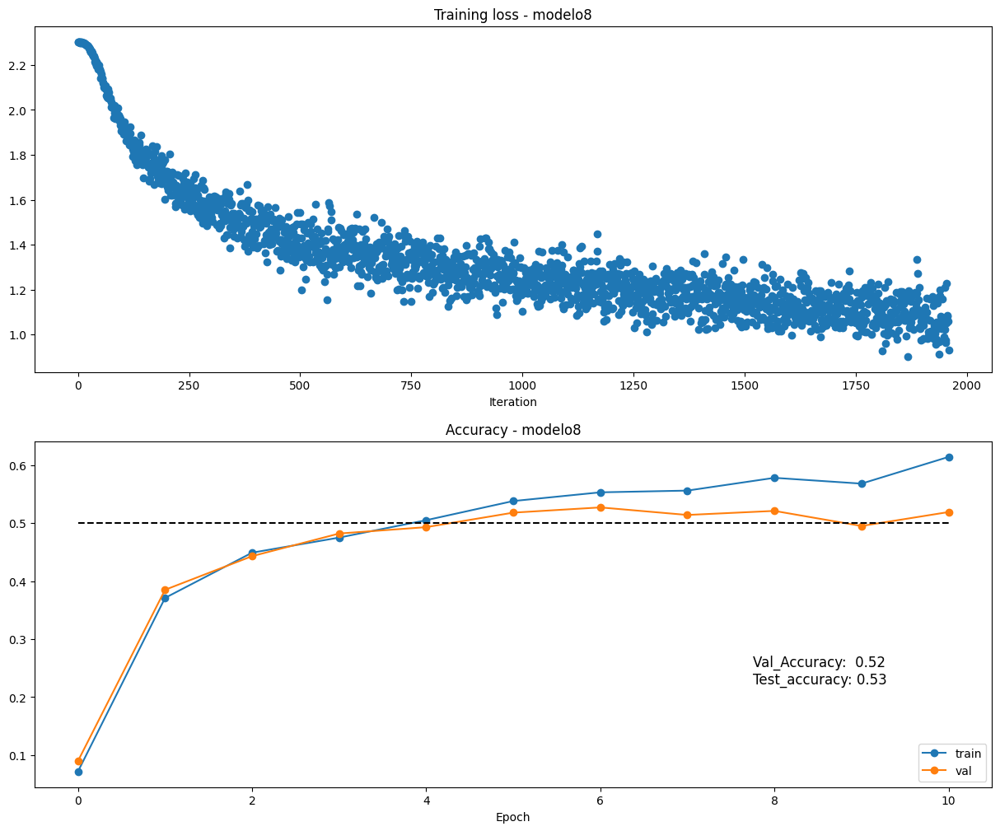


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo9 -------- best_val_acc: 0.502 -------- best_test_acc: 0.503
 

 Best Model: {'test_accuracy': 0.503, 'val_accuracy': 0.502, 'weight_scale': 0.040193217427528335, 'learning_rate': 0.07556428032711612, 'hidden_dims': [100, 100, 100, 100], 'update_rule': 'rmsprop', 'batch_size': 500, 'batch_norm': True, 'dropout_p': 15, 'reg': 0.9685691458927409, 'Solver': <__main__.Solver object at 0x7b9786b49720>} 



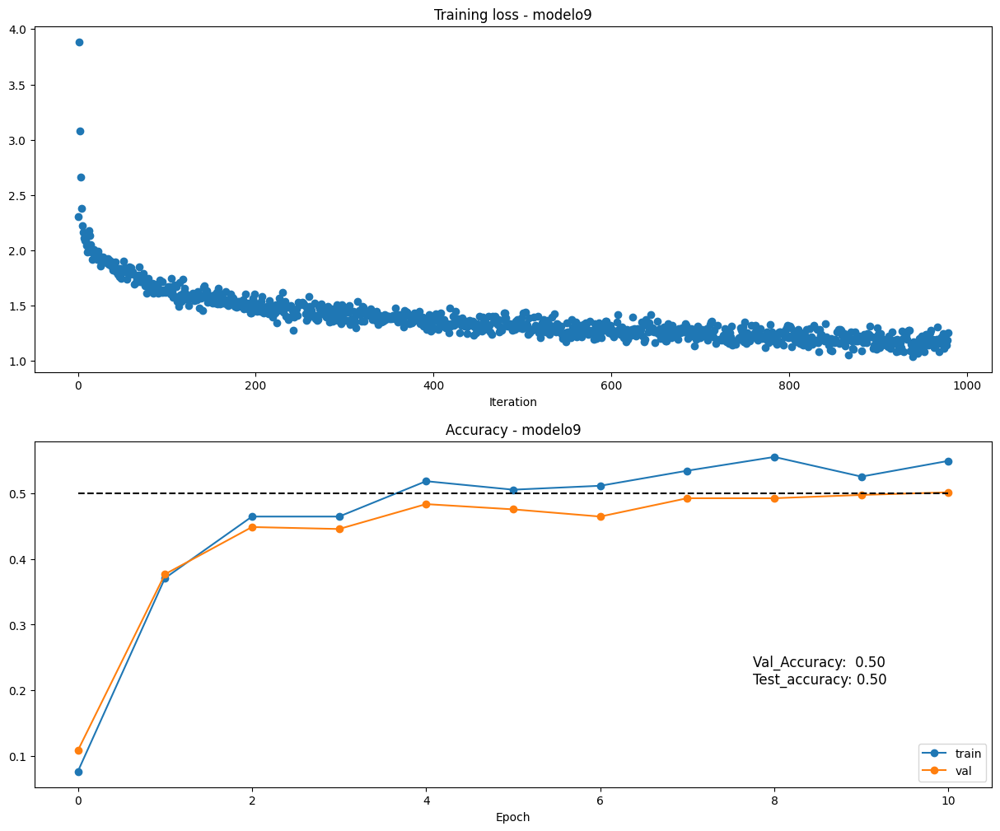


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo10 -------- best_val_acc: 0.537 -------- best_test_acc: 0.523
 

 Best Model: {'test_accuracy': 0.523, 'val_accuracy': 0.537, 'weight_scale': 0.011351237074559303, 'learning_rate': 0.02857959272060119, 'hidden_dims': [150, 150, 150, 150], 'update_rule': 'adam', 'batch_size': 750, 'batch_norm': True, 'dropout_p': 20, 'reg': 0.9109034817199516, 'Solver': <__main__.Solver object at 0x7b978ce82830>} 



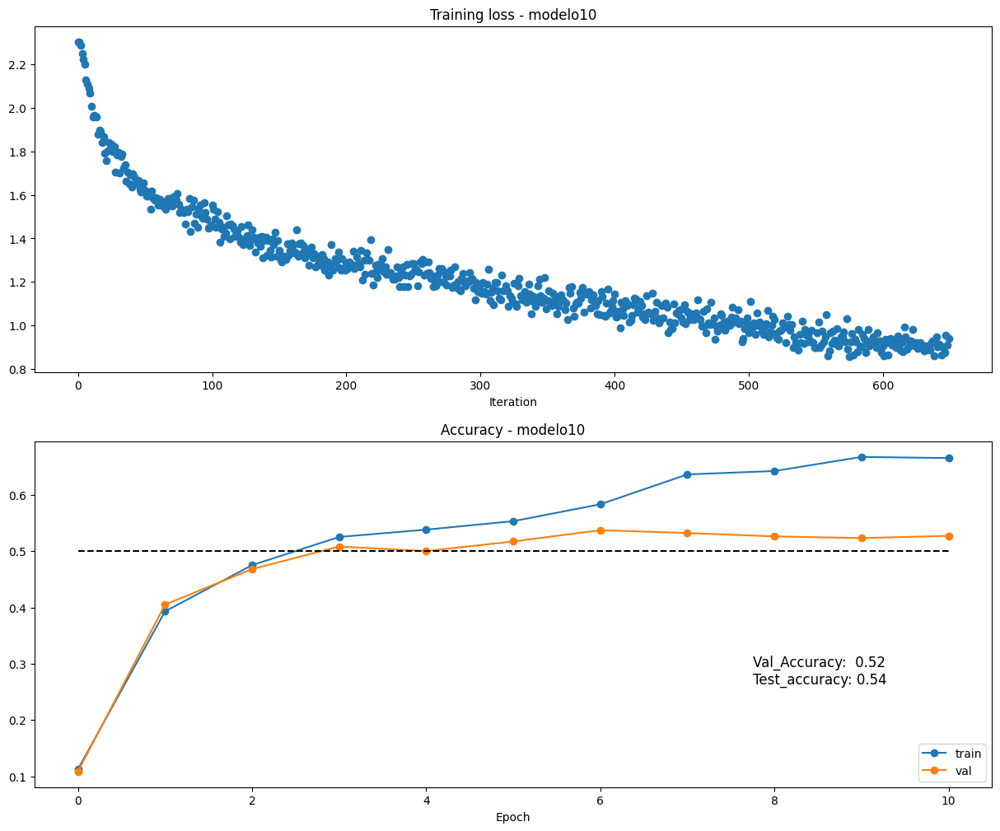


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo11 -------- best_val_acc: 0.515 -------- best_test_acc: 0.493
 

 Best Model: {'test_accuracy': 0.493, 'val_accuracy': 0.515, 'weight_scale': 0.023560976682521217, 'learning_rate': 0.06552821336186358, 'hidden_dims': [100, 100, 100, 100], 'update_rule': 'rmsprop', 'batch_size': 500, 'batch_norm': True, 'dropout_p': 15, 'reg': 0.7069922247424465, 'Solver': <__main__.Solver object at 0x7b978cf58880>} 



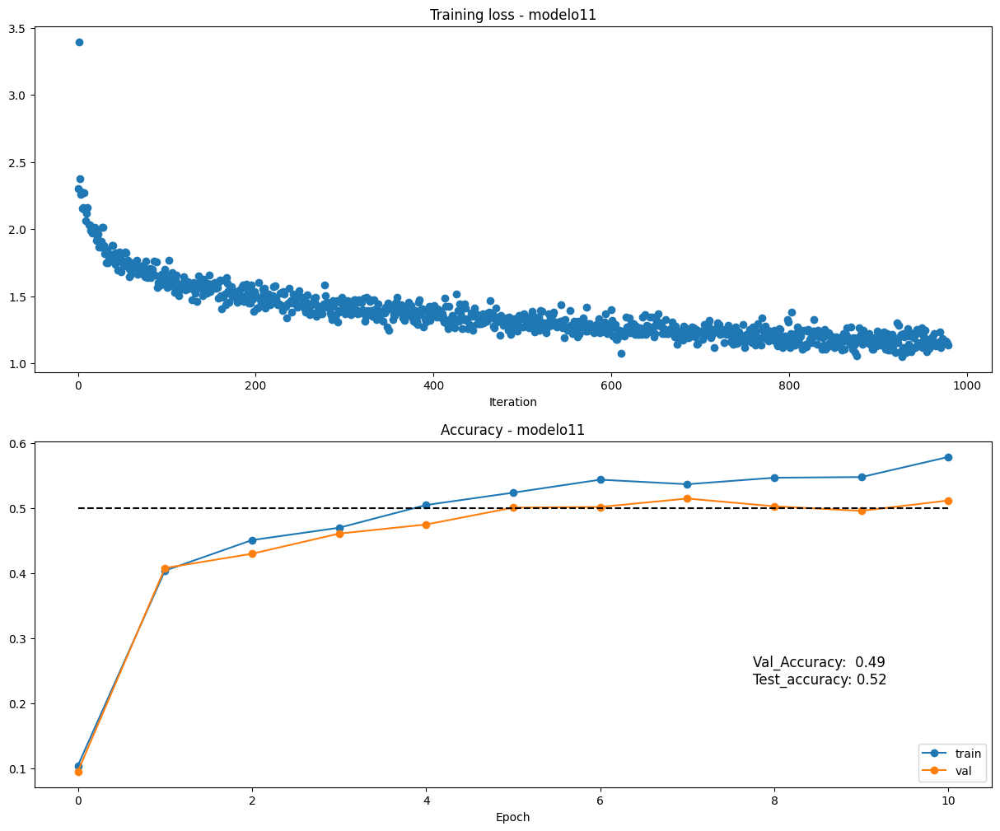


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo12 -------- best_val_acc: 0.49 -------- best_test_acc: 0.48
 

 Best Model: {'test_accuracy': 0.48, 'val_accuracy': 0.49, 'weight_scale': 0.02608485274782333, 'learning_rate': 0.012516489749721707, 'hidden_dims': [75, 75, 75, 75], 'update_rule': 'sgd_momentum', 'batch_size': 250, 'batch_norm': True, 'dropout_p': 10, 'reg': 0.5196069359292066, 'Solver': <__main__.Solver object at 0x7b978c229690>} 



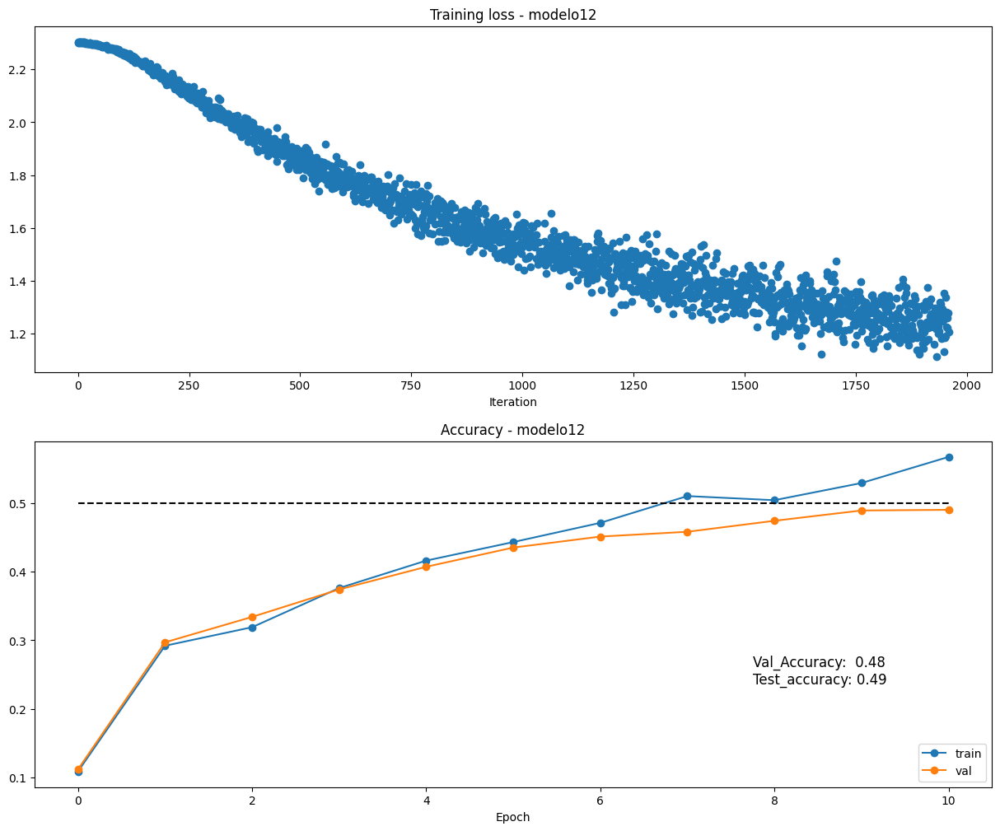


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo13 -------- best_val_acc: 0.504 -------- best_test_acc: 0.486
 

 Best Model: {'test_accuracy': 0.486, 'val_accuracy': 0.504, 'weight_scale': 0.045310868977049515, 'learning_rate': 0.07008724951421773, 'hidden_dims': [50, 50, 50, 50], 'update_rule': 'sgd', 'batch_size': 200, 'batch_norm': True, 'dropout_p': 0, 'reg': 0.8383113532512239, 'Solver': <__main__.Solver object at 0x7b978c247eb0>} 



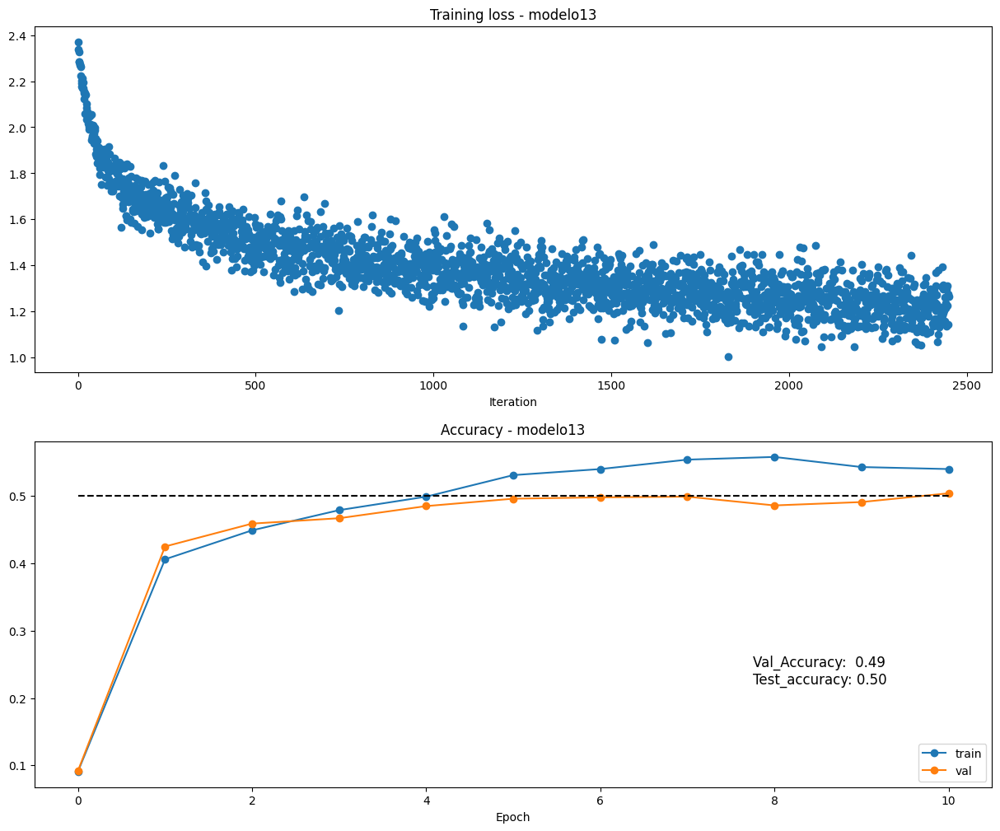


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo14 -------- best_val_acc: 0.544 -------- best_test_acc: 0.506
 

 Best Model: {'test_accuracy': 0.506, 'val_accuracy': 0.544, 'weight_scale': 0.014364659255845331, 'learning_rate': 0.0955628481992688, 'hidden_dims': [75, 75, 75, 75], 'update_rule': 'sgd_momentum', 'batch_size': 250, 'batch_norm': True, 'dropout_p': 10, 'reg': 0.809722397290696, 'Solver': <__main__.Solver object at 0x7b978c2456c0>} 



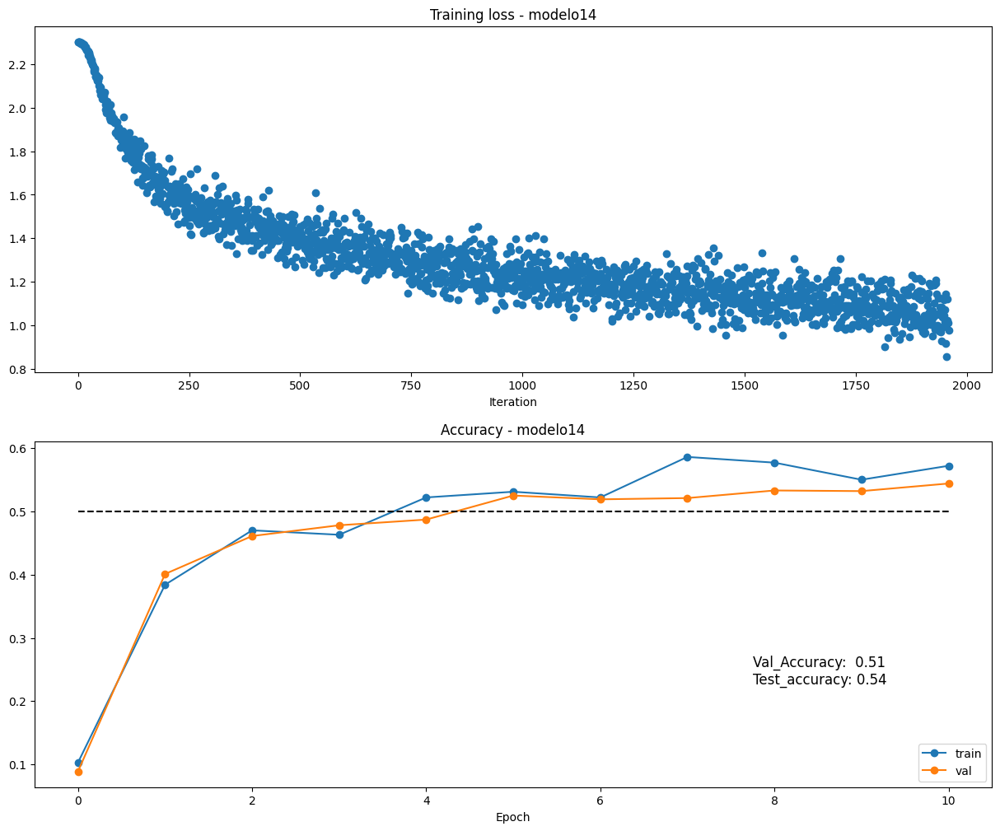


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo15 -------- best_val_acc: 0.495 -------- best_test_acc: 0.488
 

 Best Model: {'test_accuracy': 0.488, 'val_accuracy': 0.495, 'weight_scale': 0.020551683878120126, 'learning_rate': 0.08018808946345725, 'hidden_dims': [100, 100, 100, 100], 'update_rule': 'rmsprop', 'batch_size': 500, 'batch_norm': True, 'dropout_p': 15, 'reg': 0.7500558332334444, 'Solver': <__main__.Solver object at 0x7b9786cd0190>} 



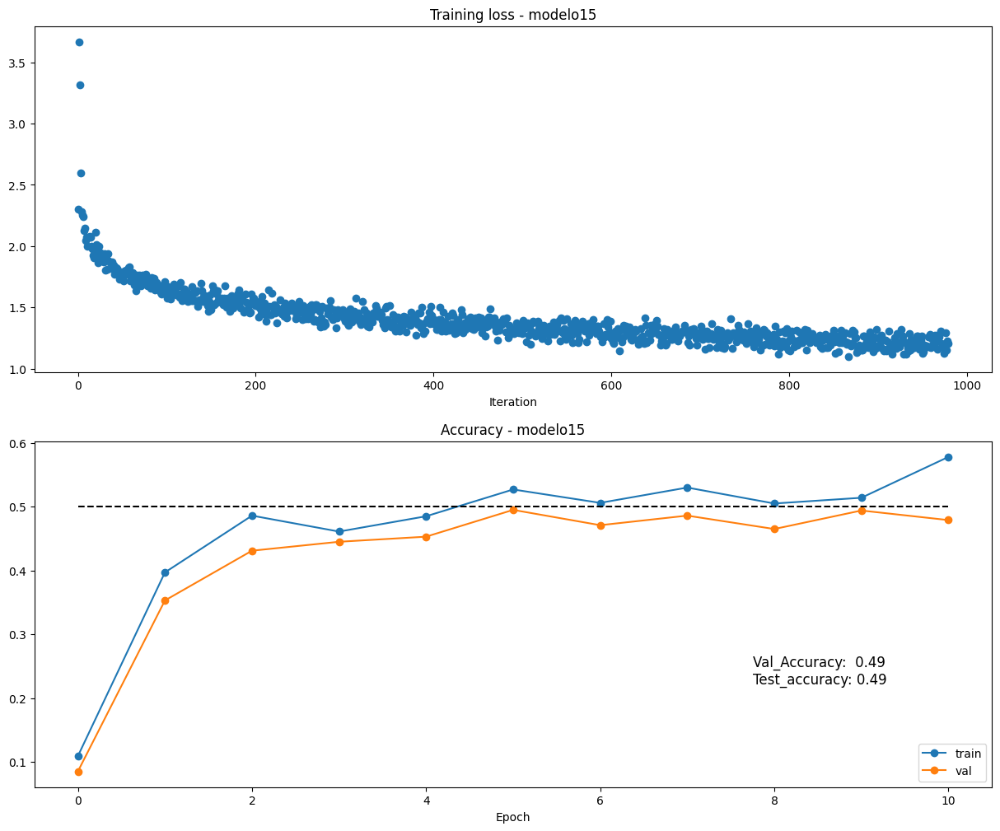


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo16 -------- best_val_acc: 0.528 -------- best_test_acc: 0.526
 

 Best Model: {'test_accuracy': 0.526, 'val_accuracy': 0.528, 'weight_scale': 0.035741374301222616, 'learning_rate': 0.06724147484349496, 'hidden_dims': [75, 75, 75, 75], 'update_rule': 'sgd_momentum', 'batch_size': 250, 'batch_norm': True, 'dropout_p': 10, 'reg': 0.9088303785617994, 'Solver': <__main__.Solver object at 0x7b9786a1b760>} 



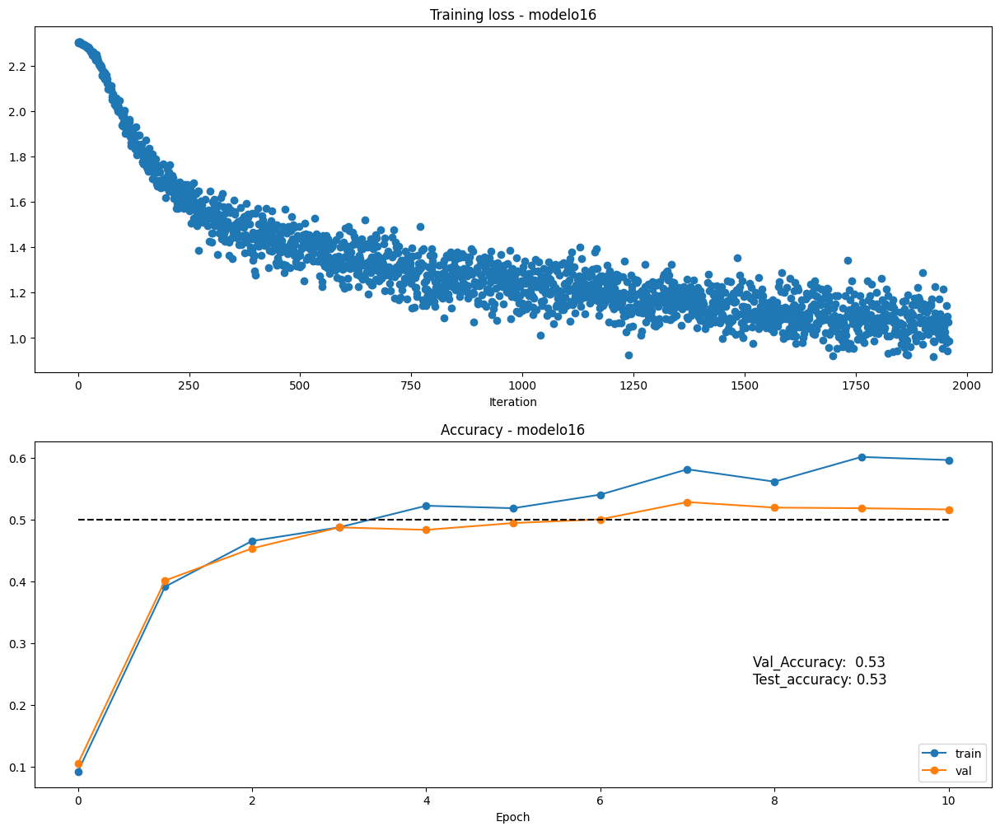


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo17 -------- best_val_acc: 0.527 -------- best_test_acc: 0.518
 

 Best Model: {'test_accuracy': 0.518, 'val_accuracy': 0.527, 'weight_scale': 0.02521605173098318, 'learning_rate': 0.025626145532414157, 'hidden_dims': [75, 75, 75, 75], 'update_rule': 'sgd_momentum', 'batch_size': 250, 'batch_norm': True, 'dropout_p': 10, 'reg': 0.5564502625024093, 'Solver': <__main__.Solver object at 0x7b9786a98e80>} 



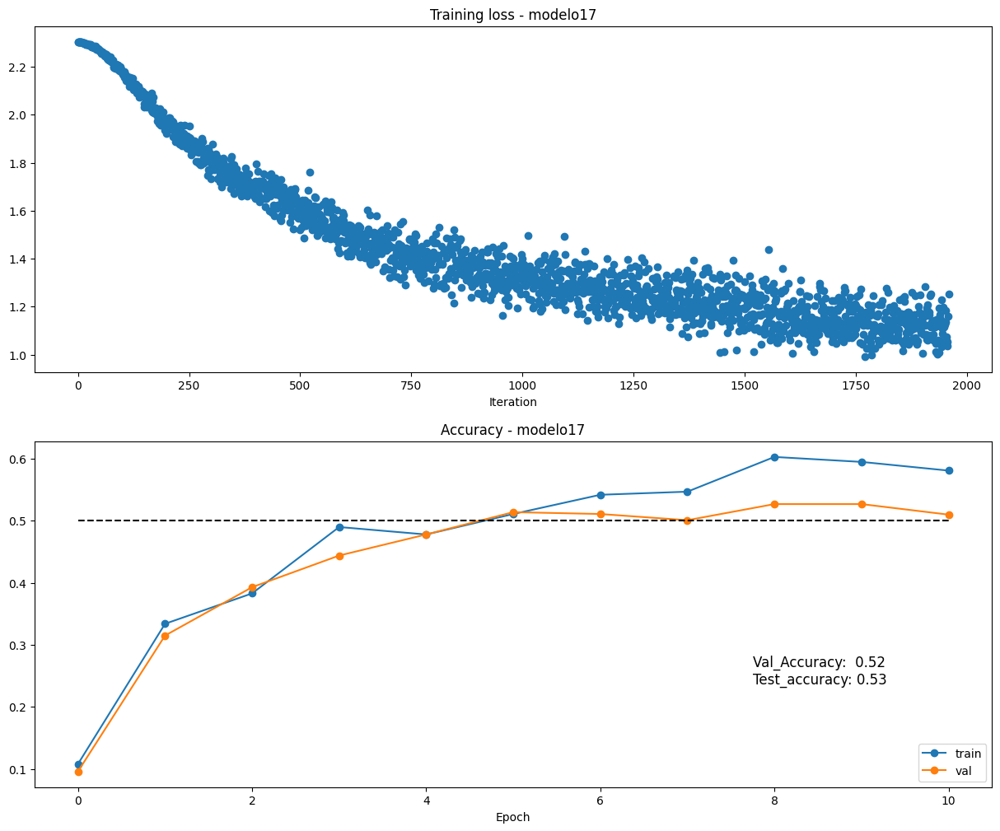


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo18 -------- best_val_acc: 0.527 -------- best_test_acc: 0.53
 

 Best Model: {'test_accuracy': 0.53, 'val_accuracy': 0.527, 'weight_scale': 0.013247385080487364, 'learning_rate': 0.019380717591968674, 'hidden_dims': [100, 100, 100, 100], 'update_rule': 'rmsprop', 'batch_size': 500, 'batch_norm': True, 'dropout_p': 15, 'reg': 0.934913188171044, 'Solver': <__main__.Solver object at 0x7b9786ac8dc0>} 



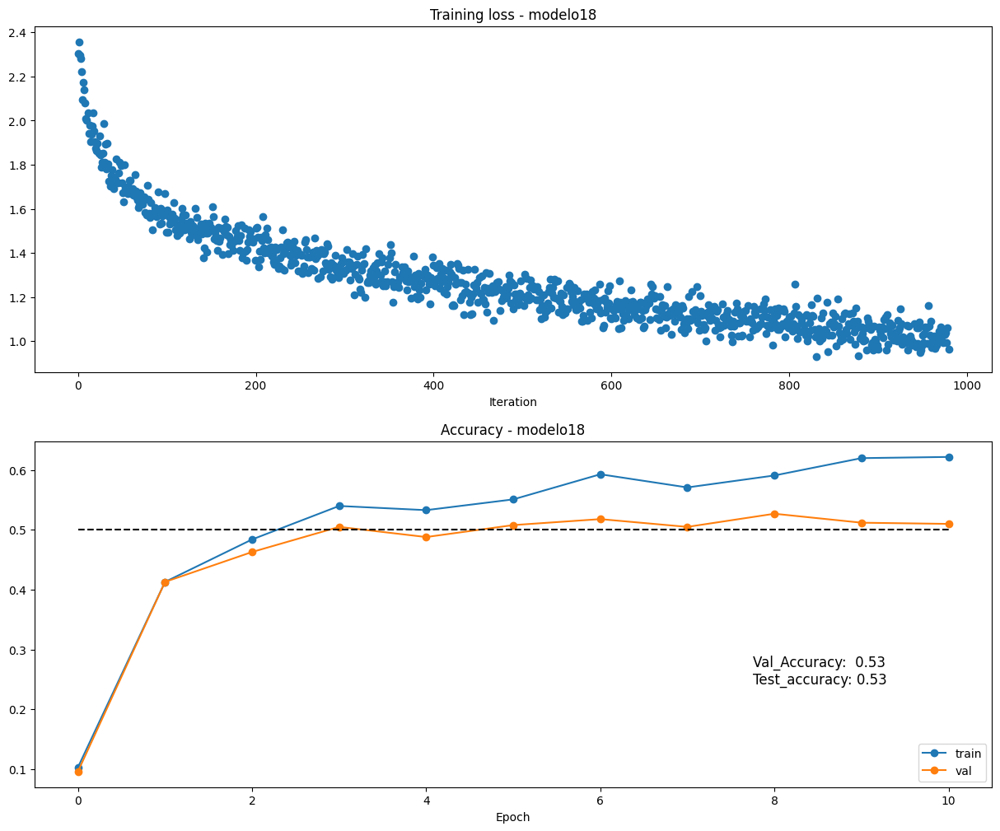


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo19 -------- best_val_acc: 0.503 -------- best_test_acc: 0.523
 

 Best Model: {'test_accuracy': 0.523, 'val_accuracy': 0.503, 'weight_scale': 0.041693444719142256, 'learning_rate': 0.06121191297681478, 'hidden_dims': [50, 50, 50, 50], 'update_rule': 'sgd', 'batch_size': 200, 'batch_norm': True, 'dropout_p': 0, 'reg': 0.8792664785009547, 'Solver': <__main__.Solver object at 0x7b978cf84a30>} 



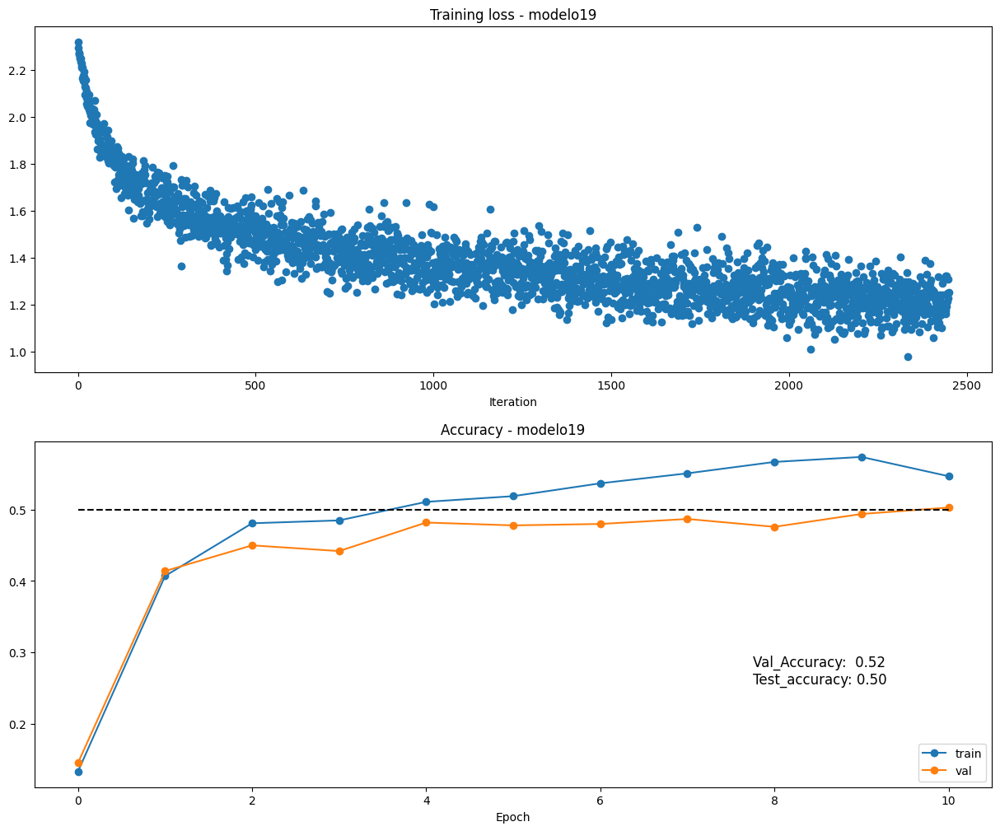


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo20 -------- best_val_acc: 0.543 -------- best_test_acc: 0.532
 

 Best Model: {'test_accuracy': 0.532, 'val_accuracy': 0.543, 'weight_scale': 0.01697493900746381, 'learning_rate': 0.04336491786883231, 'hidden_dims': [150, 150, 150, 150], 'update_rule': 'adam', 'batch_size': 750, 'batch_norm': True, 'dropout_p': 20, 'reg': 0.5031266740295084, 'Solver': <__main__.Solver object at 0x7b978f18c790>} 



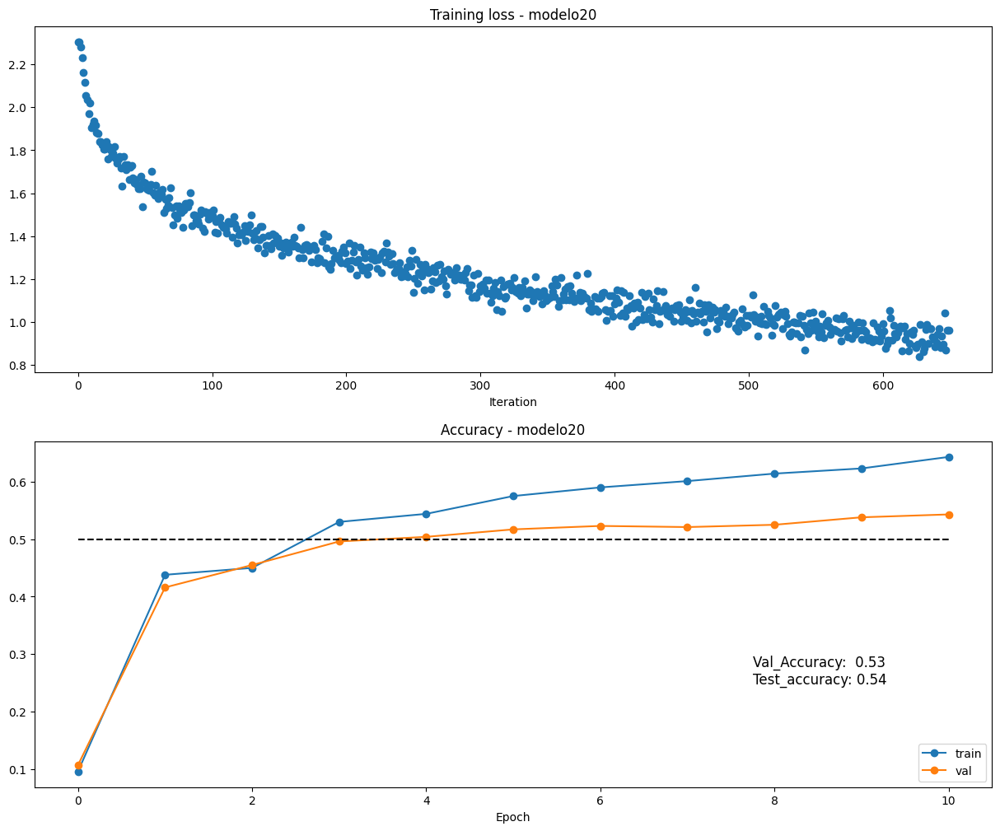


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo21 -------- best_val_acc: 0.521 -------- best_test_acc: 0.505
 

 Best Model: {'test_accuracy': 0.505, 'val_accuracy': 0.521, 'weight_scale': 0.026091661437442, 'learning_rate': 0.07468459797249286, 'hidden_dims': [75, 75, 75, 75], 'update_rule': 'sgd_momentum', 'batch_size': 250, 'batch_norm': True, 'dropout_p': 10, 'reg': 0.6741143270746279, 'Solver': <__main__.Solver object at 0x7b9786f1e020>} 



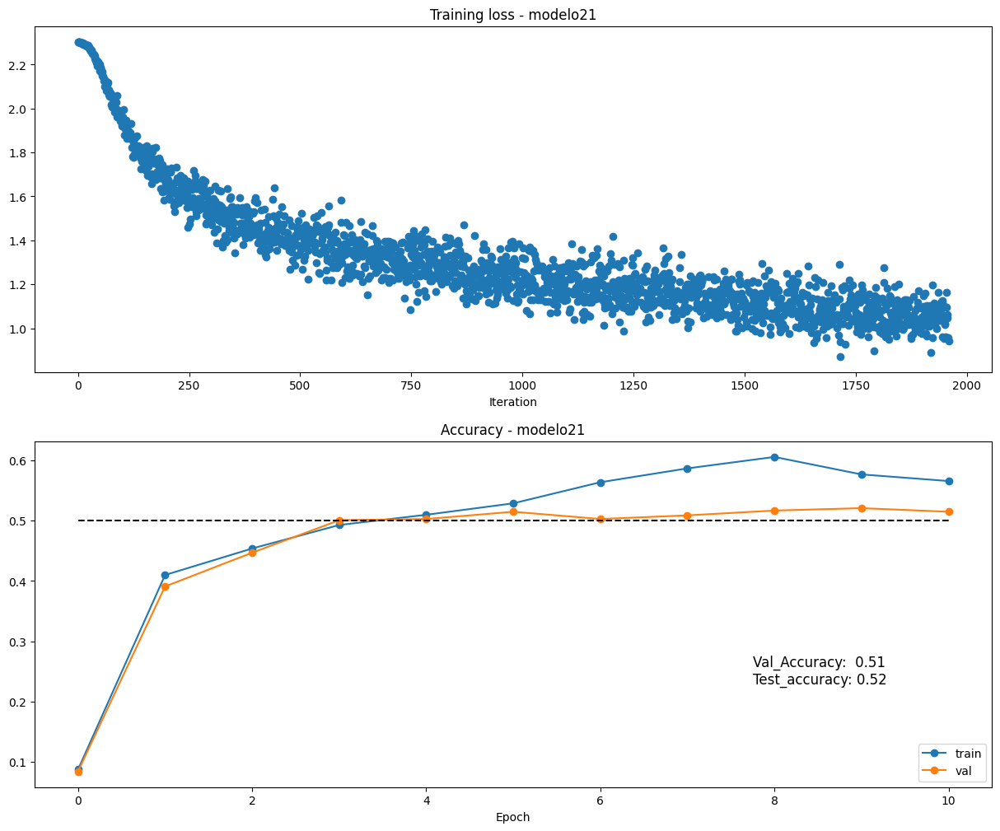


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo22 -------- best_val_acc: 0.545 -------- best_test_acc: 0.527
 

 Best Model: {'test_accuracy': 0.527, 'val_accuracy': 0.545, 'weight_scale': 0.03415036278529193, 'learning_rate': 0.07420338613387087, 'hidden_dims': [150, 150, 150, 150], 'update_rule': 'adam', 'batch_size': 750, 'batch_norm': True, 'dropout_p': 20, 'reg': 0.8060968718921542, 'Solver': <__main__.Solver object at 0x7b9786ac8fa0>} 



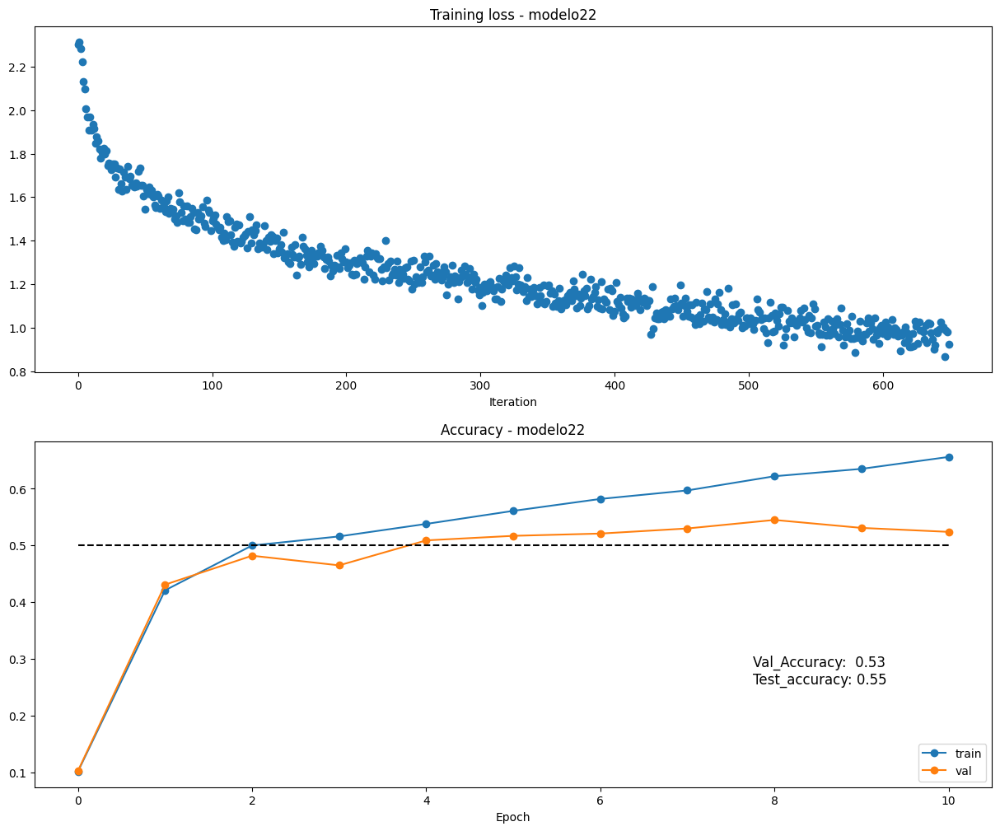


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo23 -------- best_val_acc: 0.523 -------- best_test_acc: 0.527
 

 Best Model: {'test_accuracy': 0.527, 'val_accuracy': 0.523, 'weight_scale': 0.04403189411196731, 'learning_rate': 0.04638117731301769, 'hidden_dims': [75, 75, 75, 75], 'update_rule': 'sgd_momentum', 'batch_size': 250, 'batch_norm': True, 'dropout_p': 10, 'reg': 0.7623594426826306, 'Solver': <__main__.Solver object at 0x7b9786a87c40>} 



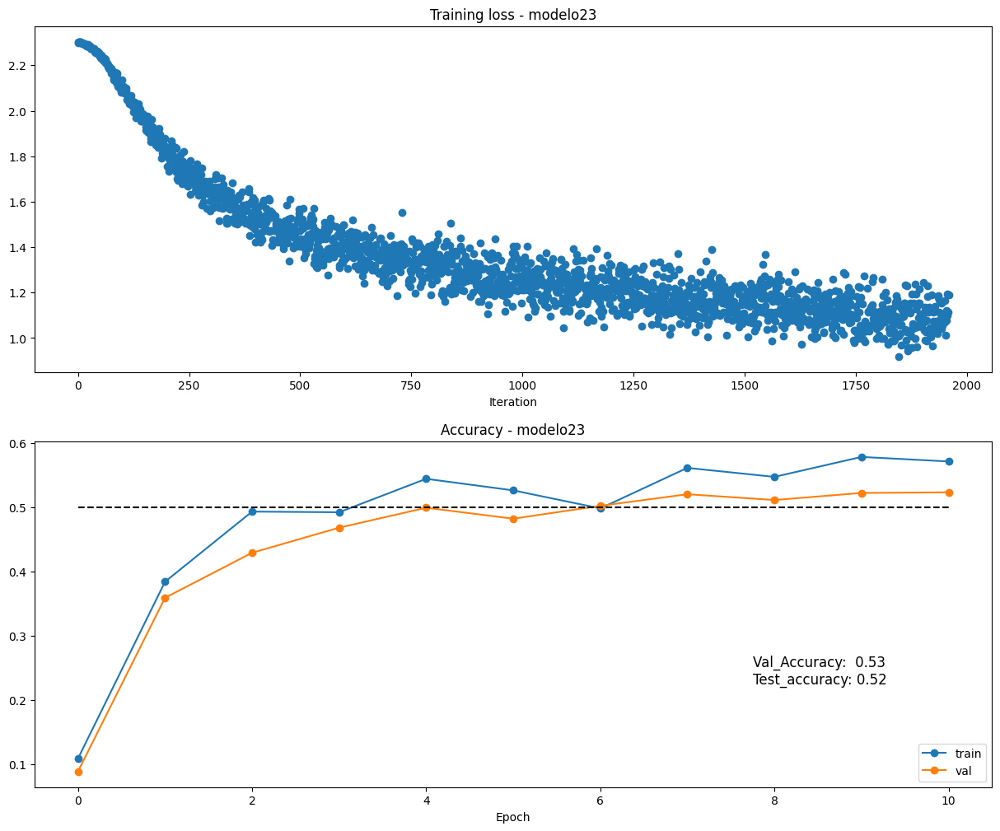


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo24 -------- best_val_acc: 0.524 -------- best_test_acc: 0.516
 

 Best Model: {'test_accuracy': 0.516, 'val_accuracy': 0.524, 'weight_scale': 0.01300635528507946, 'learning_rate': 0.08768068673861404, 'hidden_dims': [50, 50, 50, 50], 'update_rule': 'sgd', 'batch_size': 200, 'batch_norm': True, 'dropout_p': 0, 'reg': 0.9391166310900225, 'Solver': <__main__.Solver object at 0x7b9786a49030>} 



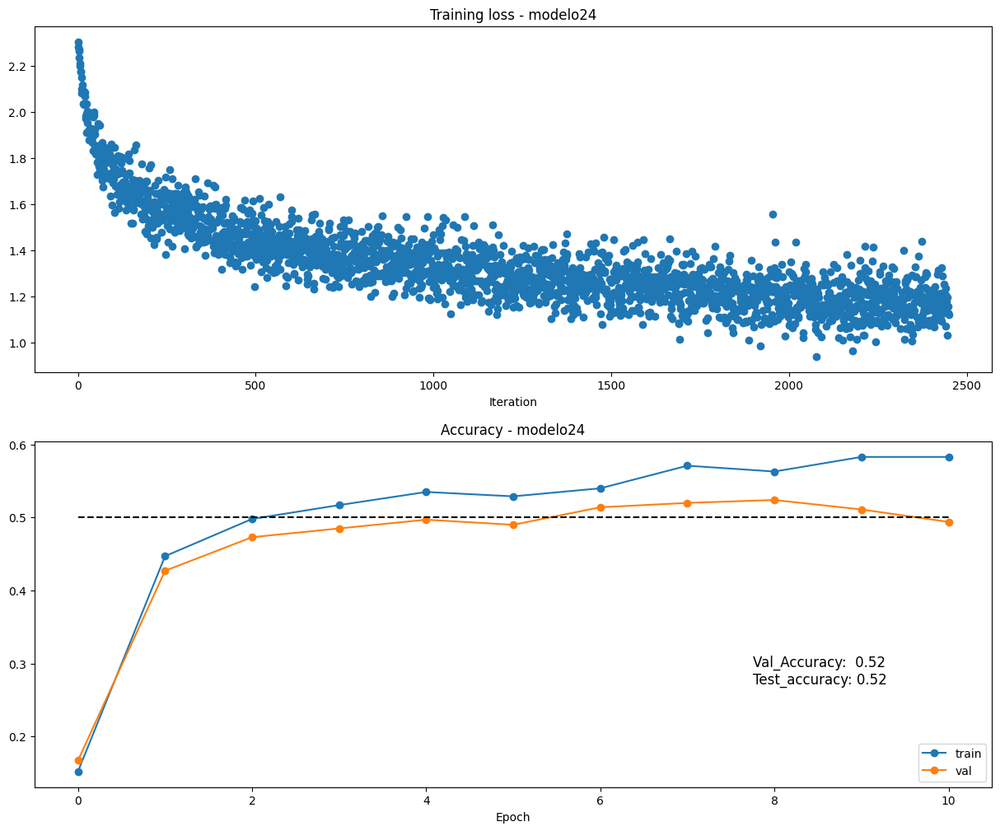


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo25 -------- best_val_acc: 0.527 -------- best_test_acc: 0.515
 

 Best Model: {'test_accuracy': 0.515, 'val_accuracy': 0.527, 'weight_scale': 0.030457510978251362, 'learning_rate': 0.06587708398690005, 'hidden_dims': [50, 50, 50, 50], 'update_rule': 'sgd', 'batch_size': 200, 'batch_norm': True, 'dropout_p': 0, 'reg': 0.7233043113112833, 'Solver': <__main__.Solver object at 0x7b9786a490c0>} 



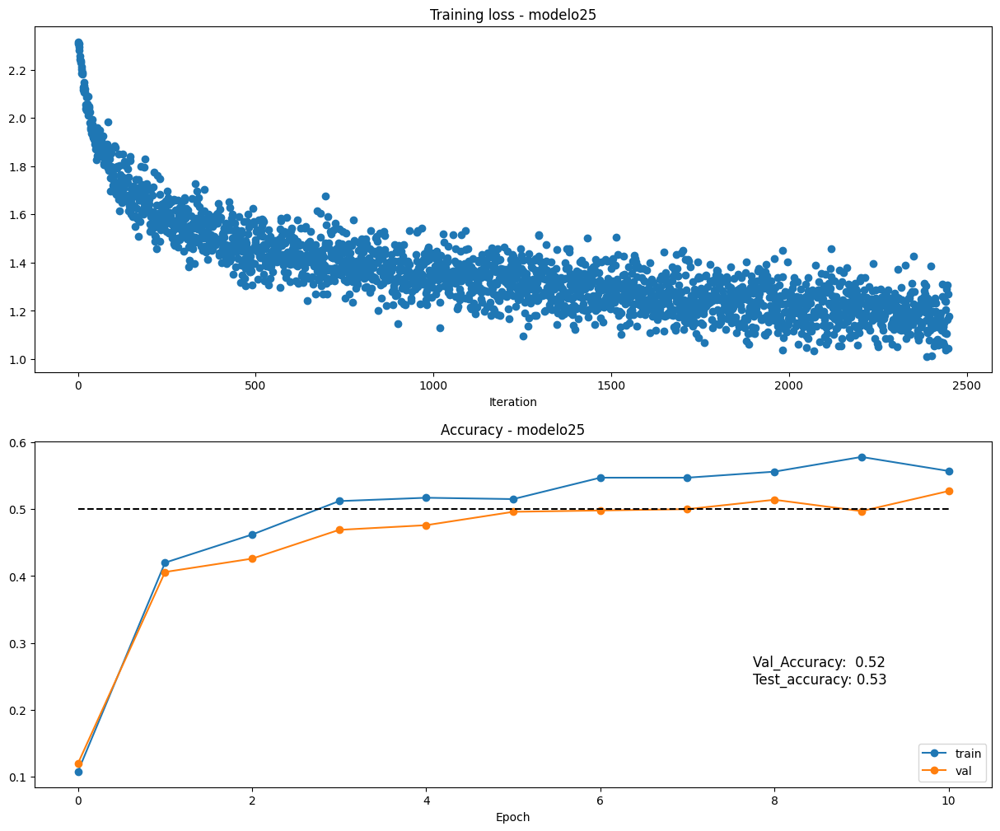


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo26 -------- best_val_acc: 0.514 -------- best_test_acc: 0.506
 

 Best Model: {'test_accuracy': 0.506, 'val_accuracy': 0.514, 'weight_scale': 0.03797767487349188, 'learning_rate': 0.047211986511558925, 'hidden_dims': [100, 100, 100, 100], 'update_rule': 'rmsprop', 'batch_size': 500, 'batch_norm': True, 'dropout_p': 15, 'reg': 0.7569732579346923, 'Solver': <__main__.Solver object at 0x7b9786dd7d60>} 



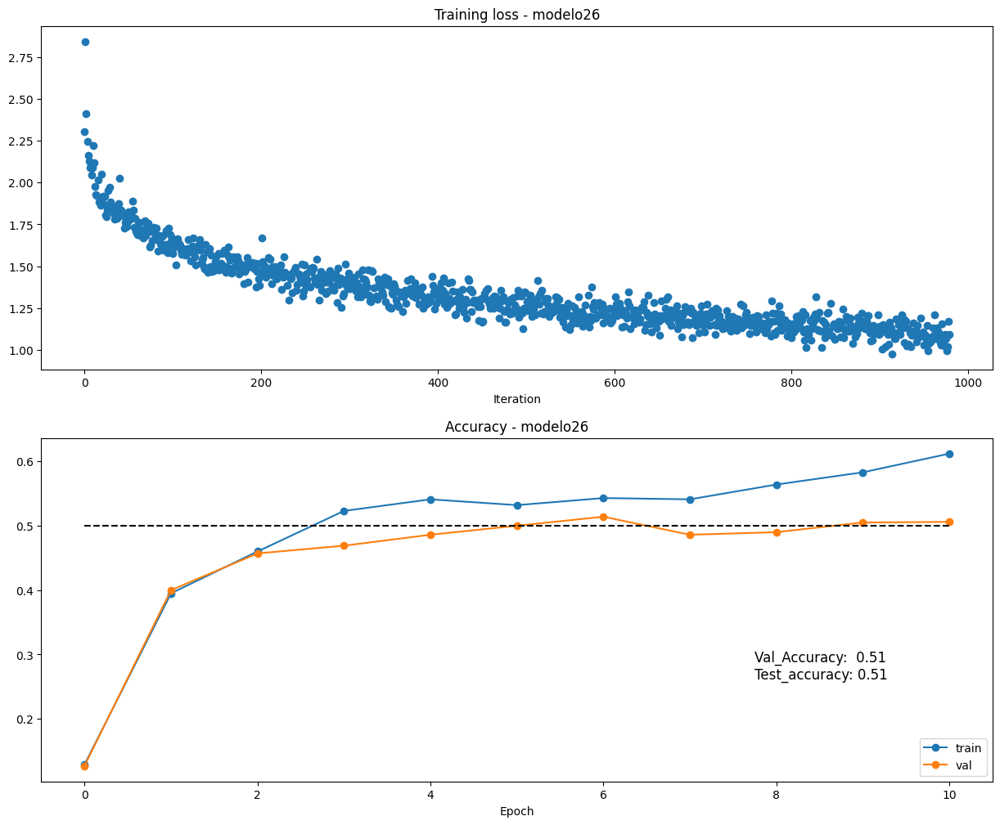


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo27 -------- best_val_acc: 0.554 -------- best_test_acc: 0.545
 

 Best Model: {'test_accuracy': 0.545, 'val_accuracy': 0.554, 'weight_scale': 0.03628310796515551, 'learning_rate': 0.014963784077532447, 'hidden_dims': [150, 150, 150, 150], 'update_rule': 'adam', 'batch_size': 750, 'batch_norm': True, 'dropout_p': 20, 'reg': 0.9136099107864678, 'Solver': <__main__.Solver object at 0x7b97869f96c0>} 



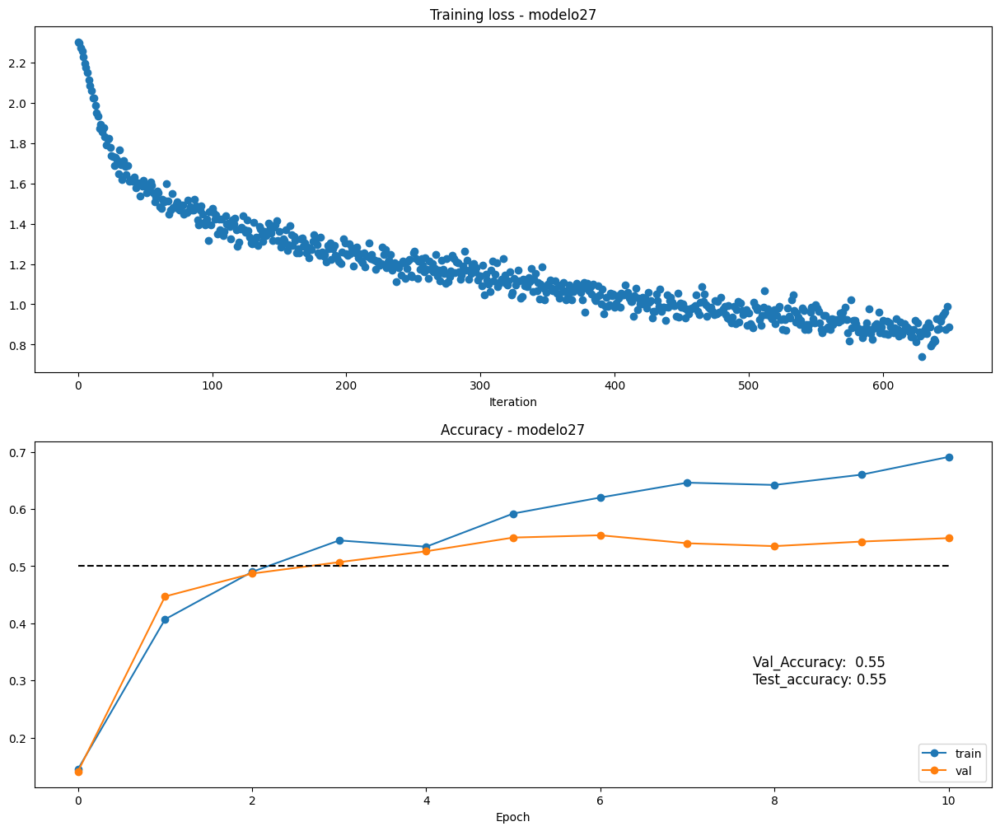


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo28 -------- best_val_acc: 0.516 -------- best_test_acc: 0.52
 

 Best Model: {'test_accuracy': 0.52, 'val_accuracy': 0.516, 'weight_scale': 0.021269175702378552, 'learning_rate': 0.08111264591525882, 'hidden_dims': [50, 50, 50, 50], 'update_rule': 'sgd', 'batch_size': 200, 'batch_norm': True, 'dropout_p': 0, 'reg': 0.7309724972639102, 'Solver': <__main__.Solver object at 0x7b9786fed990>} 



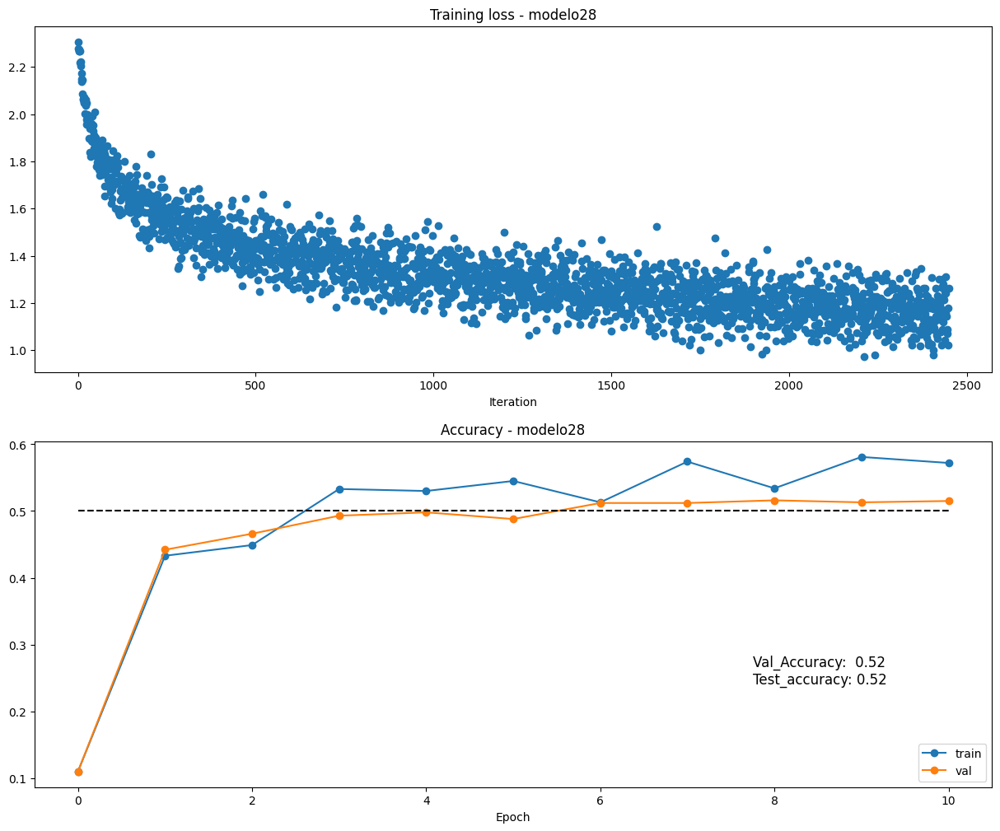


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo29 -------- best_val_acc: 0.536 -------- best_test_acc: 0.534
 

 Best Model: {'test_accuracy': 0.534, 'val_accuracy': 0.536, 'weight_scale': 0.04214740335949222, 'learning_rate': 0.043598503272527844, 'hidden_dims': [150, 150, 150, 150], 'update_rule': 'adam', 'batch_size': 750, 'batch_norm': True, 'dropout_p': 20, 'reg': 0.7595364503378728, 'Solver': <__main__.Solver object at 0x7b97c2d64fd0>} 



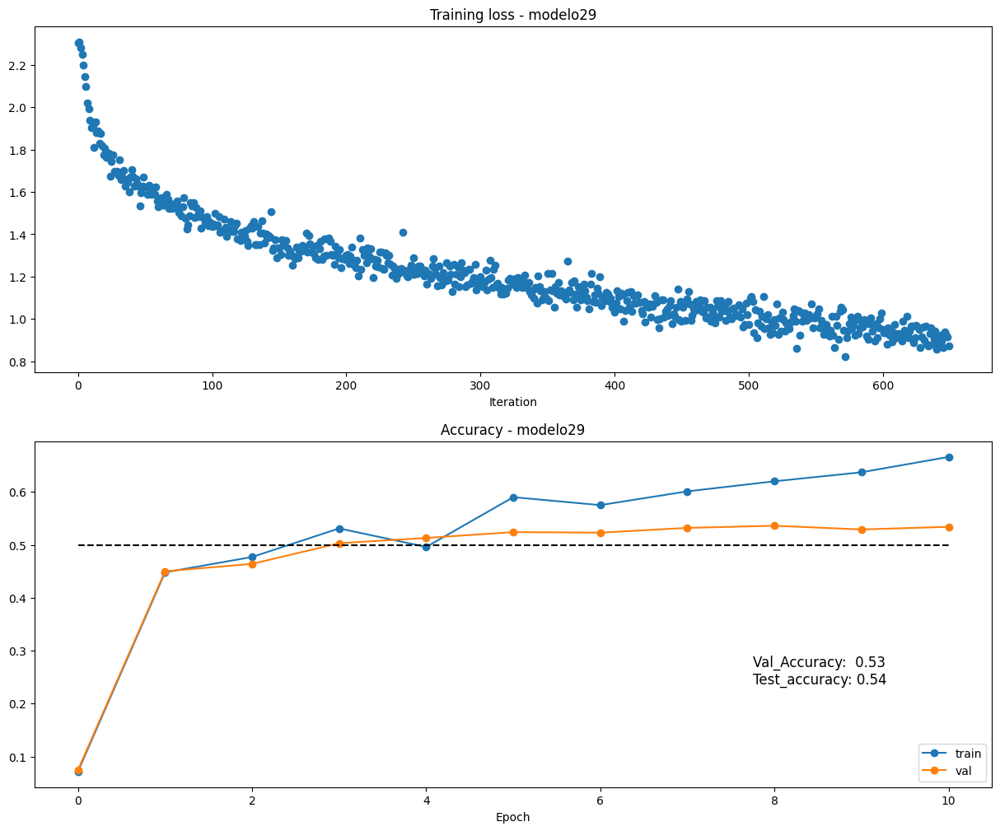


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo30 -------- best_val_acc: 0.512 -------- best_test_acc: 0.508
 

 Best Model: {'test_accuracy': 0.508, 'val_accuracy': 0.512, 'weight_scale': 0.0108416733613989, 'learning_rate': 0.03232240083457001, 'hidden_dims': [75, 75, 75, 75], 'update_rule': 'sgd_momentum', 'batch_size': 250, 'batch_norm': True, 'dropout_p': 10, 'reg': 0.5422048765839804, 'Solver': <__main__.Solver object at 0x7b978cda98a0>} 



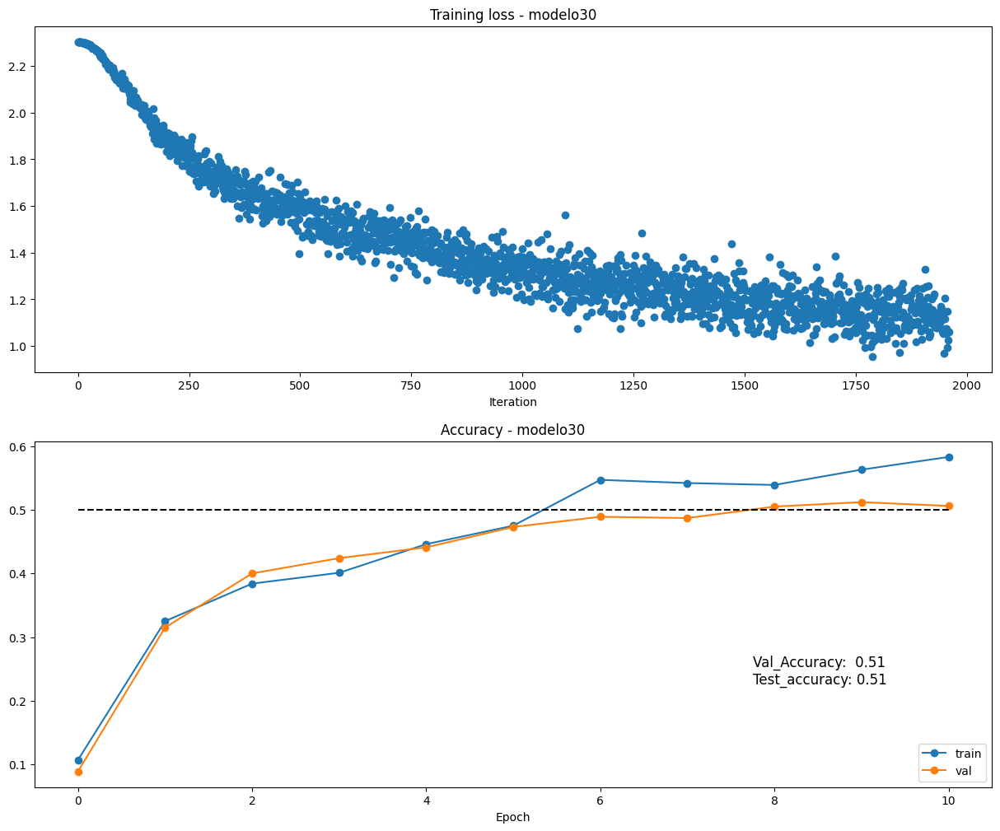


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo31 -------- best_val_acc: 0.528 -------- best_test_acc: 0.53
 

 Best Model: {'test_accuracy': 0.53, 'val_accuracy': 0.528, 'weight_scale': 0.01360487747058798, 'learning_rate': 0.07683475529927825, 'hidden_dims': [150, 150, 150, 150], 'update_rule': 'adam', 'batch_size': 750, 'batch_norm': True, 'dropout_p': 20, 'reg': 0.7788786743135876, 'Solver': <__main__.Solver object at 0x7b978ccdac20>} 



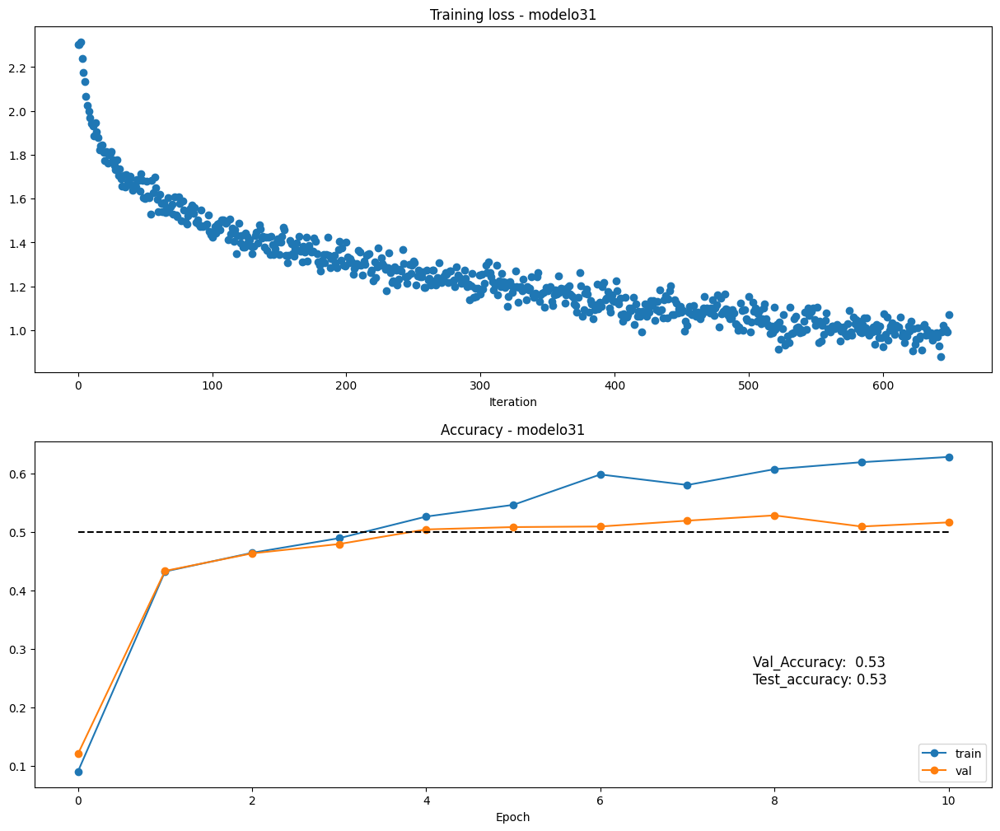


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo32 -------- best_val_acc: 0.541 -------- best_test_acc: 0.557
 

 Best Model: {'test_accuracy': 0.557, 'val_accuracy': 0.541, 'weight_scale': 0.040965188249530826, 'learning_rate': 0.04682587464591875, 'hidden_dims': [150, 150, 150, 150], 'update_rule': 'adam', 'batch_size': 750, 'batch_norm': True, 'dropout_p': 20, 'reg': 0.5502072057005123, 'Solver': <__main__.Solver object at 0x7b9786f309a0>} 



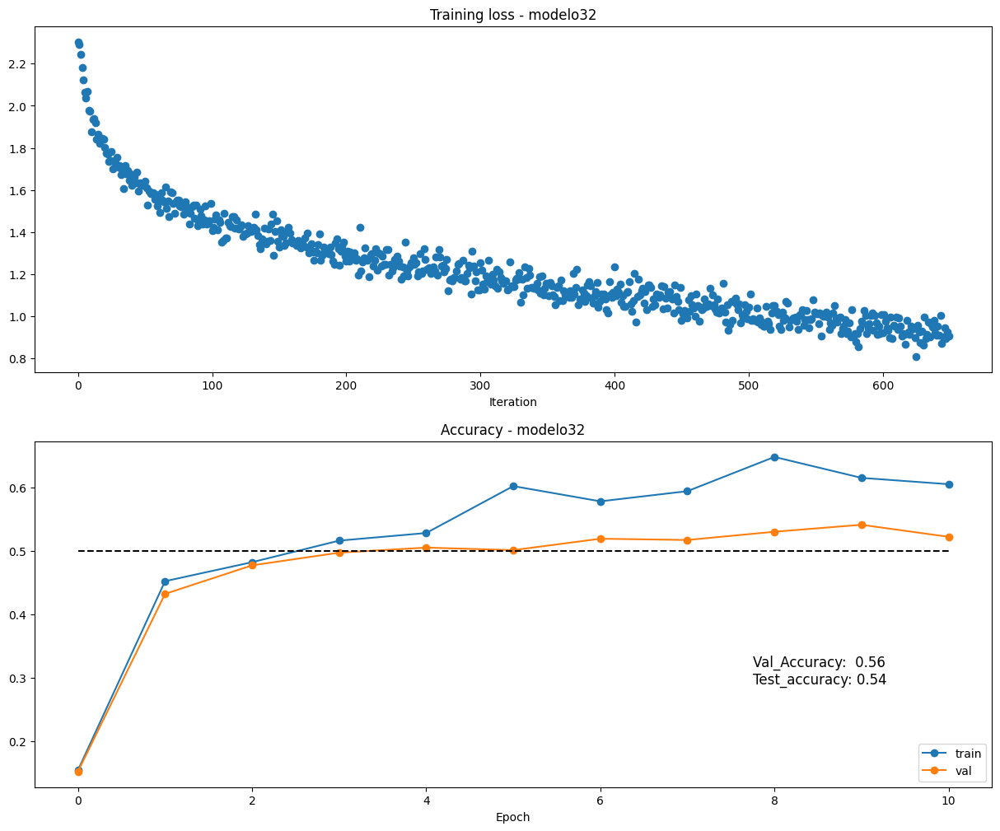


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo33 -------- best_val_acc: 0.497 -------- best_test_acc: 0.485
 

 Best Model: {'test_accuracy': 0.485, 'val_accuracy': 0.497, 'weight_scale': 0.021528572556942023, 'learning_rate': 0.06583717595003855, 'hidden_dims': [100, 100, 100, 100], 'update_rule': 'rmsprop', 'batch_size': 500, 'batch_norm': True, 'dropout_p': 15, 'reg': 0.9953832780326697, 'Solver': <__main__.Solver object at 0x7b9786c25750>} 



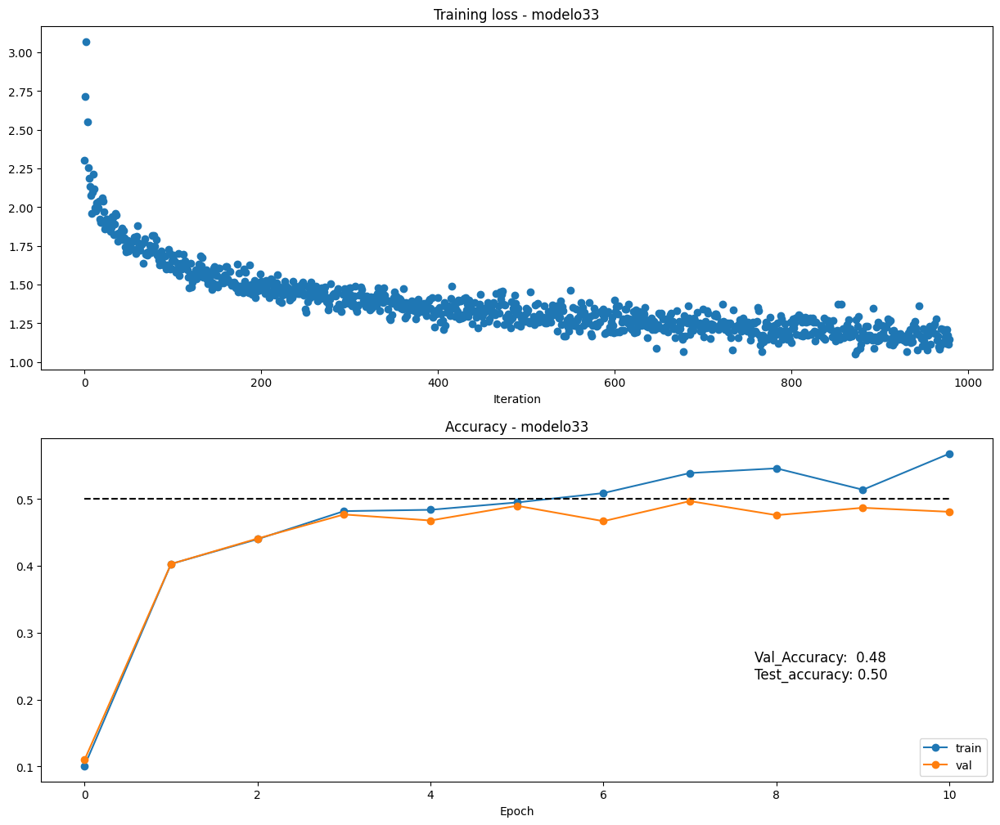


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo34 -------- best_val_acc: 0.505 -------- best_test_acc: 0.479
 

 Best Model: {'test_accuracy': 0.479, 'val_accuracy': 0.505, 'weight_scale': 0.04726163219758476, 'learning_rate': 0.08426455748291925, 'hidden_dims': [50, 50, 50, 50], 'update_rule': 'sgd', 'batch_size': 200, 'batch_norm': True, 'dropout_p': 0, 'reg': 0.6709041497336865, 'Solver': <__main__.Solver object at 0x7b978ce00f70>} 



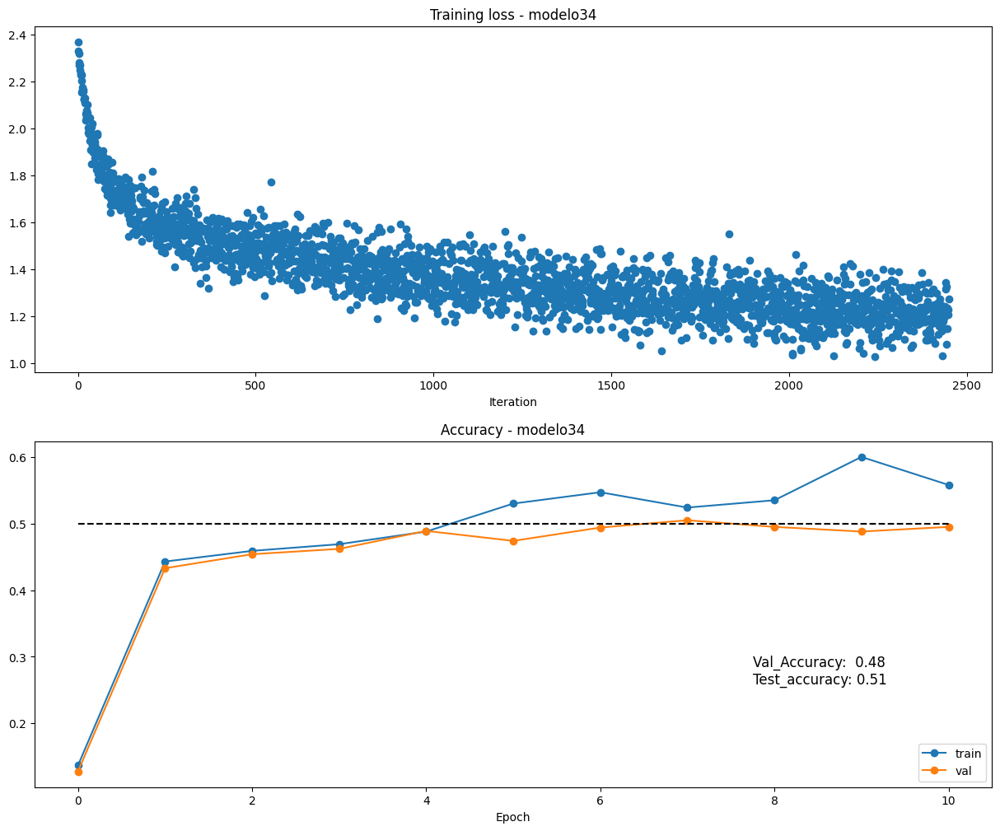


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo35 -------- best_val_acc: 0.509 -------- best_test_acc: 0.511
 

 Best Model: {'test_accuracy': 0.511, 'val_accuracy': 0.509, 'weight_scale': 0.02244450062244001, 'learning_rate': 0.0903029808540732, 'hidden_dims': [50, 50, 50, 50], 'update_rule': 'sgd', 'batch_size': 200, 'batch_norm': True, 'dropout_p': 0, 'reg': 0.7476560710401619, 'Solver': <__main__.Solver object at 0x7b9786e5c640>} 



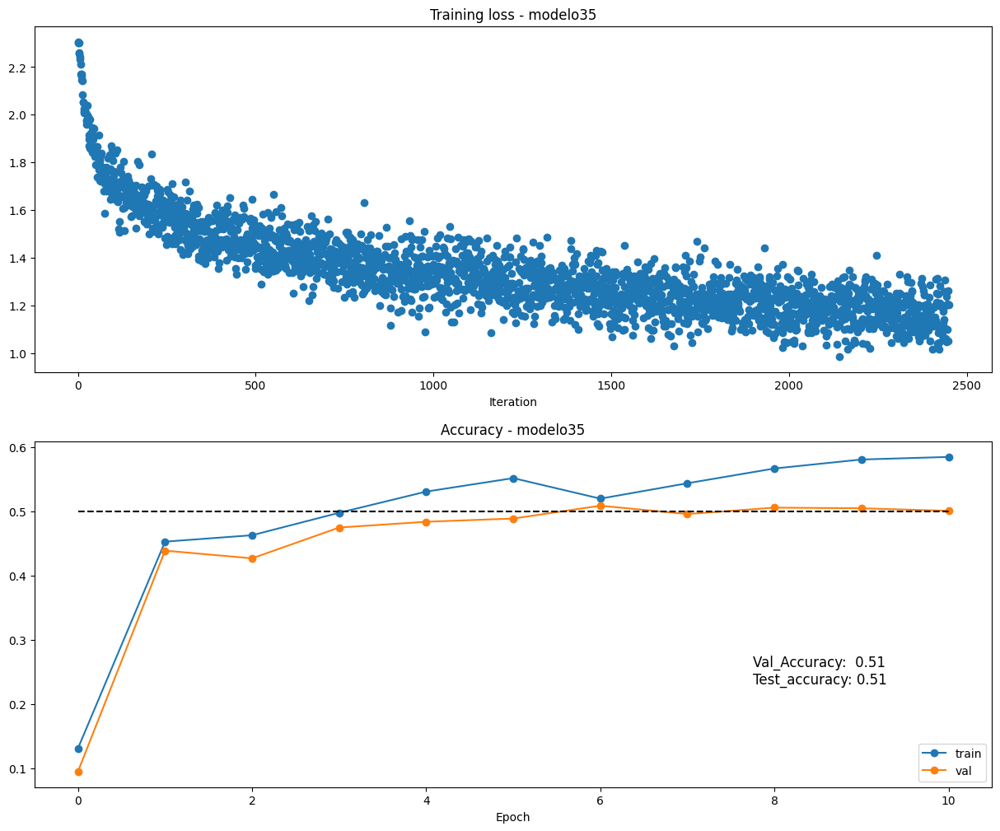


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo36 -------- best_val_acc: 0.54 -------- best_test_acc: 0.53
 

 Best Model: {'test_accuracy': 0.53, 'val_accuracy': 0.54, 'weight_scale': 0.018885690225026293, 'learning_rate': 0.09747360187997102, 'hidden_dims': [150, 150, 150, 150], 'update_rule': 'adam', 'batch_size': 750, 'batch_norm': True, 'dropout_p': 20, 'reg': 0.6232947313177688, 'Solver': <__main__.Solver object at 0x7b978677b220>} 



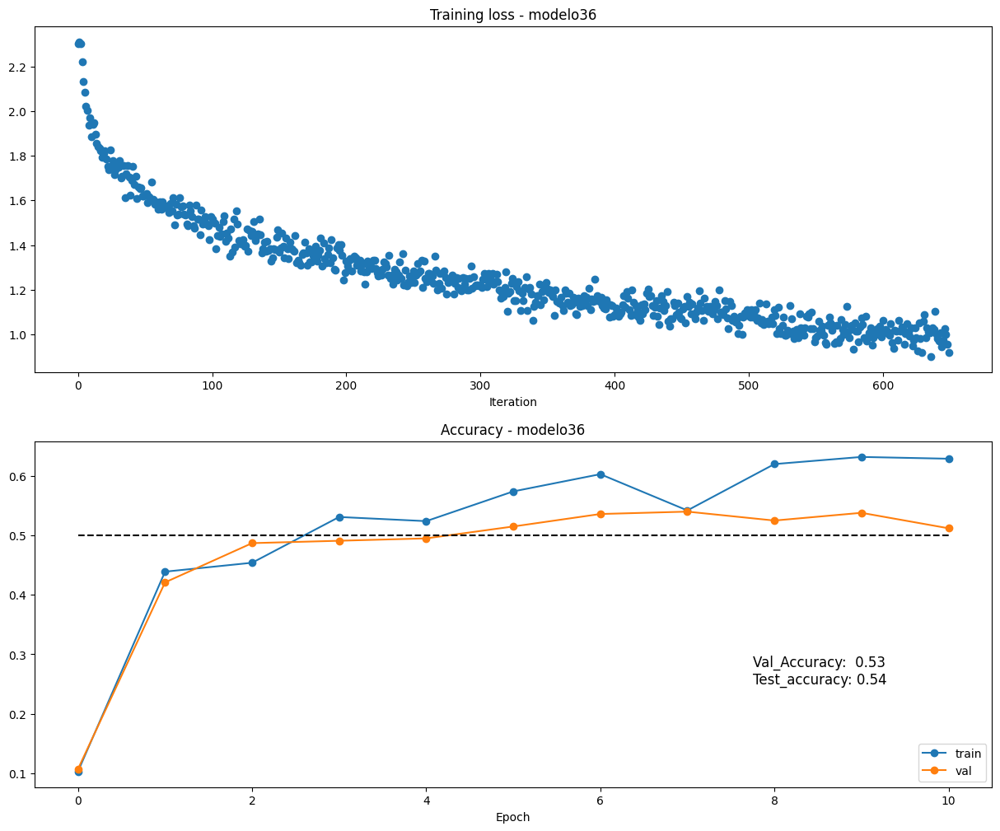


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo37 -------- best_val_acc: 0.518 -------- best_test_acc: 0.513
 

 Best Model: {'test_accuracy': 0.513, 'val_accuracy': 0.518, 'weight_scale': 0.03454337400892387, 'learning_rate': 0.036137821183649124, 'hidden_dims': [75, 75, 75, 75], 'update_rule': 'sgd_momentum', 'batch_size': 250, 'batch_norm': True, 'dropout_p': 10, 'reg': 0.6818161778462842, 'Solver': <__main__.Solver object at 0x7b97867330a0>} 



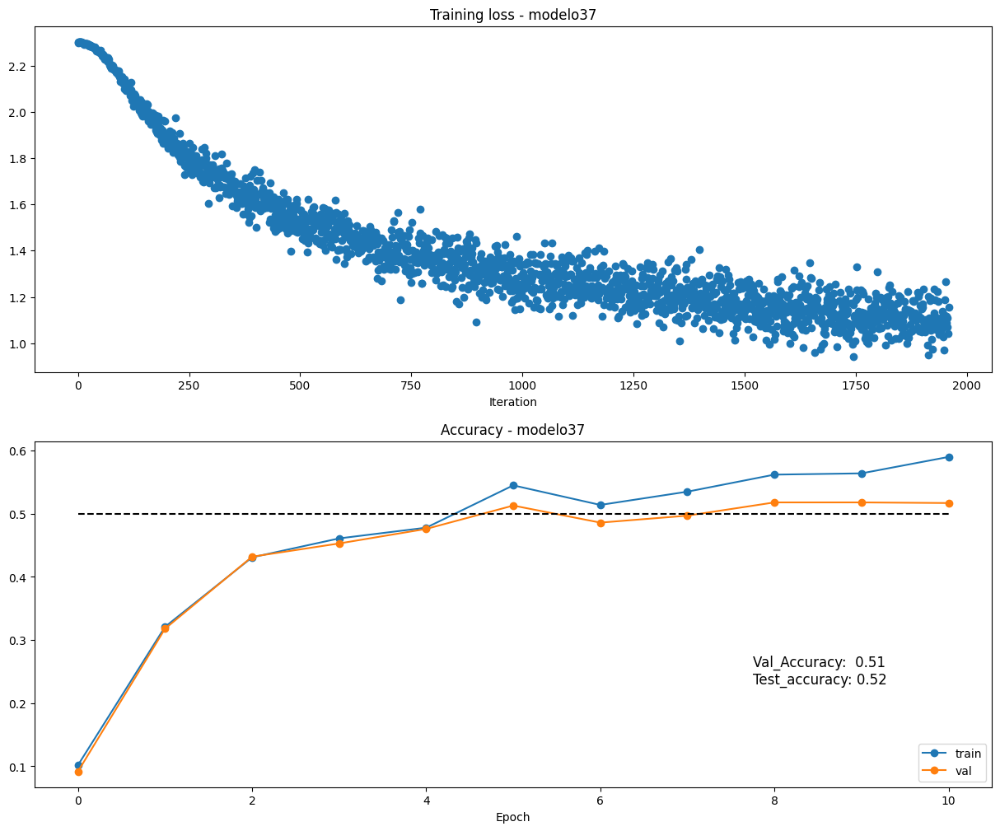


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo38 -------- best_val_acc: 0.531 -------- best_test_acc: 0.534
 

 Best Model: {'test_accuracy': 0.534, 'val_accuracy': 0.531, 'weight_scale': 0.024326158696881525, 'learning_rate': 0.016556795487815426, 'hidden_dims': [100, 100, 100, 100], 'update_rule': 'rmsprop', 'batch_size': 500, 'batch_norm': True, 'dropout_p': 15, 'reg': 0.6080365331805488, 'Solver': <__main__.Solver object at 0x7b978cd0d1b0>} 



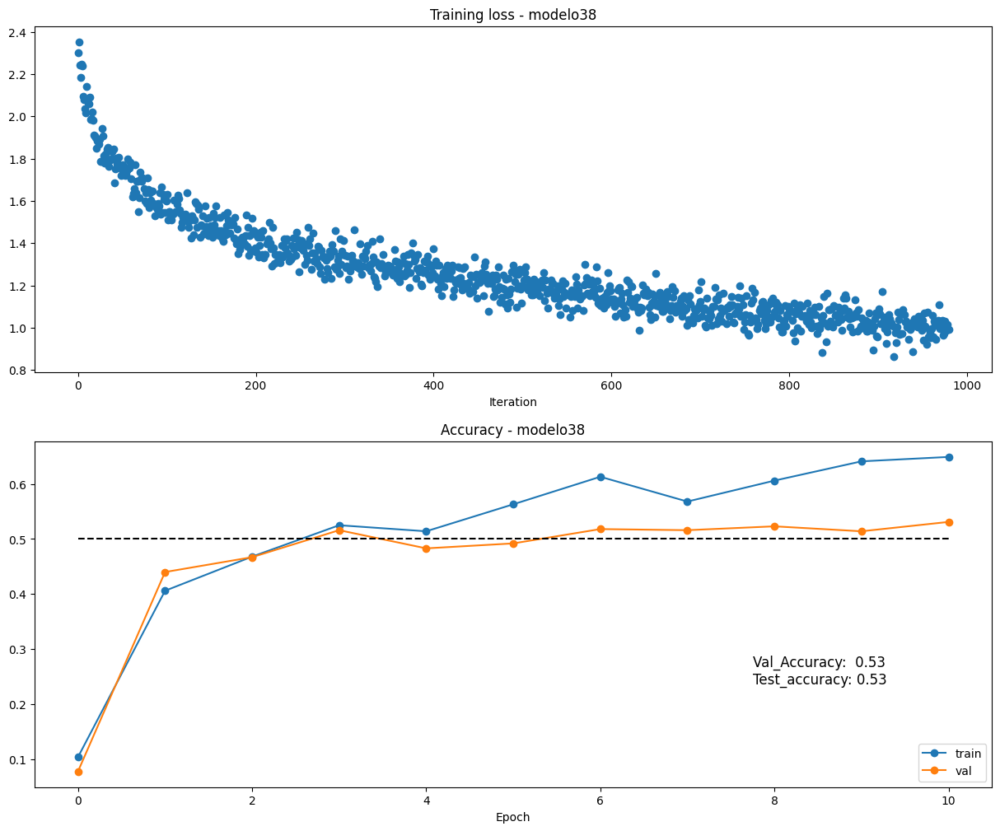


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo39 -------- best_val_acc: 0.497 -------- best_test_acc: 0.497
 

 Best Model: {'test_accuracy': 0.497, 'val_accuracy': 0.497, 'weight_scale': 0.03381537872169699, 'learning_rate': 0.01819835328051045, 'hidden_dims': [50, 50, 50, 50], 'update_rule': 'sgd', 'batch_size': 200, 'batch_norm': True, 'dropout_p': 0, 'reg': 0.8831987317275014, 'Solver': <__main__.Solver object at 0x7b978c27e500>} 



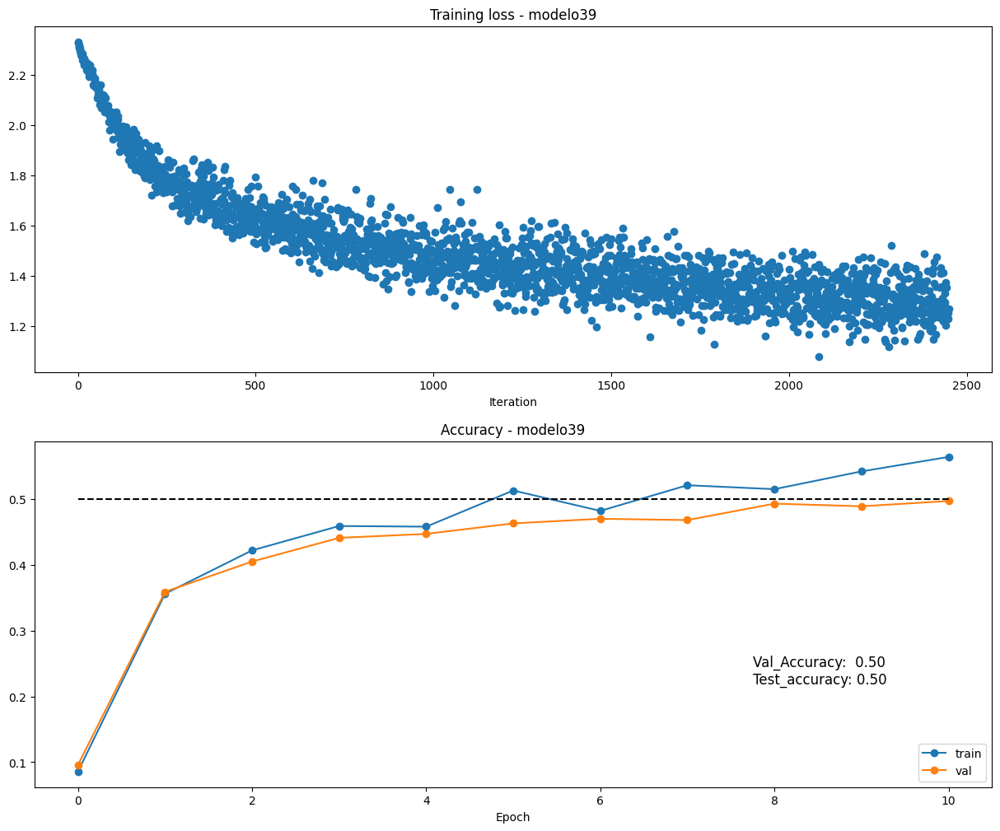


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo40 -------- best_val_acc: 0.514 -------- best_test_acc: 0.501
 

 Best Model: {'test_accuracy': 0.501, 'val_accuracy': 0.514, 'weight_scale': 0.04665334944290004, 'learning_rate': 0.09936795925401316, 'hidden_dims': [50, 50, 50, 50], 'update_rule': 'sgd', 'batch_size': 200, 'batch_norm': True, 'dropout_p': 0, 'reg': 0.9406090762454589, 'Solver': <__main__.Solver object at 0x7b9786f72530>} 



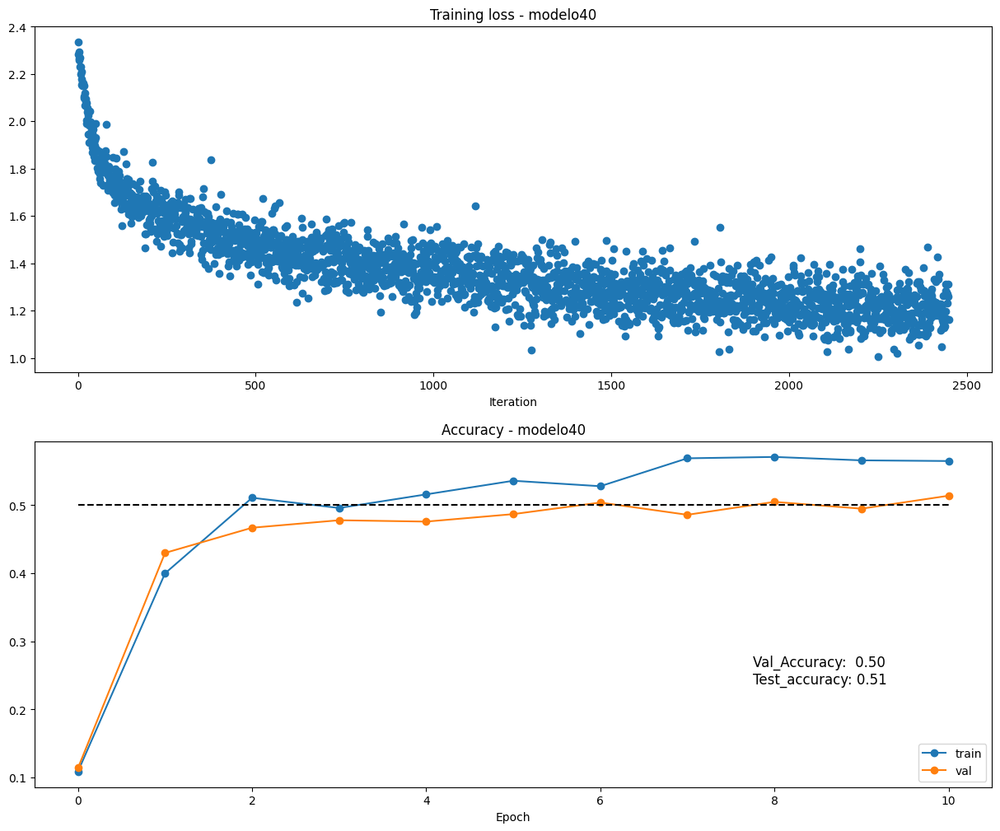


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo41 -------- best_val_acc: 0.49 -------- best_test_acc: 0.476
 

 Best Model: {'test_accuracy': 0.476, 'val_accuracy': 0.49, 'weight_scale': 0.04898353086727591, 'learning_rate': 0.04336799498185472, 'hidden_dims': [50, 50, 50, 50], 'update_rule': 'sgd', 'batch_size': 200, 'batch_norm': True, 'dropout_p': 0, 'reg': 0.9298770802557541, 'Solver': <__main__.Solver object at 0x7b9786edbdf0>} 



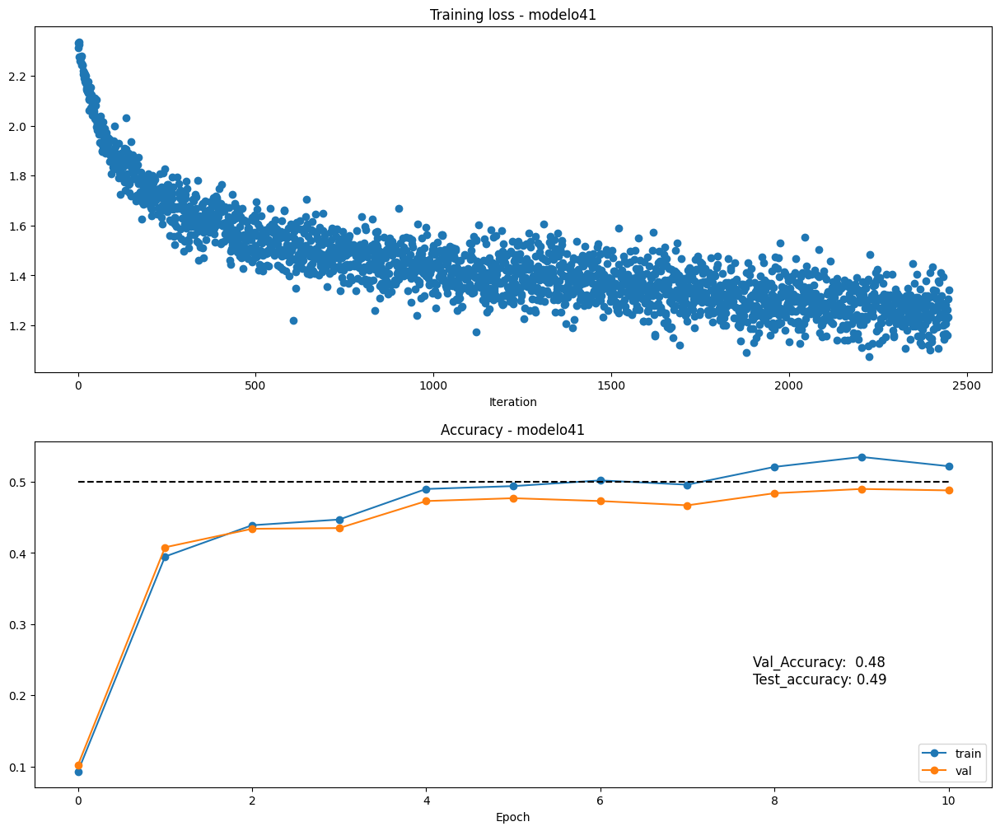


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo42 -------- best_val_acc: 0.521 -------- best_test_acc: 0.513
 

 Best Model: {'test_accuracy': 0.513, 'val_accuracy': 0.521, 'weight_scale': 0.035822410380735775, 'learning_rate': 0.09080196155060322, 'hidden_dims': [50, 50, 50, 50], 'update_rule': 'sgd', 'batch_size': 200, 'batch_norm': True, 'dropout_p': 0, 'reg': 0.6477105213086805, 'Solver': <__main__.Solver object at 0x7b978c3df4f0>} 



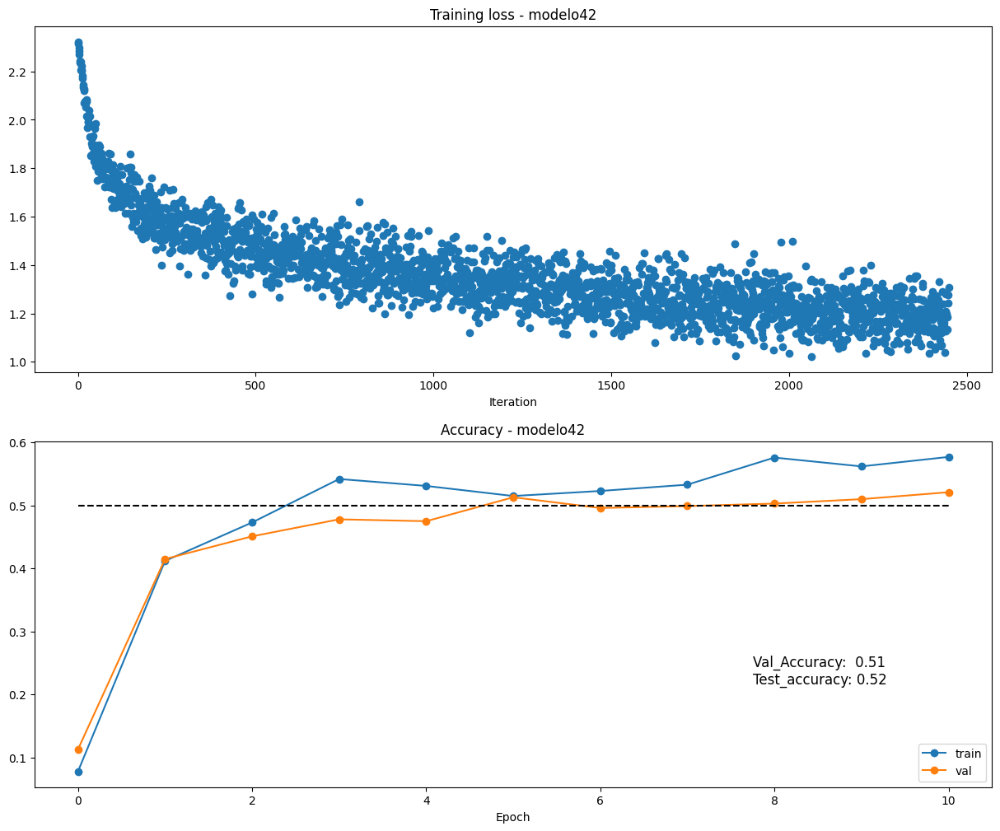


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo43 -------- best_val_acc: 0.507 -------- best_test_acc: 0.501
 

 Best Model: {'test_accuracy': 0.501, 'val_accuracy': 0.507, 'weight_scale': 0.03991014898135599, 'learning_rate': 0.027434752011729138, 'hidden_dims': [50, 50, 50, 50], 'update_rule': 'sgd', 'batch_size': 200, 'batch_norm': True, 'dropout_p': 0, 'reg': 0.7201655657034856, 'Solver': <__main__.Solver object at 0x7b9786c277c0>} 



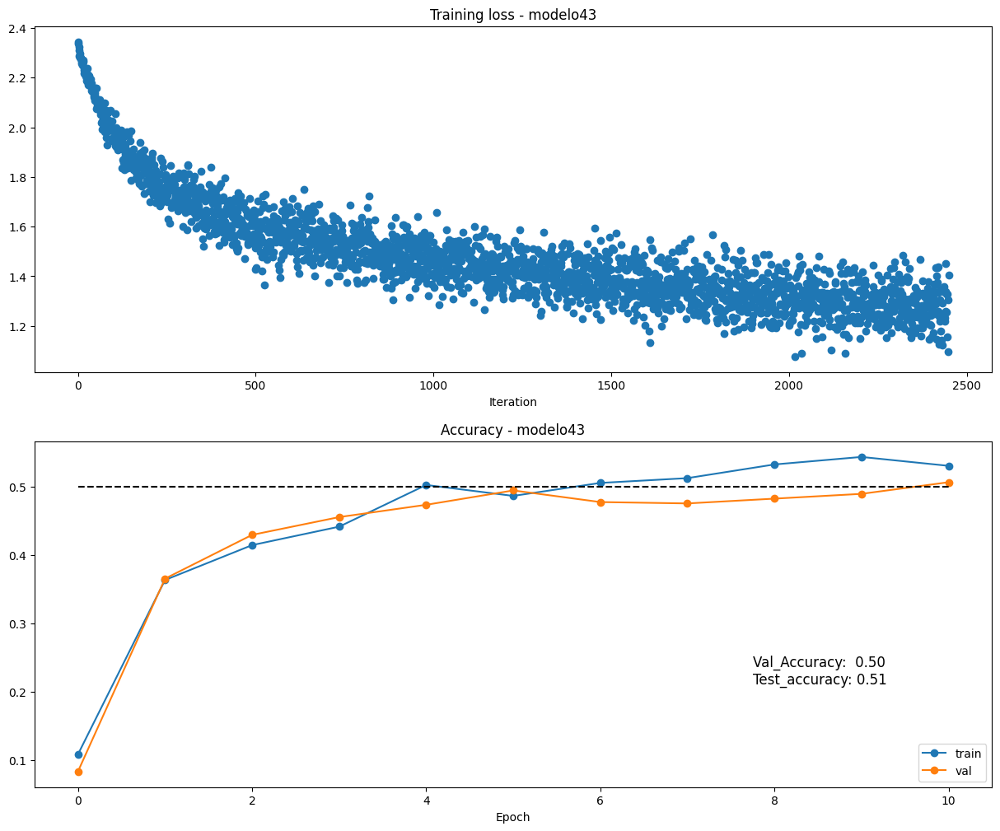


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo44 -------- best_val_acc: 0.503 -------- best_test_acc: 0.501
 

 Best Model: {'test_accuracy': 0.501, 'val_accuracy': 0.503, 'weight_scale': 0.03730923076161671, 'learning_rate': 0.07000037842422673, 'hidden_dims': [100, 100, 100, 100], 'update_rule': 'rmsprop', 'batch_size': 500, 'batch_norm': True, 'dropout_p': 15, 'reg': 0.7167111199515753, 'Solver': <__main__.Solver object at 0x7b9786a857e0>} 



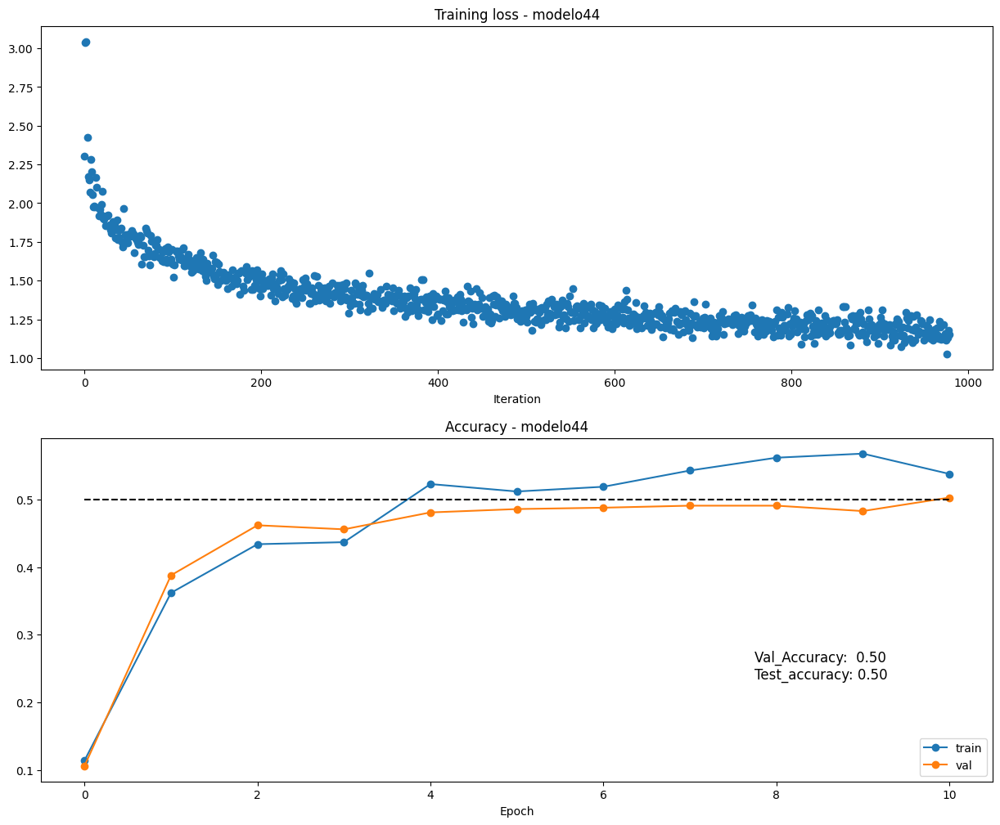


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo45 -------- best_val_acc: 0.509 -------- best_test_acc: 0.493
 

 Best Model: {'test_accuracy': 0.493, 'val_accuracy': 0.509, 'weight_scale': 0.040546752672974466, 'learning_rate': 0.0760970968690374, 'hidden_dims': [100, 100, 100, 100], 'update_rule': 'rmsprop', 'batch_size': 500, 'batch_norm': True, 'dropout_p': 15, 'reg': 0.5823446371943841, 'Solver': <__main__.Solver object at 0x7b9786b062f0>} 



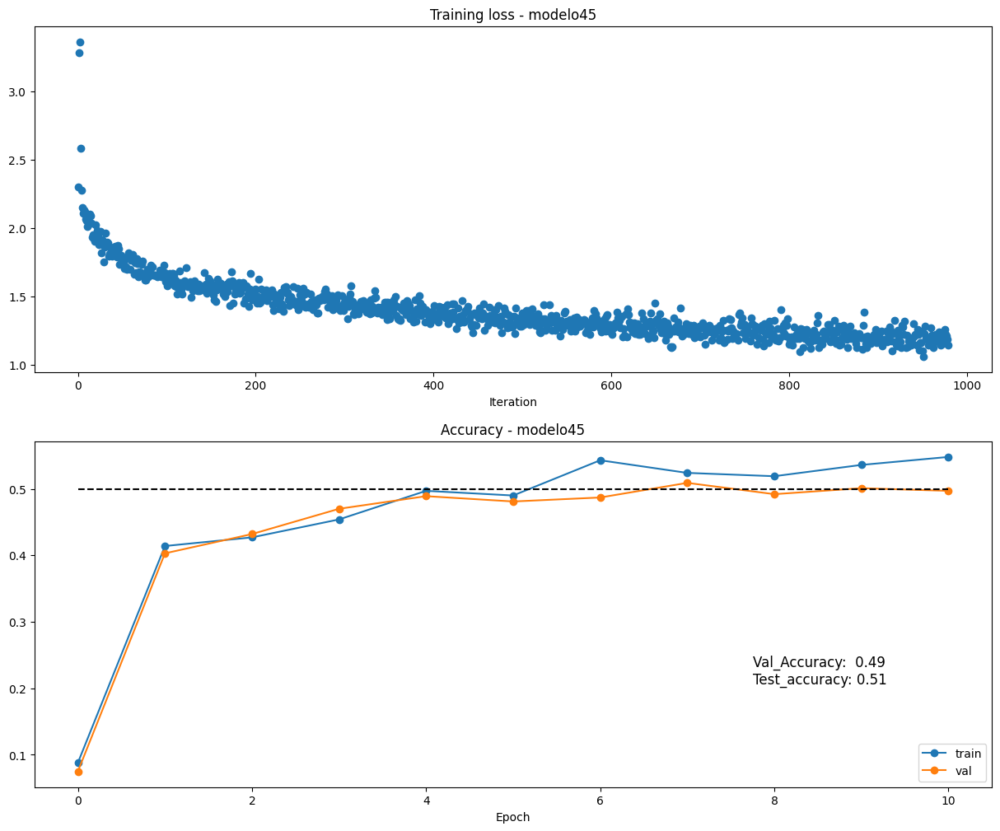


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo46 -------- best_val_acc: 0.506 -------- best_test_acc: 0.496
 

 Best Model: {'test_accuracy': 0.496, 'val_accuracy': 0.506, 'weight_scale': 0.013252868130789209, 'learning_rate': 0.02342263318071454, 'hidden_dims': [75, 75, 75, 75], 'update_rule': 'sgd_momentum', 'batch_size': 250, 'batch_norm': True, 'dropout_p': 10, 'reg': 0.5424762349573268, 'Solver': <__main__.Solver object at 0x7b978c2297b0>} 



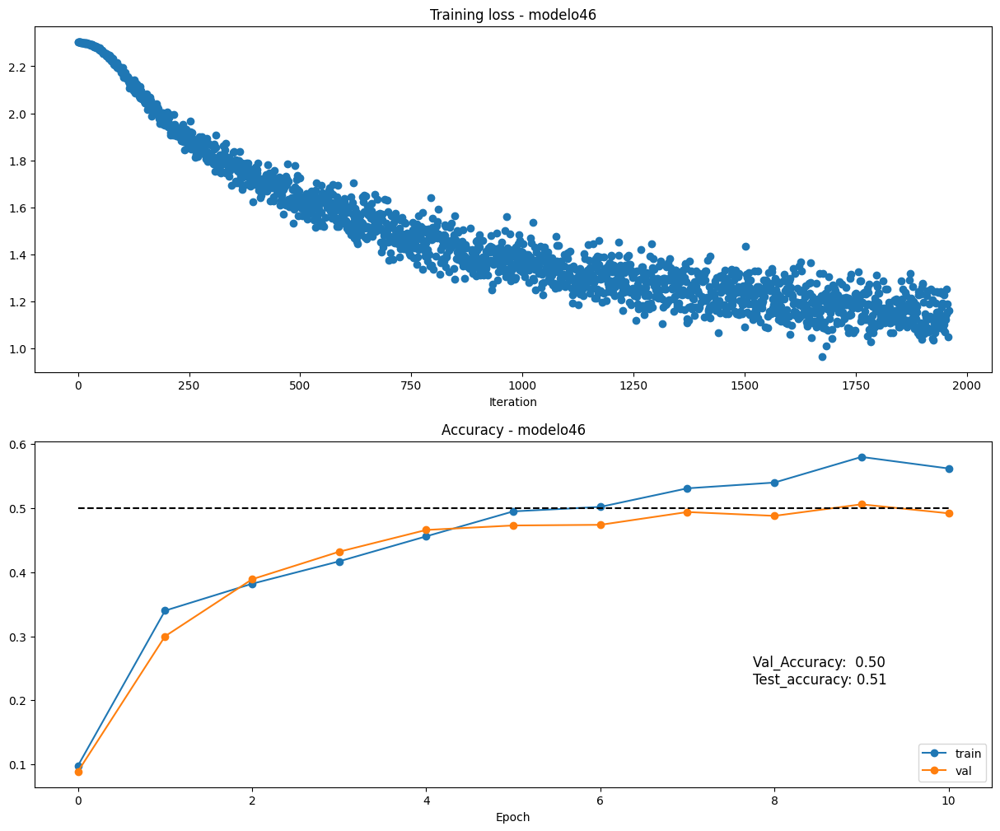


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo47 -------- best_val_acc: 0.531 -------- best_test_acc: 0.52
 

 Best Model: {'test_accuracy': 0.52, 'val_accuracy': 0.531, 'weight_scale': 0.016075562565165482, 'learning_rate': 0.0715297872686131, 'hidden_dims': [150, 150, 150, 150], 'update_rule': 'adam', 'batch_size': 750, 'batch_norm': True, 'dropout_p': 20, 'reg': 0.7038340968974656, 'Solver': <__main__.Solver object at 0x7b978ce00d60>} 



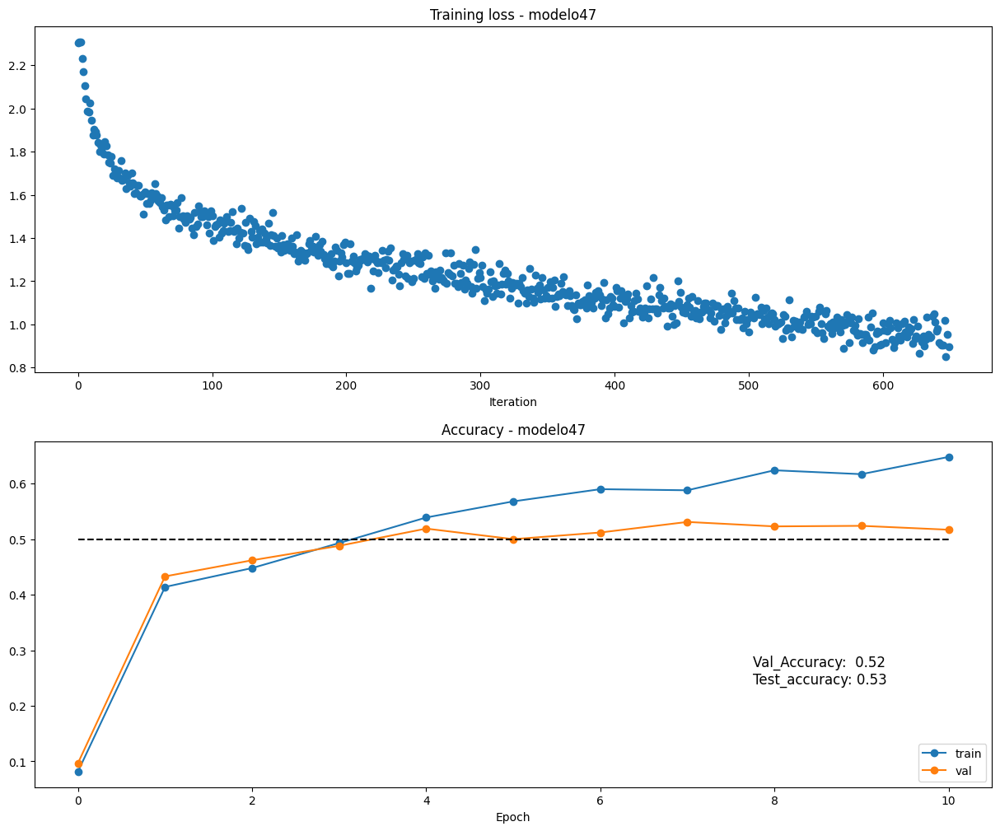


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo48 -------- best_val_acc: 0.501 -------- best_test_acc: 0.49
 

 Best Model: {'test_accuracy': 0.49, 'val_accuracy': 0.501, 'weight_scale': 0.014745403261896665, 'learning_rate': 0.010003918690629929, 'hidden_dims': [75, 75, 75, 75], 'update_rule': 'sgd_momentum', 'batch_size': 250, 'batch_norm': True, 'dropout_p': 10, 'reg': 0.7524476016791886, 'Solver': <__main__.Solver object at 0x7b978cf02f50>} 



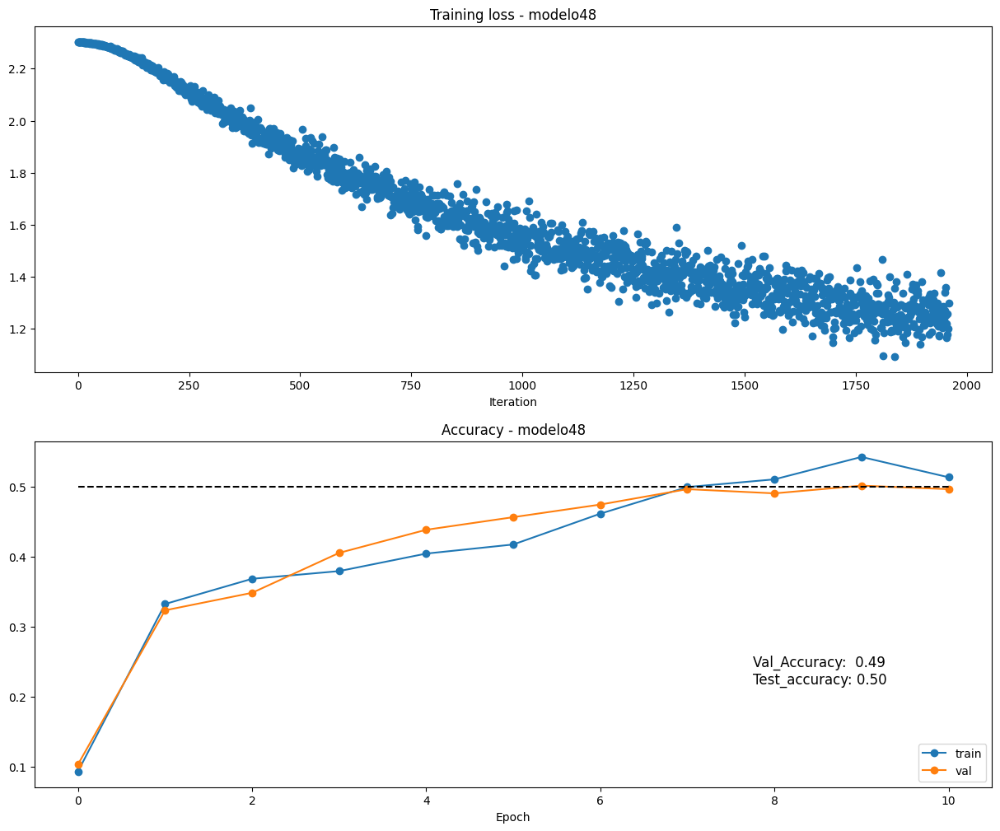


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo49 -------- best_val_acc: 0.523 -------- best_test_acc: 0.528
 

 Best Model: {'test_accuracy': 0.528, 'val_accuracy': 0.523, 'weight_scale': 0.04180854979333965, 'learning_rate': 0.09373349978962311, 'hidden_dims': [150, 150, 150, 150], 'update_rule': 'adam', 'batch_size': 750, 'batch_norm': True, 'dropout_p': 20, 'reg': 0.8628395278842711, 'Solver': <__main__.Solver object at 0x7b9786a9a200>} 



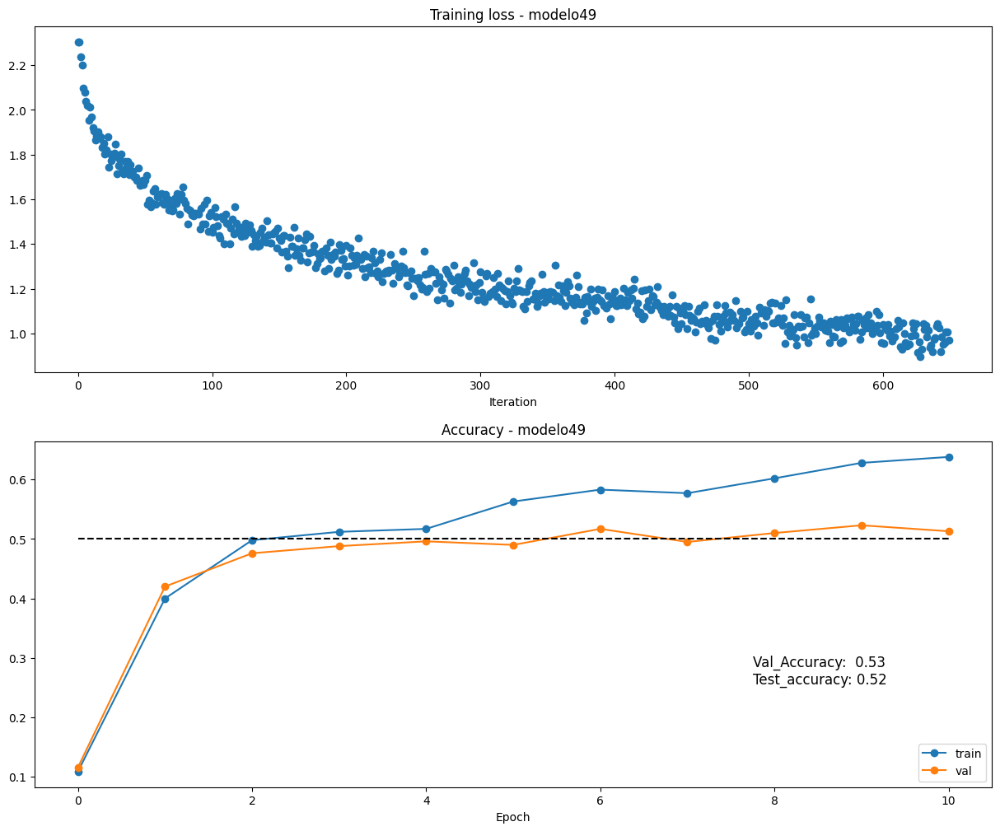


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo50 -------- best_val_acc: 0.495 -------- best_test_acc: 0.493
 

 Best Model: {'test_accuracy': 0.493, 'val_accuracy': 0.495, 'weight_scale': 0.011852256538920192, 'learning_rate': 0.08969454370375127, 'hidden_dims': [100, 100, 100, 100], 'update_rule': 'rmsprop', 'batch_size': 500, 'batch_norm': True, 'dropout_p': 15, 'reg': 0.8264409257570693, 'Solver': <__main__.Solver object at 0x7b978cd68700>} 



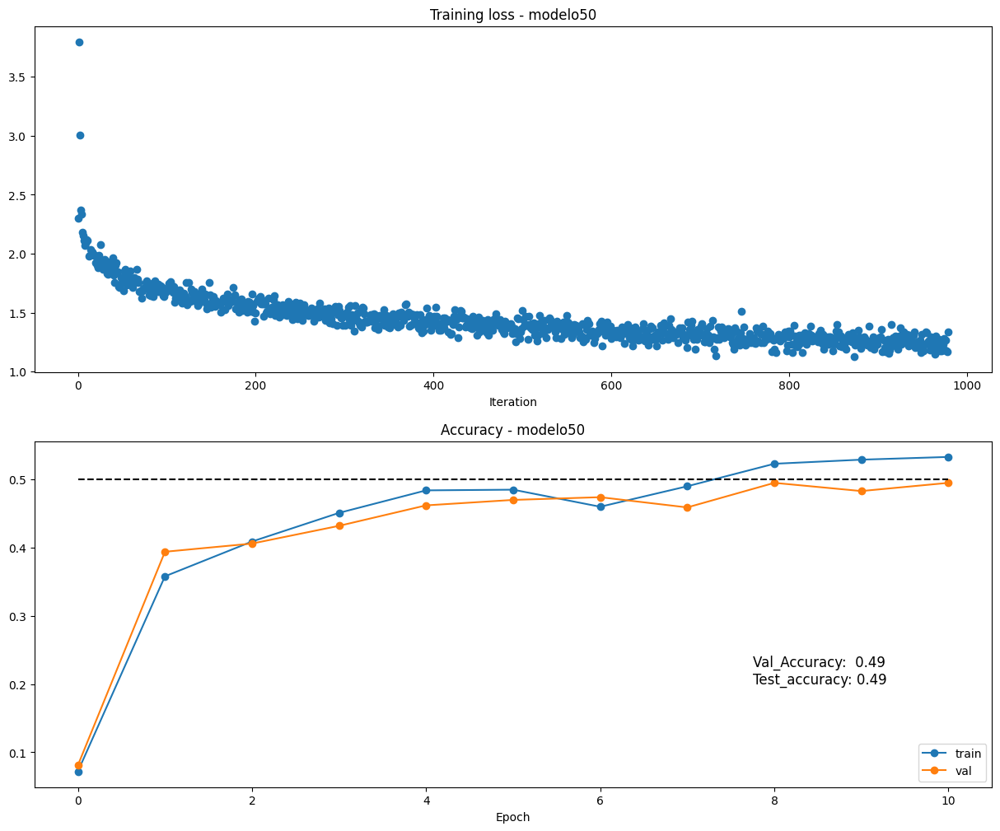


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo51 -------- best_val_acc: 0.516 -------- best_test_acc: 0.507
 

 Best Model: {'test_accuracy': 0.507, 'val_accuracy': 0.516, 'weight_scale': 0.015358754006937553, 'learning_rate': 0.03912040572893497, 'hidden_dims': [50, 50, 50, 50], 'update_rule': 'sgd', 'batch_size': 200, 'batch_norm': True, 'dropout_p': 0, 'reg': 0.6893080021247828, 'Solver': <__main__.Solver object at 0x7b978ce813c0>} 



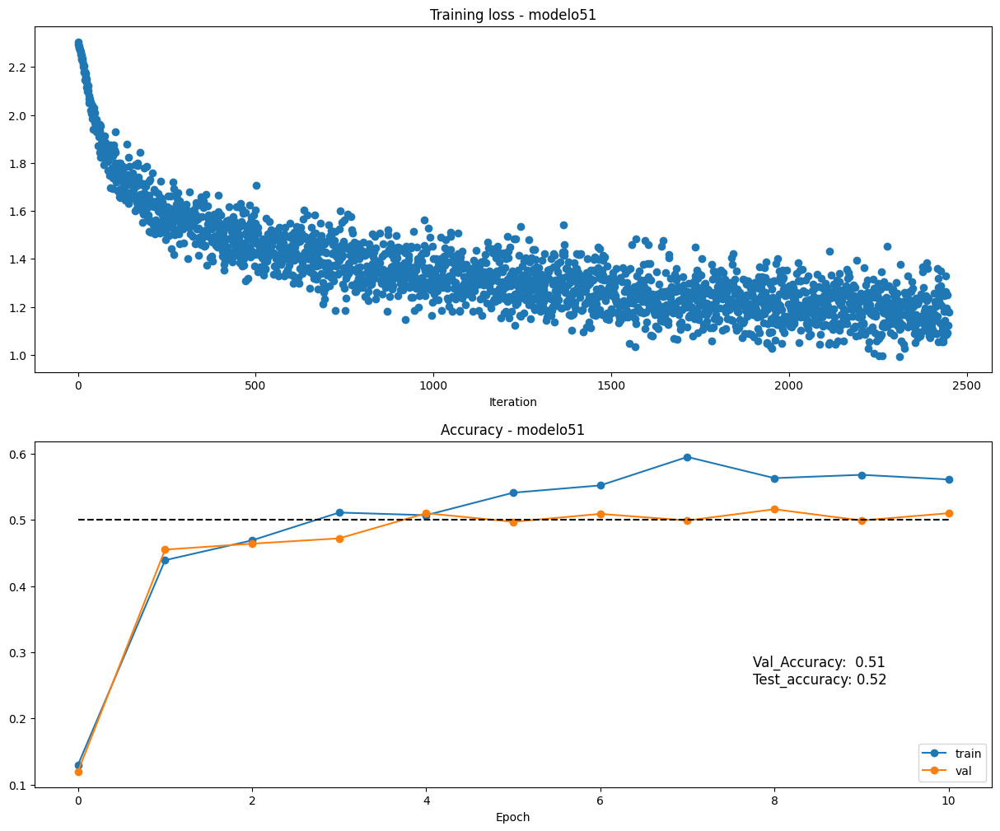


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo52 -------- best_val_acc: 0.514 -------- best_test_acc: 0.527
 

 Best Model: {'test_accuracy': 0.527, 'val_accuracy': 0.514, 'weight_scale': 0.02719909145187341, 'learning_rate': 0.04258959162693434, 'hidden_dims': [50, 50, 50, 50], 'update_rule': 'sgd', 'batch_size': 200, 'batch_norm': True, 'dropout_p': 0, 'reg': 0.7858823284674175, 'Solver': <__main__.Solver object at 0x7b9786fad0c0>} 



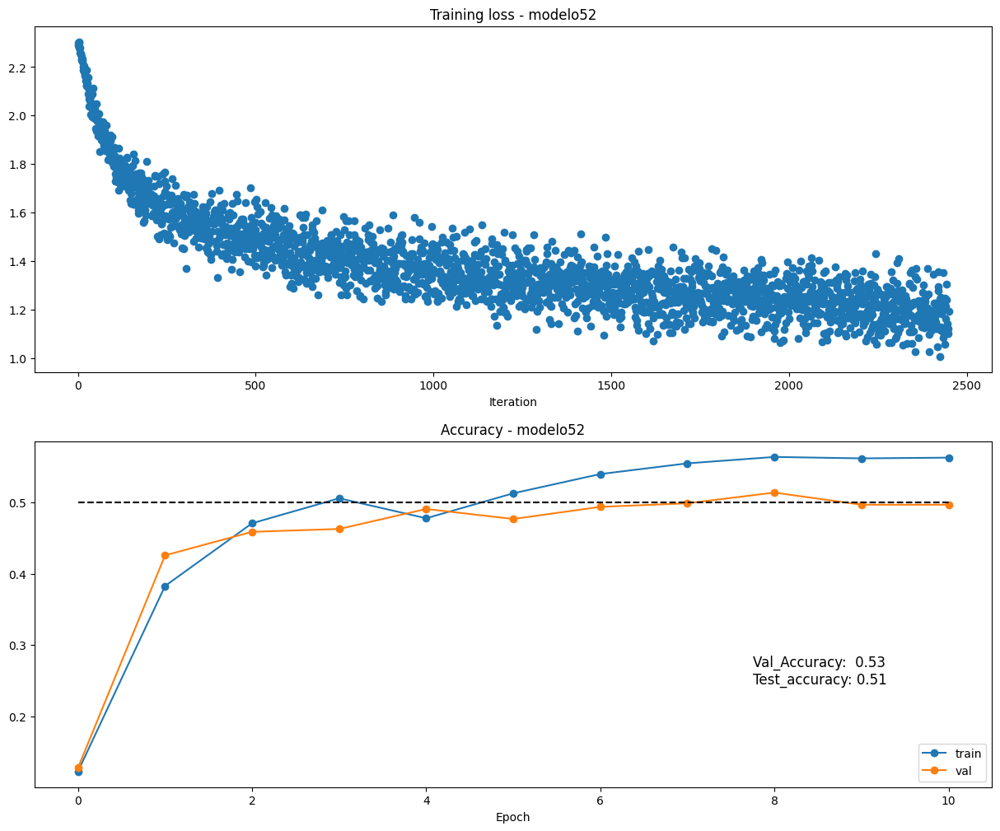


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo53 -------- best_val_acc: 0.527 -------- best_test_acc: 0.495
 

 Best Model: {'test_accuracy': 0.495, 'val_accuracy': 0.527, 'weight_scale': 0.03809125743827509, 'learning_rate': 0.04188158518354459, 'hidden_dims': [100, 100, 100, 100], 'update_rule': 'rmsprop', 'batch_size': 500, 'batch_norm': True, 'dropout_p': 15, 'reg': 0.6105696927114264, 'Solver': <__main__.Solver object at 0x7b978c3dc040>} 



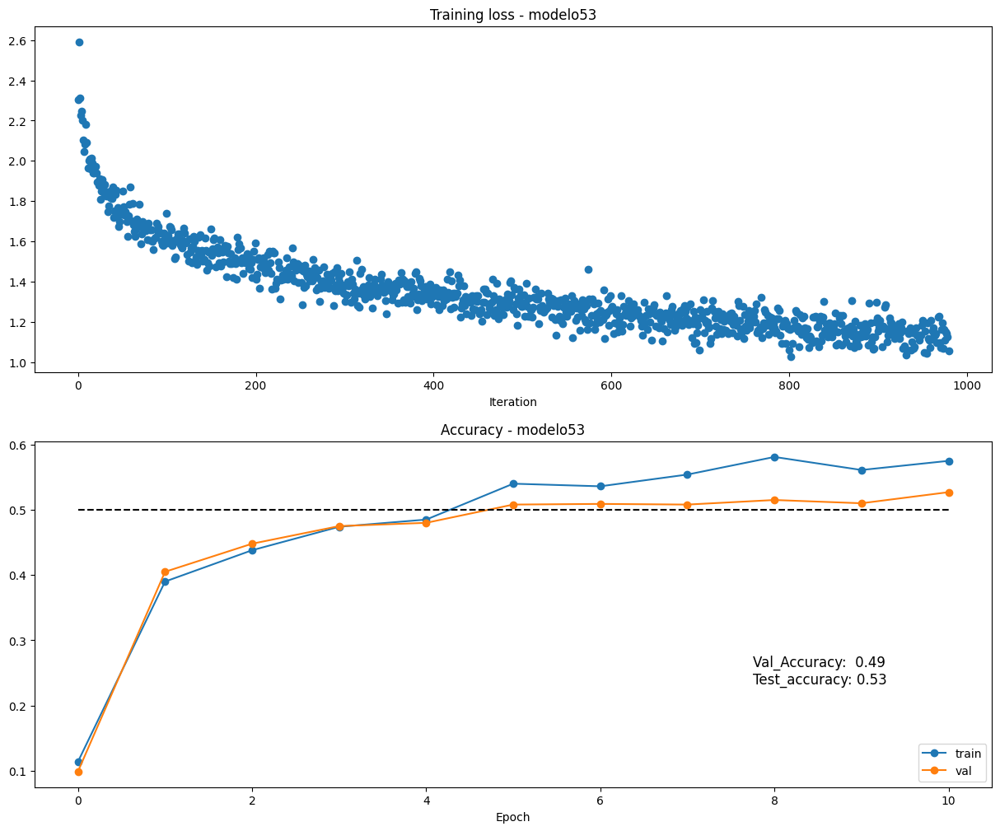


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo54 -------- best_val_acc: 0.548 -------- best_test_acc: 0.526
 

 Best Model: {'test_accuracy': 0.526, 'val_accuracy': 0.548, 'weight_scale': 0.018369845815434507, 'learning_rate': 0.010121051161781441, 'hidden_dims': [150, 150, 150, 150], 'update_rule': 'adam', 'batch_size': 750, 'batch_norm': True, 'dropout_p': 20, 'reg': 0.8262604079520657, 'Solver': <__main__.Solver object at 0x7b978c40dea0>} 



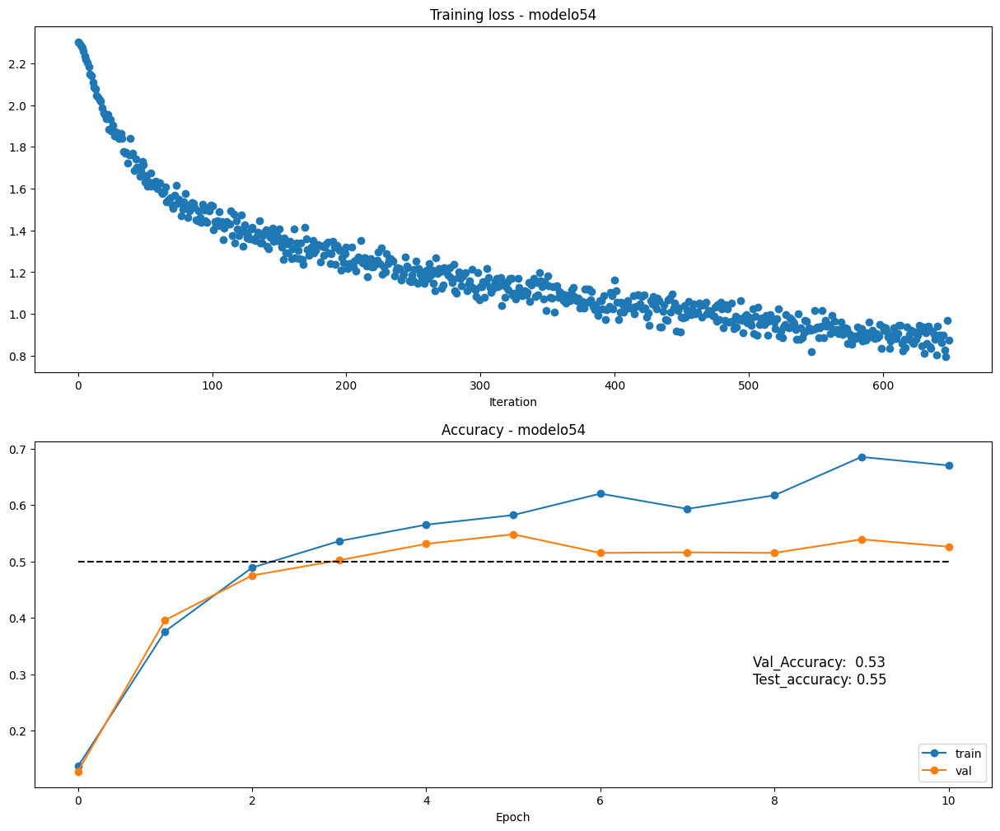


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo55 -------- best_val_acc: 0.535 -------- best_test_acc: 0.52
 

 Best Model: {'test_accuracy': 0.52, 'val_accuracy': 0.535, 'weight_scale': 0.042448630060952196, 'learning_rate': 0.09318419548486093, 'hidden_dims': [150, 150, 150, 150], 'update_rule': 'adam', 'batch_size': 750, 'batch_norm': True, 'dropout_p': 20, 'reg': 0.6157662349655586, 'Solver': <__main__.Solver object at 0x7b97865cbee0>} 



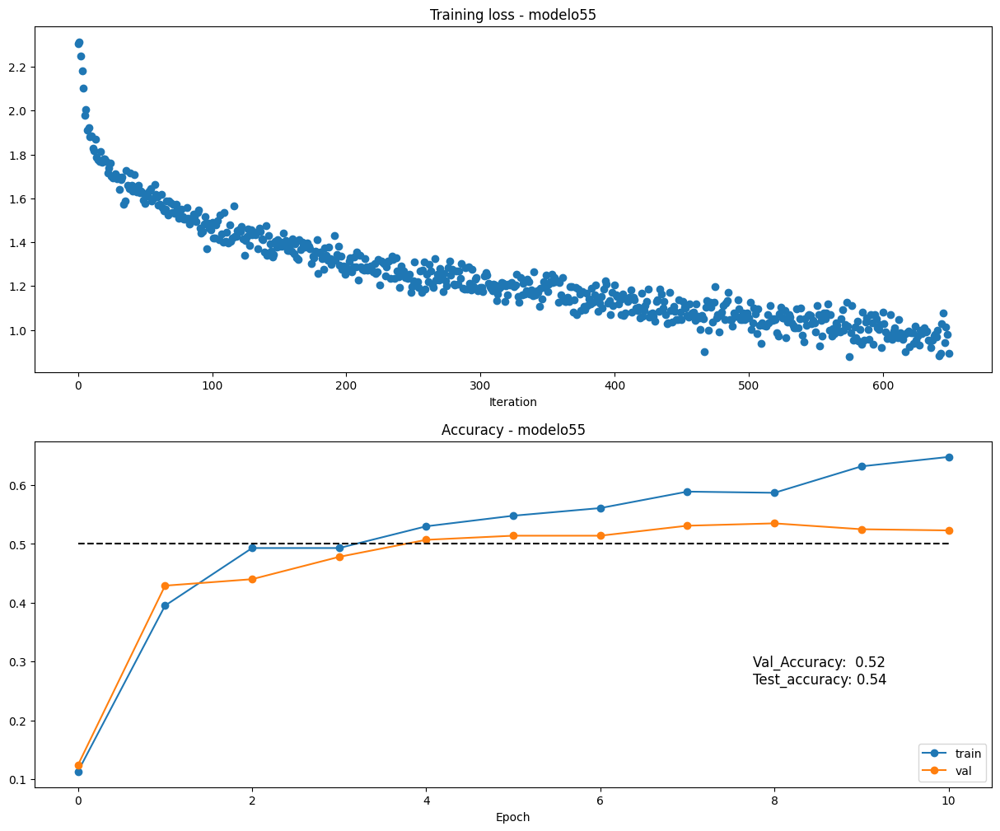


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo56 -------- best_val_acc: 0.515 -------- best_test_acc: 0.511
 

 Best Model: {'test_accuracy': 0.511, 'val_accuracy': 0.515, 'weight_scale': 0.02045884517978223, 'learning_rate': 0.08447609154617487, 'hidden_dims': [50, 50, 50, 50], 'update_rule': 'sgd', 'batch_size': 200, 'batch_norm': True, 'dropout_p': 0, 'reg': 0.9571598897521486, 'Solver': <__main__.Solver object at 0x7b978cec9030>} 



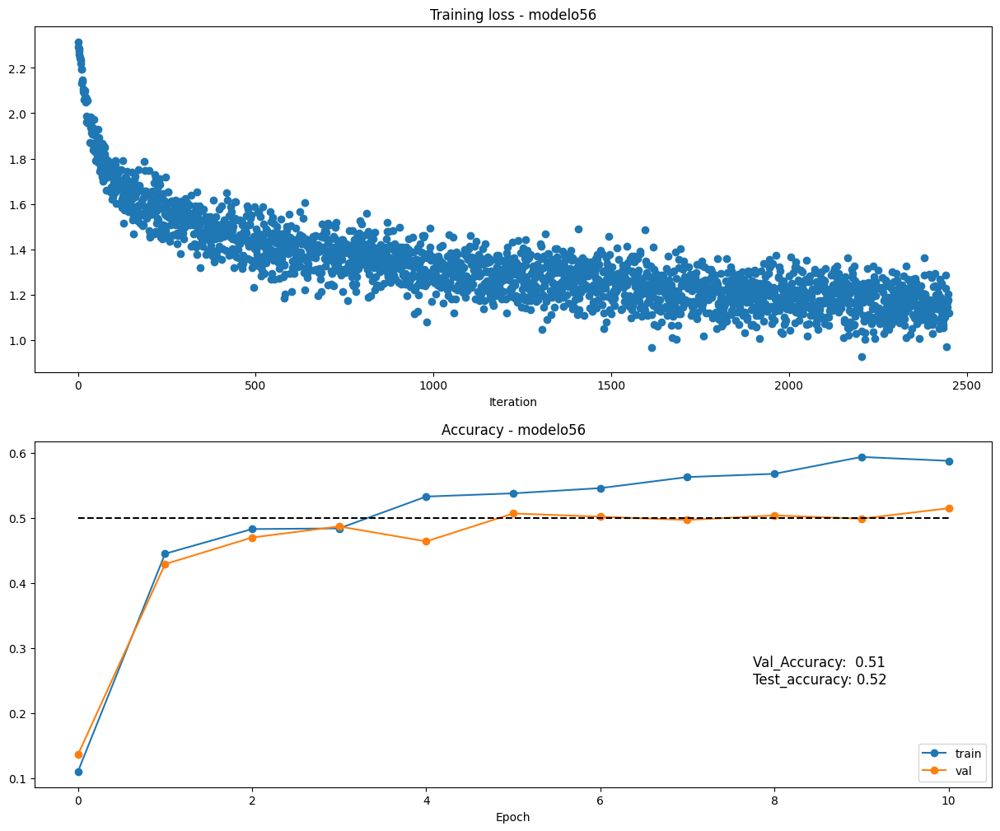


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo57 -------- best_val_acc: 0.528 -------- best_test_acc: 0.526
 

 Best Model: {'test_accuracy': 0.526, 'val_accuracy': 0.528, 'weight_scale': 0.03993092847204731, 'learning_rate': 0.018670878578494643, 'hidden_dims': [100, 100, 100, 100], 'update_rule': 'rmsprop', 'batch_size': 500, 'batch_norm': True, 'dropout_p': 15, 'reg': 0.928285494373932, 'Solver': <__main__.Solver object at 0x7b9786ac8b20>} 



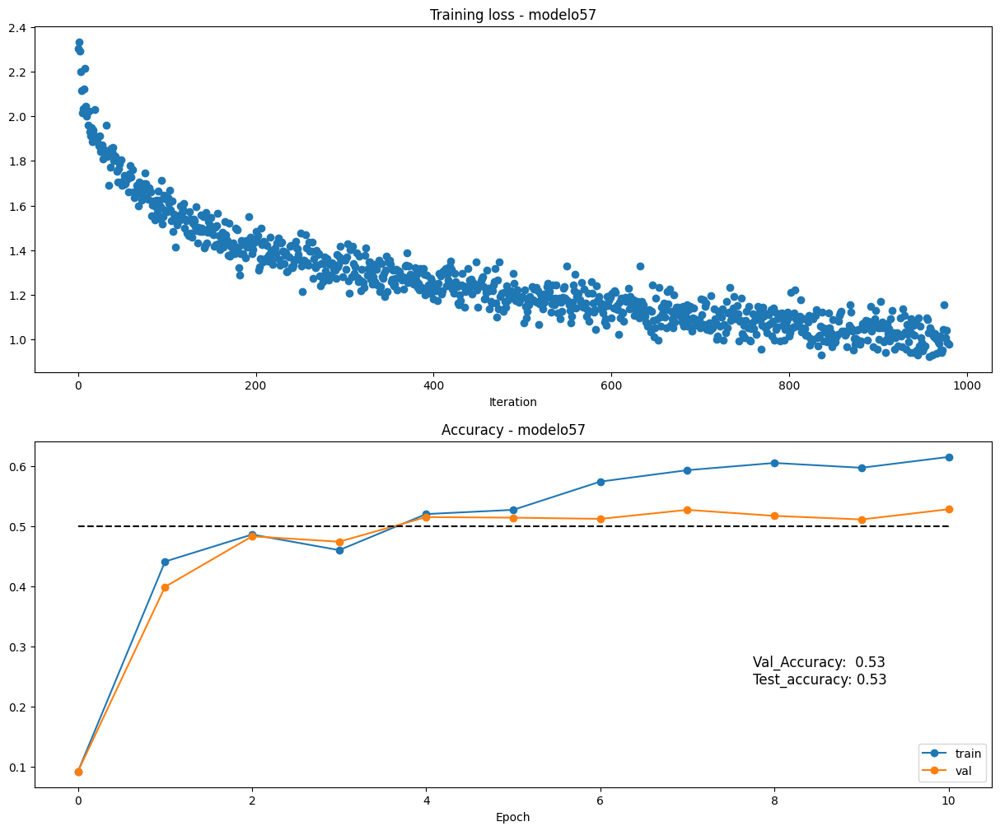


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo58 -------- best_val_acc: 0.528 -------- best_test_acc: 0.514
 

 Best Model: {'test_accuracy': 0.514, 'val_accuracy': 0.528, 'weight_scale': 0.04229466098650065, 'learning_rate': 0.028839795360429465, 'hidden_dims': [100, 100, 100, 100], 'update_rule': 'rmsprop', 'batch_size': 500, 'batch_norm': True, 'dropout_p': 15, 'reg': 0.5097694164365504, 'Solver': <__main__.Solver object at 0x7b978c36e410>} 



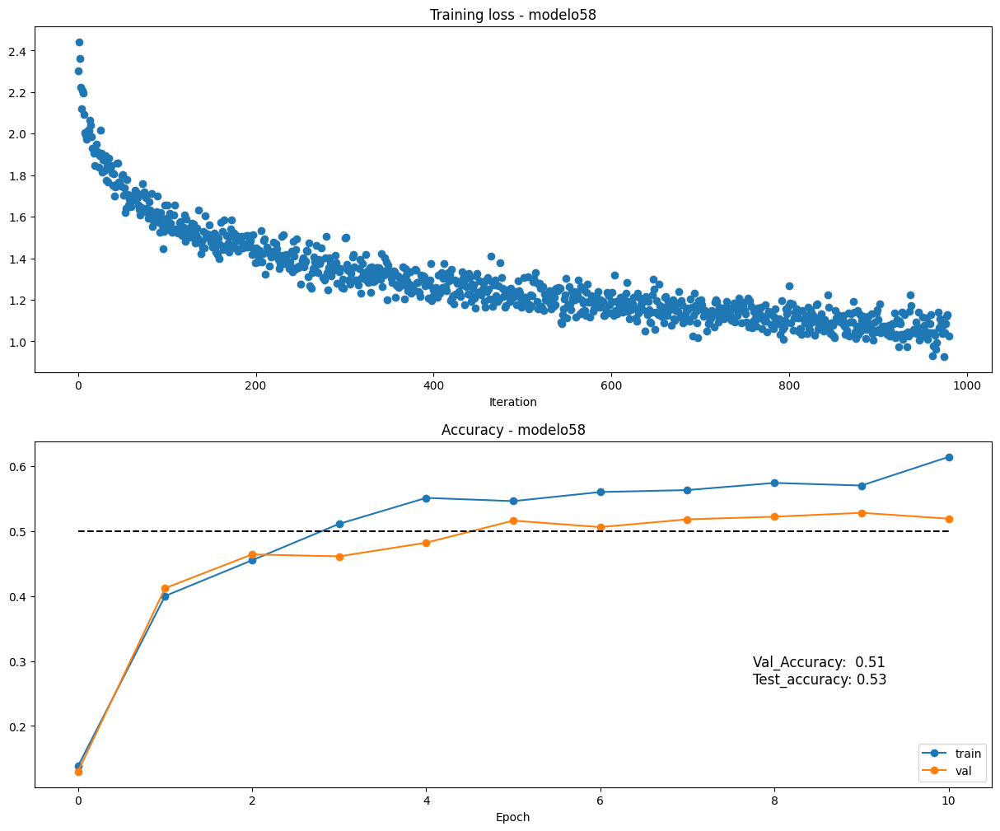


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo59 -------- best_val_acc: 0.545 -------- best_test_acc: 0.538
 

 Best Model: {'test_accuracy': 0.538, 'val_accuracy': 0.545, 'weight_scale': 0.03769542453855362, 'learning_rate': 0.04877553860152623, 'hidden_dims': [150, 150, 150, 150], 'update_rule': 'adam', 'batch_size': 750, 'batch_norm': True, 'dropout_p': 20, 'reg': 0.7177632046446744, 'Solver': <__main__.Solver object at 0x7b978cdaaad0>} 



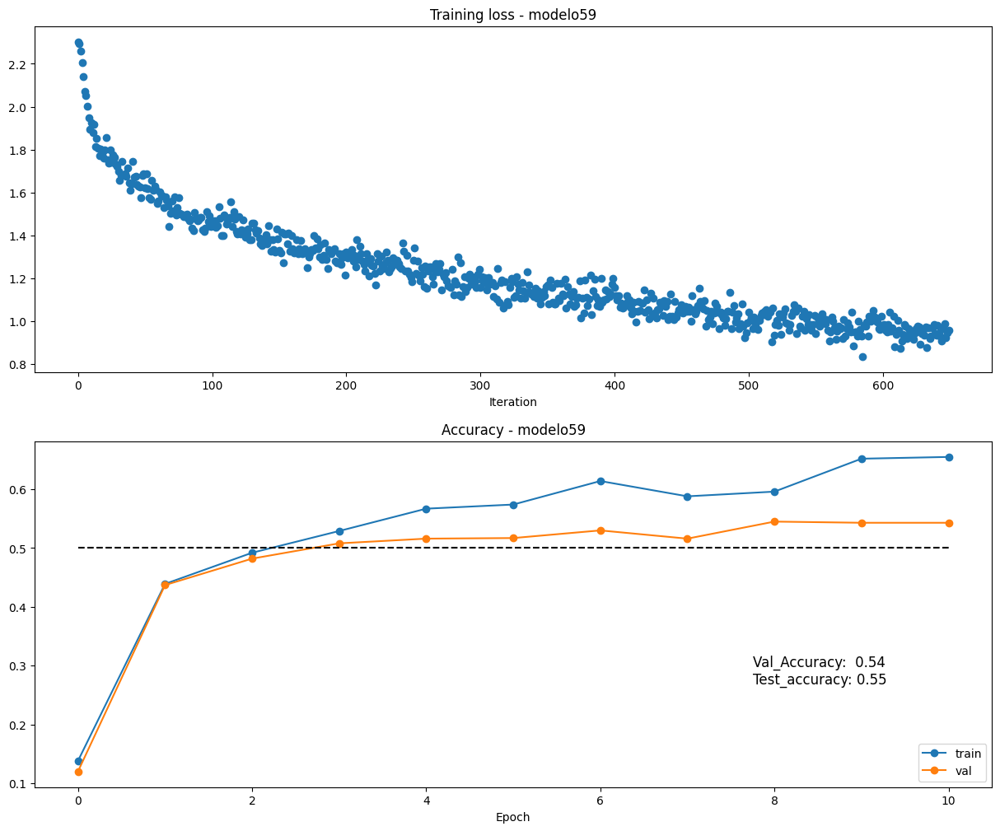


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo60 -------- best_val_acc: 0.508 -------- best_test_acc: 0.502
 

 Best Model: {'test_accuracy': 0.502, 'val_accuracy': 0.508, 'weight_scale': 0.026771648759611508, 'learning_rate': 0.04207353650831528, 'hidden_dims': [50, 50, 50, 50], 'update_rule': 'sgd', 'batch_size': 200, 'batch_norm': True, 'dropout_p': 0, 'reg': 0.7052075937202998, 'Solver': <__main__.Solver object at 0x7b9786eb54e0>} 



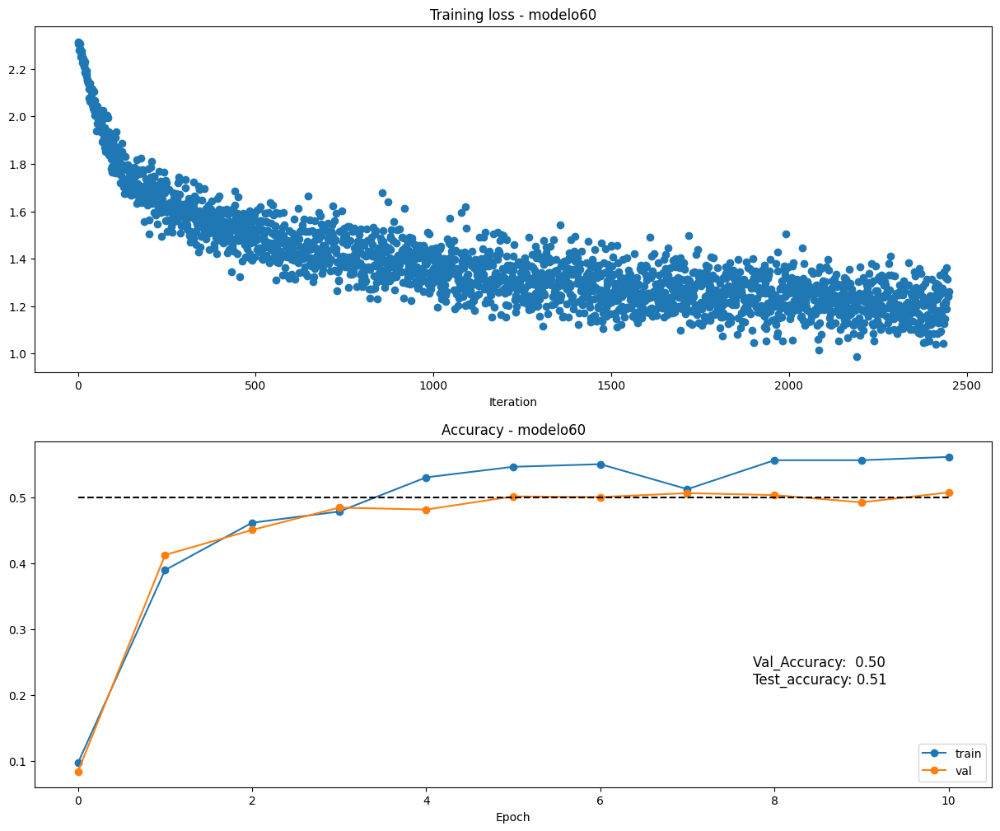


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo61 -------- best_val_acc: 0.522 -------- best_test_acc: 0.507
 

 Best Model: {'test_accuracy': 0.507, 'val_accuracy': 0.522, 'weight_scale': 0.0420512055970199, 'learning_rate': 0.09586761600324153, 'hidden_dims': [50, 50, 50, 50], 'update_rule': 'sgd', 'batch_size': 200, 'batch_norm': True, 'dropout_p': 0, 'reg': 0.785831086207851, 'Solver': <__main__.Solver object at 0x7b978ce035b0>} 



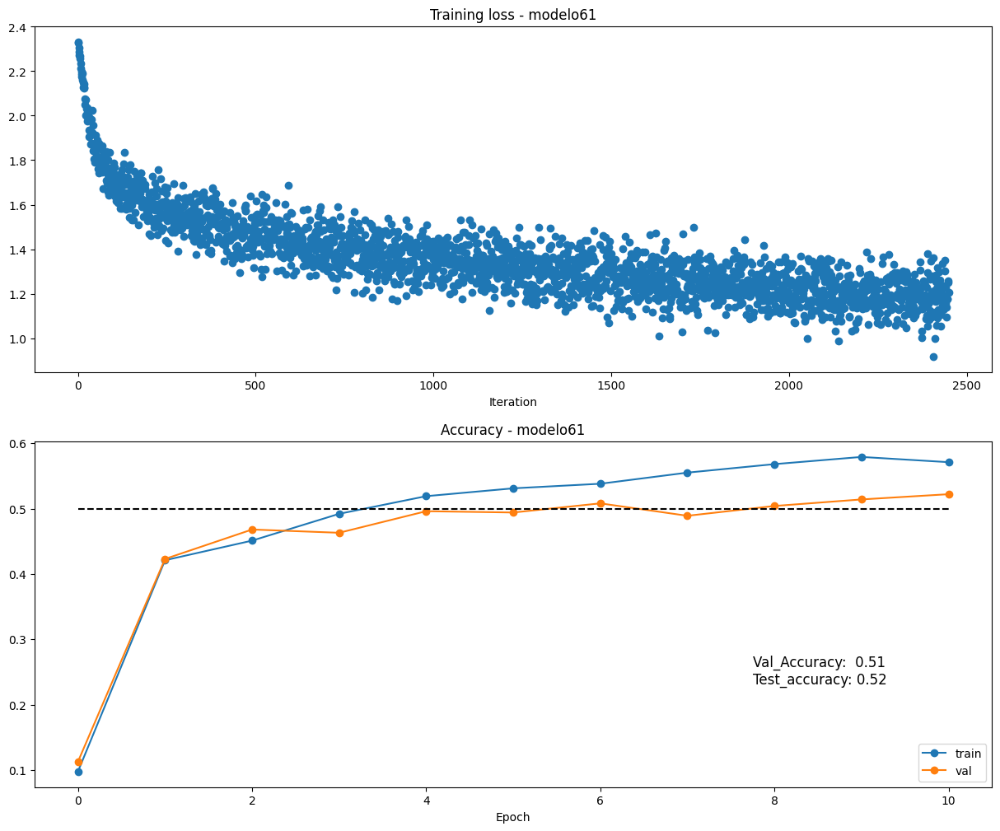


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo62 -------- best_val_acc: 0.533 -------- best_test_acc: 0.518
 

 Best Model: {'test_accuracy': 0.518, 'val_accuracy': 0.533, 'weight_scale': 0.024791333999802868, 'learning_rate': 0.09129474729803969, 'hidden_dims': [75, 75, 75, 75], 'update_rule': 'sgd_momentum', 'batch_size': 250, 'batch_norm': True, 'dropout_p': 10, 'reg': 0.5951114169051985, 'Solver': <__main__.Solver object at 0x7b978ce02ef0>} 



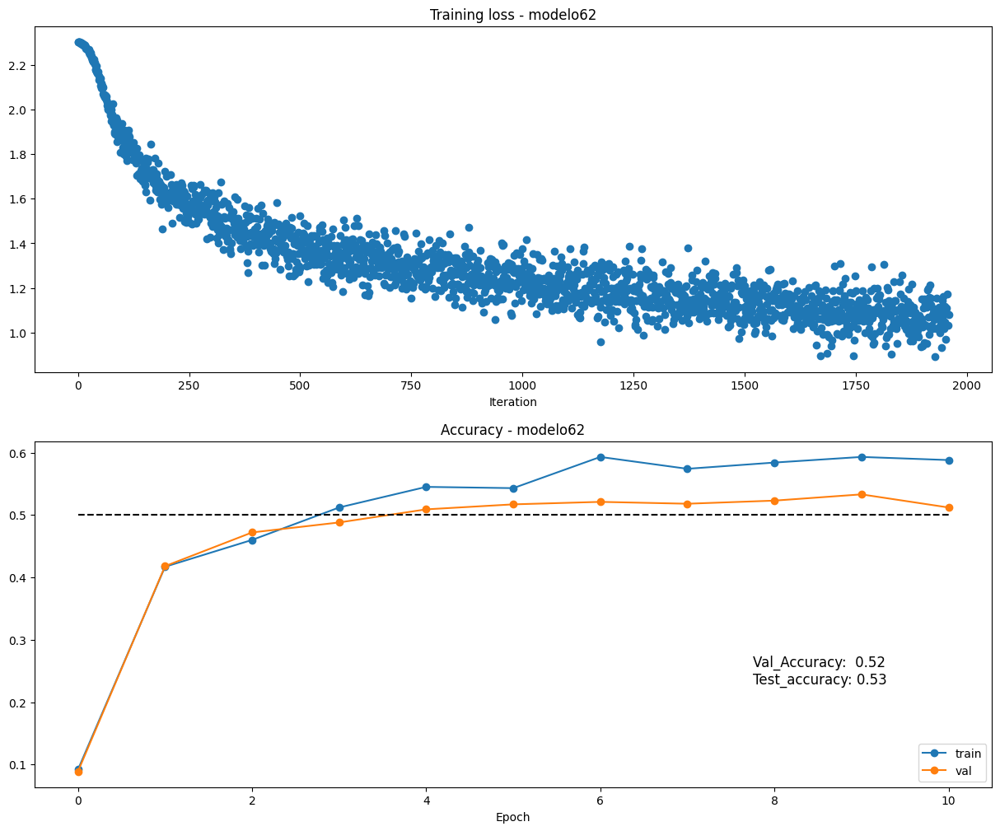


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo63 -------- best_val_acc: 0.529 -------- best_test_acc: 0.513
 

 Best Model: {'test_accuracy': 0.513, 'val_accuracy': 0.529, 'weight_scale': 0.028266927447267956, 'learning_rate': 0.036542711673375014, 'hidden_dims': [100, 100, 100, 100], 'update_rule': 'rmsprop', 'batch_size': 500, 'batch_norm': True, 'dropout_p': 15, 'reg': 0.8334826164158913, 'Solver': <__main__.Solver object at 0x7b9786e5d1e0>} 



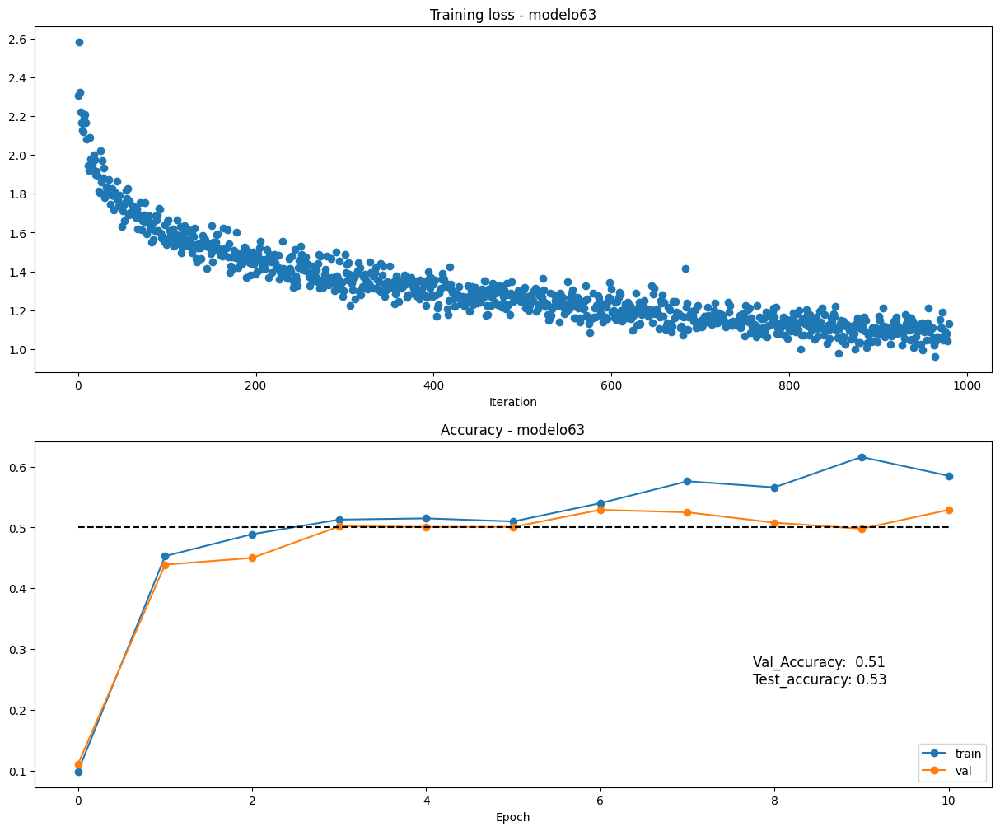


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo64 -------- best_val_acc: 0.481 -------- best_test_acc: 0.457
 

 Best Model: {'test_accuracy': 0.457, 'val_accuracy': 0.481, 'weight_scale': 0.04204579215417687, 'learning_rate': 0.01379058350690697, 'hidden_dims': [50, 50, 50, 50], 'update_rule': 'sgd', 'batch_size': 200, 'batch_norm': True, 'dropout_p': 0, 'reg': 0.8424228291631205, 'Solver': <__main__.Solver object at 0x7b978c30d390>} 



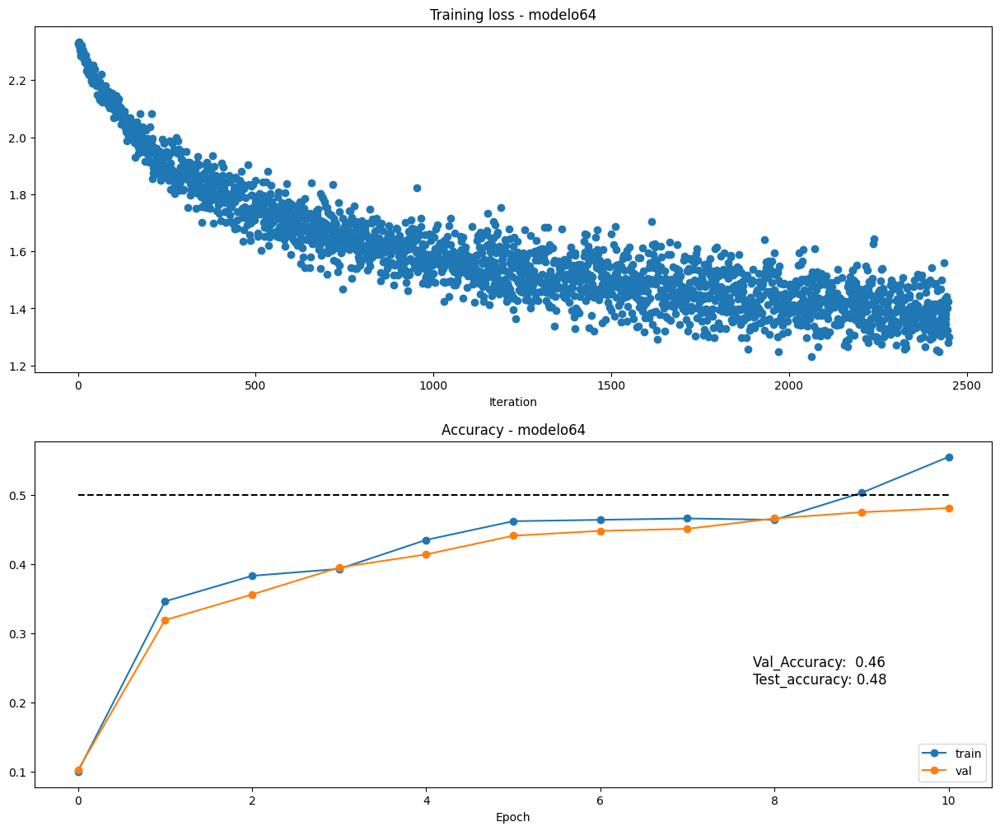


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo65 -------- best_val_acc: 0.537 -------- best_test_acc: 0.539
 

 Best Model: {'test_accuracy': 0.539, 'val_accuracy': 0.537, 'weight_scale': 0.0436926969835654, 'learning_rate': 0.02685679934250121, 'hidden_dims': [150, 150, 150, 150], 'update_rule': 'adam', 'batch_size': 750, 'batch_norm': True, 'dropout_p': 20, 'reg': 0.9575028775967658, 'Solver': <__main__.Solver object at 0x7b9786b2b250>} 



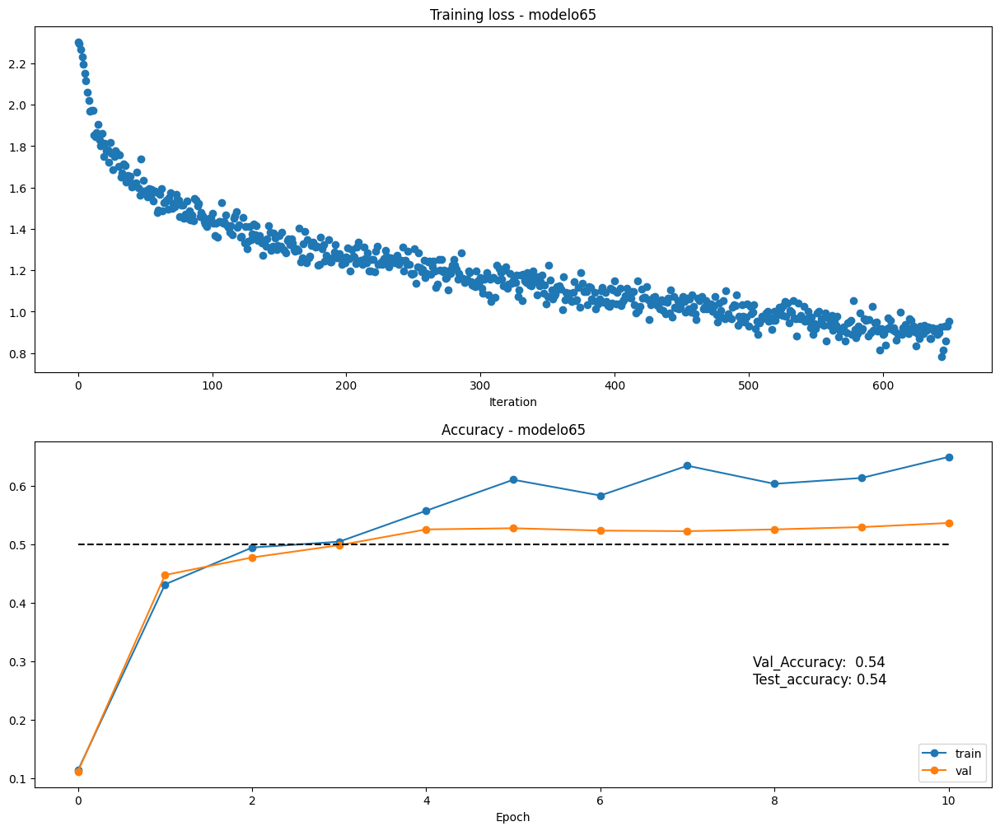


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo66 -------- best_val_acc: 0.519 -------- best_test_acc: 0.525
 

 Best Model: {'test_accuracy': 0.525, 'val_accuracy': 0.519, 'weight_scale': 0.03136939500154789, 'learning_rate': 0.0676885669089754, 'hidden_dims': [75, 75, 75, 75], 'update_rule': 'sgd_momentum', 'batch_size': 250, 'batch_norm': True, 'dropout_p': 10, 'reg': 0.7750220037822276, 'Solver': <__main__.Solver object at 0x7b9786ab7be0>} 



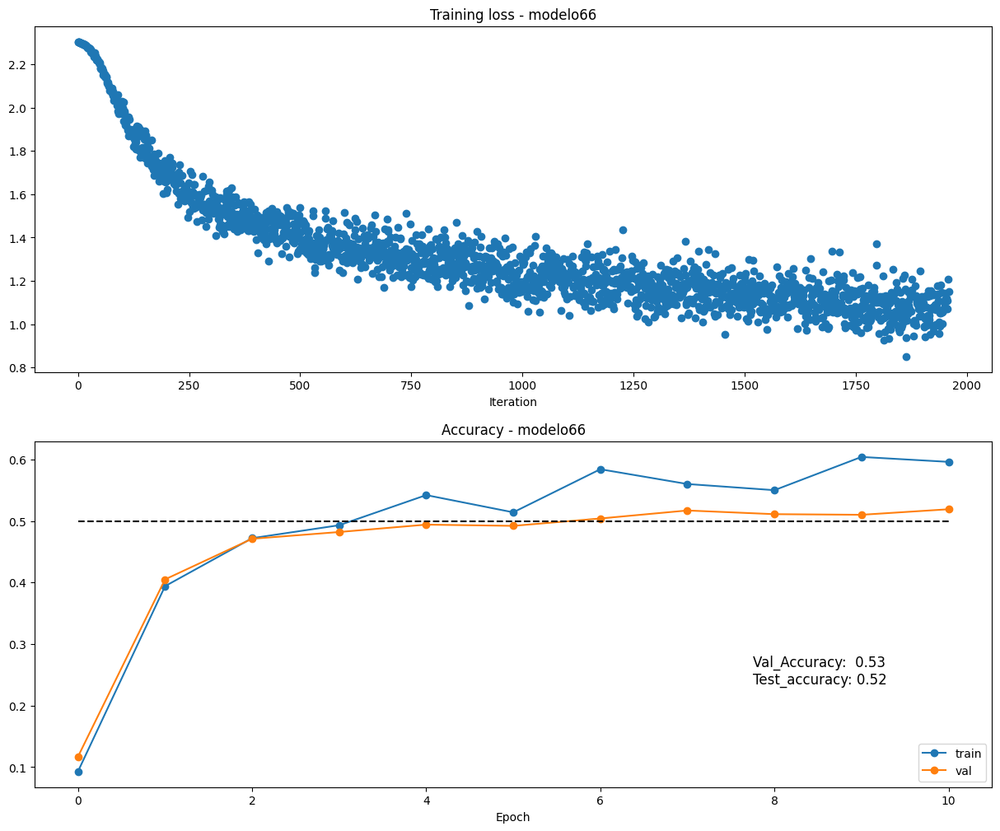


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo67 -------- best_val_acc: 0.53 -------- best_test_acc: 0.509
 

 Best Model: {'test_accuracy': 0.509, 'val_accuracy': 0.53, 'weight_scale': 0.027175710599413636, 'learning_rate': 0.08101132514048222, 'hidden_dims': [50, 50, 50, 50], 'update_rule': 'sgd', 'batch_size': 200, 'batch_norm': True, 'dropout_p': 0, 'reg': 0.5353826697042059, 'Solver': <__main__.Solver object at 0x7b97c2cf33d0>} 



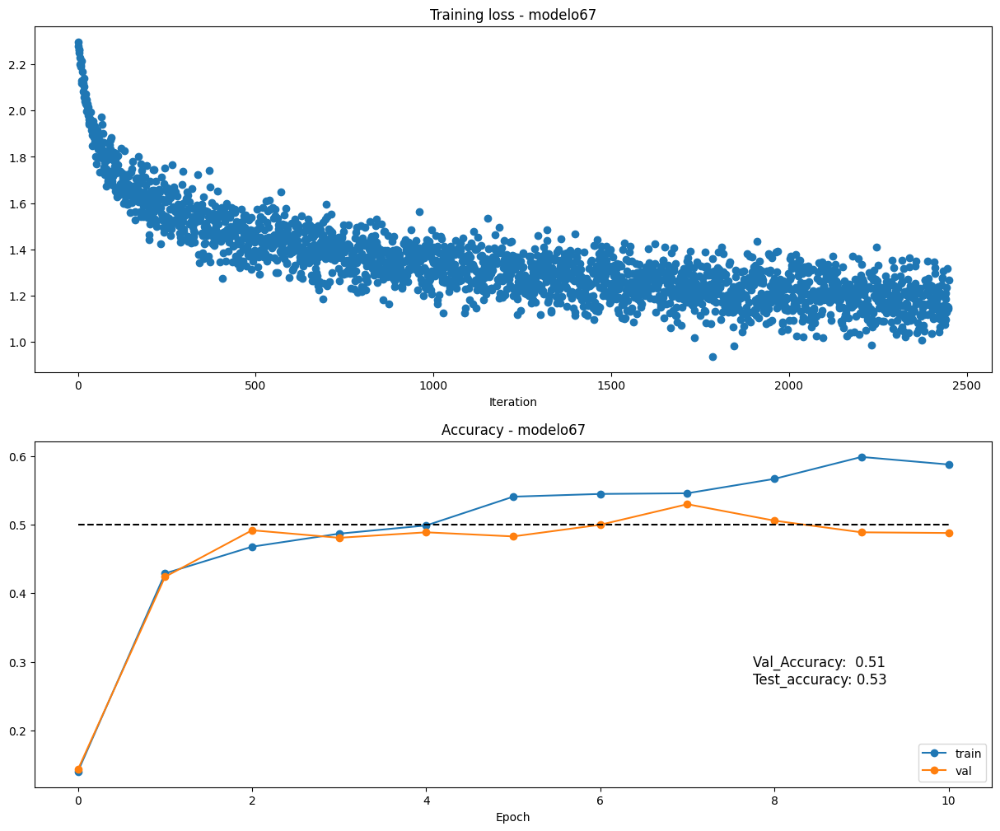


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo68 -------- best_val_acc: 0.508 -------- best_test_acc: 0.484
 

 Best Model: {'test_accuracy': 0.484, 'val_accuracy': 0.508, 'weight_scale': 0.019305693588631847, 'learning_rate': 0.012961519803103796, 'hidden_dims': [50, 50, 50, 50], 'update_rule': 'sgd', 'batch_size': 200, 'batch_norm': True, 'dropout_p': 0, 'reg': 0.7036192890202193, 'Solver': <__main__.Solver object at 0x7b978cddf400>} 



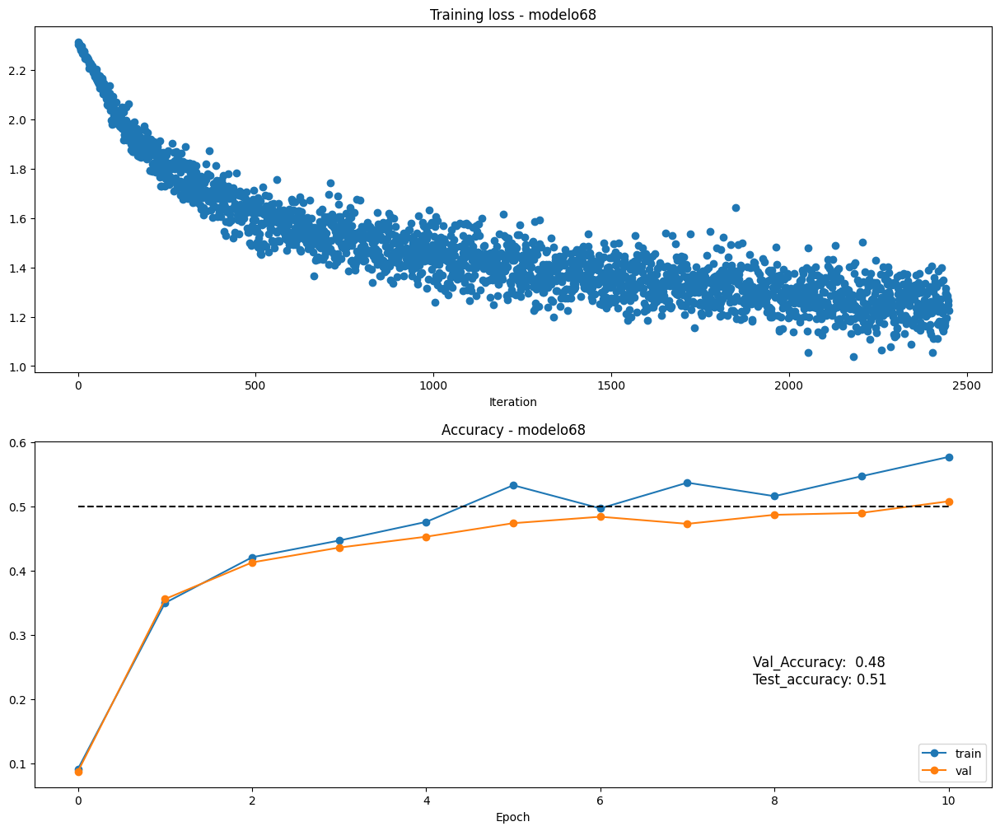


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo69 -------- best_val_acc: 0.533 -------- best_test_acc: 0.53
 

 Best Model: {'test_accuracy': 0.53, 'val_accuracy': 0.533, 'weight_scale': 0.0181888051599169, 'learning_rate': 0.060331547430300635, 'hidden_dims': [150, 150, 150, 150], 'update_rule': 'adam', 'batch_size': 750, 'batch_norm': True, 'dropout_p': 20, 'reg': 0.8374520254713071, 'Solver': <__main__.Solver object at 0x7b9786dd5cc0>} 



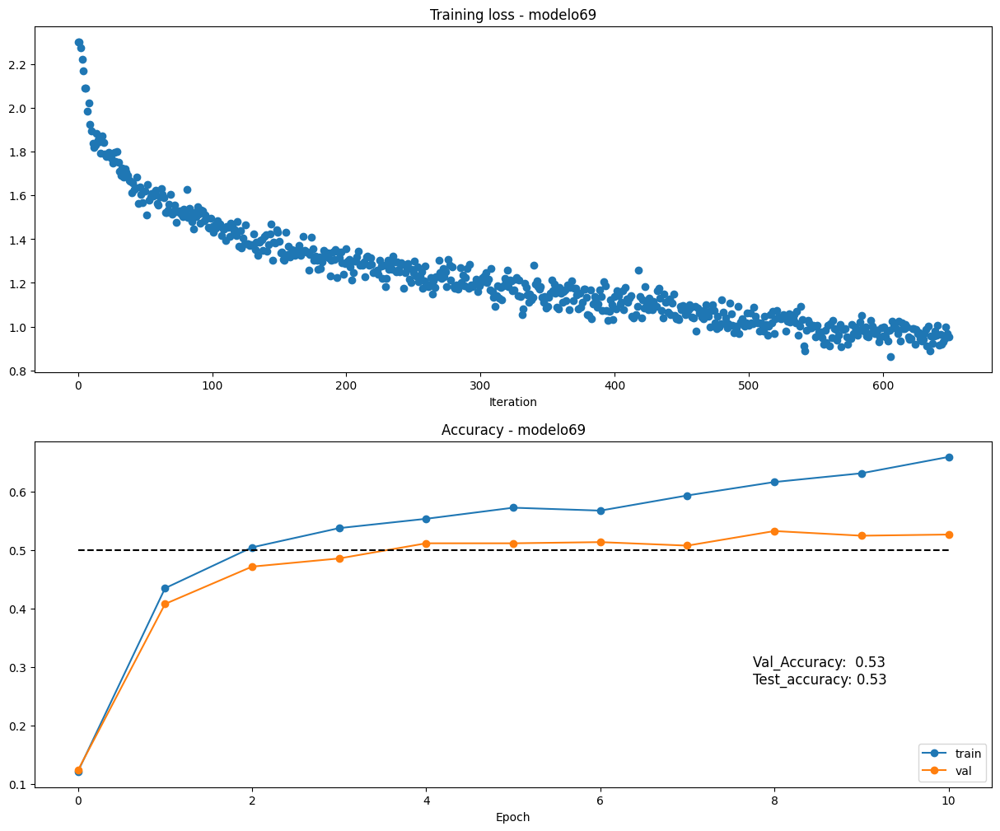


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo70 -------- best_val_acc: 0.51 -------- best_test_acc: 0.512
 

 Best Model: {'test_accuracy': 0.512, 'val_accuracy': 0.51, 'weight_scale': 0.0440083772149257, 'learning_rate': 0.044678803025146534, 'hidden_dims': [100, 100, 100, 100], 'update_rule': 'rmsprop', 'batch_size': 500, 'batch_norm': True, 'dropout_p': 15, 'reg': 0.7413630506800539, 'Solver': <__main__.Solver object at 0x7b978ce81cf0>} 



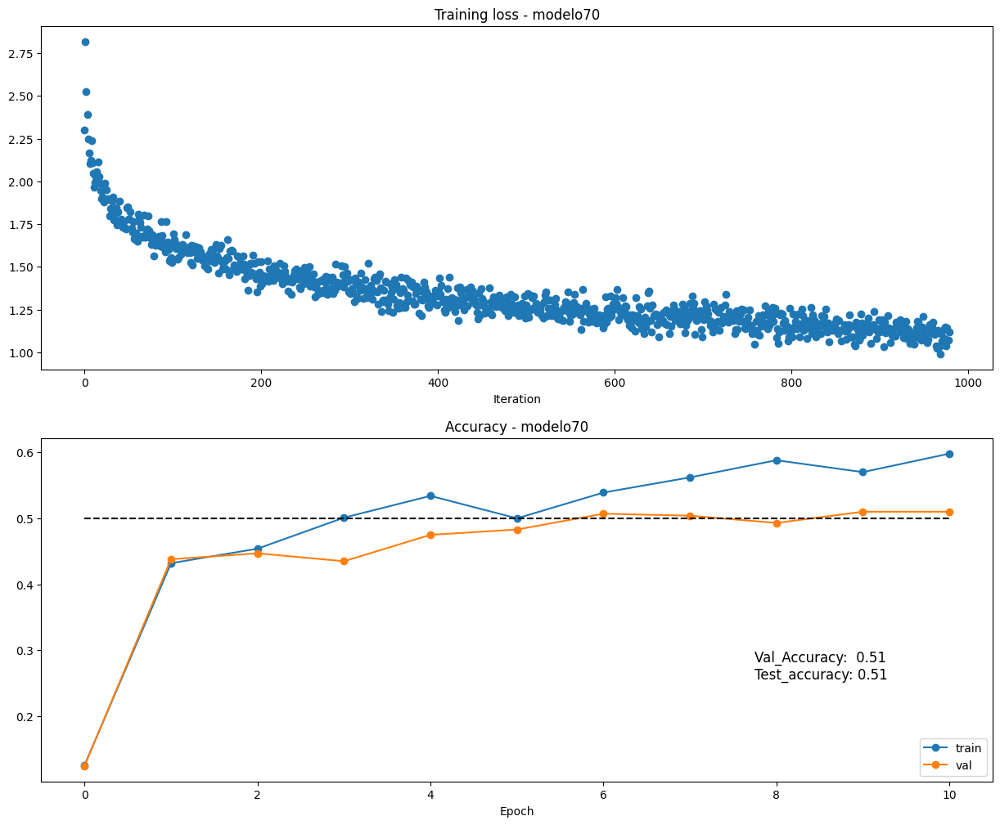


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo71 -------- best_val_acc: 0.525 -------- best_test_acc: 0.51
 

 Best Model: {'test_accuracy': 0.51, 'val_accuracy': 0.525, 'weight_scale': 0.01718067855109162, 'learning_rate': 0.08817449543936516, 'hidden_dims': [100, 100, 100, 100], 'update_rule': 'rmsprop', 'batch_size': 500, 'batch_norm': True, 'dropout_p': 15, 'reg': 0.678997458948615, 'Solver': <__main__.Solver object at 0x7b978c349000>} 



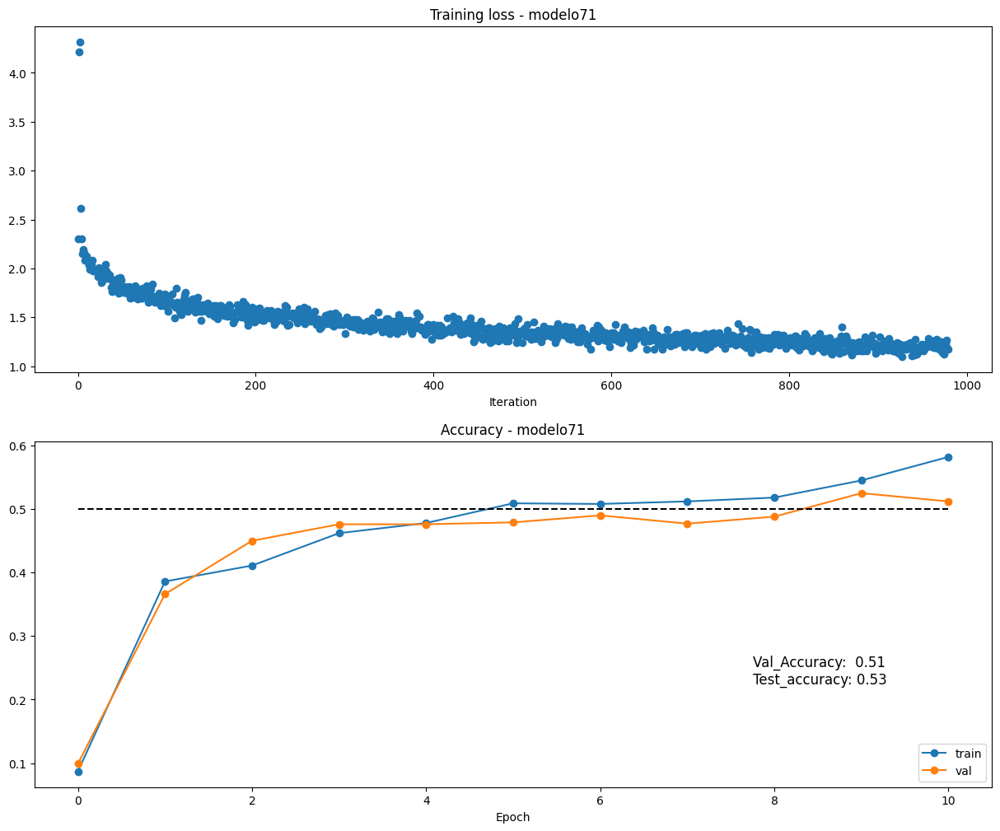


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo72 -------- best_val_acc: 0.497 -------- best_test_acc: 0.48
 

 Best Model: {'test_accuracy': 0.48, 'val_accuracy': 0.497, 'weight_scale': 0.020518209616973773, 'learning_rate': 0.027532181935692082, 'hidden_dims': [50, 50, 50, 50], 'update_rule': 'sgd', 'batch_size': 200, 'batch_norm': True, 'dropout_p': 0, 'reg': 0.5893722994764541, 'Solver': <__main__.Solver object at 0x7b978fa4cc40>} 



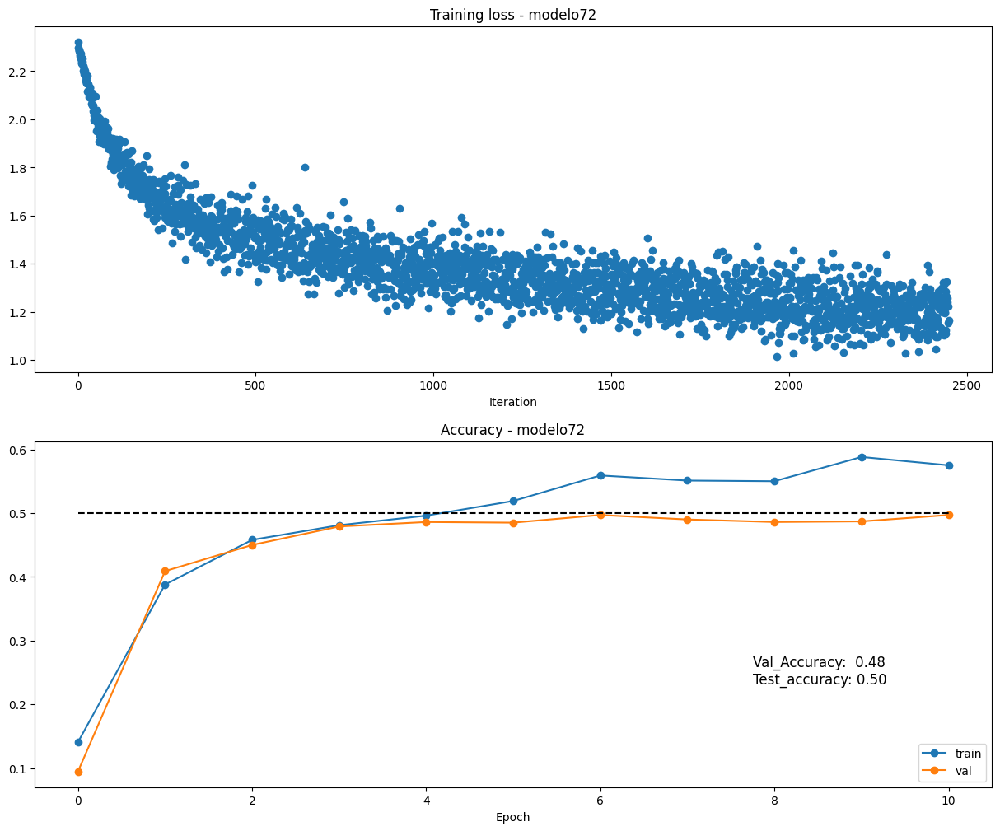


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo73 -------- best_val_acc: 0.533 -------- best_test_acc: 0.519
 

 Best Model: {'test_accuracy': 0.519, 'val_accuracy': 0.533, 'weight_scale': 0.038278212041826735, 'learning_rate': 0.061024730387068286, 'hidden_dims': [75, 75, 75, 75], 'update_rule': 'sgd_momentum', 'batch_size': 250, 'batch_norm': True, 'dropout_p': 10, 'reg': 0.870122187891621, 'Solver': <__main__.Solver object at 0x7b9786c24ee0>} 



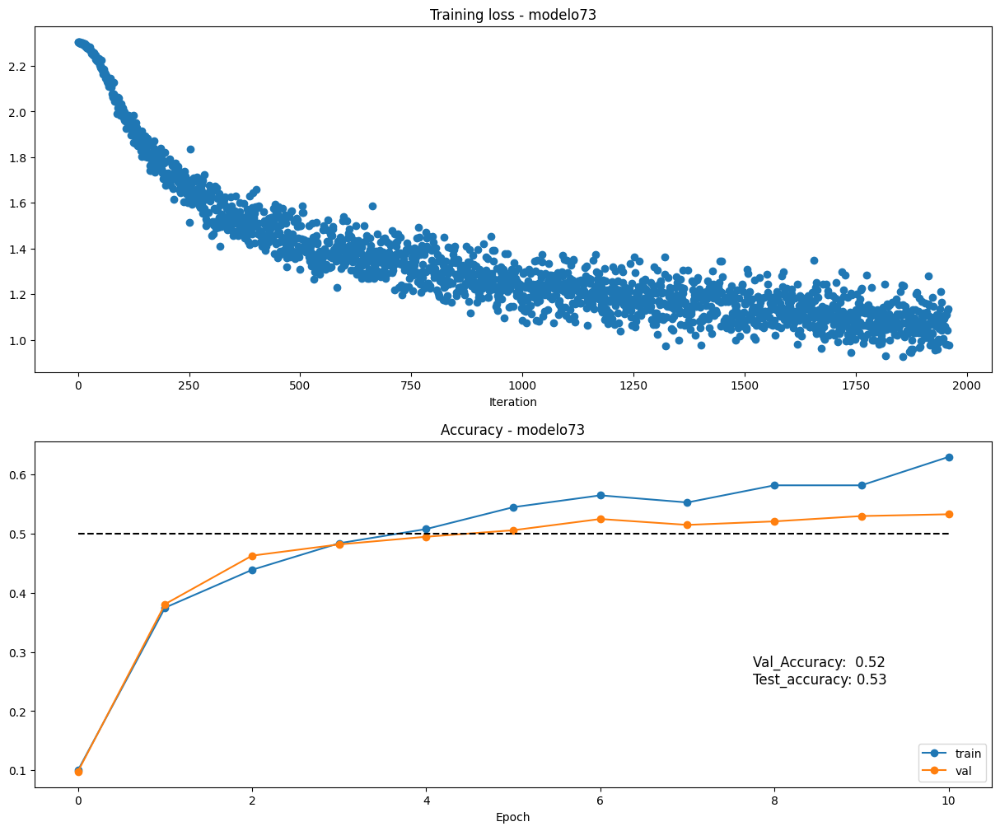


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo74 -------- best_val_acc: 0.517 -------- best_test_acc: 0.515
 

 Best Model: {'test_accuracy': 0.515, 'val_accuracy': 0.517, 'weight_scale': 0.011937736303402646, 'learning_rate': 0.08132767730337563, 'hidden_dims': [75, 75, 75, 75], 'update_rule': 'sgd_momentum', 'batch_size': 250, 'batch_norm': True, 'dropout_p': 10, 'reg': 0.785492012264233, 'Solver': <__main__.Solver object at 0x7b978ccb8d00>} 



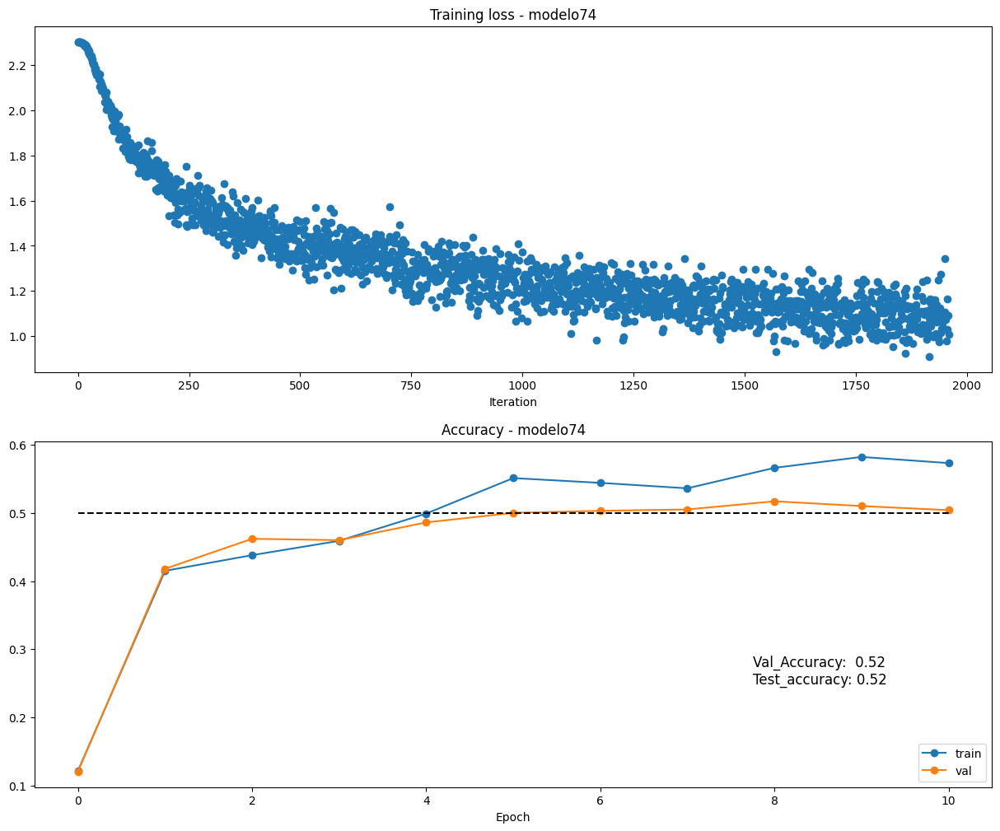


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo75 -------- best_val_acc: 0.516 -------- best_test_acc: 0.521
 

 Best Model: {'test_accuracy': 0.521, 'val_accuracy': 0.516, 'weight_scale': 0.040622994845529885, 'learning_rate': 0.058030649275917175, 'hidden_dims': [100, 100, 100, 100], 'update_rule': 'rmsprop', 'batch_size': 500, 'batch_norm': True, 'dropout_p': 15, 'reg': 0.7369265274153329, 'Solver': <__main__.Solver object at 0x7b97869f8070>} 



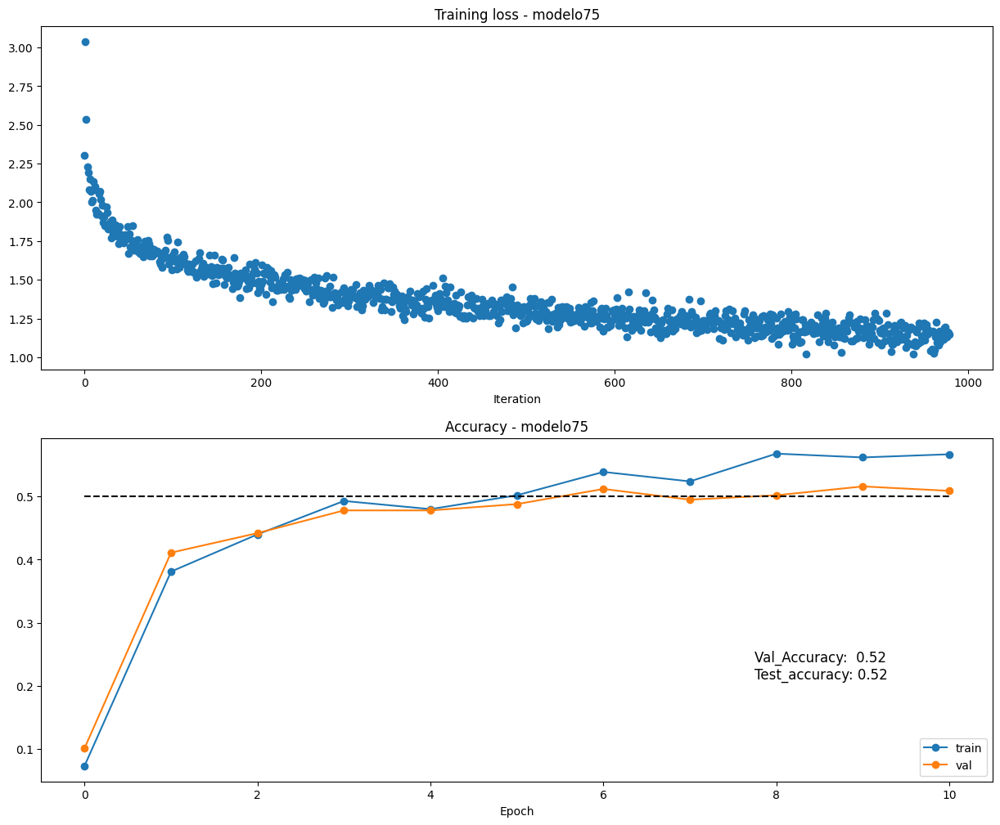


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo76 -------- best_val_acc: 0.533 -------- best_test_acc: 0.517
 

 Best Model: {'test_accuracy': 0.517, 'val_accuracy': 0.533, 'weight_scale': 0.011960990303177188, 'learning_rate': 0.0471564213041102, 'hidden_dims': [75, 75, 75, 75], 'update_rule': 'sgd_momentum', 'batch_size': 250, 'batch_norm': True, 'dropout_p': 10, 'reg': 0.6752215932924903, 'Solver': <__main__.Solver object at 0x7b978ce010f0>} 



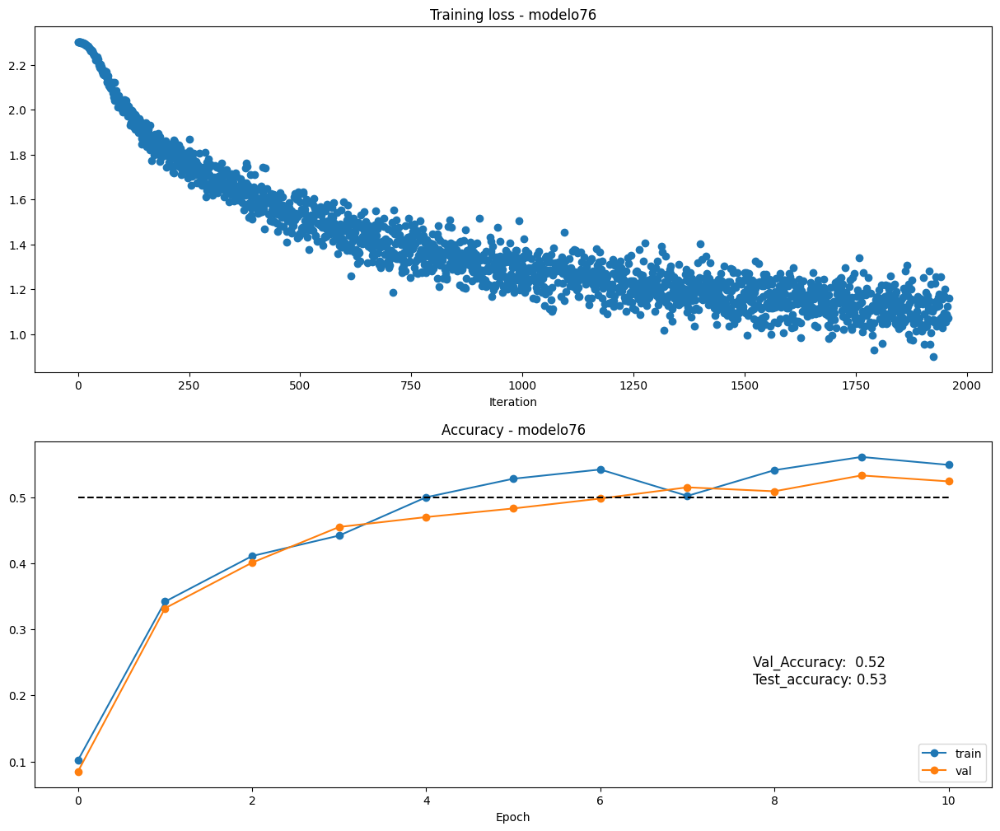


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo77 -------- best_val_acc: 0.521 -------- best_test_acc: 0.512
 

 Best Model: {'test_accuracy': 0.512, 'val_accuracy': 0.521, 'weight_scale': 0.022353870050470466, 'learning_rate': 0.05111604219200146, 'hidden_dims': [50, 50, 50, 50], 'update_rule': 'sgd', 'batch_size': 200, 'batch_norm': True, 'dropout_p': 0, 'reg': 0.5840385511369582, 'Solver': <__main__.Solver object at 0x7b978ce04d30>} 



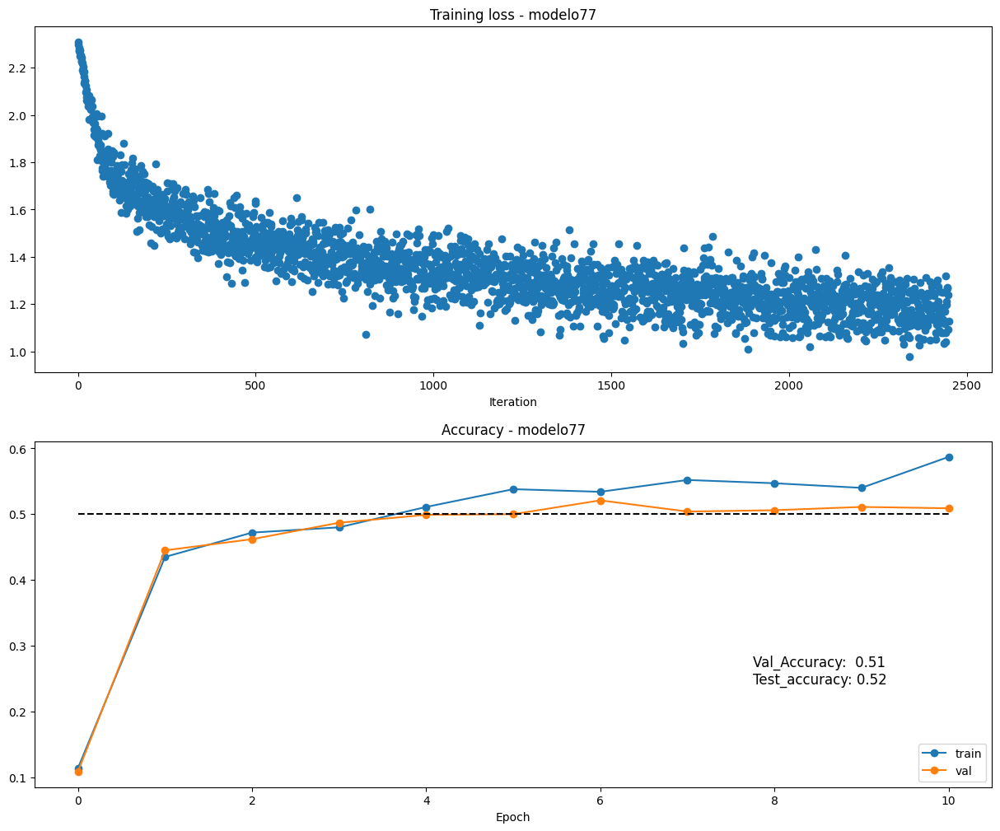


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo78 -------- best_val_acc: 0.538 -------- best_test_acc: 0.511
 

 Best Model: {'test_accuracy': 0.511, 'val_accuracy': 0.538, 'weight_scale': 0.033200453252610396, 'learning_rate': 0.024361017048003017, 'hidden_dims': [100, 100, 100, 100], 'update_rule': 'rmsprop', 'batch_size': 500, 'batch_norm': True, 'dropout_p': 15, 'reg': 0.8319975760135475, 'Solver': <__main__.Solver object at 0x7b978cf85ea0>} 



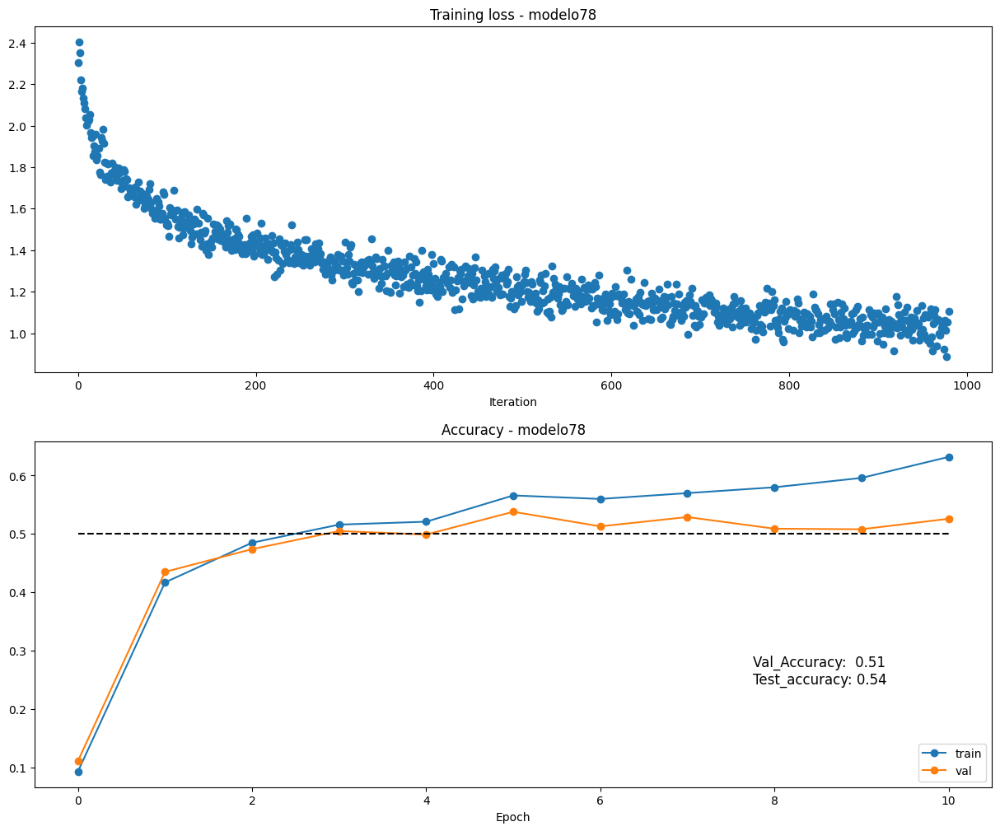


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo79 -------- best_val_acc: 0.529 -------- best_test_acc: 0.516
 

 Best Model: {'test_accuracy': 0.516, 'val_accuracy': 0.529, 'weight_scale': 0.014653970875304859, 'learning_rate': 0.06363637471088532, 'hidden_dims': [75, 75, 75, 75], 'update_rule': 'sgd_momentum', 'batch_size': 250, 'batch_norm': True, 'dropout_p': 10, 'reg': 0.994568715953275, 'Solver': <__main__.Solver object at 0x7b9786ef9840>} 



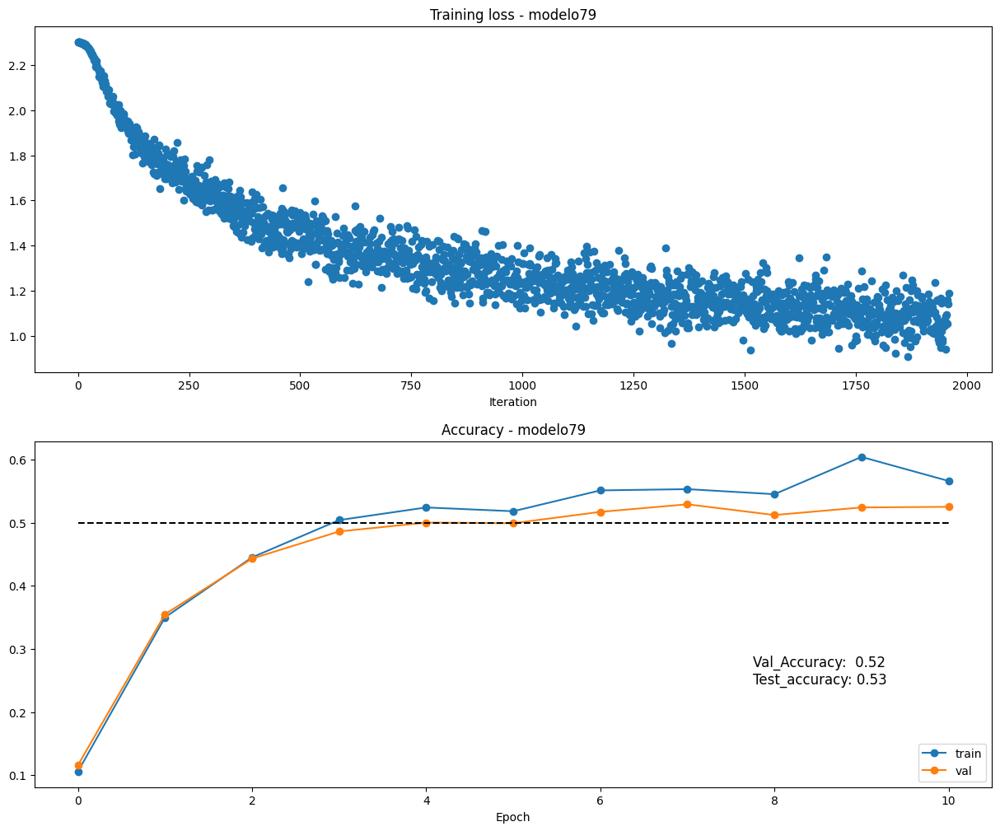


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo80 -------- best_val_acc: 0.521 -------- best_test_acc: 0.503
 

 Best Model: {'test_accuracy': 0.503, 'val_accuracy': 0.521, 'weight_scale': 0.013991946183667654, 'learning_rate': 0.017901069147428325, 'hidden_dims': [75, 75, 75, 75], 'update_rule': 'sgd_momentum', 'batch_size': 250, 'batch_norm': True, 'dropout_p': 10, 'reg': 0.6514151798157882, 'Solver': <__main__.Solver object at 0x7b978c2f3400>} 



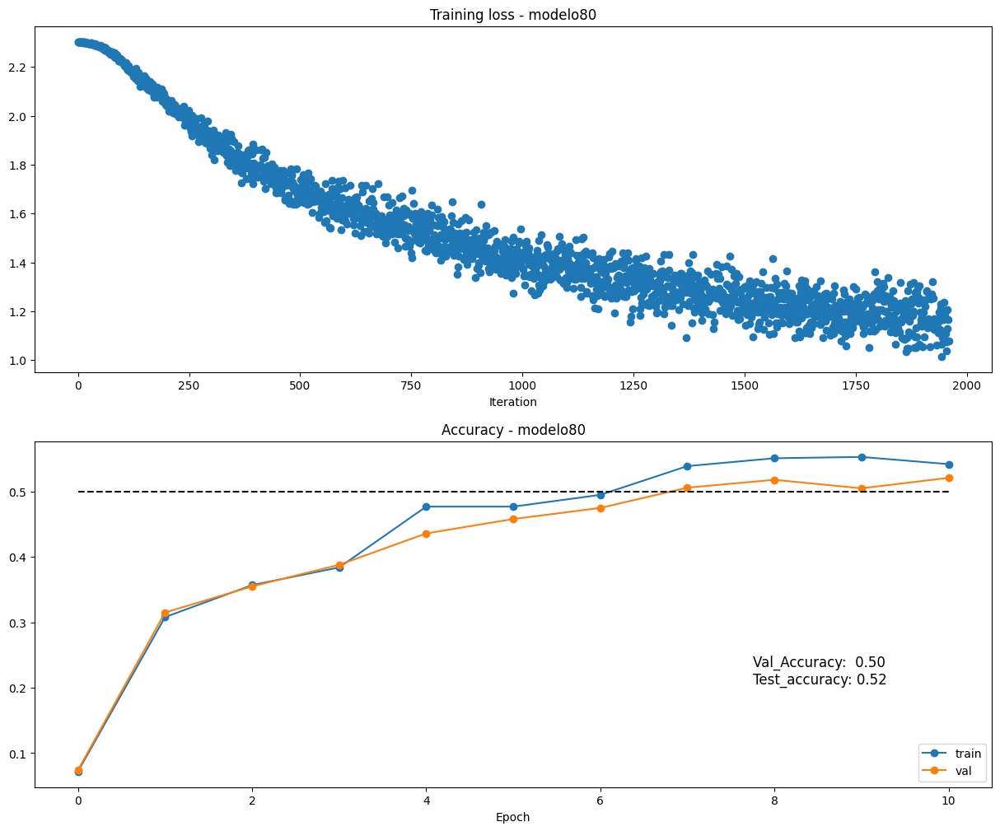


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo81 -------- best_val_acc: 0.528 -------- best_test_acc: 0.535
 

 Best Model: {'test_accuracy': 0.535, 'val_accuracy': 0.528, 'weight_scale': 0.013126557850558811, 'learning_rate': 0.07007101846962166, 'hidden_dims': [150, 150, 150, 150], 'update_rule': 'adam', 'batch_size': 750, 'batch_norm': True, 'dropout_p': 20, 'reg': 0.5868808386727332, 'Solver': <__main__.Solver object at 0x7b978c2f19c0>} 



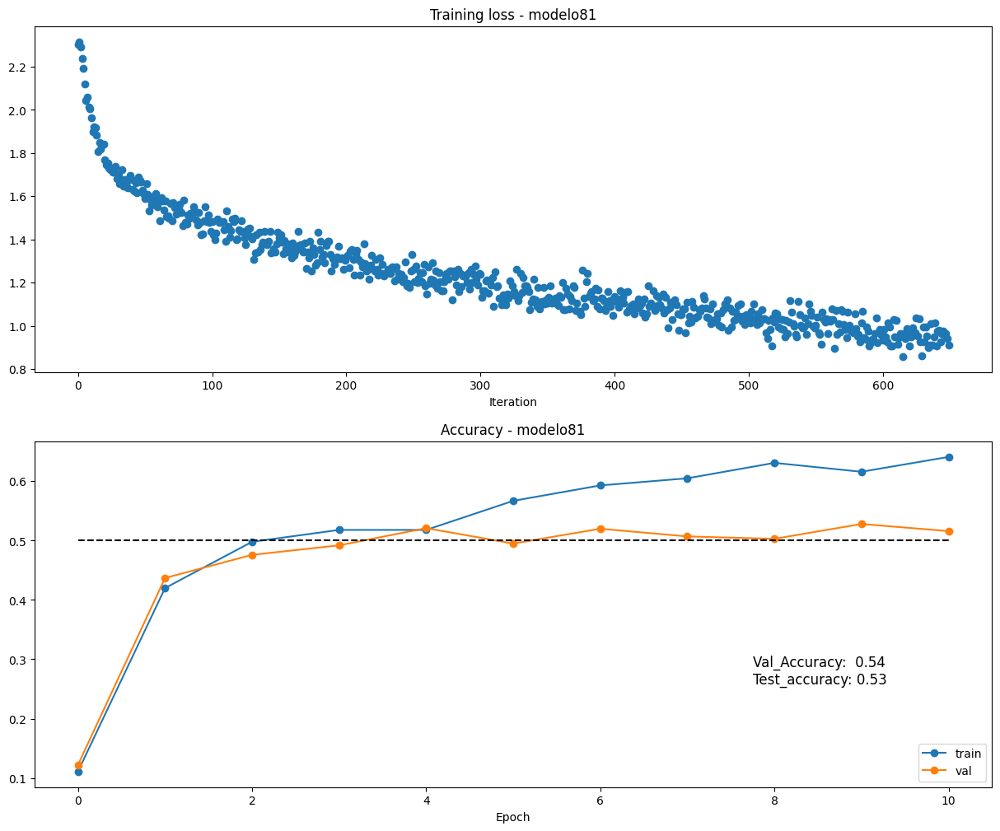


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo82 -------- best_val_acc: 0.521 -------- best_test_acc: 0.484
 

 Best Model: {'test_accuracy': 0.484, 'val_accuracy': 0.521, 'weight_scale': 0.045894979855991926, 'learning_rate': 0.07145561222098534, 'hidden_dims': [100, 100, 100, 100], 'update_rule': 'rmsprop', 'batch_size': 500, 'batch_norm': True, 'dropout_p': 15, 'reg': 0.8716602029778422, 'Solver': <__main__.Solver object at 0x7b9786f72020>} 



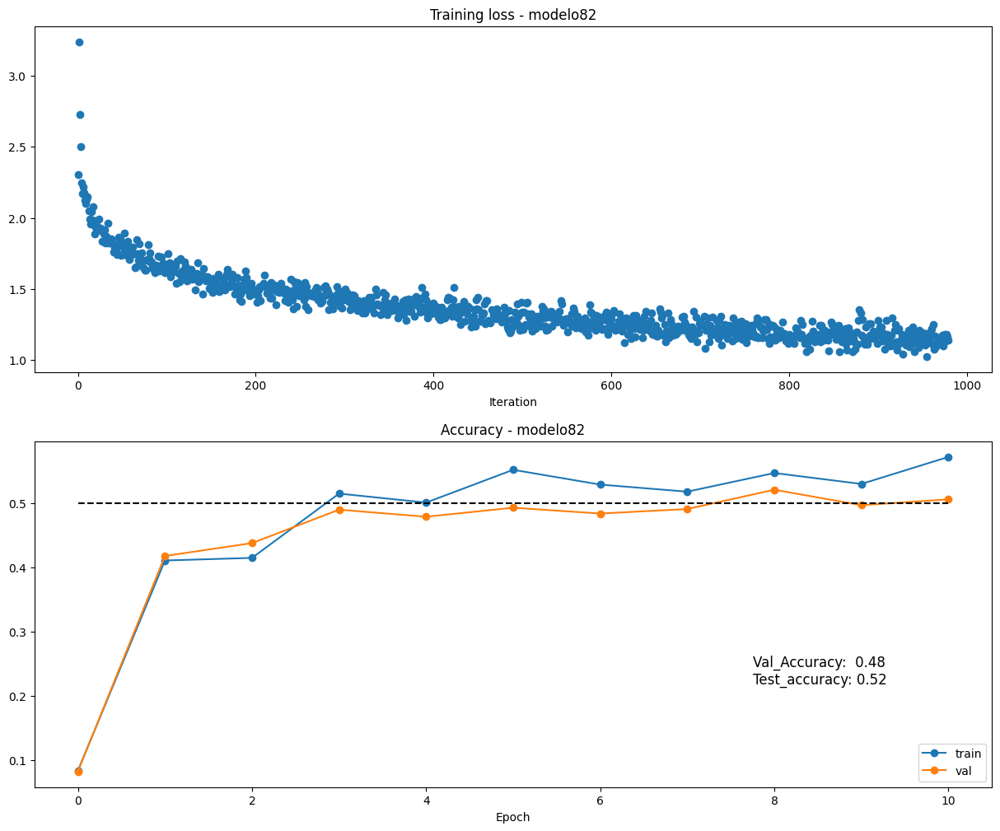


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo83 -------- best_val_acc: 0.527 -------- best_test_acc: 0.529
 

 Best Model: {'test_accuracy': 0.529, 'val_accuracy': 0.527, 'weight_scale': 0.0120047080035449, 'learning_rate': 0.04958878294079044, 'hidden_dims': [150, 150, 150, 150], 'update_rule': 'adam', 'batch_size': 750, 'batch_norm': True, 'dropout_p': 20, 'reg': 0.825128470968736, 'Solver': <__main__.Solver object at 0x7b97866b4430>} 



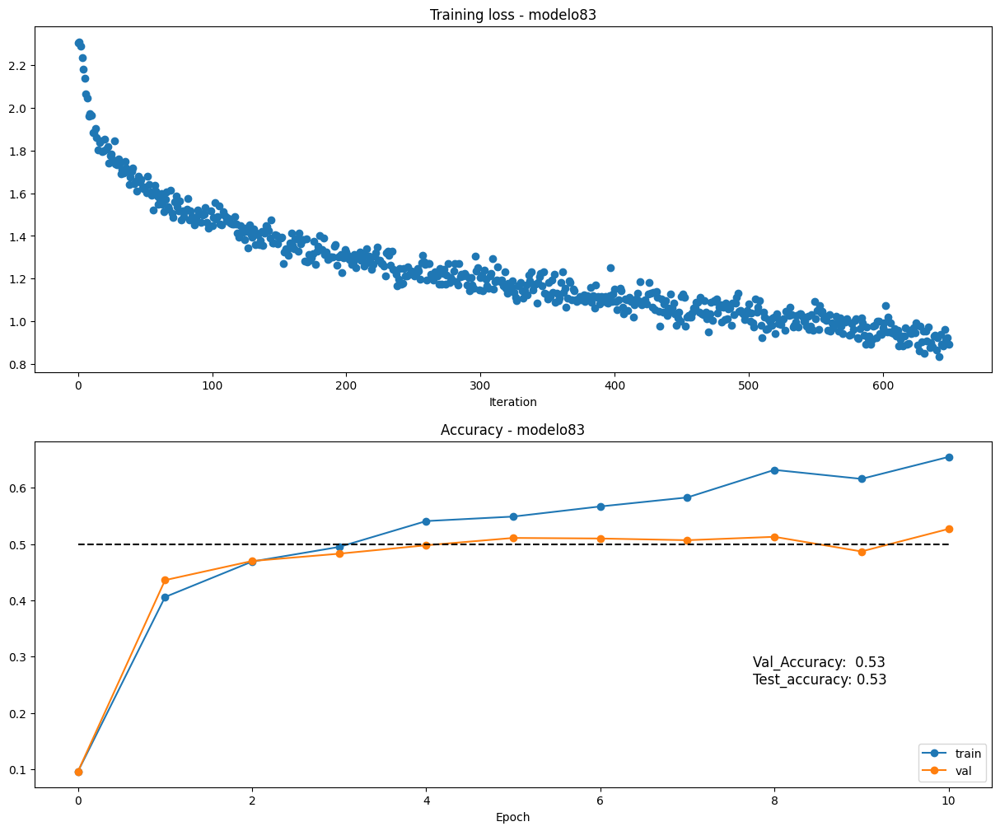


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo84 -------- best_val_acc: 0.501 -------- best_test_acc: 0.494
 

 Best Model: {'test_accuracy': 0.494, 'val_accuracy': 0.501, 'weight_scale': 0.018882797713823344, 'learning_rate': 0.06929640715888954, 'hidden_dims': [100, 100, 100, 100], 'update_rule': 'rmsprop', 'batch_size': 500, 'batch_norm': True, 'dropout_p': 15, 'reg': 0.6486985891422957, 'Solver': <__main__.Solver object at 0x7b978c425ab0>} 



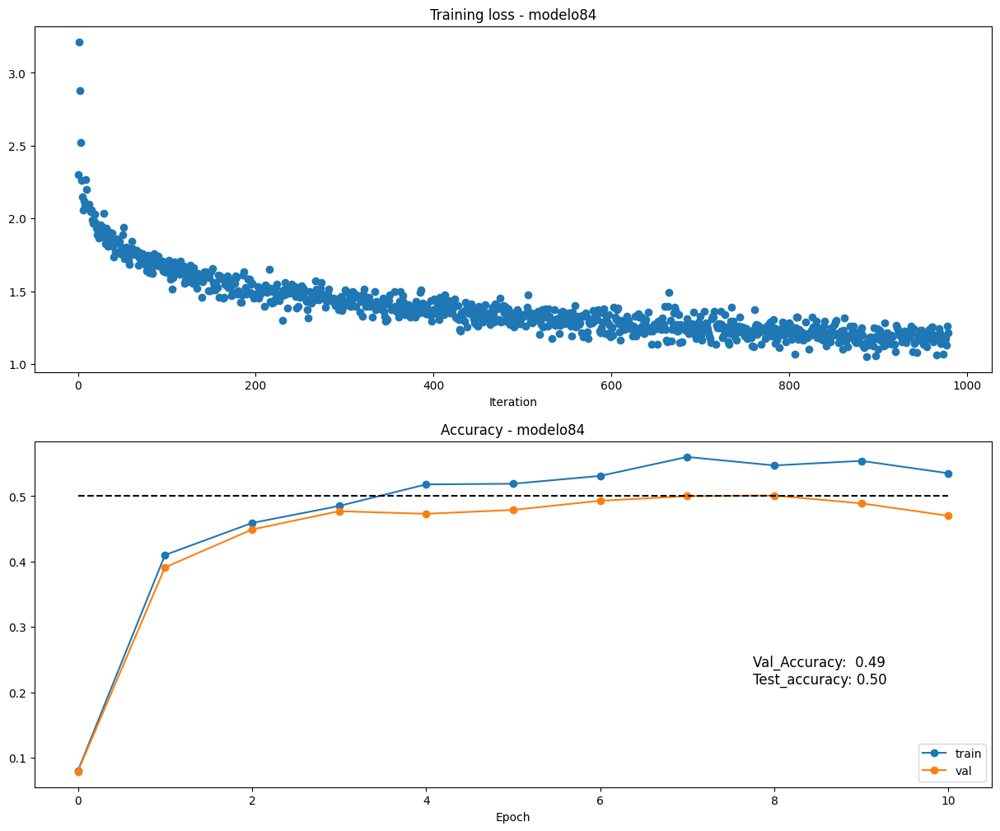


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo85 -------- best_val_acc: 0.537 -------- best_test_acc: 0.522
 

 Best Model: {'test_accuracy': 0.522, 'val_accuracy': 0.537, 'weight_scale': 0.04333351673916775, 'learning_rate': 0.031516275645796066, 'hidden_dims': [75, 75, 75, 75], 'update_rule': 'sgd_momentum', 'batch_size': 250, 'batch_norm': True, 'dropout_p': 10, 'reg': 0.6331394973267404, 'Solver': <__main__.Solver object at 0x7b97867301f0>} 



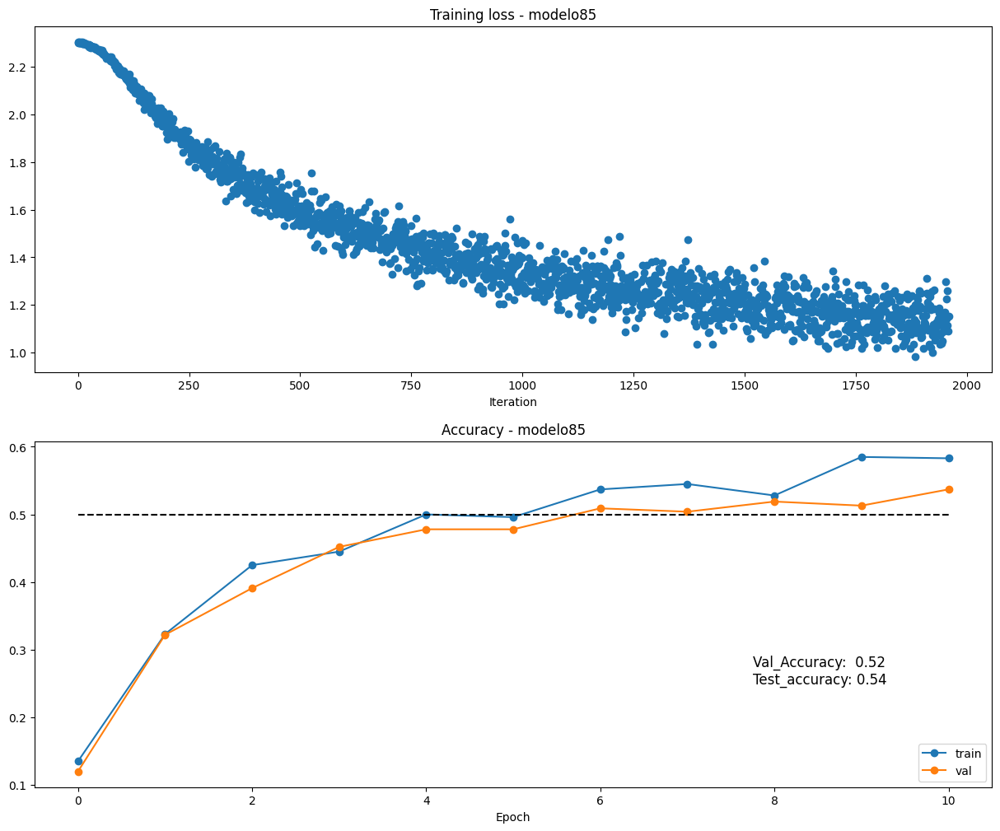


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo86 -------- best_val_acc: 0.544 -------- best_test_acc: 0.541
 

 Best Model: {'test_accuracy': 0.541, 'val_accuracy': 0.544, 'weight_scale': 0.03895215852204112, 'learning_rate': 0.07216775019529362, 'hidden_dims': [150, 150, 150, 150], 'update_rule': 'adam', 'batch_size': 750, 'batch_norm': True, 'dropout_p': 20, 'reg': 0.688643610249257, 'Solver': <__main__.Solver object at 0x7b9786feeec0>} 



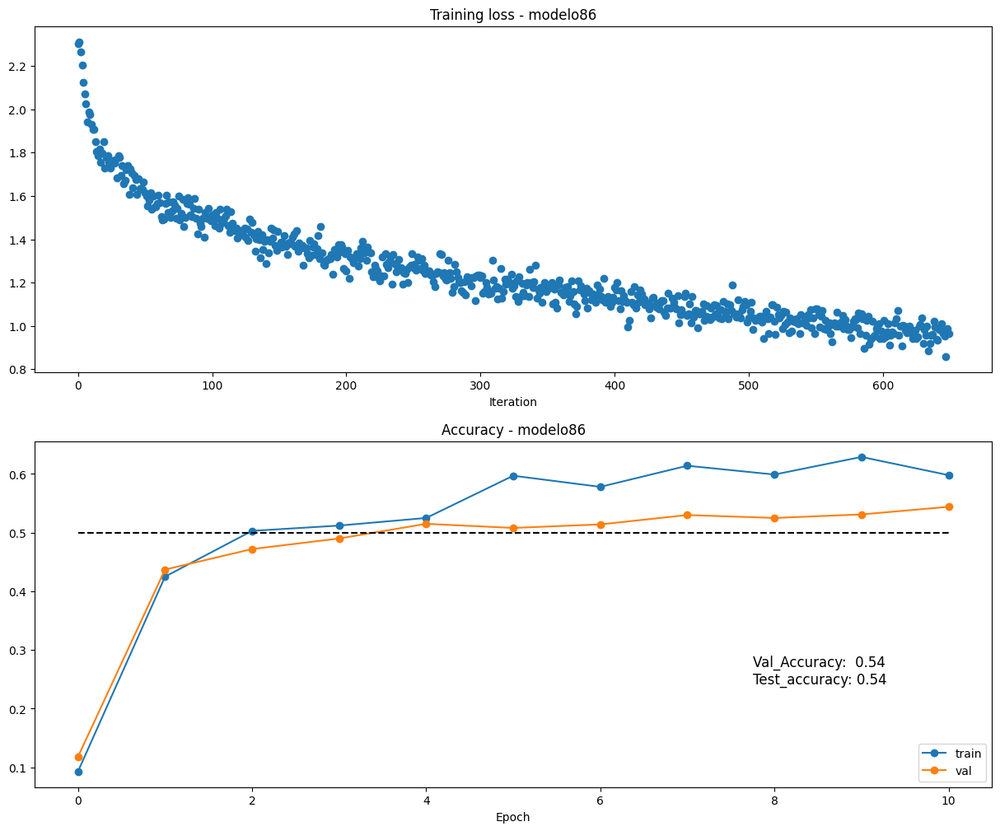


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo87 -------- best_val_acc: 0.531 -------- best_test_acc: 0.513
 

 Best Model: {'test_accuracy': 0.513, 'val_accuracy': 0.531, 'weight_scale': 0.045775438056229606, 'learning_rate': 0.04884487751120254, 'hidden_dims': [150, 150, 150, 150], 'update_rule': 'adam', 'batch_size': 750, 'batch_norm': True, 'dropout_p': 20, 'reg': 0.7748908206185688, 'Solver': <__main__.Solver object at 0x7b9786be4b80>} 



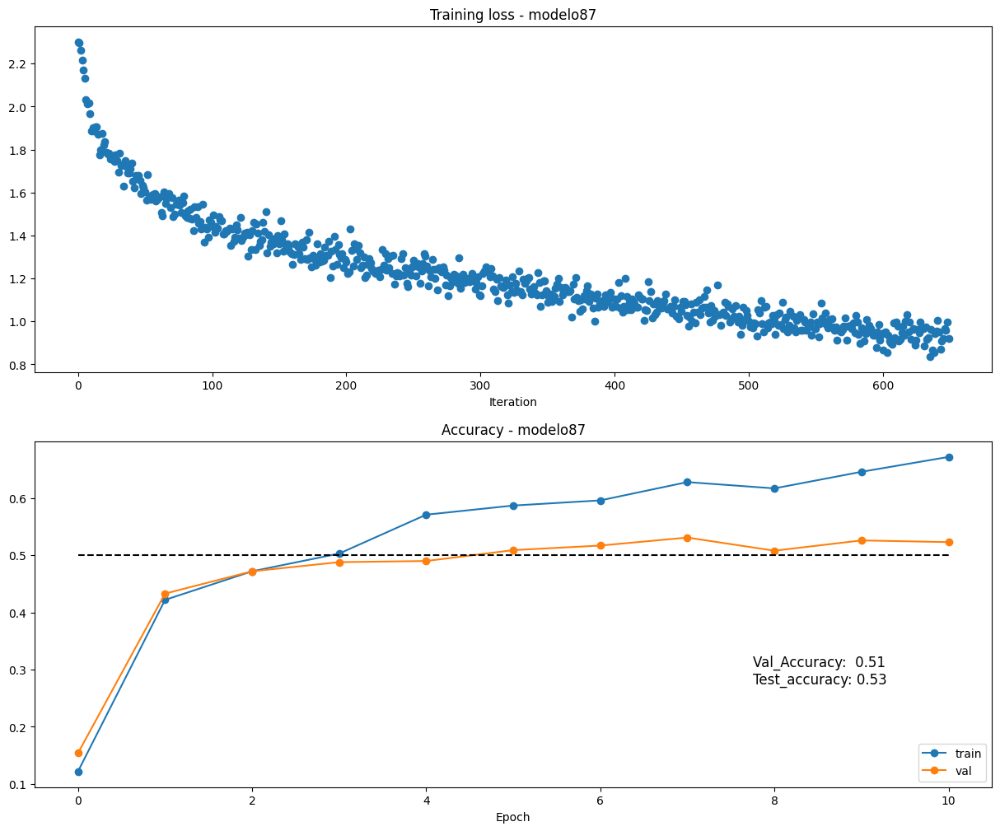


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo88 -------- best_val_acc: 0.534 -------- best_test_acc: 0.514
 

 Best Model: {'test_accuracy': 0.514, 'val_accuracy': 0.534, 'weight_scale': 0.012758946214388965, 'learning_rate': 0.08520363121167458, 'hidden_dims': [75, 75, 75, 75], 'update_rule': 'sgd_momentum', 'batch_size': 250, 'batch_norm': True, 'dropout_p': 10, 'reg': 0.9809507544332272, 'Solver': <__main__.Solver object at 0x7b9786fae080>} 



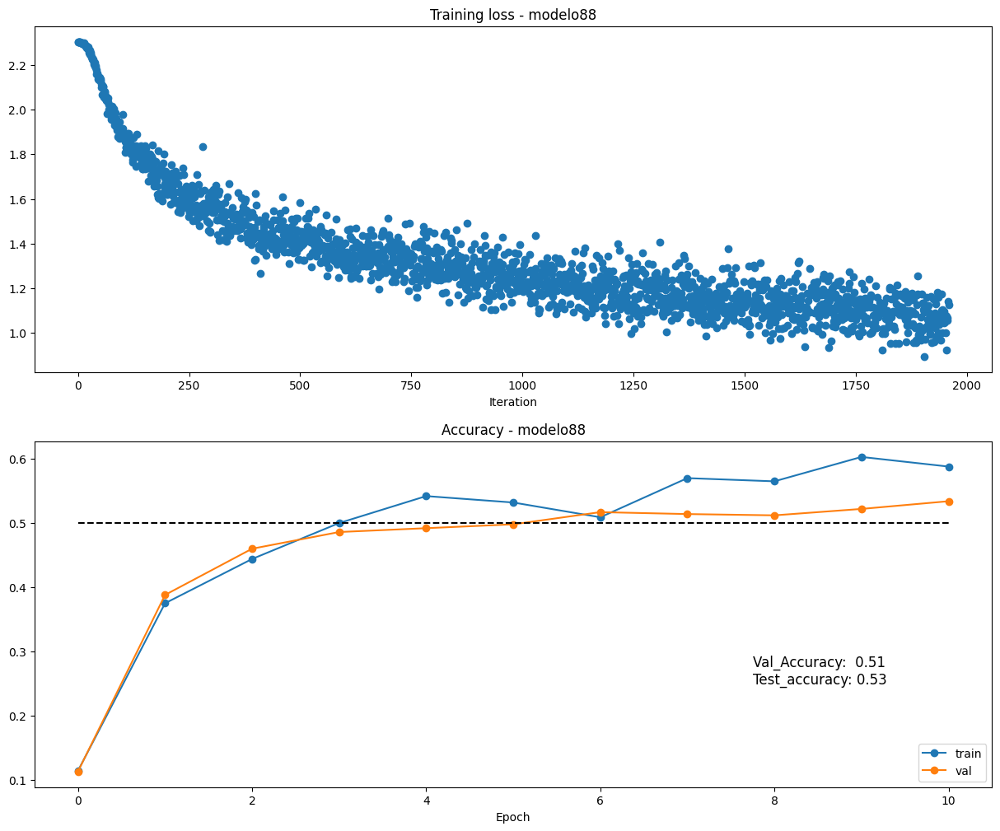


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo89 -------- best_val_acc: 0.528 -------- best_test_acc: 0.544
 

 Best Model: {'test_accuracy': 0.544, 'val_accuracy': 0.528, 'weight_scale': 0.019637645733641983, 'learning_rate': 0.06134637438911109, 'hidden_dims': [150, 150, 150, 150], 'update_rule': 'adam', 'batch_size': 750, 'batch_norm': True, 'dropout_p': 20, 'reg': 0.5494963382128285, 'Solver': <__main__.Solver object at 0x7b978652dc30>} 



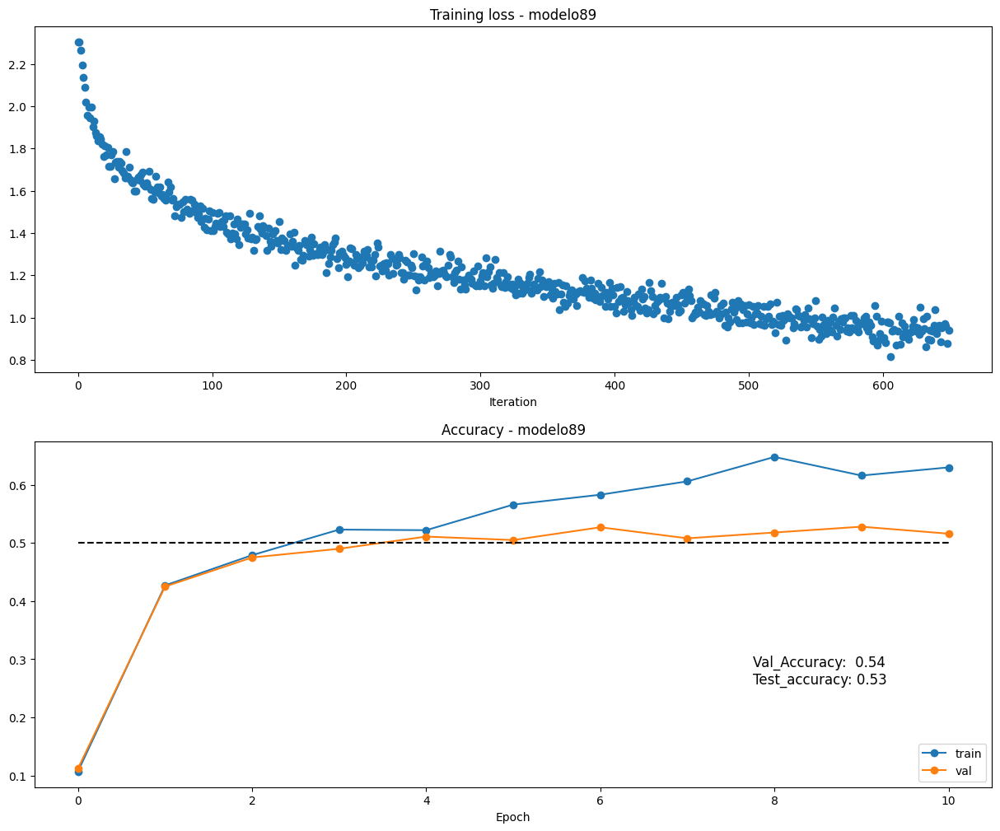


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo90 -------- best_val_acc: 0.498 -------- best_test_acc: 0.494
 

 Best Model: {'test_accuracy': 0.494, 'val_accuracy': 0.498, 'weight_scale': 0.040503823220476506, 'learning_rate': 0.08706615698335197, 'hidden_dims': [50, 50, 50, 50], 'update_rule': 'sgd', 'batch_size': 200, 'batch_norm': True, 'dropout_p': 0, 'reg': 0.7077522669982357, 'Solver': <__main__.Solver object at 0x7b9786f558d0>} 



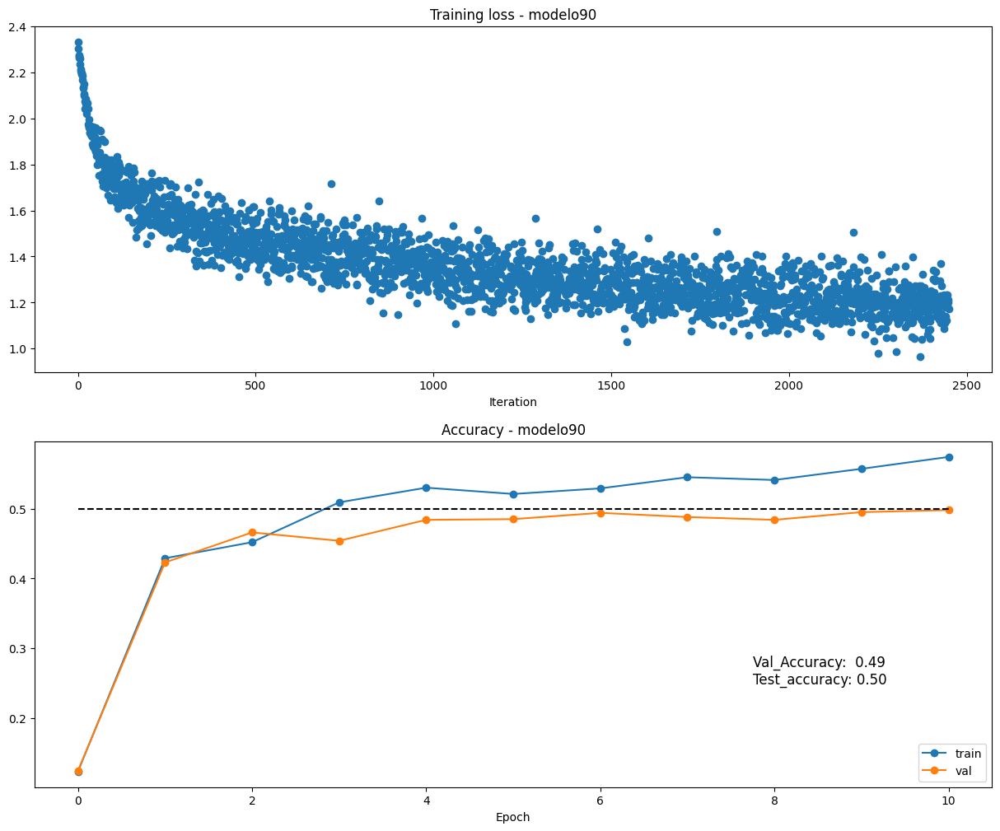


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo91 -------- best_val_acc: 0.517 -------- best_test_acc: 0.497
 

 Best Model: {'test_accuracy': 0.497, 'val_accuracy': 0.517, 'weight_scale': 0.042343824843236955, 'learning_rate': 0.05408843180125154, 'hidden_dims': [100, 100, 100, 100], 'update_rule': 'rmsprop', 'batch_size': 500, 'batch_norm': True, 'dropout_p': 15, 'reg': 0.657319681022744, 'Solver': <__main__.Solver object at 0x7b978fa4ca30>} 



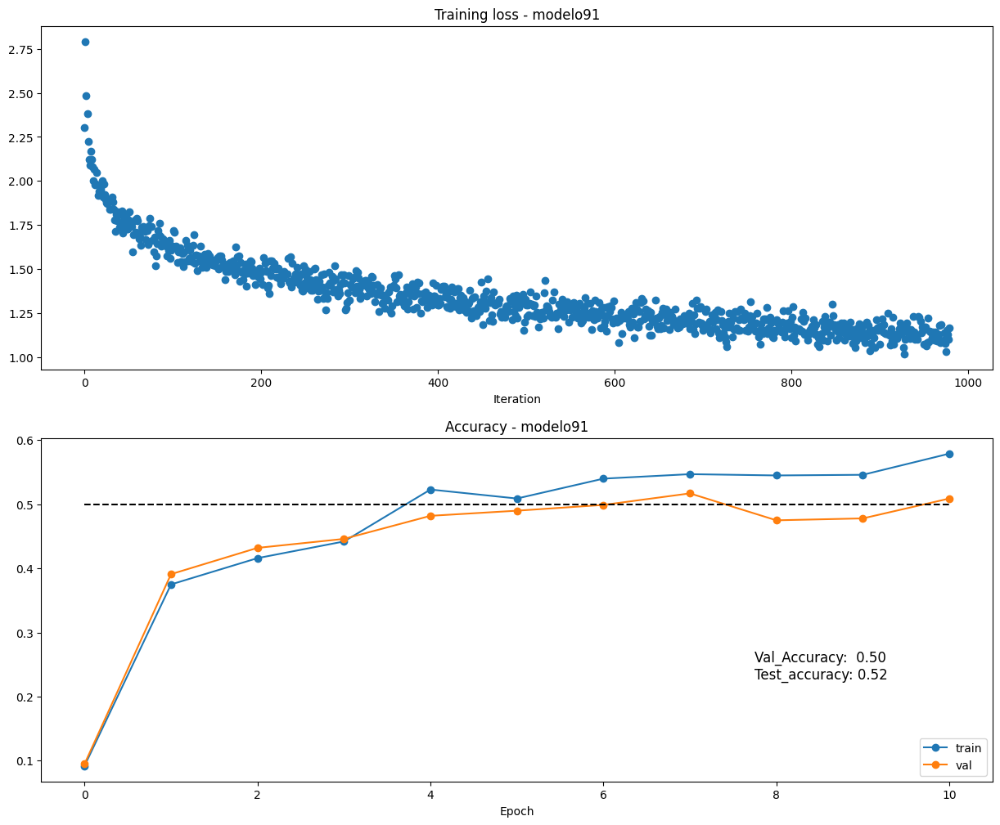


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo92 -------- best_val_acc: 0.513 -------- best_test_acc: 0.497
 

 Best Model: {'test_accuracy': 0.497, 'val_accuracy': 0.513, 'weight_scale': 0.04879130635681204, 'learning_rate': 0.06545429624717101, 'hidden_dims': [50, 50, 50, 50], 'update_rule': 'sgd', 'batch_size': 200, 'batch_norm': True, 'dropout_p': 0, 'reg': 0.8988391796232369, 'Solver': <__main__.Solver object at 0x7b978ce01ea0>} 



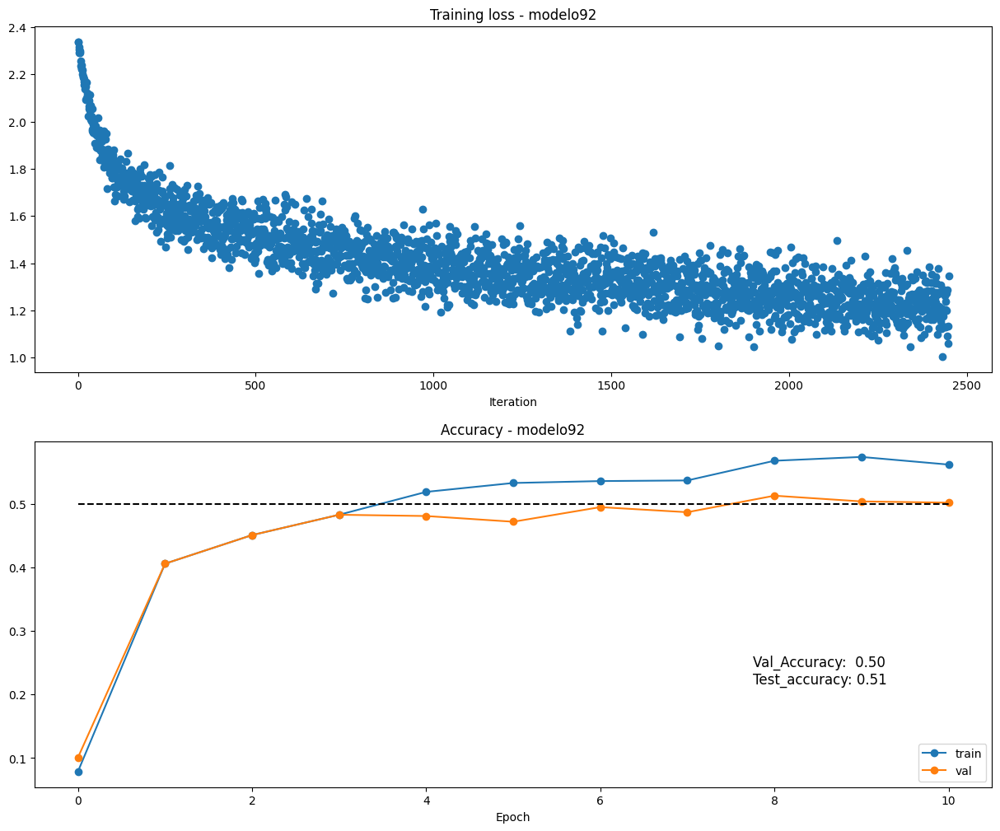


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo93 -------- best_val_acc: 0.5 -------- best_test_acc: 0.502
 

 Best Model: {'test_accuracy': 0.502, 'val_accuracy': 0.5, 'weight_scale': 0.0164816971156782, 'learning_rate': 0.08676251659562428, 'hidden_dims': [100, 100, 100, 100], 'update_rule': 'rmsprop', 'batch_size': 500, 'batch_norm': True, 'dropout_p': 15, 'reg': 0.5046558015126638, 'Solver': <__main__.Solver object at 0x7b9786d24ac0>} 



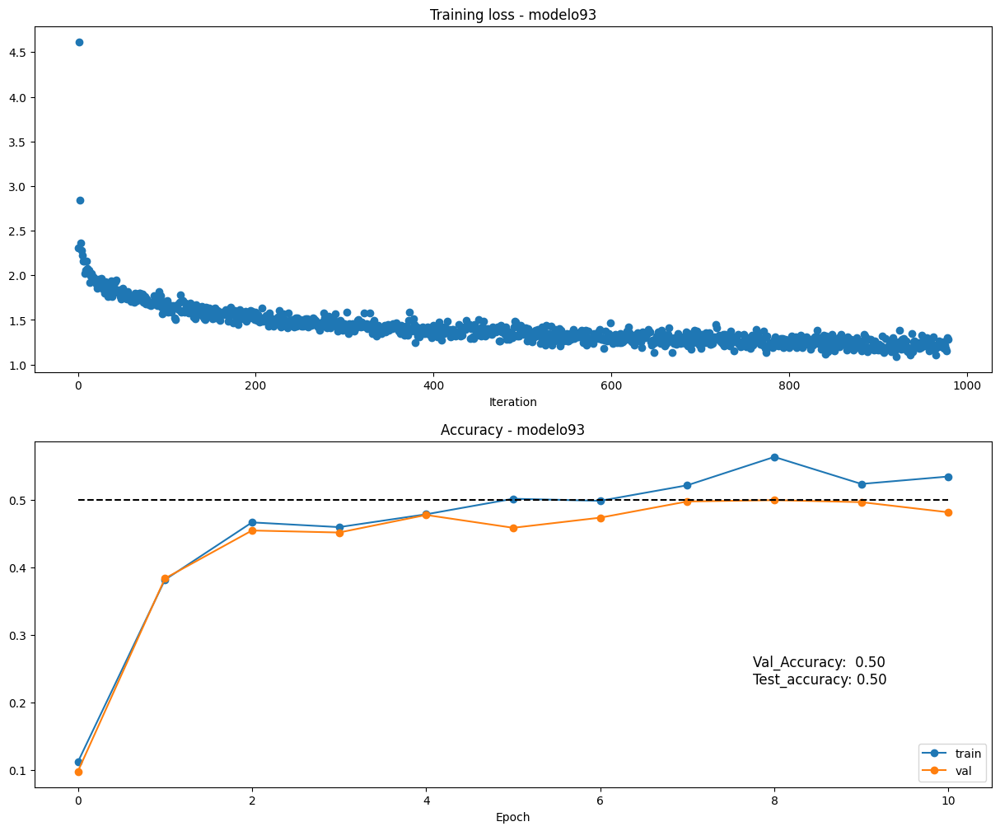


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo94 -------- best_val_acc: 0.54 -------- best_test_acc: 0.534
 

 Best Model: {'test_accuracy': 0.534, 'val_accuracy': 0.54, 'weight_scale': 0.026249275477522968, 'learning_rate': 0.02830029233291259, 'hidden_dims': [150, 150, 150, 150], 'update_rule': 'adam', 'batch_size': 750, 'batch_norm': True, 'dropout_p': 20, 'reg': 0.8620772377019875, 'Solver': <__main__.Solver object at 0x7b978c445030>} 



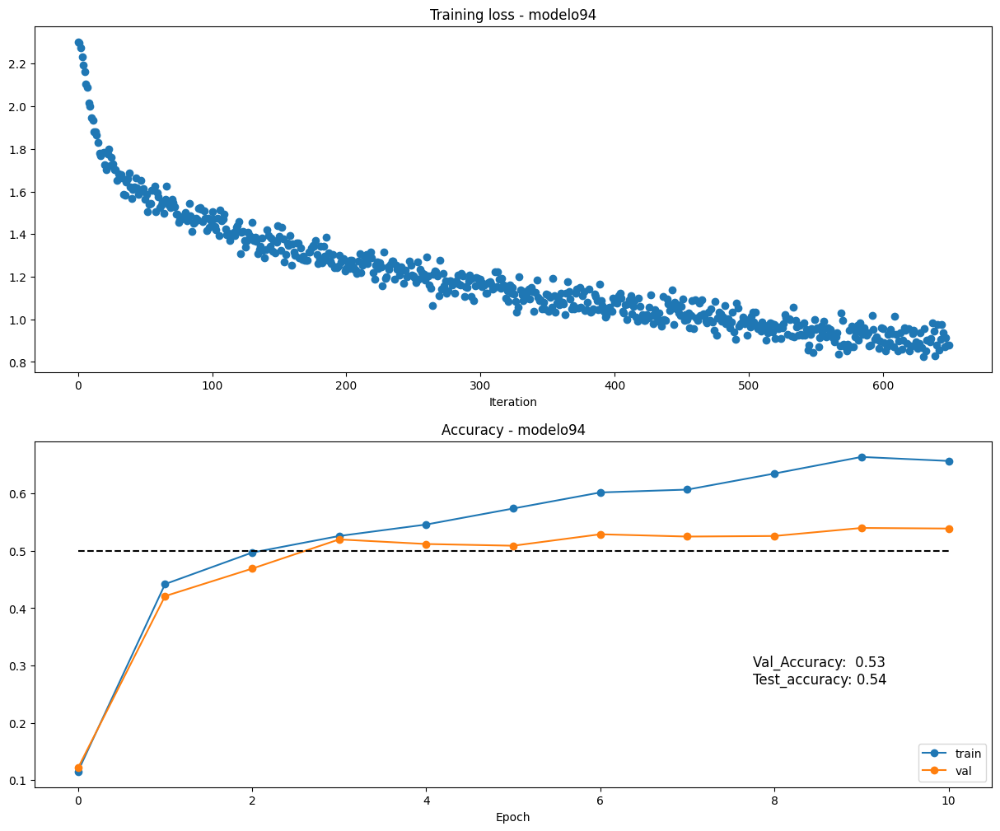


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo95 -------- best_val_acc: 0.505 -------- best_test_acc: 0.498
 

 Best Model: {'test_accuracy': 0.498, 'val_accuracy': 0.505, 'weight_scale': 0.030795246526211004, 'learning_rate': 0.084630082473731, 'hidden_dims': [100, 100, 100, 100], 'update_rule': 'rmsprop', 'batch_size': 500, 'batch_norm': True, 'dropout_p': 15, 'reg': 0.6104591201959586, 'Solver': <__main__.Solver object at 0x7b9786eb56c0>} 



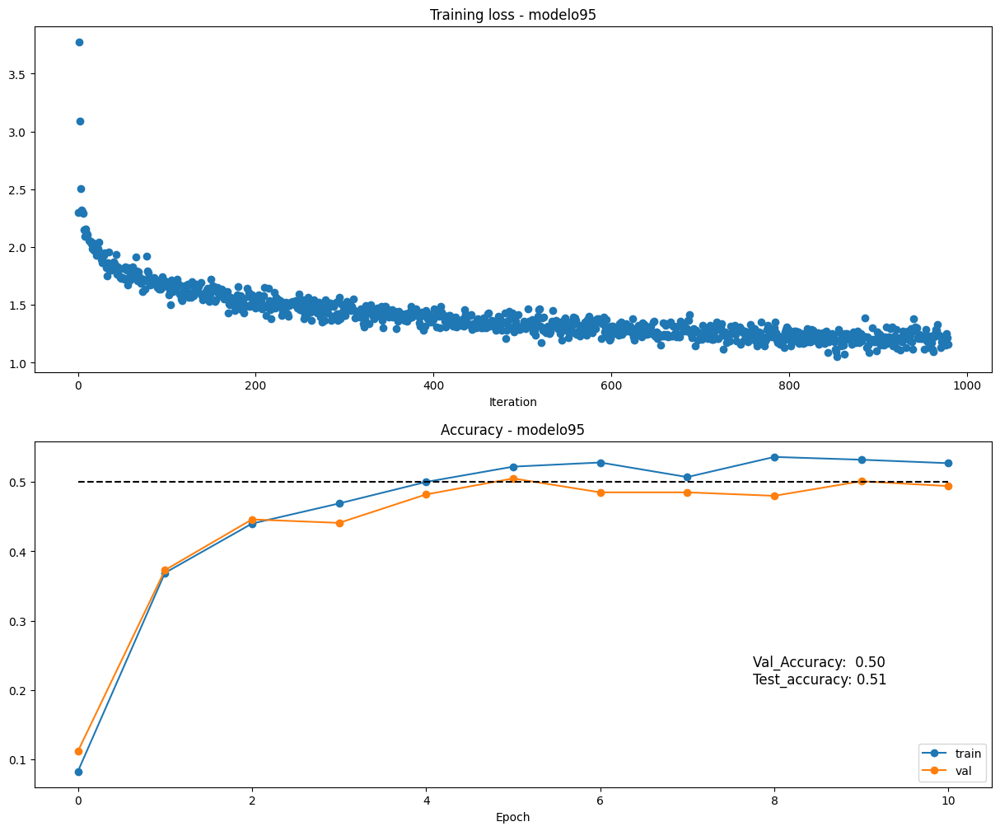


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo96 -------- best_val_acc: 0.496 -------- best_test_acc: 0.5
 

 Best Model: {'test_accuracy': 0.5, 'val_accuracy': 0.496, 'weight_scale': 0.013310804060950115, 'learning_rate': 0.011721735552267756, 'hidden_dims': [75, 75, 75, 75], 'update_rule': 'sgd_momentum', 'batch_size': 250, 'batch_norm': True, 'dropout_p': 10, 'reg': 0.5365584759359316, 'Solver': <__main__.Solver object at 0x7b9786566320>} 



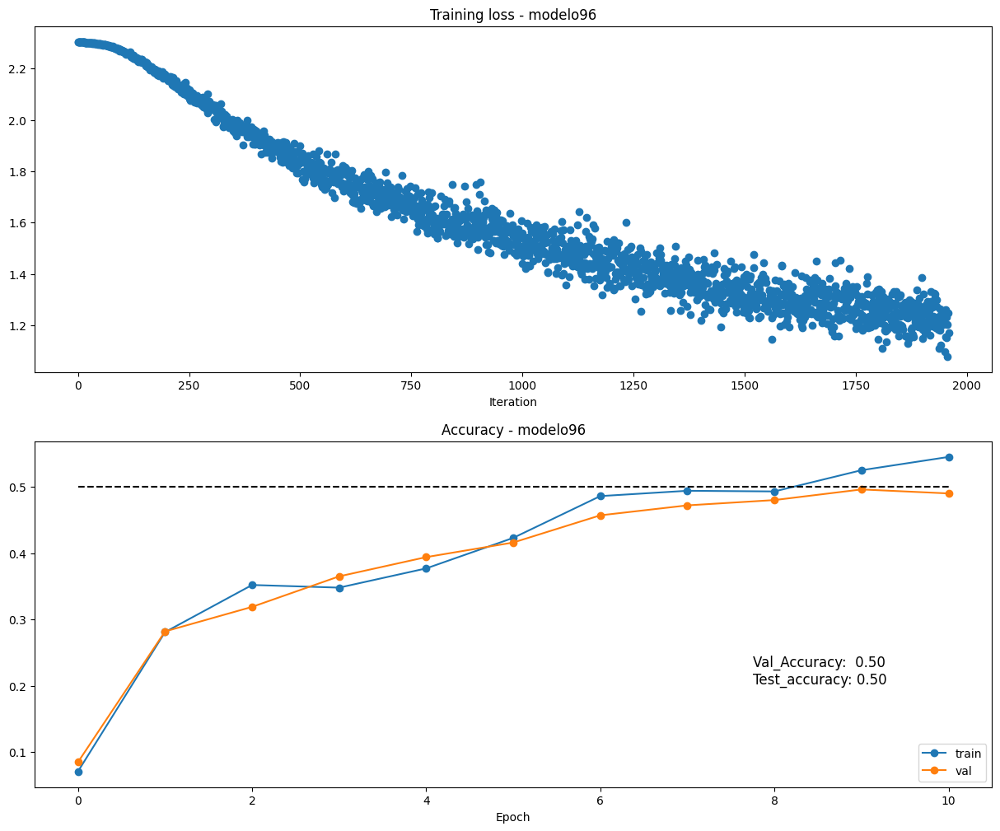


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo97 -------- best_val_acc: 0.551 -------- best_test_acc: 0.533
 

 Best Model: {'test_accuracy': 0.533, 'val_accuracy': 0.551, 'weight_scale': 0.022860745153947013, 'learning_rate': 0.025427901849255405, 'hidden_dims': [150, 150, 150, 150], 'update_rule': 'adam', 'batch_size': 750, 'batch_norm': True, 'dropout_p': 20, 'reg': 0.6636848532389528, 'Solver': <__main__.Solver object at 0x7b978c16d3f0>} 



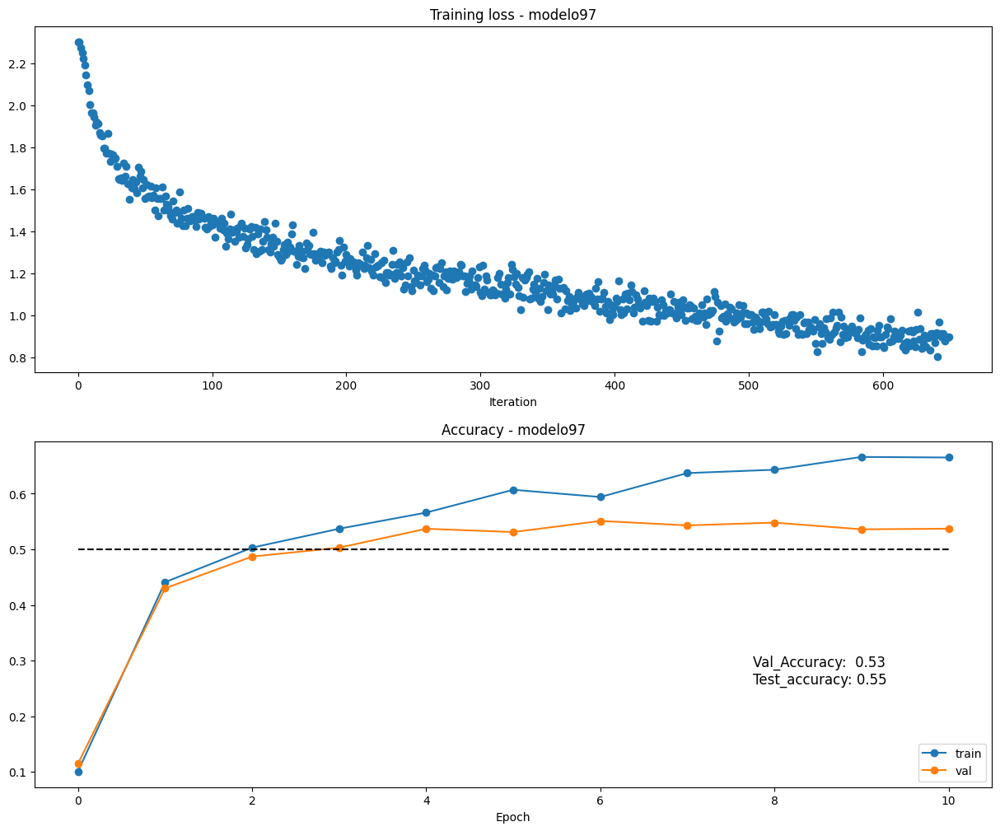


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo98 -------- best_val_acc: 0.526 -------- best_test_acc: 0.528
 

 Best Model: {'test_accuracy': 0.528, 'val_accuracy': 0.526, 'weight_scale': 0.0286436427406791, 'learning_rate': 0.09394533879692736, 'hidden_dims': [75, 75, 75, 75], 'update_rule': 'sgd_momentum', 'batch_size': 250, 'batch_norm': True, 'dropout_p': 10, 'reg': 0.9431278677421145, 'Solver': <__main__.Solver object at 0x7b978fa335b0>} 



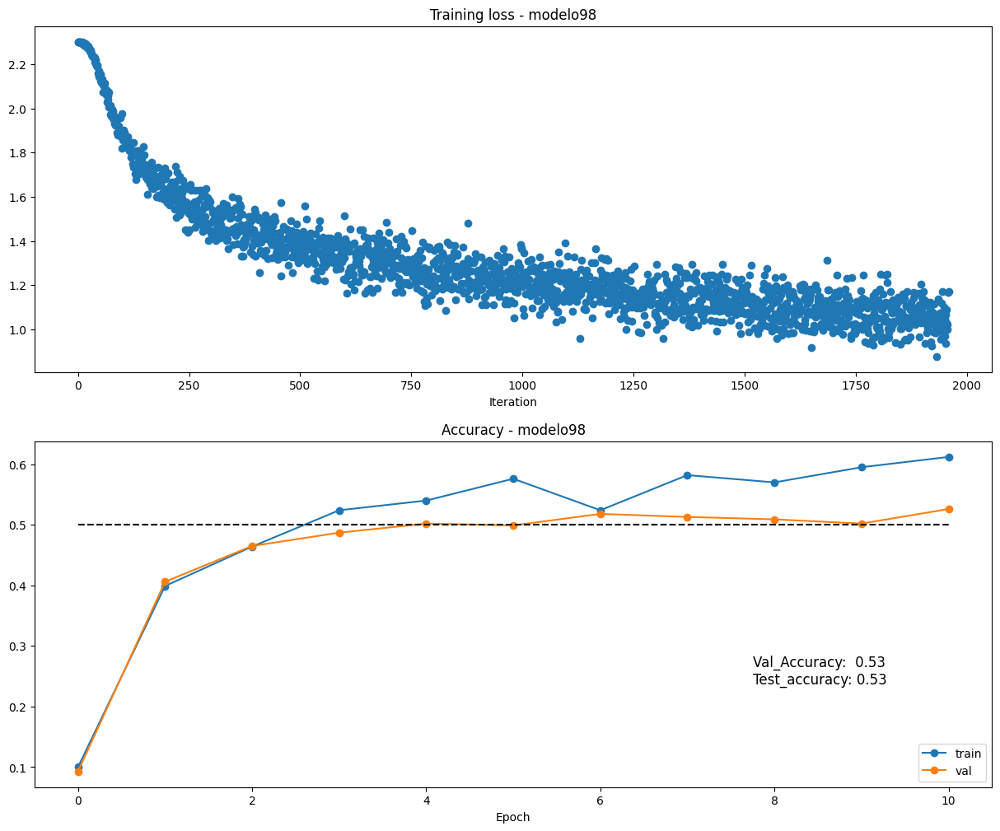


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo99 -------- best_val_acc: 0.539 -------- best_test_acc: 0.5
 

 Best Model: {'test_accuracy': 0.5, 'val_accuracy': 0.539, 'weight_scale': 0.030991659463101437, 'learning_rate': 0.05709783041523356, 'hidden_dims': [75, 75, 75, 75], 'update_rule': 'sgd_momentum', 'batch_size': 250, 'batch_norm': True, 'dropout_p': 10, 'reg': 0.7105678771288271, 'Solver': <__main__.Solver object at 0x7b9786f39b40>} 



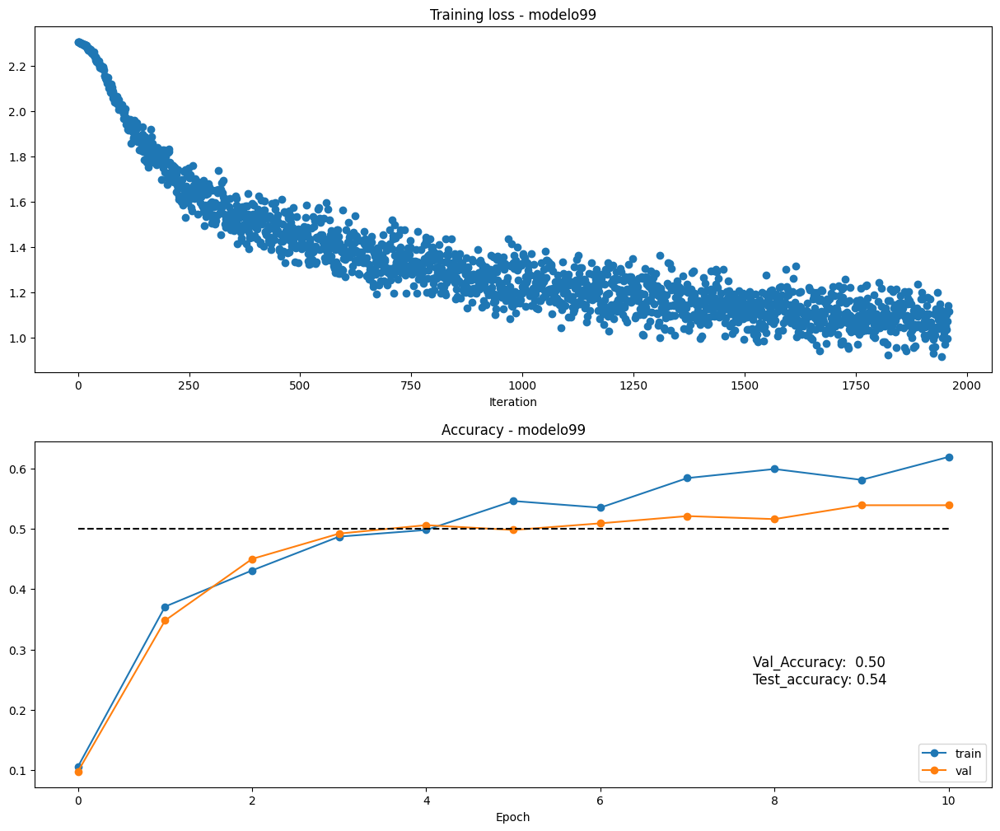


---------------------------------------------------------------------------------------------------------------------------
We use batchnorm here

 modelo: modelo100 -------- best_val_acc: 0.527 -------- best_test_acc: 0.529
 

 Best Model: {'test_accuracy': 0.529, 'val_accuracy': 0.527, 'weight_scale': 0.010508523692320733, 'learning_rate': 0.08456147436841194, 'hidden_dims': [75, 75, 75, 75], 'update_rule': 'sgd_momentum', 'batch_size': 250, 'batch_norm': True, 'dropout_p': 10, 'reg': 0.6145264908606425, 'Solver': <__main__.Solver object at 0x7b9786df9090>} 



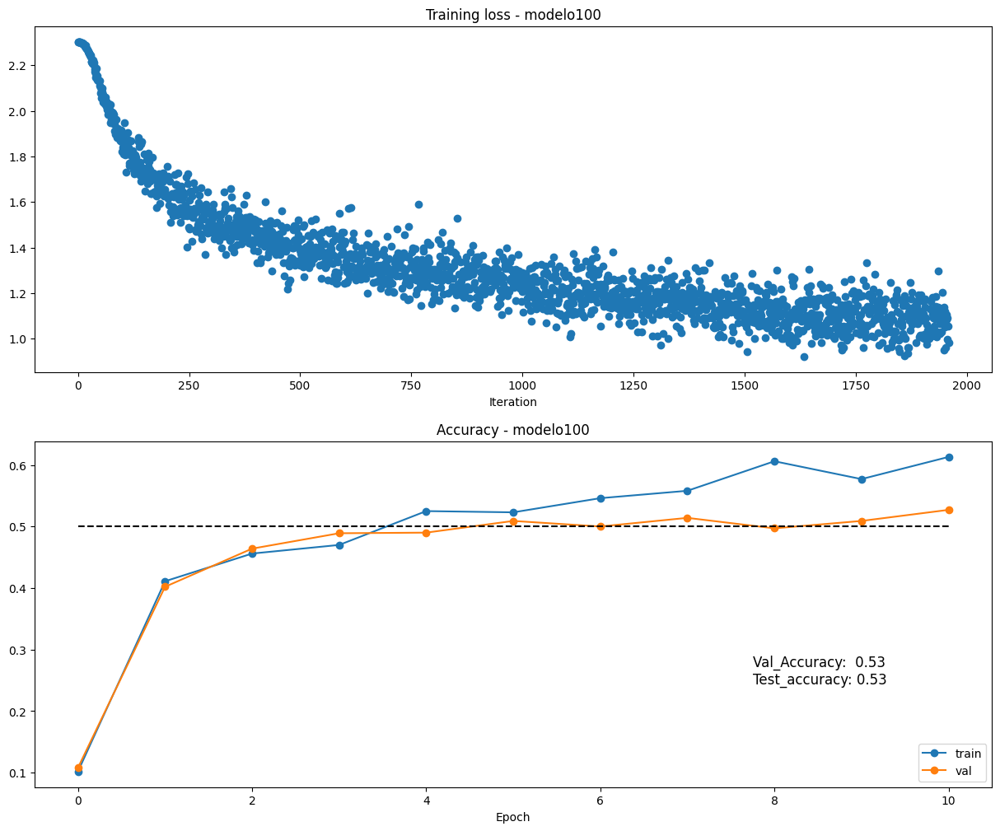


---------------------------------------------------------------------------------------------------------------------------
{'modelo_1': {'test_accuracy': 0.501, 'val_accuracy': 0.518, 'weight_scale': 0.028759204759008547, 'learning_rate': 0.044311730120203535, 'hidden_dims': [50, 50, 50, 50], 'update_rule': 'sgd', 'batch_size': 200, 'batch_norm': True, 'dropout_p': 0, 'reg': 0.67078766599908, 'Solver': <__main__.Solver object at 0x7b978ce04ca0>}, 'modelo_2': {'test_accuracy': 0.493, 'val_accuracy': 0.51, 'weight_scale': 0.01490638334489752, 'learning_rate': 0.012439996489425661, 'hidden_dims': [50, 50, 50, 50], 'update_rule': 'sgd', 'batch_size': 200, 'batch_norm': True, 'dropout_p': 0, 'reg': 0.6400577172754628, 'Solver': <__main__.Solver object at 0x7b978ce05d80>}, 'modelo_3': {'test_accuracy': 0.487, 'val_accuracy': 0.508, 'weight_scale': 0.025367118331105526, 'learning_rate': 0.0716850182275135, 'hidden_dims': [100, 100, 100, 100], 'update_rule': 'rmsprop', 'batch_size': 500, 'ba

In [ ]:
best_model = None
################################################################################
# TODO: Treinar o melhor modelo que você conseguir usando a classe             #
# FullyConnectedNet sobre a base de dados CIFAR-10. Você talvez ache útil usar #
# as técnicas de "batch normalization" e "dropout" para isso.                  #
# Ao final, você deve armazenar o melhor modelo na variável "best_model".      #
################################################################################


best_model={}
weight_scale_list = np.random.uniform(1e-2, 5e-2)
learning_rate_list = np.random.uniform(1e-1, 1e-2)
reg_list = np.random.uniform(0.5, 1)
hidden_layers = [[50,50,50,50],[75,75,75,75], [100,100,100,100], [150,150,150,150]]
update_rule_list=['sgd','sgd_momentum','rmsprop','adam']
batch_size_list= [200, 250, 500, 750]
# #batch_norm_list= [False, True]
# batch_norm_list= [True]
dropout_list= [0, 10, 15, 20]
i = 0

for m in range(100):
  n = np.random.randint(0, 4)
  weight_scale = np.random.uniform(1e-2, 5e-2)
  learning_rate = np.random.uniform(1e-1, 1e-2)
  hidden_dims = hidden_layers[n]
  update_rule = update_rule_list[n]
  batch_size = batch_size_list[n]
  dropout_p = dropout_list[n]
  reg = np.random.uniform(0.5, 1)

  model= FullyConnectedNet(hidden_dims= hidden_dims,
                           dropout= dropout_p,
                           weight_scale=  weight_scale,
                           use_batchnorm= True)

  solver = Solver(model,
                  data,
                  print_every= 100,
                  num_epochs=10,
                  batch_size= batch_size,
                  update_rule= update_rule,
                  optim_config={'learning_rate': learning_rate},
                  verbose= False)

  solver.train()

  model_eval = model
  y_test_pred = np.argmax(model_eval.loss(data['X_test']), axis=1)
  y_test_pred = (y_test_pred == data['y_test']).mean()


  i = i + 1
  print(f'\n modelo: modelo{i} -------- best_val_acc: {max(solver.val_acc_history)} -------- best_test_acc: {y_test_pred}\n ')

  params = {}
  params['test_accuracy'] = y_test_pred
  params['val_accuracy'] = max(solver.val_acc_history)
  params['weight_scale'] = weight_scale
  params['learning_rate'] = learning_rate
  params['hidden_dims'] = hidden_dims
  params['update_rule'] = update_rule
  params['batch_size'] = batch_size
  params['batch_norm'] = True
  params['dropout_p'] = dropout_p
  params['reg'] = reg
  params['Solver'] = solver
  best_model[f'modelo_{i}']= params

  print(f'\n Best Model: {params} \n')

  # Execute esta célula para visualizar a perda durante o treinamento e a acurácia
  # tanto sobre o conjunto de treinamento quanto sobre o conjunto de validação.

  plt.subplot(2, 1, 1)
  plt.title(f'Training loss - modelo{i}')
  plt.plot(solver.loss_history, 'o')
  plt.xlabel('Iteration')

  plt.subplot(2, 1, 2)
  plt.title(f'Accuracy - modelo{i}')
  plt.plot(solver.train_acc_history, '-o', label='train')
  plt.plot(solver.val_acc_history, '-o', label='val')
  plt.plot([0.5] * len(solver.val_acc_history), 'k--')
  plt.xlabel('Epoch')
  plt.legend(loc='lower right')
  plt.annotate(f'Val_Accuracy: {y_test_pred: .2f}', xy=(0.75, 0.35), xycoords='axes fraction', fontsize=12)
  plt.annotate(f'Test_accuracy: {max(solver.val_acc_history):.2f}', xy=(0.75, 0.30), xycoords='axes fraction', fontsize=12)
  plt.gcf().set_size_inches(15, 12)
  plt.show()
  print(f'\n---------------------------------------------------------------------------------------------------------------------------')
print(best_model)
################################################################################
#                             FIM DE SEU CÓDIGO                                #
################################################################################

# Testar seu modelo

Executar o melhor modelo obtido anteriormente sobre os conjuntos de validação e de teste.
Você deve ter alcançado um resultado acima de 50% de acurácia sobre o conjunto de validação.

In [ ]:
test_acc = []
val_acc = []
test_acc_idx = []
val_acc_idx= []

for i in range(100):
  modelo = 'modelo_' + str((i + 1))
  test_acc.append(best_model[modelo]['test_accuracy'])
  val_acc.append(best_model[modelo]['val_accuracy'])

for i in range(100):
  modelo = 'modelo_' + str((i + 1))
  if test_acc[i] == max(test_acc):
     model_best_test_acc = modelo
  if val_acc[i] == max(val_acc):
   model_best_val_acc = modelo

print(f'Modelo de melhor acurácia de teste: {model_best_test_acc} \n{best_model[model_best_test_acc]}\n')
print(f'\n Modelo de melhor acurácia de validação: {model_best_val_acc} \n{best_model[model_best_val_acc]}\n')


Modelo de melhor acurácia de teste: modelo_32 
{'test_accuracy': 0.557, 'val_accuracy': 0.541, 'weight_scale': 0.040965188249530826, 'learning_rate': 0.04682587464591875, 'hidden_dims': [150, 150, 150, 150], 'update_rule': 'adam', 'batch_size': 750, 'batch_norm': True, 'dropout_p': 20, 'reg': 0.5502072057005123, 'Solver': <__main__.Solver object at 0x7b9786f309a0>}


 Modelo de melhor acurácia de validação: modelo_27 
{'test_accuracy': 0.545, 'val_accuracy': 0.554, 'weight_scale': 0.03628310796515551, 'learning_rate': 0.014963784077532447, 'hidden_dims': [150, 150, 150, 150], 'update_rule': 'adam', 'batch_size': 750, 'batch_norm': True, 'dropout_p': 20, 'reg': 0.9136099107864678, 'Solver': <__main__.Solver object at 0x7b97869f96c0>}

